# Построение регрессии для параметра gamma
# для клеточной линии S2
### Михаль Розенвальд
13.05.20

## Данные:

**Объекты** - bins - отрезки хромосомы длина 20 000

id: chrN_start_coordinate

8430

5950 - отобранных объектов с ненулевым значений целевой переменной.

**Признаки** - эпигенетика 

*исходный файл*: "S2-DRSC.merged.binned.txt"

5950 rows


**Целевая переменная** - гамма - значение параметра

*исходный файл*: "S2_20K.flG.foundG.txt"

Значения от 0 до 10 - не расбалансировано


В этом файле:

1. data - Данные о признаках объектов - ChipSeq
2. data_scaled - Нормализация признаков - вычитаем среднее и делим на дисперсию 
3. Визуализация признаков
4. target - целевая переменная
5. findEmptyChr(), cleanDataTarget() -- отчищение данных от нулевых хромосом с отсутствующим параметром гамма
6. data_scaled_clean, target_clean - обработанные данные
7. Линейная регрессия
8. Линейная регрессия с L2 регуляризацией - Rige
9. Линейная регрессия с L1 регуляризацией - Lasso
10. Решаюшие леса


Для оценки качества использовалась класс-валидация на 5 Folds.

Рассматриваются коэффиценты моделей для выделения "значимых" признаков.

In [2]:
! ls     ../../data/epigenetics/

s2_kc_bg_scaled_18_features.csv
s2_kc_bg_scaled_18_features_2901.csv
s2_kc_bg_scaled_34_overlap_features_2901.csv


In [3]:
bioset =  None  # take all data when bioset == None
# Selecting subset of features:
# bioset = ['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac']

cell_line = 'is_bg' #'is_s2' #  'all' #  'is_bg' # 'all' # 'is_s2' # cell_line one of: 'is_s2', 'is_kc', 'is_bg',  or 'all'


data_features_path = '../../data/epigenetics/s2_kc_bg_scaled_18_features.csv'
target_path = "../../data/target/s2_kc_bg_clean_gamma_2901.csv"

In [4]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, KFold
from sklearn import linear_model, preprocessing, ensemble

In [5]:
results_pd = pd.DataFrame(columns=['model_name', 'wMSE_test_mean', 'wMSE_test_std', 
                                   'wMSE_train_mean', 'wMSE_train_std', 'comments', 'params',
                                   'MSE_test_mean', 'MSE_test_std', 'MSE_train_mean', 'MSE_train_std', 
                                   'r2_test', 'n_splits', 'model'])
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model


In [6]:
res_dict = {
    'model_name': 'test_model',
    'wMSE_test_mean': 160, 
    'wMSE_test_std': 1, 
    'wMSE_train_mean': 16, 
    'wMSE_train_std': 3,
    'comments': 'no coms', 
    'params': 'test_params = testtest',
}


# Data

In [7]:
su_drsc = pd.read_csv(data_features_path, index_col=0)
su_drsc.head()

,is_s2,is_kc,is_bg,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,...,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1,0,0,chr2L,0,0.242773,-0.187138,-0.015891,0.059491,0.189992,...,0.050970,-0.001048,0.202823,-0.016338,0.054507,0.124710,-0.008189,0.596746,-0.206230,0.496281
1,1,0,0,chr2L,20000,0.048761,0.025261,-0.331142,-0.058042,0.410915,...,0.183057,0.392984,0.754869,-0.261296,-0.245977,0.597867,-0.241132,-0.201980,-0.373747,-0.075792
2,1,0,0,chr2L,40000,-0.180974,0.113429,-0.199996,-0.083374,0.109929,...,0.149762,-0.051553,-0.089343,-0.173464,-0.320367,0.580357,-0.245850,-0.311737,-0.349173,-0.012810
3,1,0,0,chr2L,60000,0.110472,0.124802,0.041301,0.246241,0.374247,...,0.447890,-0.199223,-0.114387,0.345721,0.238762,-0.400088,-0.134613,0.541448,0.261649,0.285790
4,1,0,0,chr2L,80000,0.085216,-0.114072,-0.317669,0.051119,-0.095739,...,-0.207146,-0.176570,-0.075462,0.183040,0.210215,-0.467417,0.338950,0.624765,0.140050,0.197589


In [8]:
su_drsc.shape

(17850, 23)

# Select features from the bioset

In [9]:
if bioset:
    su_drsc = su_drsc[bioset]
su_drsc.shape

(17850, 23)

In [10]:
su_drsc

,is_s2,is_kc,is_bg,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,...,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1,0,0,chr2L,0,0.242773,-0.187138,-0.015891,0.059491,0.189992,...,0.050970,-0.001048,0.202823,-0.016338,0.054507,0.124710,-0.008189,0.596746,-0.206230,0.496281
1,1,0,0,chr2L,20000,0.048761,0.025261,-0.331142,-0.058042,0.410915,...,0.183057,0.392984,0.754869,-0.261296,-0.245977,0.597867,-0.241132,-0.201980,-0.373747,-0.075792
2,1,0,0,chr2L,40000,-0.180974,0.113429,-0.199996,-0.083374,0.109929,...,0.149762,-0.051553,-0.089343,-0.173464,-0.320367,0.580357,-0.245850,-0.311737,-0.349173,-0.012810
3,1,0,0,chr2L,60000,0.110472,0.124802,0.041301,0.246241,0.374247,...,0.447890,-0.199223,-0.114387,0.345721,0.238762,-0.400088,-0.134613,0.541448,0.261649,0.285790
4,1,0,0,chr2L,80000,0.085216,-0.114072,-0.317669,0.051119,-0.095739,...,-0.207146,-0.176570,-0.075462,0.183040,0.210215,-0.467417,0.338950,0.624765,0.140050,0.197589
5,1,0,0,chr2L,100000,0.636797,-0.016064,-0.176933,0.642229,0.169217,...,0.793614,0.013334,-0.054968,0.347064,0.277017,-0.594765,-0.135938,0.991271,0.406406,0.343639
6,1,0,0,chr2L,120000,0.074764,-0.025722,0.146668,0.048932,0.215753,...,0.437237,-0.024372,-0.148438,0.804194,0.274420,-0.424139,0.622100,0.110407,0.529529,0.388954
7,1,0,0,chr2L,140000,0.496702,-0.175458,-0.251325,0.267109,0.027396,...,0.958440,0.170127,0.079376,0.110805,0.243425,-0.251428,0.181630,0.465191,0.312836,0.156772
8,1,0,0,chr2L,160000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,1,0,0,chr2L,180000,-0.101164,-0.047332,-0.293452,-0.091075,-0.128476,...,-0.071135,-0.229773,0.035580,-0.077755,0.356843,-0.311976,0.197046,0.869773,0.148801,-0.178991


# Target data

In [11]:
gamma_S2 = pd.read_csv(target_path, header=0, index_col=0) #None,  names=["chrN","start_coord", "gamma" ]) 
print(gamma_S2.shape)
gamma_S2.head()

(17850, 6)


,is_s2,is_kc,is_bg,chrN,start_coord,gamma
0,1,0,0,chr2L,0,0.00
1,1,0,0,chr2L,20000,3.42
2,1,0,0,chr2L,40000,3.42
3,1,0,0,chr2L,60000,1.33
4,1,0,0,chr2L,80000,1.31


# Select cell line

In [12]:
if cell_line != 'all':
    su_drsc = su_drsc[su_drsc[cell_line] == 1]
    su_drsc = su_drsc.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    su_drsc.index = np.arange(su_drsc.shape[0])

    gamma_S2 = gamma_S2[gamma_S2[cell_line] == 1]
    gamma_S2 = gamma_S2.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    gamma_S2.index = np.arange(gamma_S2.shape[0])

    
su_drsc.shape, gamma_S2.shape

((5950, 20), (5950, 3))

In [13]:
su_drsc.head()

,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,chr2L,0,0.544921,-0.033987,-0.155270,0.037923,0.058893,0.117200,0.721370,0.619560,0.323141,-0.395191,0.192101,-0.157889,-0.082055,0.192494,0.221229,0.705173,0.723685,0.706801
1,chr2L,20000,-0.116934,-0.039030,-0.290166,-0.113270,0.068570,-0.186663,-0.090781,-0.385741,-0.244058,-0.329997,0.054217,-0.185119,-0.381055,0.902947,-0.170493,-0.535787,-0.436235,-0.114916
2,chr2L,40000,-0.133030,0.013177,-0.088449,-0.047144,-0.103980,0.079836,0.040900,-0.344013,-0.235264,-0.474280,-0.269152,-0.039723,-0.261687,0.589267,-0.057221,-0.406465,-0.364127,-0.166814
3,chr2L,60000,0.374132,0.092348,0.227393,0.187527,0.260029,0.418315,0.374343,0.633148,0.526842,-0.602374,-0.551526,0.508636,0.046366,0.025409,-0.182071,0.568039,0.503599,0.399566
4,chr2L,80000,0.256424,-0.005244,-0.184509,0.154272,-0.155283,-0.086542,0.529589,0.119485,0.114046,-0.568970,-0.599676,0.134285,0.133840,-0.098481,0.246859,0.622667,0.468404,0.296180


In [14]:
gamma_S2.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


# Util Functions

In [15]:
def print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const):
    print('wMSE_train', np.round(np.mean(weighted_mse_train_all), 
                            decimals=2))
    print('wMSE_test', np.round(np.mean(weighted_mse_test_all), 
                          decimals=2))
    
    print('MSE_train', np.round(np.mean(MSE_train), decimals=2))
    print('MSE_test',np.round(np.mean(MSE_test), decimals=2))
    
    
    print('MAE_train', np.round(np.mean(mae_train), decimals=2))
    print('MAE_test',np.round(np.mean(mae_test), decimals=2))

    print('r2_test',np.round(np.mean(r2_test), decimals=2))

def plotData(data, ncols, nrows, method = 'hist', is_sharex=True, share_axes='y', bins=50, 
             plt_title='Histograms of data features', figsize=(20, 18), 
             cmin=None, cmax=None, min_val=None, max_val=None,
             verbose=False, fig=None, axes=None, alpha=0.6):
    if (min_val is None or  max_val is None):
        min_val, max_val = min(np.min(data)) - 3, max(np.max(data))
    if (fig is None or axes is None):
        if (share_axes == 'xy'):
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize, 
                                     sharex='all', sharey='all')
        else:
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize,
                                     sharex=is_sharex)
    fig.set_figheight(24)
    i = 0
    for row in range(nrows):
        if i >= len(data.columns):
                break      
        for col in range(ncols):
            if i >= len(data.columns):
                break
            axes[row][col].set_title(data.columns[i], fontsize=22)       
            if method == "hist":
                if (cmin is not None and  cmax is not None):
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, range=(cmin, cmax), alpha=0.6, label=plt_title) # cmin=cmin, cmax=cmax)
                else:
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, alpha=alpha, label=plt_title) # cmin=cmin, cmax=cmax)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_xlim(min_val, max_val)
                
            elif method == "original":
                axes[row][col].scatter(np.arange(0, data.shape[0]), data[[data.columns[i]]].values,)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_ylim(min_val, max_val)
                    
            if verbose:
                print(i)   
                print(data[[data.columns[i]]].mean(), data[[data.columns[i]]].std(), data[[data.columns[i]]].min(), data[[data.columns[i]]].max())
            i += 1
    plt.suptitle(plt_title, fontsize=30, y=0.92)
    # return fig, axes   



In [16]:
# find empty chromosoms: 
def findEmptyChr(data, print_info=True):
    print(data.head())

    chr_names = np.unique(data['chrN'])
    empty_chr_names = []
    num_empty_bins = 0

    for chr_i in chr_names:
        gamma_sum = sum(data[data.chrN == chr_i].gamma)
        if (print_info):
            print("---\nChr name =", chr_i)
            print("Sum of gamma values =", gamma_sum)
            print("Number of bins =", len(data[data.chrN == chr_i]))

        if (gamma_sum == 0):
            empty_chr_names.append(chr_i)
            num_empty_bins += len(data[data.chrN == chr_i])
        
    print("===")
    print("Total num of chr =", len(chr_names), "\n", chr_names)

    print("Num of empty chr =", len(empty_chr_names), "\n", empty_chr_names)

    print("Total num of chr =", len(data.index))
    print("Num of empty bins =", num_empty_bins)
    
    return(empty_chr_names, num_empty_bins)

def cleanDataTarget(data, target, print_info=True):
    ''' Remove empty (zeros) chromosomes from data and target '''
    
    empty_chr_names, num_empty_bins = findEmptyChr(target, print_info)
    return (data[~target.chrN.isin(empty_chr_names)], target[~target.chrN.isin(empty_chr_names)], empty_chr_names, num_empty_bins)


# print(sum(target[target.chrN.isin(empty_chr_names)].gamma))  # selected zero chr sum
# print(sum(target[~target.chrN.isin(empty_chr_names)].gamma))  # total sum

# target[~target.chrN.isin(empty_chr_names)]


# K-fold cross Validation

In [17]:
def train_test_KFold(X, y, model, model_name, results_pd, n_splits=10, random_state=16, shuffle=True):
    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []
    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Train the model using the training sets
        model.fit(X_train, y_train)

        # Make predictions using the train set
        y_pred_train = model.predict(X_train)

        # Make predictions using the testing set
        y_pred = model.predict(X_test)

        MSE_train.append(mean_squared_error(y_train, y_pred_train))
        MSE_test.append(mean_squared_error(y_test, y_pred))
        r2_test.append(r2_score(y_test, y_pred))

        coefs.append(model.coef_)
        coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train, 
                                                                          y_test, 
                                                                          model)
            
        weighted_mse_test_all.append(weighted_mse_test)
        weighted_mse_train_all.append(weighted_mse_train)

    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)

    coefs = np.array(coefs)
    coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all),
          "\n MSE mean train:", np.mean(MSE_train), "\n")

    # The mean squared error
    print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), 
          "\n MSE mean test: " , np.mean(MSE_test), "\n")

    # The mean squared error
    print("Root of MSE on Test: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), 
          "\n", np.sqrt(np.mean(MSE_test)), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), 
          "\n r2_test:" , np.mean(r2_test), "\n")
    
    print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

    coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
    print(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]])
    
    res_dict = {
        'model_name': model_name,
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

    results_pd = results_pd.append(res_dict, ignore_index=True)
    results_pd
    
    return model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, results_pd

# wieghted MSE

In [18]:
def cout_errors_lin(X_train,  X_test, y_train, y_test, model):
    x_train,  x_test = X_train,  X_test
    # y_train, y_test = y_train.values, y_test.values

    # ------------PREDICTION-------------------------------------------------------------

    y_pred_test = model.predict(x_test)
    y_pred_train = model.predict(x_train)
    # y_pred_val = model.predict(x_val)

    # -------------------------------------------------------------------------

    #          TEST PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TEST PREDICTION Error")
    weighted_mse_test = weighted_mse_cout(y_true = y_test, y_pred = y_pred_test)
    rmse_test = rmse_cout(y_true = y_test, y_pred = y_pred_test)
    mae_test = mae_cout(y_true = y_test, y_pred = y_pred_test)
    print("weighted_mse_test:", weighted_mse_test, "\n\n")

    # -------------------------------------------------------------------------

    #          TRAIN PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TRAIN PREDICTION Error")
    weighted_mse_train = weighted_mse_cout(y_true = y_train, y_pred = y_pred_train)
    rmse_train = rmse_cout(y_true = y_train, y_pred = y_pred_train)
    mae_train = mae_cout(y_true = y_train, y_pred = y_pred_train)

    print("weighted_mse_train:", weighted_mse_train, "\n\n")

    # -------------------------------------------------------------------------

    #          VAL PREDICTION Error
    # -------------------------------------------------------------------------

    # # ! Count Error !
    # print(" VAL PREDICTION Error" )

    # rmse_val = rmse_cout(y_true = y_val, y_pred = y_pred_val)
    # weighted_mse_val = weighted_mse_cout(y_true = y_val, y_pred = y_pred_val)
    # mae_val = mae_cout(y_true = y_val, y_pred = y_pred_val)

    # print("rmse_val_preds:", rmse_val, "\n\n")

    # -------------------------------------------------------------------------

    # TEST Const Error

    # -------------------------------------------------------------------------


    print(" CONSTANT pred Error:" )
    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )

    weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)
    rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
    mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)
    print("weighted_mse_test_const: ", weighted_mse_test_const )


    # -------------------------------------------------------------------------
    # -------------------------------------------------------------------------

    #     ERROR by TARGET value :  

    # -------------------------------------------------------------------------


    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_plot_test_errors(model, x_test, y_test)


    mae_errors_by_grid_const, rmse_errors_by_grid_const, \
        weig_mse_errors_by_grid_const, \
            objs_by_grid_const = count_errors_by_target_grid(y_pred=const_pred_test, y_true=y_test)

    #     print(mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, objs_by_grid_const)


    return weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const
        # , \
#                 sequenc_len, overlop_len, num_epochs, BATCH_SIZE_original, \
#                 num_lstm_units, output_size, cell, \
#                 duration, \
#                 mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, \
#                 mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, \
#                 objs_by_grid_const, \
#                 history, loss_train, losss_val, mse_train_hist, mse_val_hist
        
    

In [19]:
def weighted_mse(y_true, y_pred):   
    
    diff = ( (y_true - y_pred)**2 ) * (11 - y_true)  / 11
    return  K.mean(diff)  # K.mean(K.sum(diff, axis = -1)) # 

def count_errors_by_target_grid(y_true, y_pred):
    
    if (len(y_true) != len(y_pred)) :
         return "ERROR of prediction and true size"
    
    mae_errors_by_grid = np.array([0]*11, dtype=float)
    mae_errors_by_grid
    
    rmse_errors_by_grid = np.array([0]*11, dtype=float)
    rmse_errors_by_grid
    
    weig_mse_errors_by_grid = np.array([0]*11, dtype=float)
    weig_mse_errors_by_grid
    
    objs_by_grid = np.array([0]*11, dtype=float)
    objs_by_grid

    for i in range(len(y_true)): # K.int_shape(y_true)):

    #     print(y_true[i], int(y_true[i]), np.abs(y_true[i] - y_pred[i]), errors_by_diaposone[int(y_true[i])] )
        mae_errors_by_grid[int(y_true[i])] += np.abs(y_true[i] - y_pred[i]) # (y_true[i] - y_pred[i])**2 # mse

        rmse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 # mse
        
        weig_mse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 * (11 - y_true[i]) 
       
        objs_by_grid[int(y_true[i])] += 1
      
    mae_errors_by_grid /= objs_by_grid

    rmse_errors_by_grid /= objs_by_grid
    rmse_errors_by_grid = np.sqrt(rmse_errors_by_grid)
    
    weig_mse_errors_by_grid /= objs_by_grid
        
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

def mae_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.mean(np.abs( y_true - y_pred ) )

def rmse_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.sqrt(np.mean( (y_true - y_pred)**2 ) )

def weighted_mse_cout(y_true, y_pred):
#     if ((y_pred).shape !=  y_true.shape ):
    y_pred = np.hstack(y_pred)
        
#     print(y_true, y_pred)
#     print("(y_true - y_pred) = ", (y_true - y_pred), "\n")
#     print("(y_true - y_pred)**2 = ", (y_true - y_pred)**2, "\n")
#     print("(11 - y_true) = ",(11 - y_true), "\n")
#     print("(y_true - y_pred)**2 * (11 - y_true) =  ", ((y_true - y_pred)**2) * (11 - y_true), "\n")
    
    return np.mean( ((y_true - y_pred)**2) * (11 - y_true) ) / 11 




def plot_train_res(history):
    # list all data in history
    print(history.history.keys())
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss - weighted mse')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    # summarize history for MSE
    plt.plot(history.history['mean_squared_error'])
    plt.plot(history.history['val_mean_squared_error'])
    plt.title('model mean squared error')
    plt.ylabel('mse')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    

# y_range =t = np.arange(0.01, 5.0, 0.01)
# s1 = np.sin(2 * np.pi * t)
# s2 = np.exp(-t)
# s3 = np.sin(4 * np.pi * t)

def count_plot_test_errors(model, x_test, y_test):
    
    y_pred_test = model.predict(x_test)
   
    print("test sizes = ", len(y_test), len(x_test), len(y_pred_test))
#     print(count_errors_by_target_grid(y_test, y_pred_test))
#     print(mae_errors_by_grid, rmse_errors_by_grid, \
#         weig_mse_errors_by_grid, objs_by_grid )

    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_errors_by_target_grid(y_test, y_pred_test)
        
        
    y_range = np.arange(0, 11)

    # figsize=(15,15)
    f, axs = plt.subplots(figsize=(7,10))
    axs.set_ylabel('error')


    ax1 = plt.subplot(311) #, sharex=ax1)
    plt.bar(y_range, mae_errors_by_grid)
    # plt.setp(ax1.get_xticklabels(), fontsize=6)
    ax1.set_title('MAE error by target value')

    # share x only
    ax2 = plt.subplot(312)#, sharex=ax1)
    plt.bar(y_range, rmse_errors_by_grid)
    # make these tick labels invisible
    # plt.setp(ax2.get_xticklabels(), visible=False)
    ax2.set_title('RMSE error by target value')

    # share x and y
    ax3 = plt.subplot(313)#, sharex=ax1, sharey=ax1)
    plt.bar(y_range, weig_mse_errors_by_grid)

    ax3.set_title('Weighted MSE (custom) error by target value')

    # plt.xlim(0.01, 5.0)
    plt.show()
    
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

# Data standartization

In [20]:
data = su_drsc.copy()
data.shape

(5950, 20)

In [21]:
data.drop(["chrN" , "start_coord"], axis=1, inplace=True)
data.head()

,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,0.544921,-0.033987,-0.155270,0.037923,0.058893,0.117200,0.721370,0.619560,0.323141,-0.395191,0.192101,-0.157889,-0.082055,0.192494,0.221229,0.705173,0.723685,0.706801
1,-0.116934,-0.039030,-0.290166,-0.113270,0.068570,-0.186663,-0.090781,-0.385741,-0.244058,-0.329997,0.054217,-0.185119,-0.381055,0.902947,-0.170493,-0.535787,-0.436235,-0.114916
2,-0.133030,0.013177,-0.088449,-0.047144,-0.103980,0.079836,0.040900,-0.344013,-0.235264,-0.474280,-0.269152,-0.039723,-0.261687,0.589267,-0.057221,-0.406465,-0.364127,-0.166814
3,0.374132,0.092348,0.227393,0.187527,0.260029,0.418315,0.374343,0.633148,0.526842,-0.602374,-0.551526,0.508636,0.046366,0.025409,-0.182071,0.568039,0.503599,0.399566
4,0.256424,-0.005244,-0.184509,0.154272,-0.155283,-0.086542,0.529589,0.119485,0.114046,-0.568970,-0.599676,0.134285,0.133840,-0.098481,0.246859,0.622667,0.468404,0.296180


In [22]:
data_scaled = preprocessing.scale(data, axis=0, with_mean=True, with_std=True)
data_scaled.shape, data_scaled

((5950, 18), array([[ 1.33951635, -0.37554589, -0.80470593, ...,  1.39688448,
          1.30093764,  2.32749309],
        [-0.288877  , -0.42509463, -1.44085635, ..., -1.05363617,
         -0.8067265 , -0.37384167],
        [-0.32847844,  0.08783527, -0.48958878, ..., -0.79826549,
         -0.67570028, -0.54445087],
        ...,
        [-0.37251604, -0.29146067, -0.09813792, ..., -0.32092202,
          0.1079419 , -0.85156273],
        [-0.21095993,  0.39809457, -0.48419386, ..., -0.17819219,
          0.30956639, -0.80684328],
        [ 0.99737277, -0.06153006, -0.07975669, ...,  0.20497529,
          0.90871133, -0.16699006]]))

In [23]:
data_scaled = pd.DataFrame(data_scaled)
data_scaled.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,1.339516,-0.375546,-0.804706,0.244847,0.488518,0.480284,1.251444,1.138962,0.751262,-1.046926,0.815229,-0.665895,-0.387220,0.667416,0.404747,1.396884,1.300938,2.327493
1,-0.288877,-0.425095,-1.440856,-0.768391,0.577864,-0.932687,-0.227702,-0.782110,-0.599148,-0.860509,0.330711,-0.770911,-1.747820,3.288067,-0.360826,-1.053636,-0.806726,-0.373842
2,-0.328478,0.087835,-0.489589,-0.325241,-1.015322,0.306541,0.012125,-0.702369,-0.578210,-1.273076,-0.805594,-0.210170,-1.204636,2.130993,-0.139450,-0.798265,-0.675700,-0.544451
3,0.919315,0.865685,0.999879,1.247441,2.345653,1.880473,0.619415,1.164927,1.236241,-1.639354,-1.797844,1.904646,0.197162,0.051090,-0.383454,1.126086,0.901023,1.317480
4,0.629713,-0.093149,-0.942593,1.024581,-1.489017,-0.467124,0.902158,0.183348,0.253440,-1.543838,-1.967040,0.460912,0.595214,-0.405903,0.454839,1.233959,0.837072,0.977606


In [24]:
data_scaled.columns = su_drsc.columns[2:]
data_scaled.head()

,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1.339516,-0.375546,-0.804706,0.244847,0.488518,0.480284,1.251444,1.138962,0.751262,-1.046926,0.815229,-0.665895,-0.387220,0.667416,0.404747,1.396884,1.300938,2.327493
1,-0.288877,-0.425095,-1.440856,-0.768391,0.577864,-0.932687,-0.227702,-0.782110,-0.599148,-0.860509,0.330711,-0.770911,-1.747820,3.288067,-0.360826,-1.053636,-0.806726,-0.373842
2,-0.328478,0.087835,-0.489589,-0.325241,-1.015322,0.306541,0.012125,-0.702369,-0.578210,-1.273076,-0.805594,-0.210170,-1.204636,2.130993,-0.139450,-0.798265,-0.675700,-0.544451
3,0.919315,0.865685,0.999879,1.247441,2.345653,1.880473,0.619415,1.164927,1.236241,-1.639354,-1.797844,1.904646,0.197162,0.051090,-0.383454,1.126086,0.901023,1.317480
4,0.629713,-0.093149,-0.942593,1.024581,-1.489017,-0.467124,0.902158,0.183348,0.253440,-1.543838,-1.967040,0.460912,0.595214,-0.405903,0.454839,1.233959,0.837072,0.977606


## Explore features distribution

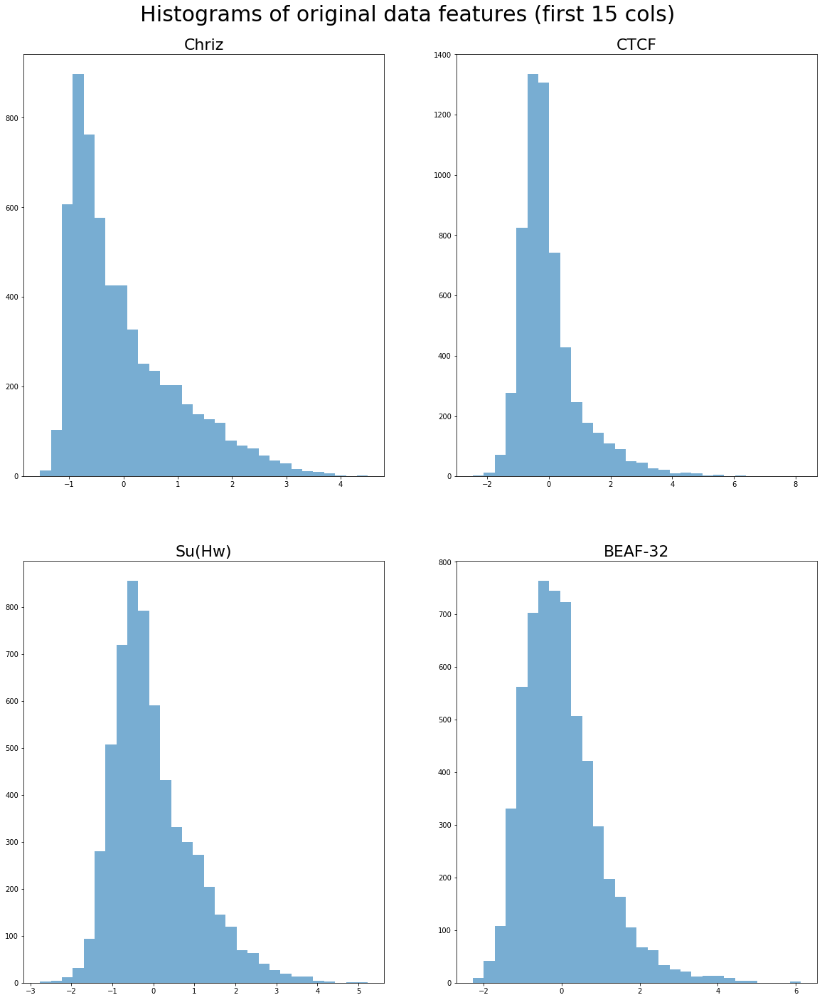

In [25]:
ncols = 2
nrows = 2
plotData(pd.DataFrame(data_scaled), ncols, nrows, bins=30, method = 'hist', is_sharex=False, plt_title='Histograms of original data features (first 15 cols)')

# target - gamma

# Explore target

In [26]:
target = gamma_S2.copy()
target.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


In [27]:
# np.unique(target.gamma)

Text(0.5, 1.0, 'gamma values for all bins')

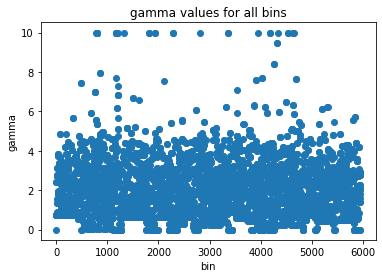

In [28]:
plt.scatter(np.arange(len(target.gamma)), target.gamma) # target
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('gamma values for all bins')

Text(0.5, 1.0, 'Distribution of gamma values for all bins')

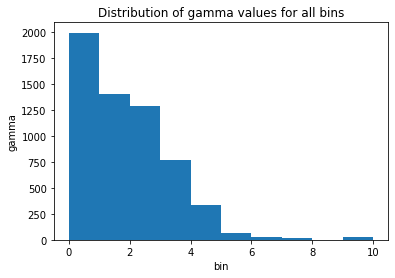

In [29]:
plt.hist(target.gamma)
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('Distribution of gamma values for all bins')

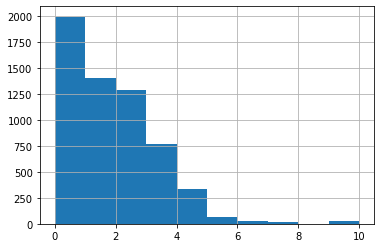

In [30]:
target.gamma.hist()

Log scale

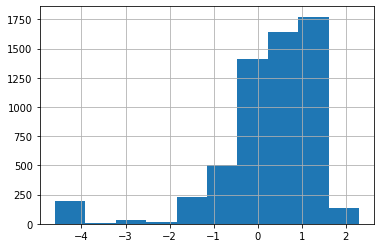

In [31]:
(np.log(0.01+target.gamma)).hist()

# Clean Data  from empty chromosomes

In [32]:
data_scaled_clean, target_clean, empty_chr_names, num_empty_bins = data_scaled, target, [], []
# cleanDataTarget(data_scaled, target)

data_scaled_clean.shape, target_clean.shape

((5950, 18), (5950, 3))

In [33]:
data_scaled_clean.head()

,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1.339516,-0.375546,-0.804706,0.244847,0.488518,0.480284,1.251444,1.138962,0.751262,-1.046926,0.815229,-0.665895,-0.387220,0.667416,0.404747,1.396884,1.300938,2.327493
1,-0.288877,-0.425095,-1.440856,-0.768391,0.577864,-0.932687,-0.227702,-0.782110,-0.599148,-0.860509,0.330711,-0.770911,-1.747820,3.288067,-0.360826,-1.053636,-0.806726,-0.373842
2,-0.328478,0.087835,-0.489589,-0.325241,-1.015322,0.306541,0.012125,-0.702369,-0.578210,-1.273076,-0.805594,-0.210170,-1.204636,2.130993,-0.139450,-0.798265,-0.675700,-0.544451
3,0.919315,0.865685,0.999879,1.247441,2.345653,1.880473,0.619415,1.164927,1.236241,-1.639354,-1.797844,1.904646,0.197162,0.051090,-0.383454,1.126086,0.901023,1.317480
4,0.629713,-0.093149,-0.942593,1.024581,-1.489017,-0.467124,0.902158,0.183348,0.253440,-1.543838,-1.967040,0.460912,0.595214,-0.405903,0.454839,1.233959,0.837072,0.977606


In [34]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


Target distribution

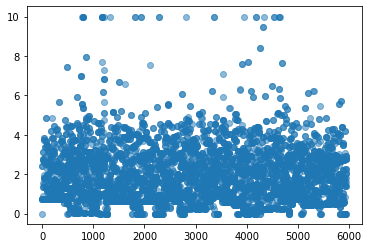

In [35]:
plt.scatter(np.arange(len(target_clean)),  target_clean.gamma, alpha=0.5)

(array([1997., 1406., 1292.,  773.,  340.,   68.,   27.,   14.,    2.,
          31.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <a list of 10 Patch objects>)

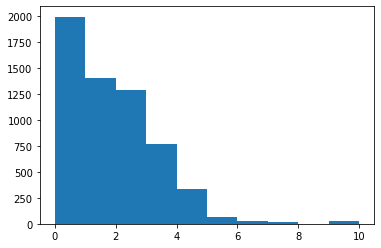

In [36]:
plt.hist(target_clean.gamma)

Log scale

(array([ 196.,    0.,    0.,   44.,    0.,  117.,  647., 1872., 2583.,
         491.]),
 array([-6.90775528, -5.98671124, -5.06566721, -4.14462317, -3.22357913,
        -2.3025351 , -1.38149106, -0.46044702,  0.46059701,  1.38164105,
         2.30268509]),
 <a list of 10 Patch objects>)

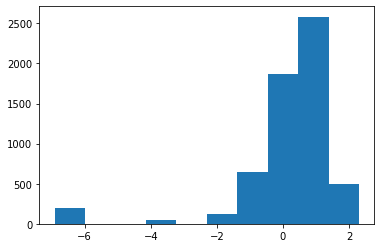

In [37]:
plt.hist(np.log(0.001 + target_clean.gamma))

In [38]:
target.shape, target.head()

((5950, 3),     chrN  start_coord  gamma
 0  chr2L            0   0.00
 1  chr2L        20000   2.43
 2  chr2L        40000   2.43
 3  chr2L        60000   0.76
 4  chr2L        80000   0.76)

# data_scaled_clean, target_clean - prossesed data

# Train Test Split

In [39]:
data = data_scaled_clean 
target = target_clean['gamma']

In [40]:
X, y = data_scaled_clean, target_clean['gamma']
X.shape, y.shape

((5950, 18), (5950,))

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=16)

X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((4165, 18), (1785, 18), (4165,), (1785,))

# Linear Regression

In [42]:
%time

# Create linear regression object
lin_reg = linear_model.LinearRegression() 

# Train the model using the training sets
lin_reg.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg.predict(X_test)

model = lin_reg

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs


 TEST PREDICTION Error
weighted_mse_test: 0.8825620716847148 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8972691351156783 


 CONSTANT pred Error:
weighted_mse_test_const:  1.357881639311237
test sizes =  1785 1785 1785


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


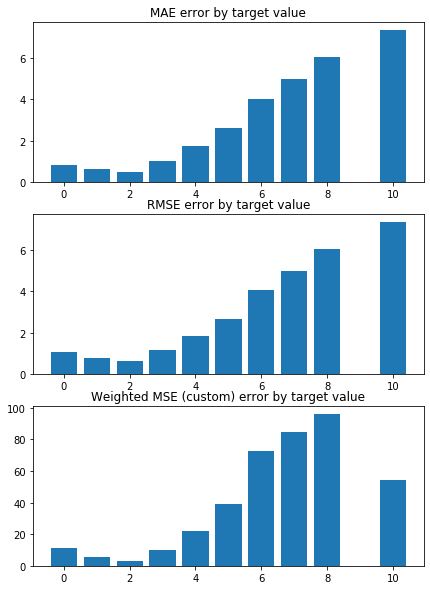

In [43]:
# Make predictions using the testing set
y_pred_train = lin_reg.predict(X_train)

weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train.values, 
                                                                          y_test.values, 
                                                                          model)

In [44]:
# The coefficients
print('Coefficients: \n', lin_reg.coef_[:20])

Coefficients: 
 [-0.41700329 -0.05536567  0.02928219 -0.02452027 -0.15242443 -0.1449951
 -0.183937    0.10969643  0.05565028 -0.08409551  0.22335748  0.00612136
 -0.09886342 -0.08618128  0.00348053 -0.27639272 -0.00330022  0.02547121]


In [45]:
coef = lin_reg.coef_

(array([1., 0., 1., 1., 3., 3., 6., 1., 1., 1.]),
 array([-0.41700329, -0.35296722, -0.28893114, -0.22489506, -0.16085898,
        -0.0968229 , -0.03278683,  0.03124925,  0.09528533,  0.15932141,
         0.22335748]),
 <a list of 10 Patch objects>)

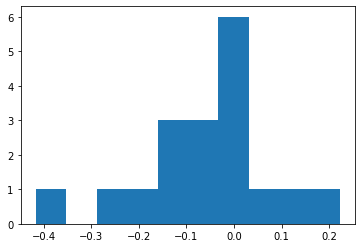

In [46]:
plt.hist(lin_reg.coef_)

Посмотрим на распределения остатков и на нормальное распределение.

(array([  1.,   0.,   1.,   5.,   6.,   3.,   9.,   7.,  16.,  28.,  27.,
         35.,  36.,  54., 111.,  95., 103., 139., 171., 180., 220., 209.,
        229., 225., 225., 226., 219., 212., 180., 190., 171., 137., 108.,
        105.,  80.,  53.,  45.,  47.,  31.,  18.,   9.,  14.,   5.,   4.,
          4.,   2.,   2.,   1.,   1.,   1.]),
 array([-3.53639272, -3.39108676, -3.2457808 , -3.10047484, -2.95516887,
        -2.80986291, -2.66455695, -2.51925098, -2.37394502, -2.22863906,
        -2.08333309, -1.93802713, -1.79272117, -1.6474152 , -1.50210924,
        -1.35680328, -1.21149731, -1.06619135, -0.92088539, -0.77557942,
        -0.63027346, -0.4849675 , -0.33966153, -0.19435557, -0.04904961,
         0.09625636,  0.24156232,  0.38686828,  0.53217425,  0.67748021,
         0.82278617,  0.96809214,  1.1133981 ,  1.25870406,  1.40401003,
         1.54931599,  1.69462195,  1.83992791,  1.98523388,  2.13053984,
         2.2758458 ,  2.42115177,  2.56645773,  2.71176369,  2.85706966,
 

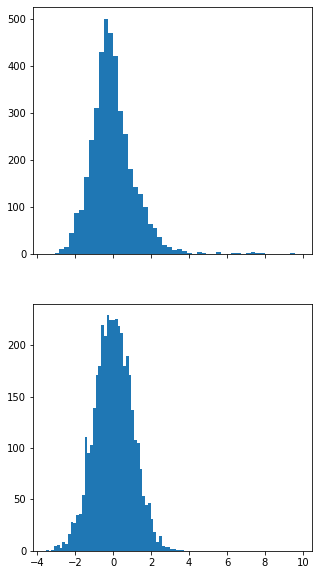

In [47]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train).values, bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

Следовательно ошибка на train имеет нормальное распределение -> модель обучается описывать данные

Значения, на которых модель возвращает наибольшую ошибку:

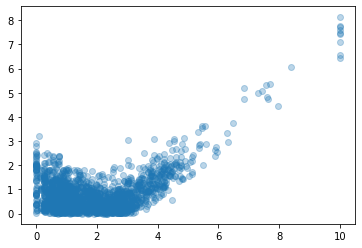

In [48]:
plt.scatter(y_test,  np.abs(y_test - y_pred) , alpha=0.3)

# Remove outlires
Посмотрим на результаты удаления объектов, для которых значение целевой переменной больше 9.

In [49]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.43
2,chr2L,40000,2.43
3,chr2L,60000,0.76
4,chr2L,80000,0.76


In [50]:
data_scaled_clean[target < 9].values

target[target < 9].values

array([0.  , 2.43, 2.43, ..., 1.99, 0.  , 0.  ])

KFold(n_splits=5, random_state=3, shuffle=True)
train_index= [   1    2    3 ... 5916 5917 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.8069477921646002 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8637567708855717 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2920917856361507
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


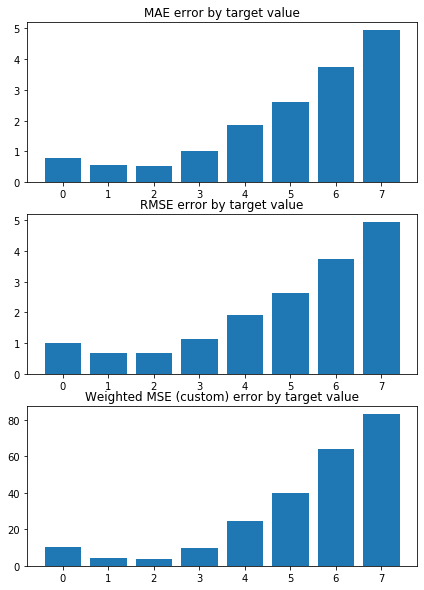

train_index= [   0    1    2 ... 5915 5916 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.8161345529774343 


 TRAIN PREDICTION Error
weighted_mse_train: 0.864783591505467 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2862471322913342
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


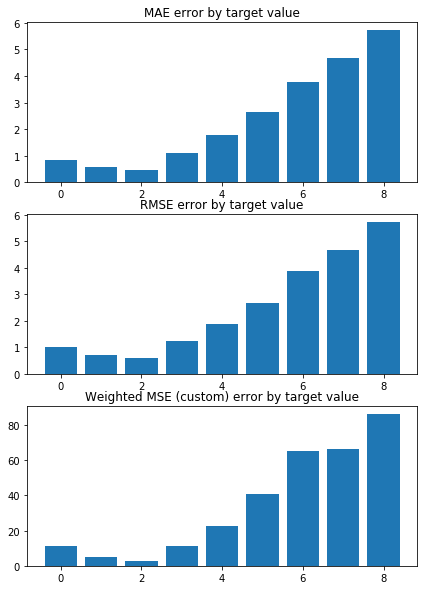

train_index= [   0    1    2 ... 5916 5917 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.9221376319197031 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8361223877295899 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3789707530553161
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


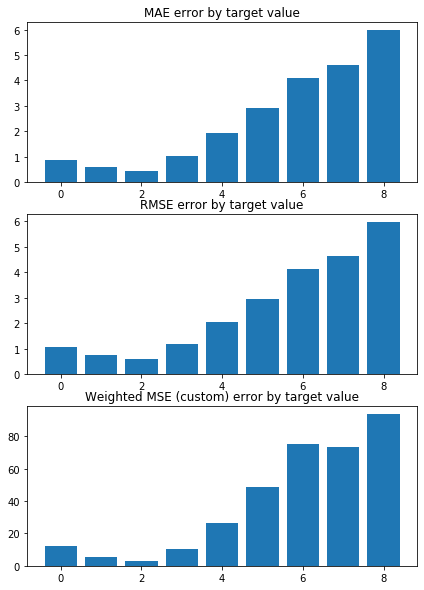

train_index= [   0    3    4 ... 5914 5915 5917]
 TEST PREDICTION Error
weighted_mse_test: 0.9120925279746483 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8412260837649052 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4089476261666791
test sizes =  1184 1184 1184


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


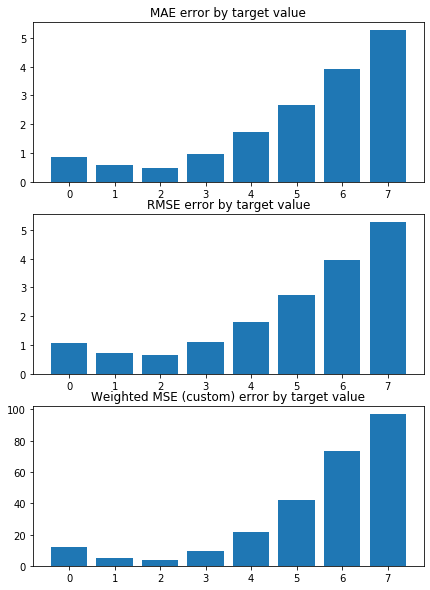

train_index= [   0    1    2 ... 5916 5917 5918]
 TEST PREDICTION Error
weighted_mse_test: 0.8466291454716761 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8555628764496057 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2542092921444037
test sizes =  1183 1183 1183


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


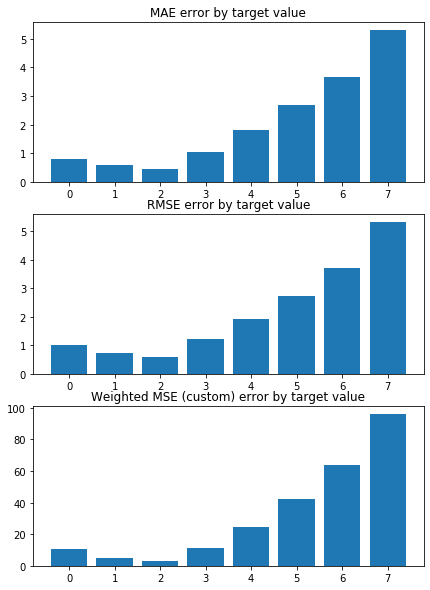

Weighted Mean squared error on Train: 0.85 
 MSE mean train: 1.1768228115669204 

Mean squared error on Test: 0.86 
 MSE mean test:  1.1882235875475056 

Root of MSE on Test: 0.93 
 1.0900566900613498 

Variance score on Test: 0.05 
 r2_test: 0.34756581229864414 

wMSE_train 0.85
wMSE_test 0.86
MSE_train 1.18
MSE_test 1.19
MAE_train 0.82
MAE_test 0.81
r2_test 0.35
      Chriz  H3K36me3     CP190       GAF   H3K4me1   H3K9me3    Su(Hw)  \
0 -0.375194 -0.311303 -0.164977 -0.158204 -0.155592  0.144550  0.077812   
1 -0.392820 -0.248820 -0.174785 -0.129888 -0.190104  0.132662  0.082896   
2 -0.417196 -0.293096 -0.154768 -0.132256 -0.191143  0.179357  0.077136   
3 -0.402519 -0.322667 -0.185055 -0.152834 -0.154008  0.110655  0.077853   
4 -0.455011 -0.299382 -0.146602 -0.143514 -0.180268  0.164327  0.076067   

    H3K4me3   H3K9me2  H3K27me1   H3K4me2  H3K27me3  H3K36me1      CTCF  \
0  0.074834 -0.041521 -0.036539  0.036527 -0.036360 -0.033689 -0.031178   
1  0.021199 -0.028814 -0.075602 

In [51]:
X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 
model_name = 'LR+L1_no_outliers'


lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=5, random_state=3, shuffle=True)


In [52]:
results_pd 

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.85229,0.01168,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8468856384588815 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8961159400363372 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


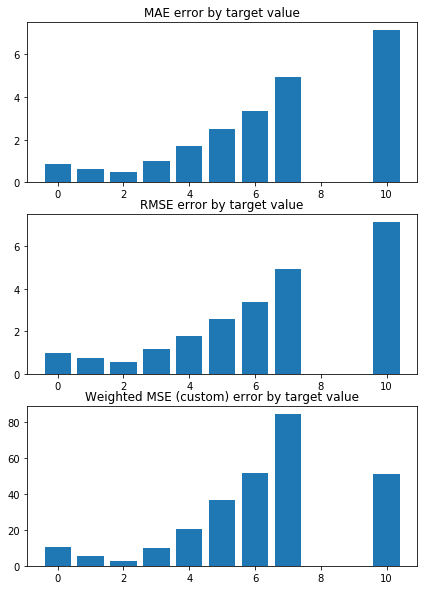

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7975789755735555 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9015923143907226 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


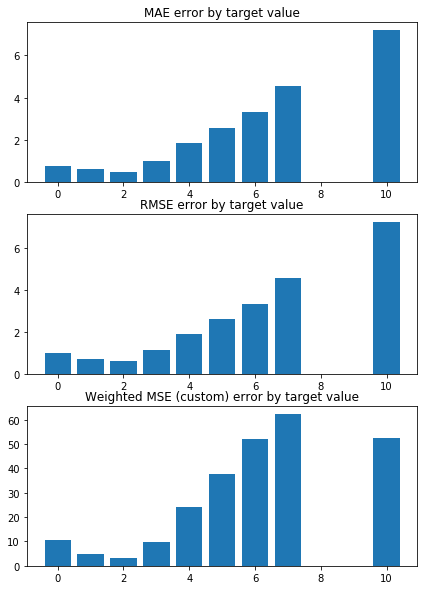

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049149257521313 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8795016496679406 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


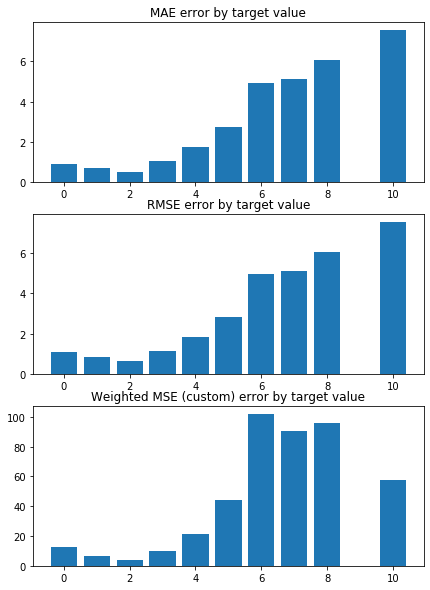

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9340342124912115 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8845870462697676 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


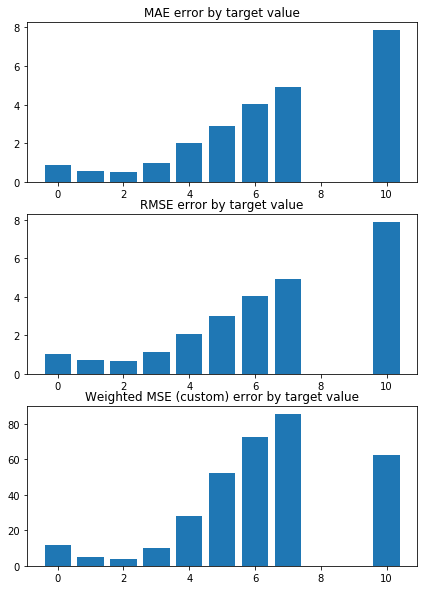

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773369578010445 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794706163382532 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


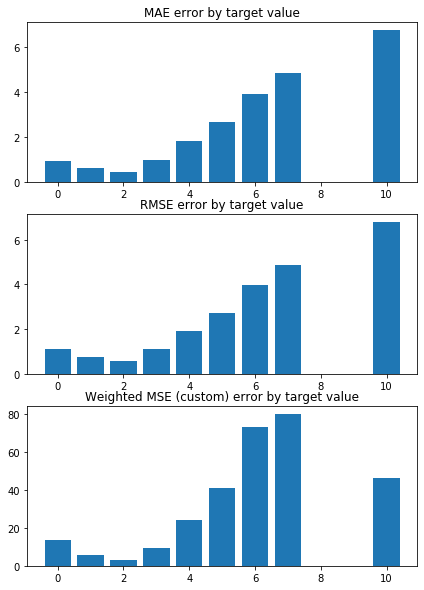

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036418856153632 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8879341090007888 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


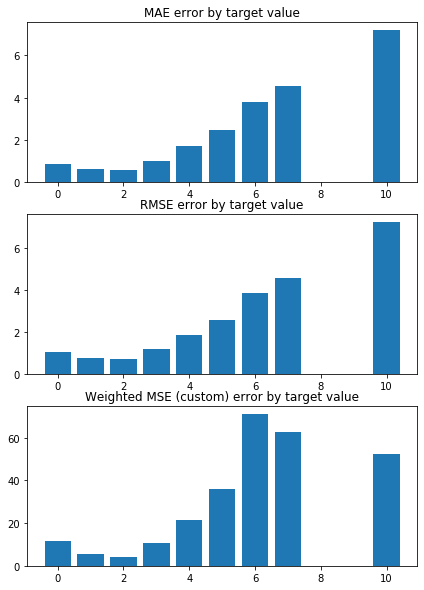

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.904141341606964 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8919974925058974 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


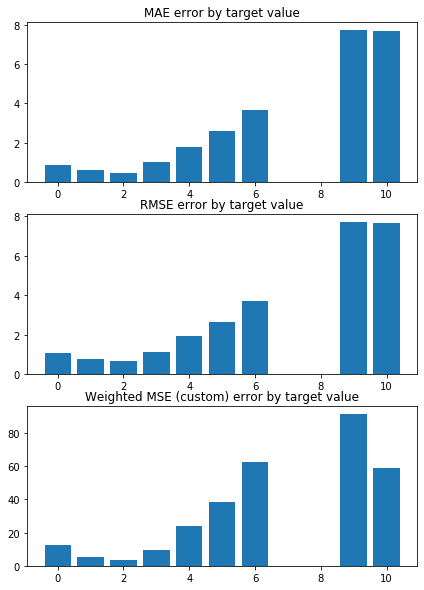

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8888864779014237 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8927441442794174 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


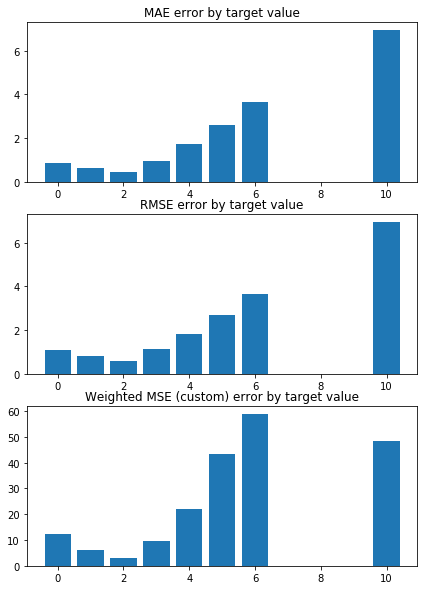

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9602303846608798 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8825039435387346 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


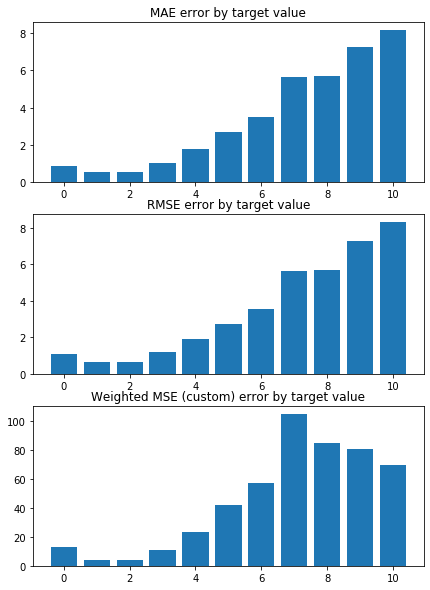

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7526194365238811 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9096443314575876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


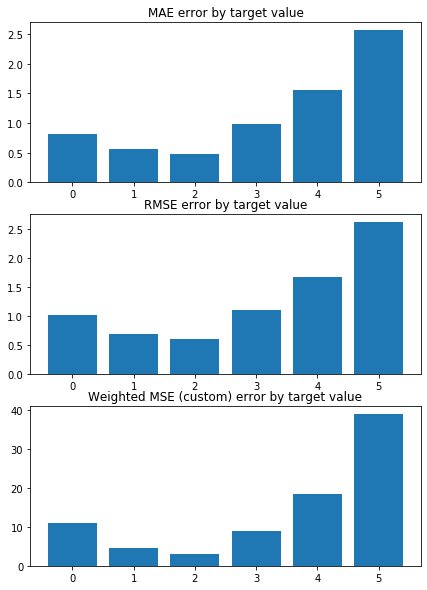

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693833459339656 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4810645696208364 

Root of MSE on Test: 0.95 
 1.2169899628266605 

Variance score on Test: 0.08 
 r2_test: 0.3158778157232478 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.425175  0.280112 -0.275135 -0.187430 -0.164903 -0.150293 -0.147859   
1 -0.414835  0.320945 -0.302229 -0.221283 -0.161158 -0.139119 -0.209257   
2 -0.376884  0.230790 -0.285298 -0.178649 -0.175687 -0.153890 -0.095870   
3 -0.389100  0.279021 -0.318000 -0.209905 -0.177116 -0.156682 -0.163545   
4 -0.365348  0.268475 -0.291039 -0.223090 -0.171286 -0.148516 -0.157718   
5 -0.403140  0.252983 -0.280585 -0.209485 -0.173189 -0.140690 -0.138454   
6 -0.388021  0.340447 -0.283263 -0.185518 -0.188349 -0.161527 -0.211988   
7 -0.426858  0.329119 -0.299364 -0.

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [53]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

In [54]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [55]:
coefs_argsort, coefs

(array([[ 0, 10, 15,  6,  4,  5,  9,  8, 13, 12,  2,  7,  1, 17, 11, 14,
         16,  3],
        [ 0, 10, 15,  6,  9,  4,  5, 13,  7,  8, 17,  2, 12,  1, 14,  3,
         11, 16],
        [ 0, 15, 10,  6,  4,  5,  7,  9, 13, 12,  1,  2, 17,  3, 14,  8,
         16, 11],
        [ 0, 15, 10,  6,  4,  9,  5, 13, 17,  2,  7,  8, 12, 14,  1, 11,
          3, 16],
        [ 0, 15, 10,  6,  4,  9,  5,  7, 13,  2,  1, 12, 14, 17,  3, 11,
         16,  8],
        [ 0, 15, 10,  6,  4,  5,  9,  8, 13,  2, 12,  7,  1, 17, 14, 11,
          3, 16],
        [ 0, 10, 15,  9,  4,  6,  5, 13,  7,  2, 17, 12,  1, 14,  8, 16,
         11,  3],
        [ 0, 10, 15,  9,  6,  4,  5, 13,  8,  2,  7,  1, 14, 17, 12, 11,
          3, 16],
        [ 0, 10, 15,  9,  4,  6,  5, 13,  8,  2, 17,  1, 14, 12, 11,  7,
          3, 16],
        [ 0, 10, 15,  6,  9,  4,  5, 13,  2,  7,  8,  1, 17, 12, 14, 11,
         16,  3]]), array([[-4.25174866e-01, -4.39767041e-02,  5.95683020e-02,
         -5.23408945e-03, -1.

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

(array([  1.,   0.,   1.,   0.,   3.,   2.,   4.,   6.,  13.,  14.,  20.,
         29.,  31.,  59.,  58.,  71.,  98., 112., 136., 160., 149., 194.,
        187., 193., 222., 211., 229., 228., 217., 195., 188., 152., 147.,
        135., 101.,  77.,  80.,  60.,  70.,  35.,  33.,  21.,  24.,  15.,
          5.,   2.,   4.,   5.,   0.,   3.]),
 array([-3.68971123, -3.54835587, -3.4070005 , -3.26564514, -3.12428977,
        -2.9829344 , -2.84157904, -2.70022367, -2.55886831, -2.41751294,
        -2.27615757, -2.13480221, -1.99344684, -1.85209148, -1.71073611,
        -1.56938074, -1.42802538, -1.28667001, -1.14531465, -1.00395928,
        -0.86260391, -0.72124855, -0.57989318, -0.43853782, -0.29718245,
        -0.15582708, -0.01447172,  0.12688365,  0.26823901,  0.40959438,
         0.55094975,  0.69230511,  0.83366048,  0.97501584,  1.11637121,
         1.25772658,  1.39908194,  1.54043731,  1.68179267,  1.82314804,
         1.96450341,  2.10585877,  2.24721414,  2.3885695 ,  2.52992487,
 

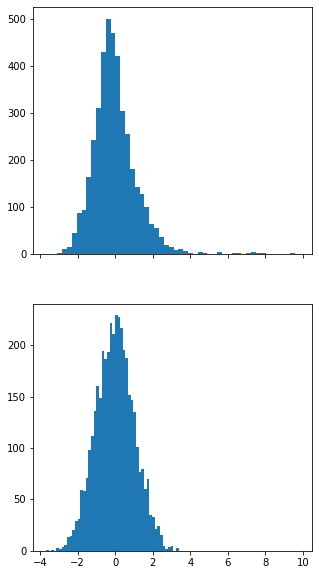

In [56]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

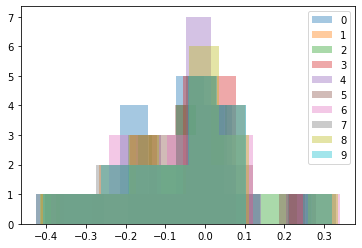

In [57]:
for i, coef_i in enumerate(coefs):
    plt.hist(coef_i, label=str(i), alpha=0.4, bins=10)
plt.legend()

(array([1., 0., 1., 4., 1., 5., 4., 1., 0., 1.]),
 array([-0.42517487, -0.35464623, -0.28411759, -0.21358895, -0.14306031,
        -0.07253167, -0.00200303,  0.06852561,  0.13905425,  0.20958289,
         0.28011153]),
 <a list of 10 Patch objects>)

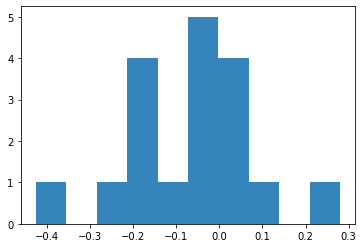

In [58]:
plt.hist(coefs[0], label=str(i), alpha=0.9, bins=10)

### Отсортированные номера выделенных признаков обычной линейной модели

In [59]:
su_drsc.columns

Index(['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'BEAF-32', 'CP190',
       'GAF', 'H3K4me1', 'H3K4me2', 'H3K4me3', 'H3K9me2', 'H3K9me3', 'H3K27ac',
       'H3K27me1', 'H3K27me3', 'H3K36me1', 'H3K36me3', 'H4K16ac',
       'RNA-polymerase-II'],
      dtype='object')

In [60]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K9me3', 'H3K36me3', 'H3K4me1', 'CP190', 'GAF', 'H3K9me2',
       'H3K4me3', 'H3K27me3', 'H3K27me1', 'Su(Hw)', 'H3K4me2', 'CTCF',
       'RNA-polymerase-II', 'H3K27ac', 'H3K36me1', 'H4K16ac', 'BEAF-32'],
      dtype='object')

In [61]:
coefs_argsort

array([[ 0, 10, 15,  6,  4,  5,  9,  8, 13, 12,  2,  7,  1, 17, 11, 14,
        16,  3],
       [ 0, 10, 15,  6,  9,  4,  5, 13,  7,  8, 17,  2, 12,  1, 14,  3,
        11, 16],
       [ 0, 15, 10,  6,  4,  5,  7,  9, 13, 12,  1,  2, 17,  3, 14,  8,
        16, 11],
       [ 0, 15, 10,  6,  4,  9,  5, 13, 17,  2,  7,  8, 12, 14,  1, 11,
         3, 16],
       [ 0, 15, 10,  6,  4,  9,  5,  7, 13,  2,  1, 12, 14, 17,  3, 11,
        16,  8],
       [ 0, 15, 10,  6,  4,  5,  9,  8, 13,  2, 12,  7,  1, 17, 14, 11,
         3, 16],
       [ 0, 10, 15,  9,  4,  6,  5, 13,  7,  2, 17, 12,  1, 14,  8, 16,
        11,  3],
       [ 0, 10, 15,  9,  6,  4,  5, 13,  8,  2,  7,  1, 14, 17, 12, 11,
         3, 16],
       [ 0, 10, 15,  9,  4,  6,  5, 13,  8,  2, 17,  1, 14, 12, 11,  7,
         3, 16],
       [ 0, 10, 15,  6,  9,  4,  5, 13,  2,  7,  8,  1, 17, 12, 14, 11,
        16,  3]])

In [62]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,0,10,15,6,4,5,9,8,13,12,2,7,1,17,11,14,16,3
1,0,10,15,6,9,4,5,13,7,8,17,2,12,1,14,3,11,16
2,0,15,10,6,4,5,7,9,13,12,1,2,17,3,14,8,16,11
3,0,15,10,6,4,9,5,13,17,2,7,8,12,14,1,11,3,16
4,0,15,10,6,4,9,5,7,13,2,1,12,14,17,3,11,16,8
5,0,15,10,6,4,5,9,8,13,2,12,7,1,17,14,11,3,16
6,0,10,15,9,4,6,5,13,7,2,17,12,1,14,8,16,11,3
7,0,10,15,9,6,4,5,13,8,2,7,1,14,17,12,11,3,16
8,0,10,15,9,4,6,5,13,8,2,17,1,14,12,11,7,3,16
9,0,10,15,6,9,4,5,13,2,7,8,1,17,12,14,11,16,3


# !! одинаковая приоритизация 

In [63]:
def getConfIdxFrequencies(coefs_argsort, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(key, value))
        
    return featur_freq_dict

In [64]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 3)

0: 10
10: 10
15: 10
16: 10
3: 8
11: 8
8: 2
7: 1
14: 1


## Explore fold with big error

train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    2    3 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5948 5949]
train_index= [   1    4    5 ... 5945 5947 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5947 5948]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]


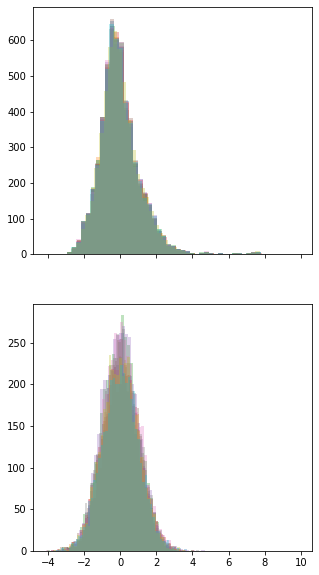

In [65]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

     # Train the model using the training sets
    model.fit(X_train, y_train)

    # Make predictions using the train set
    y_pred_train = model.predict(X_train)

    # Make predictions using the testing set
    y_pred = model.predict(X_test)

    axes[0].hist(y_train - y_pred_train, bins=50, alpha=0.3)
    axes[1].hist(np.random.randn(4000), bins=50, alpha=0.3)

# ================================================================

# Linear Regression with L1 regularization -  LASSO

$$ (1 / (2  n\_{samples}))  ||y - Xw||^2_2 + \alpha * ||w||_1 $$


In [66]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)

In [67]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso()

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

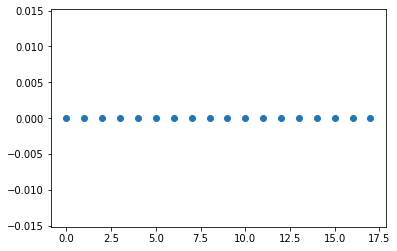

In [68]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [69]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index([], dtype='object')

In [70]:
lin_reg_l1.coef_

array([-0., -0.,  0., -0., -0., -0., -0., -0., -0.,  0.,  0., -0., -0.,
        0., -0., -0., -0., -0.])

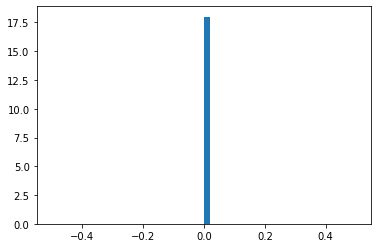

In [71]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [72]:
# f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
# axes[0].hist((y_train - y_pred_train), bins=50)
# axes[1].hist(np.random.randn(4000), bins=50)

### Cross validation
without outliers

In [73]:
# X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# # Create linear regression with L2 regularization object
# model_l1 = linear_model.Lasso(0.2)

# model_name = 'LR+L1_t<.9'

# lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
#                 weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const, \
#                 results_pd = train_test_KFold(X, y, 
#                                               model, model_name, results_pd,
#                                               n_splits=5, random_state=3, shuffle=True)
# results_pd

In [74]:
# np.mean(weighted_mse_test_all)

In [75]:
# for coef_i in coefs_l1:
#     plt.hist(coef_i, alpha=0.5)
# plt.hist(coefs_l1[0], alpha=0.5)

In [76]:
# np.sort(coefs_l1)

In [77]:
# lin_reg_l1.predict(X_test)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L 1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4063865324088682 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3598390652573922 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


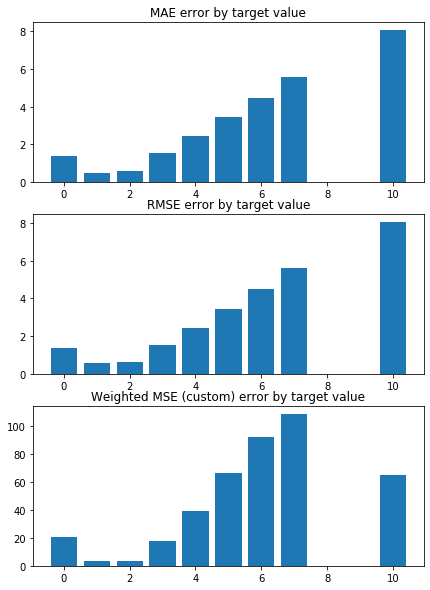

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


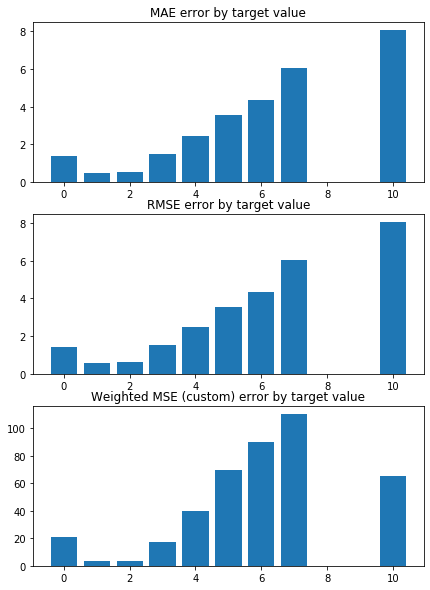

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


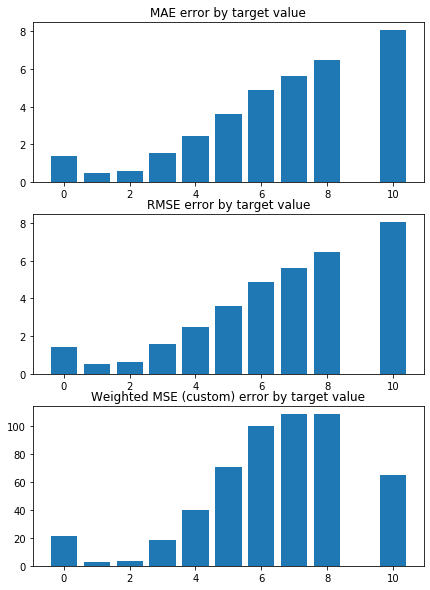

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


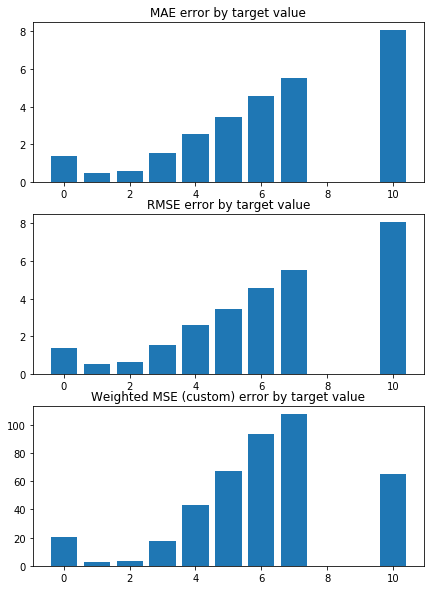

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


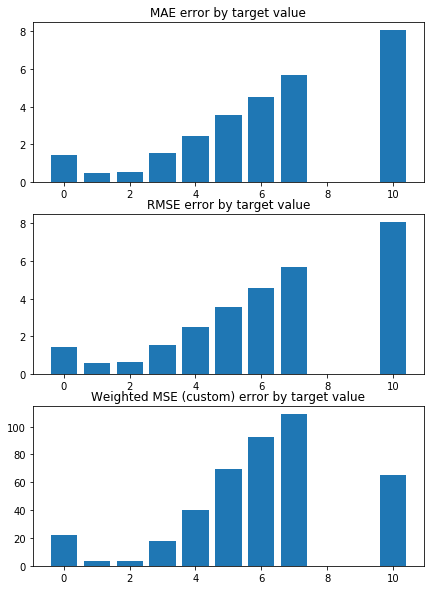

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


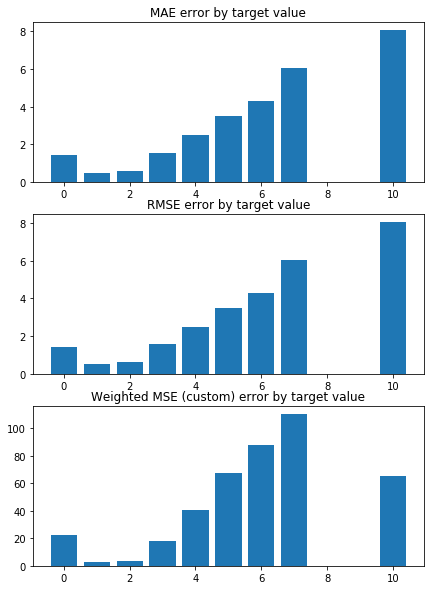

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


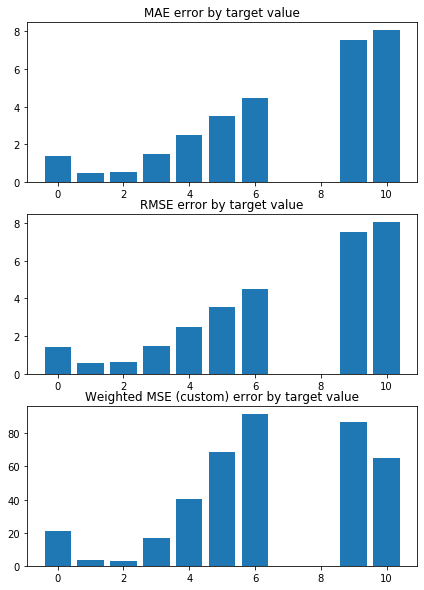

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


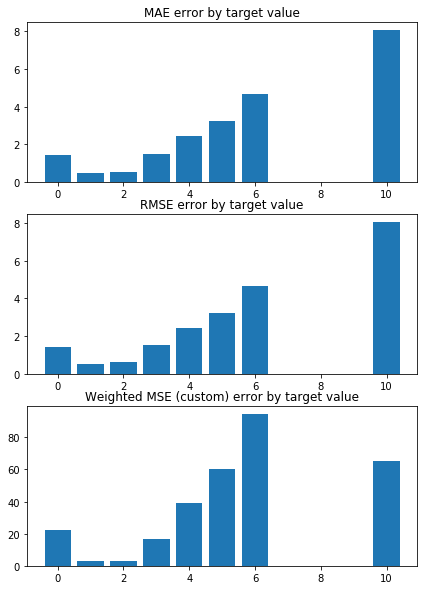

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


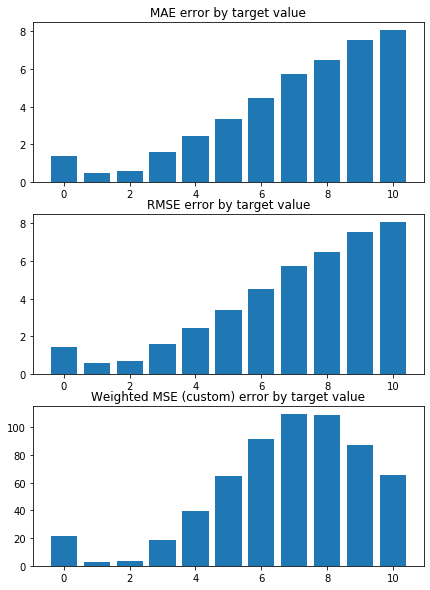

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


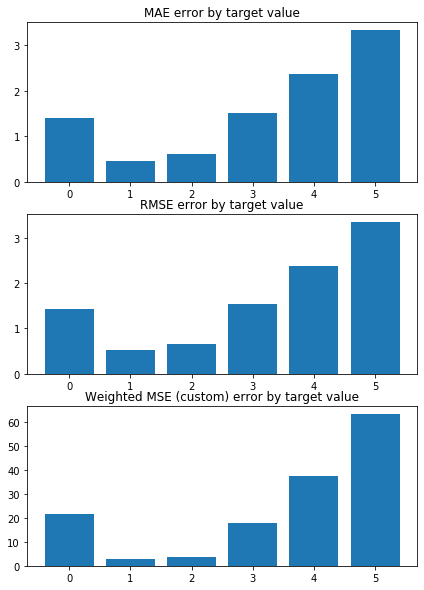

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."


In [78]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.Lasso()

model_name = 'LR+L1'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

# Fined parametrs for lasso L1

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8468856384588812 


 TRAIN PREDICTION Error


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4004.029051723466, tolerance: 1.157624653381885
  positive)


weighted_mse_train: 0.8961159400363374 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


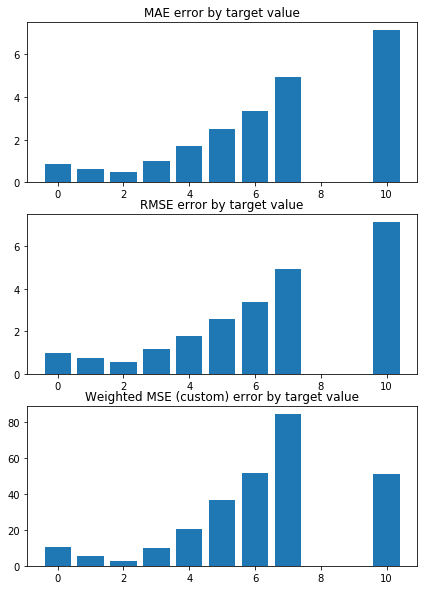

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7975789755735557 


 TRAIN PREDICTION Error


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3969.5561320234133, tolerance: 1.1556851426591965
  positive)


weighted_mse_train: 0.9015923143907226 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


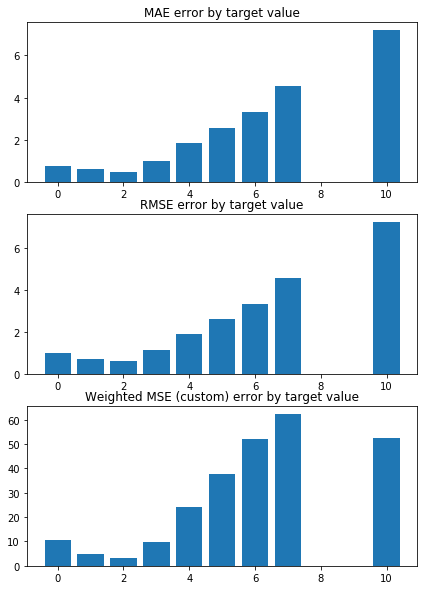

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.004914925752132 


 TRAIN PREDICTION Error
weighted_mse_train: 0.879501649667941 


 CONSTANT pred Error:


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3845.048861470346, tolerance: 1.1390143168328661
  positive)


weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


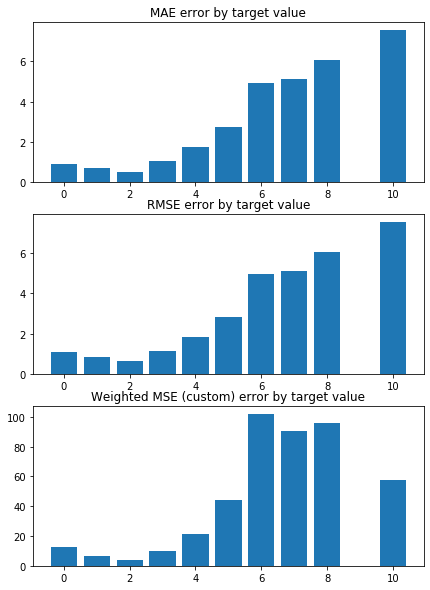

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.934034212491212 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8845870462697678 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3814.4646123975394, tolerance: 1.134086969012138
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

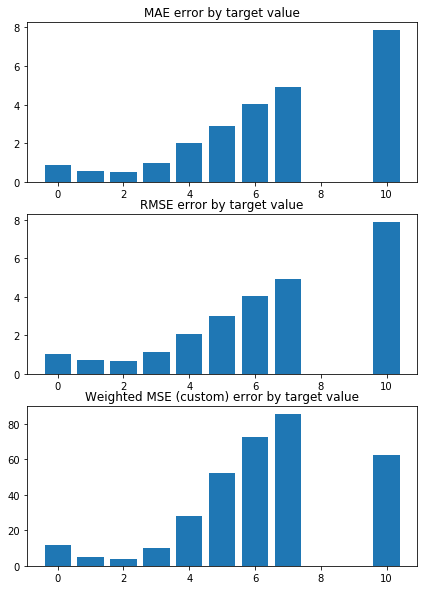

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773369578010445 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794706163382533 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3912.828425598824, tolerance: 1.1411477756974782
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

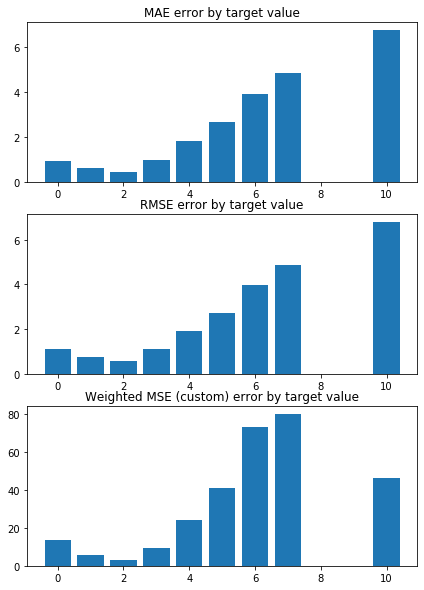

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036418856153635 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8879341090007888 


 CONSTANT pred Error:


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3918.1003957369103, tolerance: 1.1451602222857147
  positive)


weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


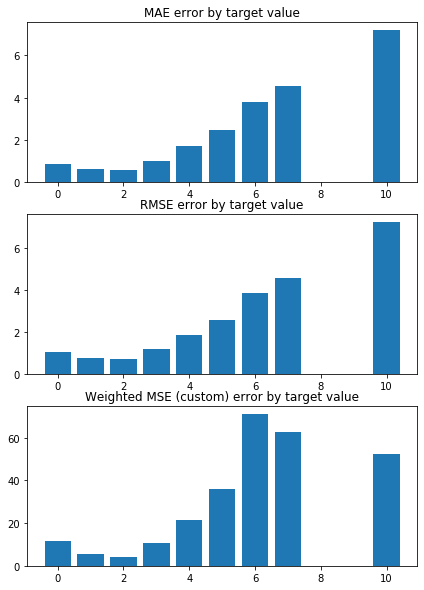

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9041413416069641 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8919974925058977 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3972.552892926463, tolerance: 1.162511723331466
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

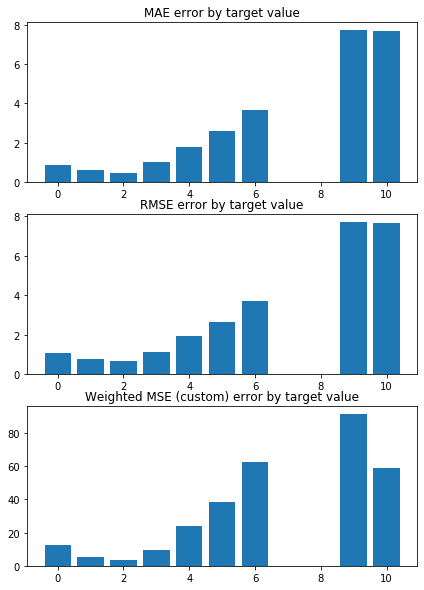

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.888886477901424 


 TRAIN PREDICTION Error


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3988.8801418427015, tolerance: 1.1623169966386562
  positive)


weighted_mse_train: 0.8927441442794177 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


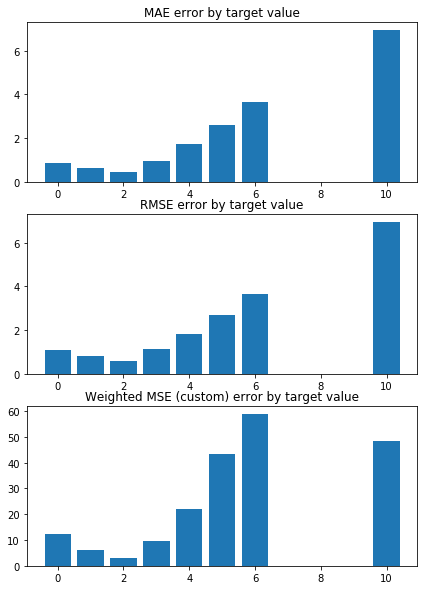

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9602303846608801 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8825039435387346 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3826.0836214058313, tolerance: 1.1313881385546216
  positive)


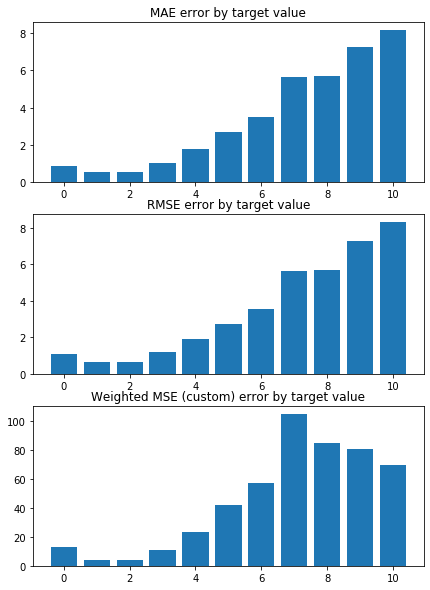

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7526194365238811 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9096443314575876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4091.194952256408, tolerance: 1.181346870110178
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

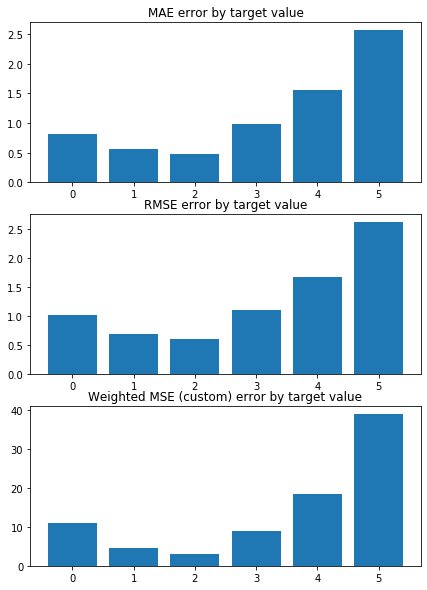

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693833459339656 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4810645696208364 

Root of MSE on Test: 0.95 
 1.2169899628266605 

Variance score on Test: 0.08 
 r2_test: 0.3158778157232478 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.425175  0.280112 -0.275135 -0.187430 -0.164903 -0.150293 -0.147859   
1 -0.414835  0.320945 -0.302229 -0.221283 -0.161158 -0.139119 -0.209257   
2 -0.376884  0.230790 -0.285298 -0.178649 -0.175687 -0.153890 -0.095870   
3 -0.389100  0.279021 -0.318000 -0.209905 -0.177116 -0.156682 -0.163545   
4 -0.365348  0.268475 -0.291039 -0.223090 -0.171286 -0.148516 -0.157718   
5 -0.403140  0.252983 -0.280585 -0.209485 -0.173189 -0.140690 -0.138454   
6 -0.388021  0.340447 -0.283263 -0.185518 -0.188349 -0.161527 -0.211988   
7 -0.426858  0.329119 -0.299364 -0.

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


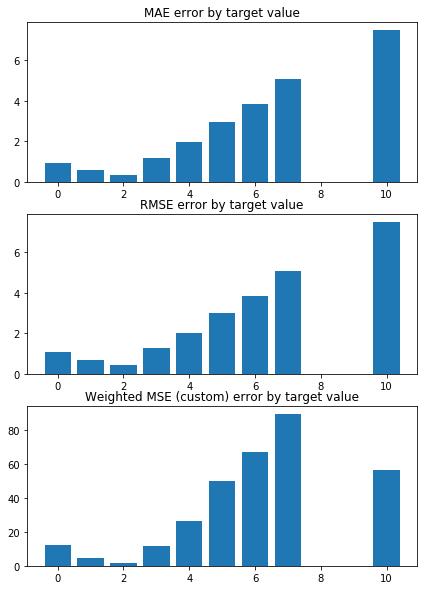

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8465829516790856 


 TRAIN PREDICTION Error
weighted_mse_train: 0.958649004913108 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


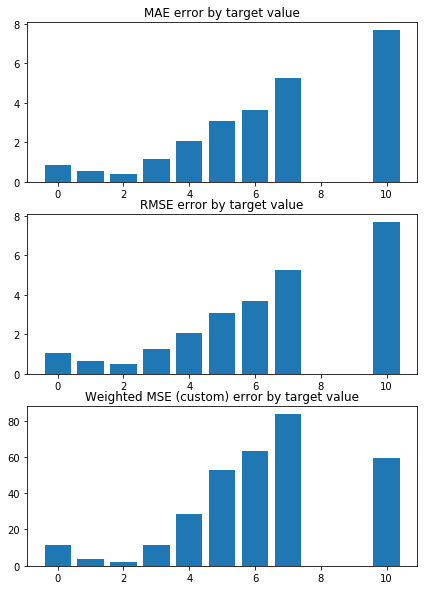

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0024574858156863 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9408994270276345 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


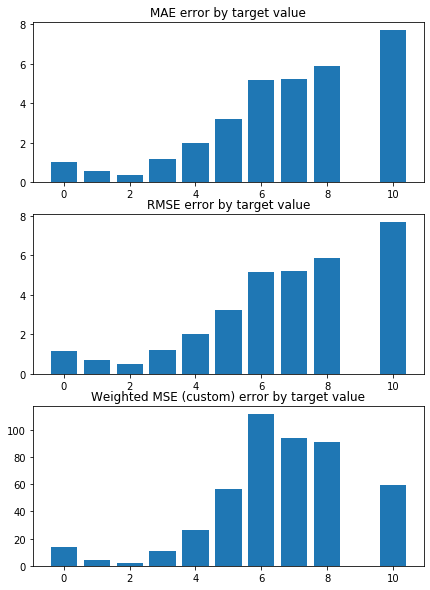

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9617035863924087 


 TRAIN PREDICTION Error
weighted_mse_train: 0.940356725796675 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


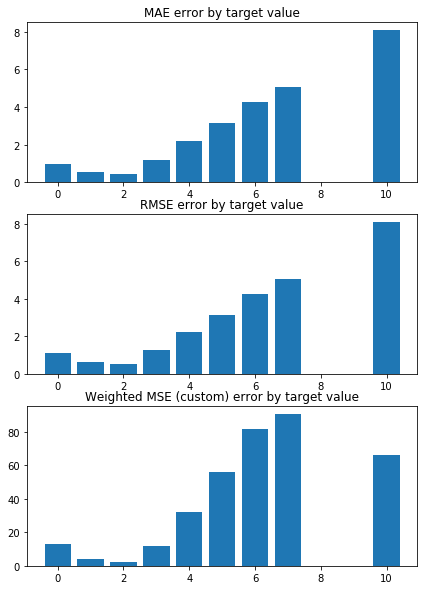

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0446605786921204 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9377282176409865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


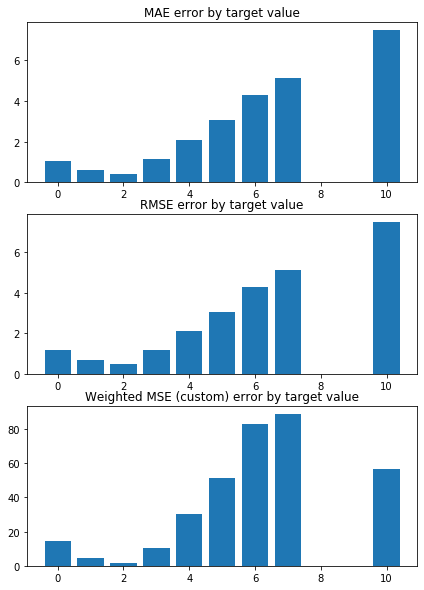

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734566210384338 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9455462464316167 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


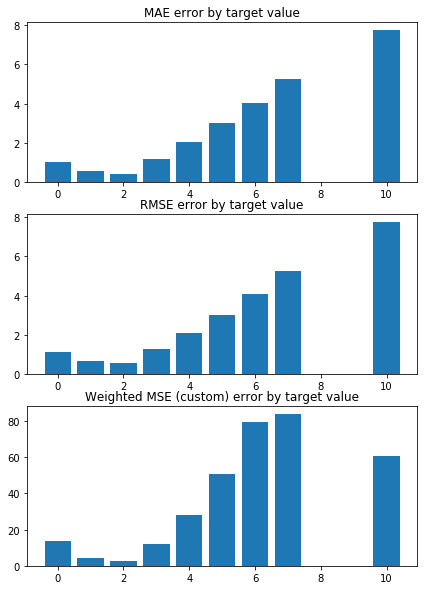

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9268417983833402 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9510225997170333 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


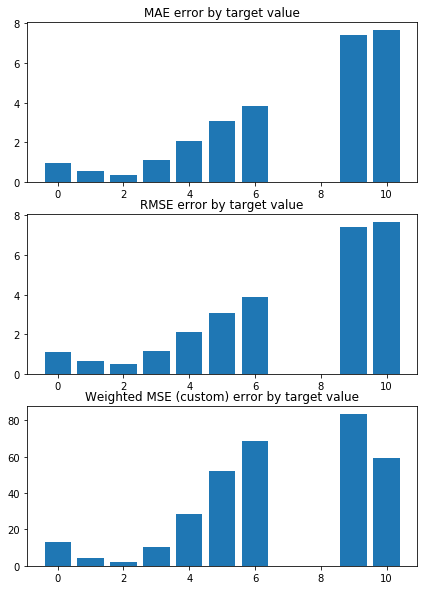

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9359040932805903 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9503636012862704 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


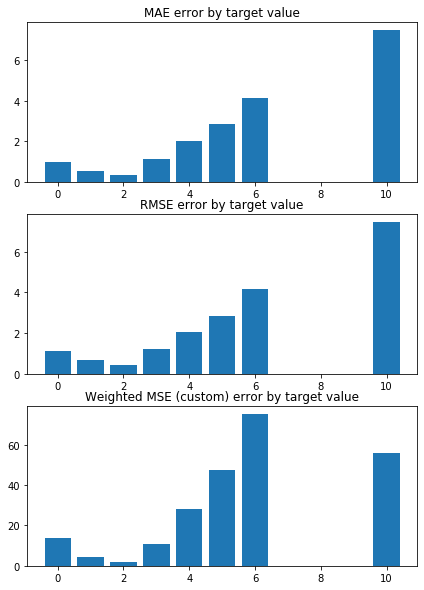

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0310802186869075 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9391899024875072 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


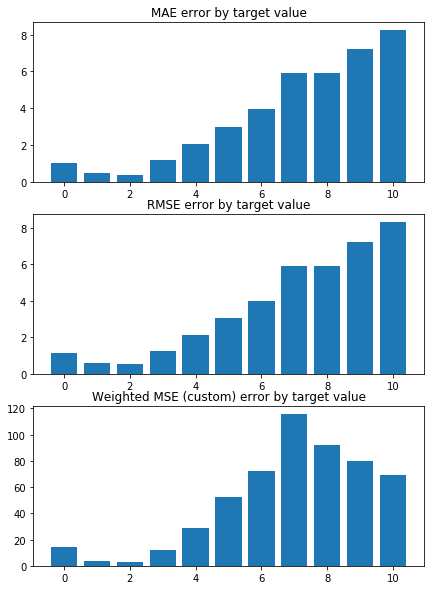

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8341735401717396 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9662091131921546 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


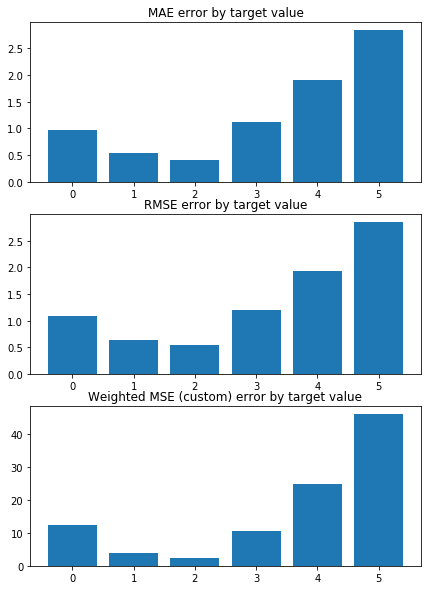

Weighted Mean squared error on Train: 0.95 
 MSE mean train: 1.590623351524329 

Mean squared error on Test: 0.95 
 MSE mean test:  1.5945320934930722 

Root of MSE on Test: 0.97 
 1.2627478344836203 

Variance score on Test: 0.07 
 r2_test: 0.262356114909088 

wMSE_train 0.95
wMSE_test 0.95
MSE_train 1.59
MSE_test 1.59
MAE_train 0.93
MAE_test 0.85
r2_test 0.26
      Chriz   H3K4me1  H3K36me3  RNA-polymerase-II   H3K4me2       GAF  CP190  \
0 -0.379450 -0.126267 -0.073104          -0.022698 -0.020806 -0.001539   -0.0   
1 -0.367329 -0.147189 -0.085605          -0.000000 -0.038365 -0.000000   -0.0   
2 -0.366746 -0.128212 -0.093666          -0.017238 -0.026914 -0.009341   -0.0   
3 -0.372233 -0.145039 -0.099378          -0.000000 -0.028502 -0.003993   -0.0   
4 -0.363644 -0.145322 -0.087459          -0.006418 -0.028797 -0.001682   -0.0   
5 -0.374387 -0.142594 -0.073367          -0.030313 -0.015542 -0.000000   -0.0   
6 -0.372969 -0.118660 -0.071579          -0.000000 -0.055461 -0.01651

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


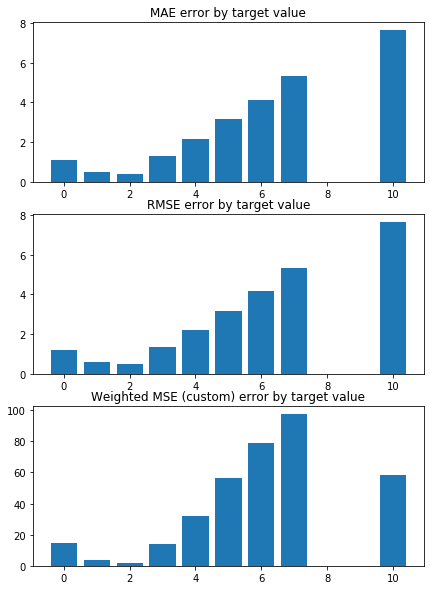

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9577973233052844 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0772867626058018 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


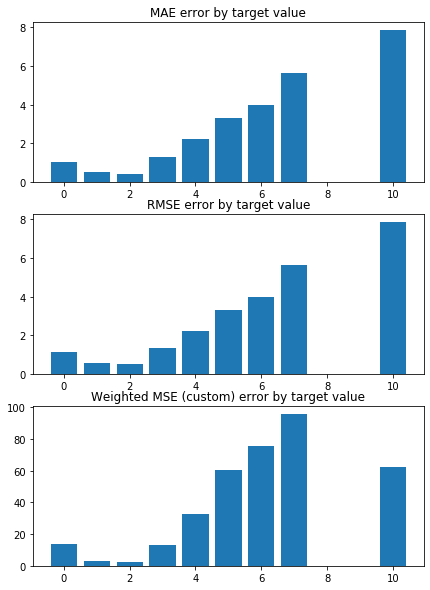

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1004970593962486 


 TRAIN PREDICTION Error
weighted_mse_train: 1.059515140509327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


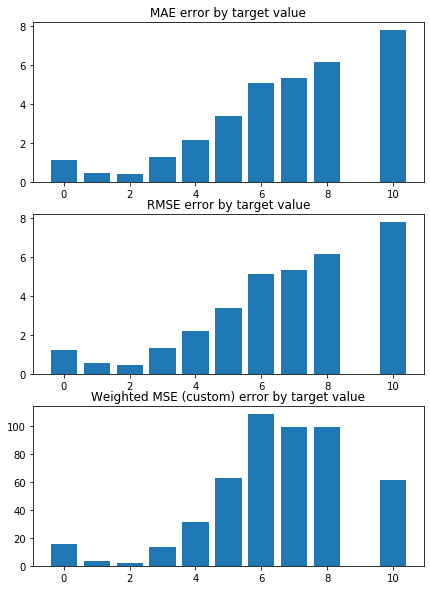

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0516391801850586 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0569183252061944 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


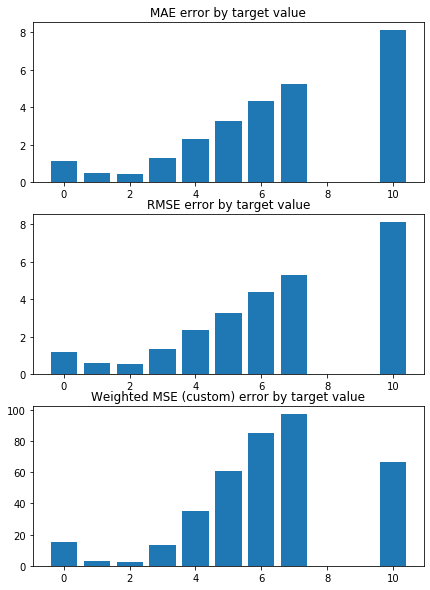

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.158410783121623 


 TRAIN PREDICTION Error
weighted_mse_train: 1.055993799515288 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


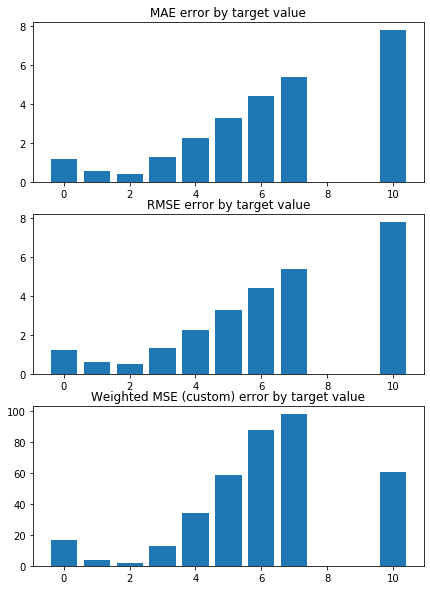

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0819394750170301 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0617309449923977 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


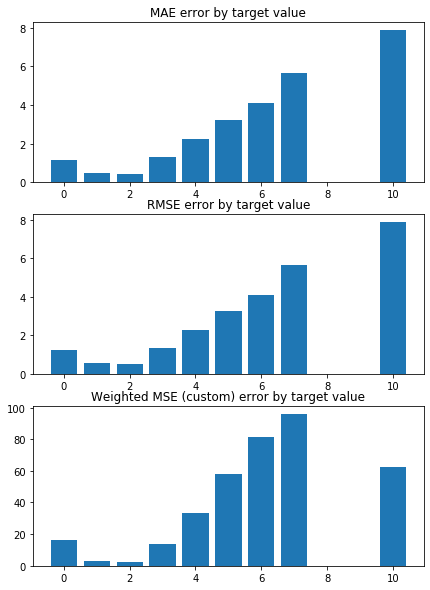

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.042935392573405 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0656244741722276 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


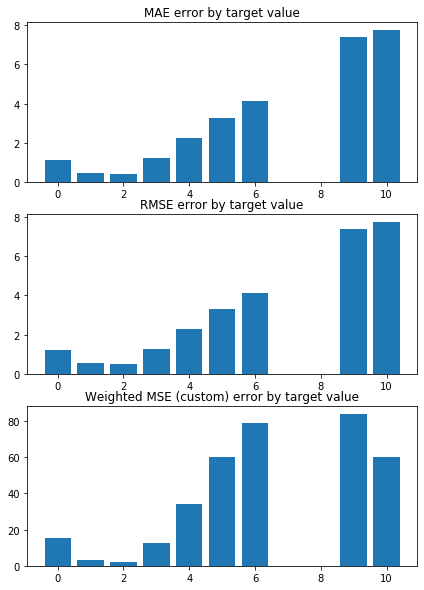

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.049444337428953 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0673001077285378 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


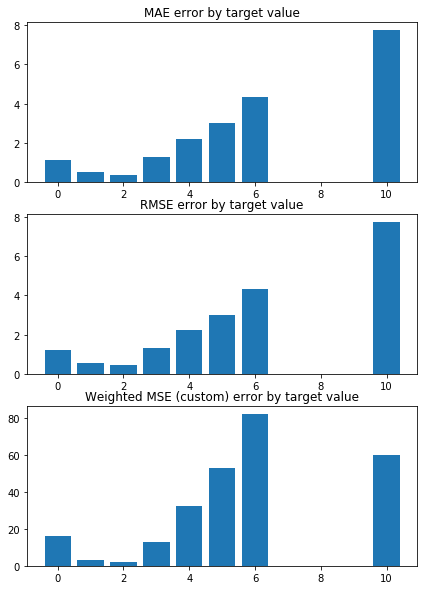

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.143324978512364 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0483229279924815 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


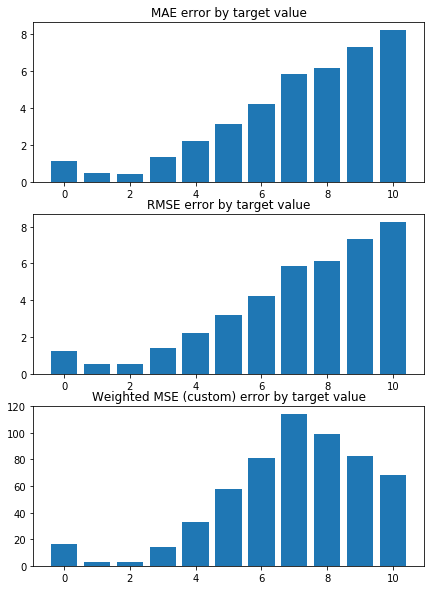

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9719617015208635 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0806378809172086 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


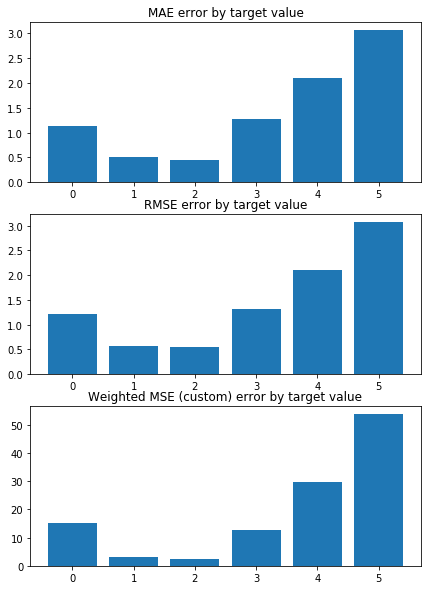

Weighted Mean squared error on Train: 1.06 
 MSE mean train: 1.7576288278352028 

Mean squared error on Test: 1.06 
 MSE mean test:  1.759002724413359 

Root of MSE on Test: 1.03 
 1.326274000504179 

Variance score on Test: 0.06 
 r2_test: 0.18408618754594872 

wMSE_train 1.06
wMSE_test 1.06
MSE_train 1.76
MSE_test 1.76
MAE_train 1.01
MAE_test 0.94
r2_test 0.18
      Chriz   H3K4me2  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  \
0 -0.275124 -0.065614      -0.0      -0.0       0.0      -0.0     -0.0   
1 -0.256863 -0.089896      -0.0      -0.0       0.0      -0.0     -0.0   
2 -0.271791 -0.079794      -0.0      -0.0       0.0      -0.0     -0.0   
3 -0.274578 -0.082630      -0.0      -0.0       0.0      -0.0     -0.0   
4 -0.260658 -0.082772      -0.0      -0.0       0.0      -0.0     -0.0   
5 -0.267706 -0.081088      -0.0      -0.0       0.0      -0.0     -0.0   
6 -0.258225 -0.093187      -0.0      -0.0       0.0      -0.0     -0.0   
7 -0.272647 -0.075007      -0.0      -0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


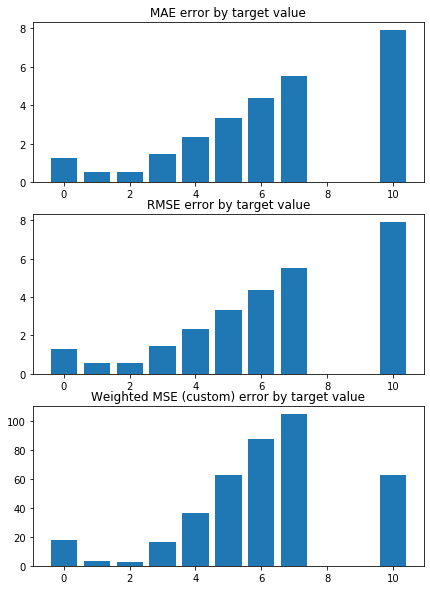

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1373408713993023 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2433917041047733 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


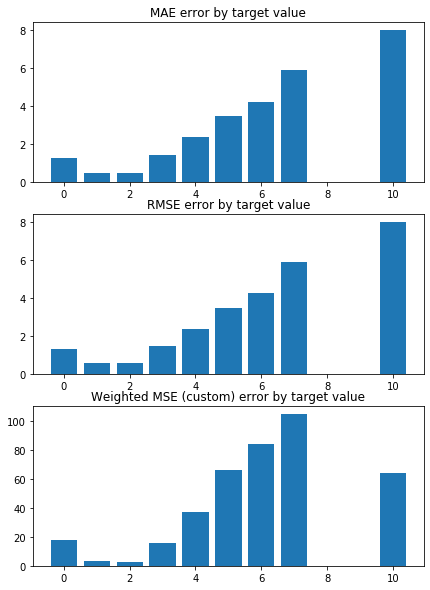

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2467544228077176 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2225156924832645 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


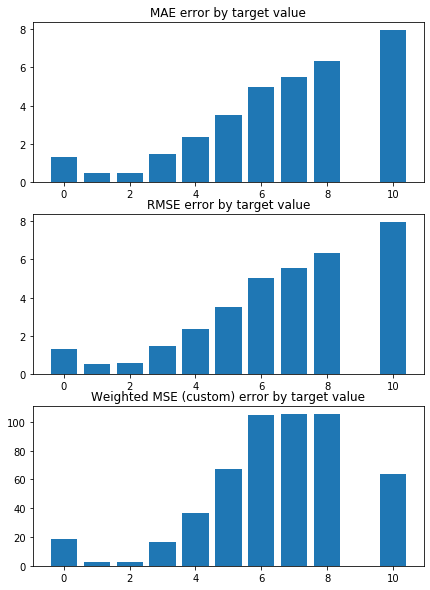

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1881354089028464 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2169104805980249 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


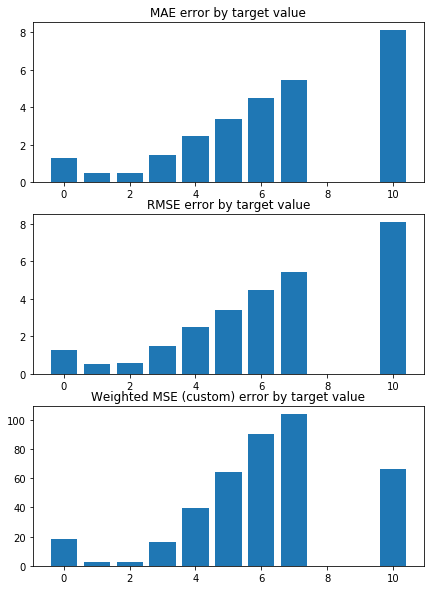

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3279843354894687 


 TRAIN PREDICTION Error
weighted_mse_train: 1.21846087128735 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


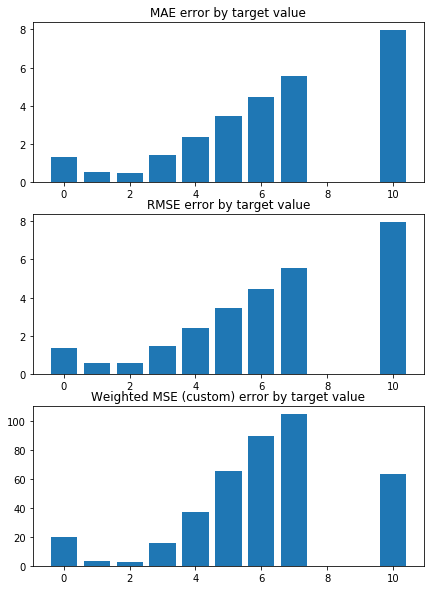

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2335386074086871 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2226111046536265 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


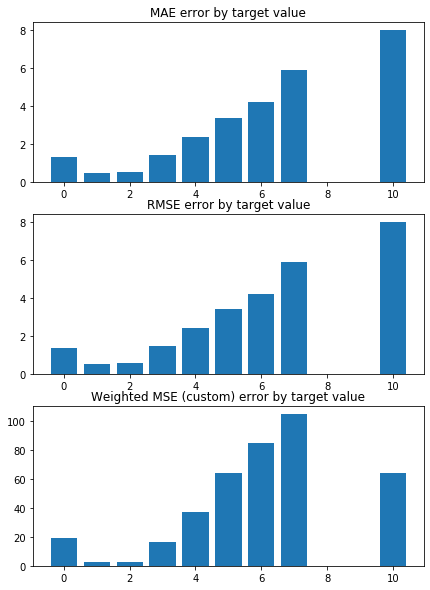

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2038314781308856 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2310533713768435 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


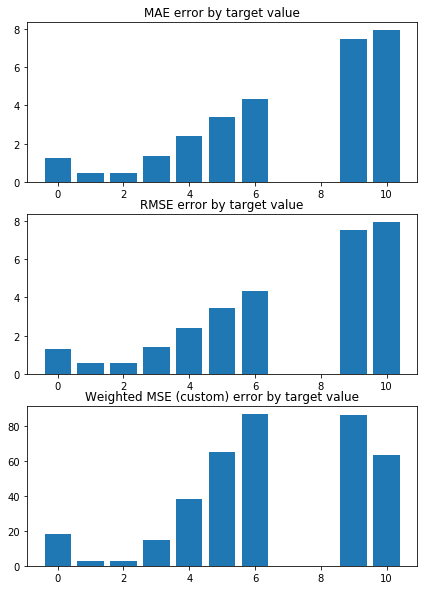

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2178189218004187 


 TRAIN PREDICTION Error
weighted_mse_train: 1.229617601132327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


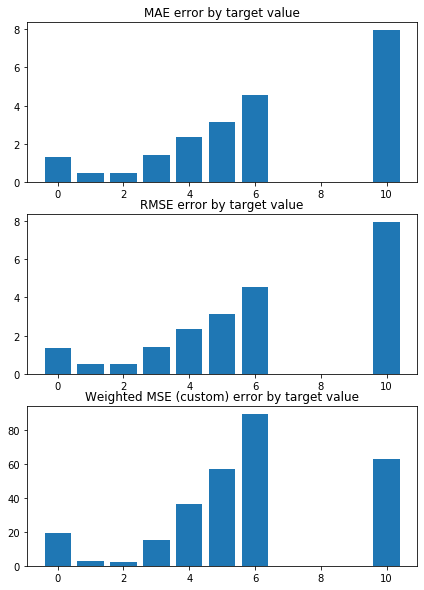

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2913617094452303 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2105278133479194 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


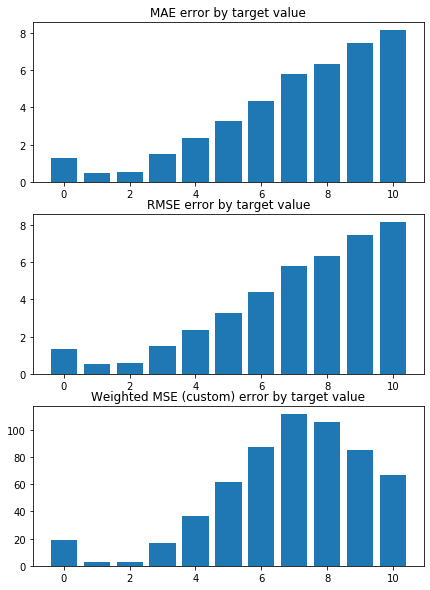

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1545364999971985 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2411282067968807 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


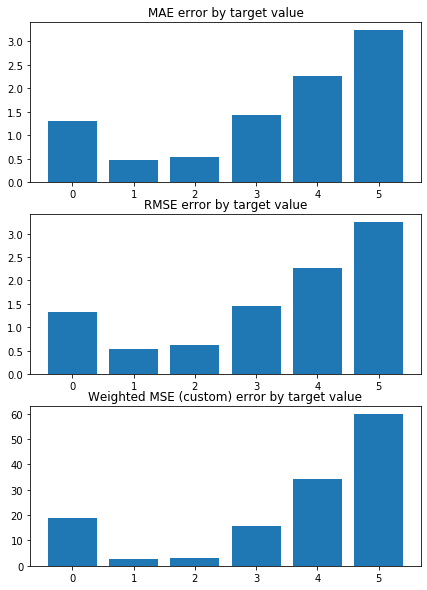

Weighted Mean squared error on Train: 1.23 
 MSE mean train: 1.973906165852458 

Mean squared error on Test: 1.23 
 MSE mean test:  1.9749945464942986 

Root of MSE on Test: 1.11 
 1.4053449919839252 

Variance score on Test: 0.06 
 r2_test: 0.08135932386423997 

wMSE_train 1.23
wMSE_test 1.23
MSE_train 1.97
MSE_test 1.97
MAE_train 1.1
MAE_test 1.04
r2_test 0.08
      Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.126866      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
1 -0.125314      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
2 -0.134546      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
3 -0.141521      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
4 -0.126929      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
5 -0.133792      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
6 -0.130829      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
7 -0.130688      -0.0      -0.0       0.0      -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


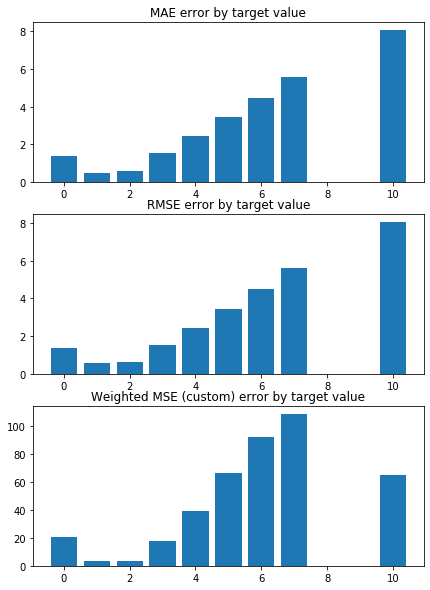

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


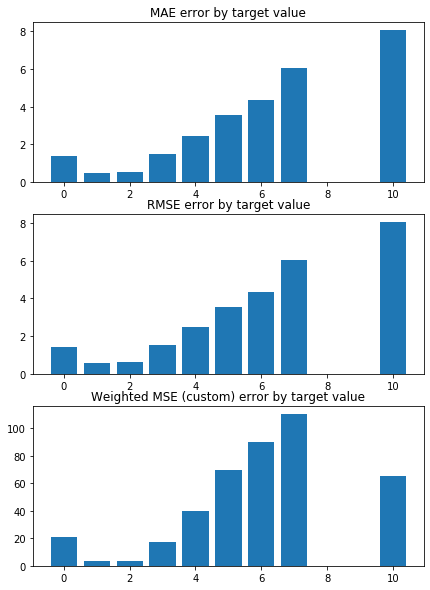

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


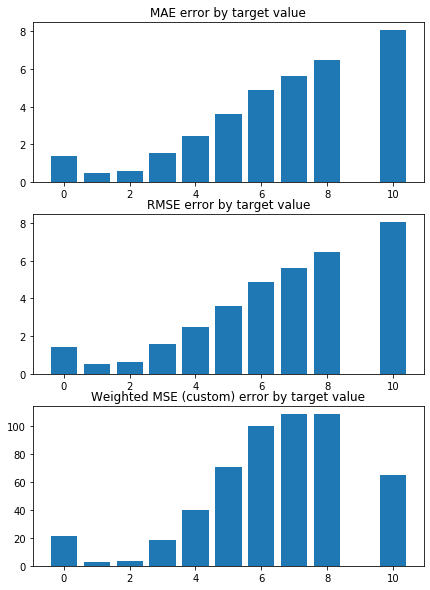

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


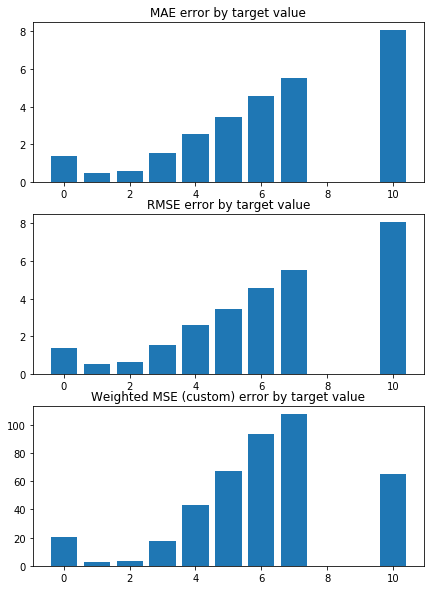

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


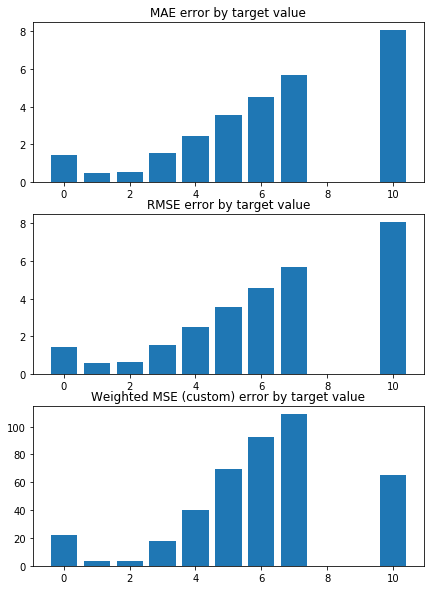

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


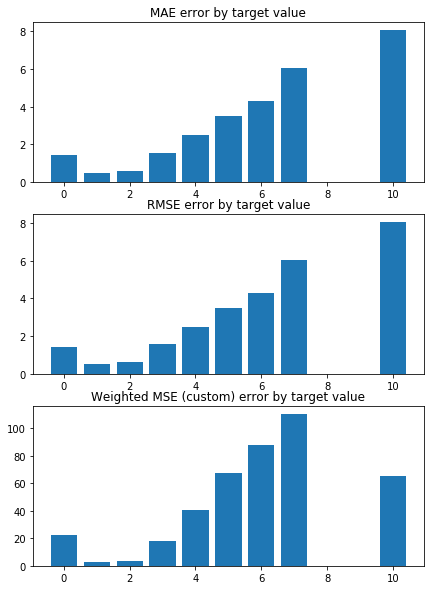

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


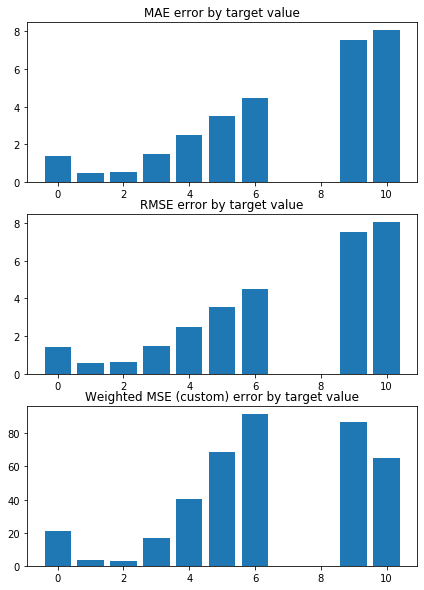

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


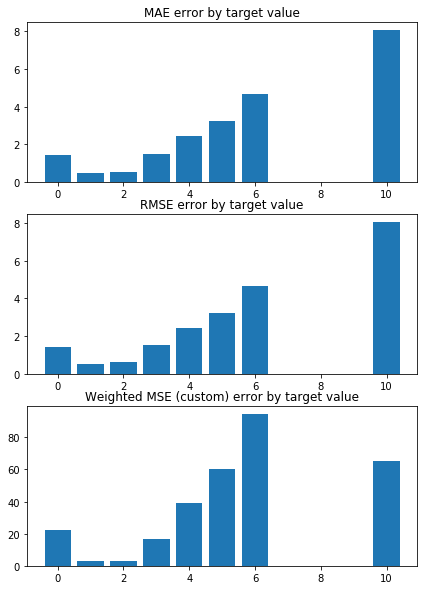

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


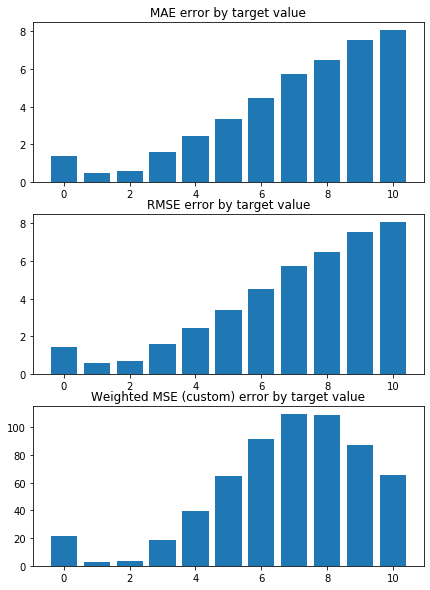

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


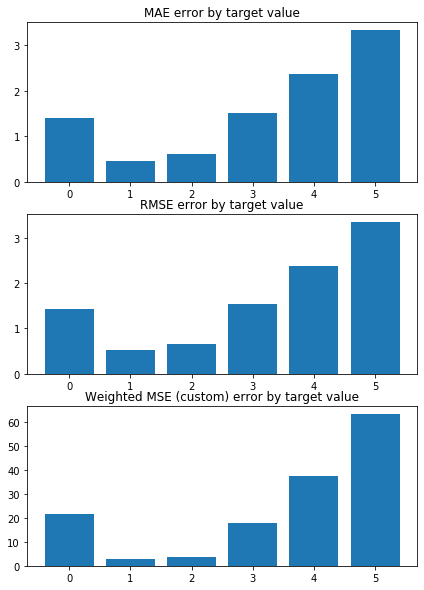

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


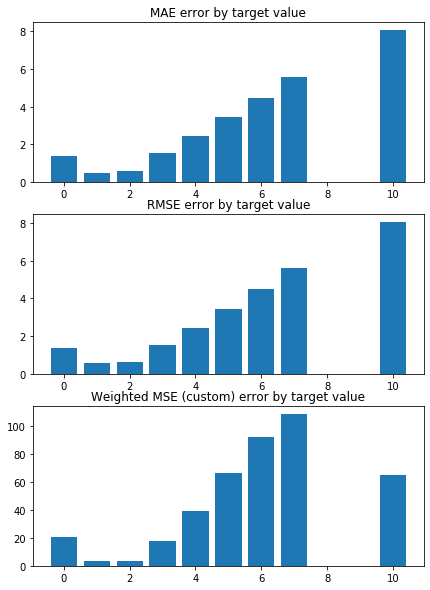

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


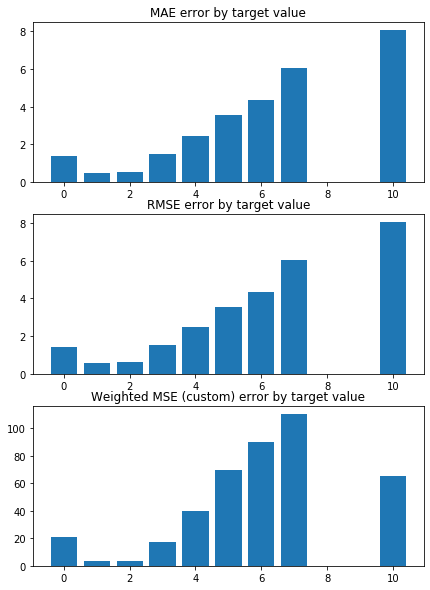

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


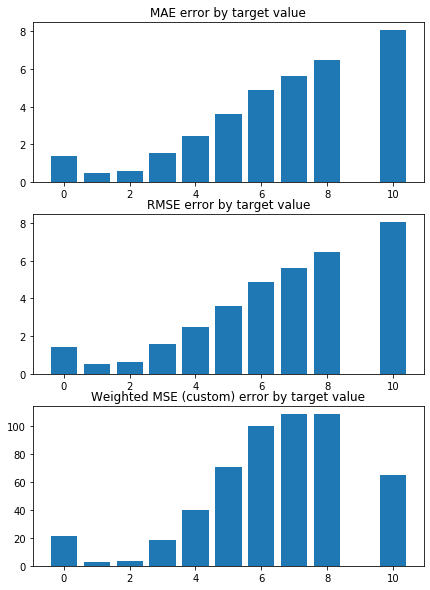

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


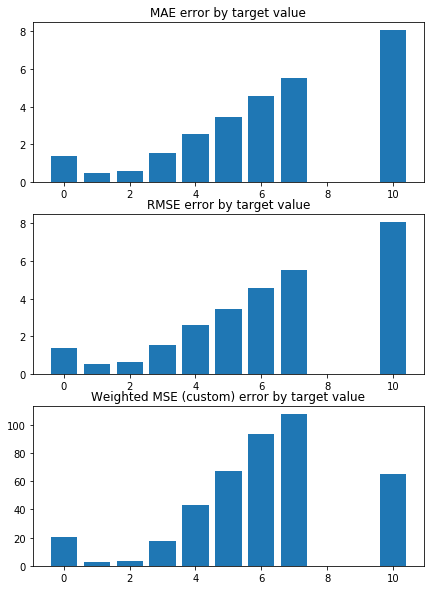

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


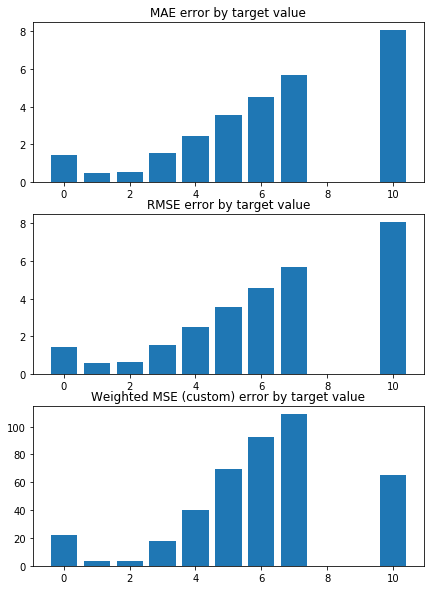

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


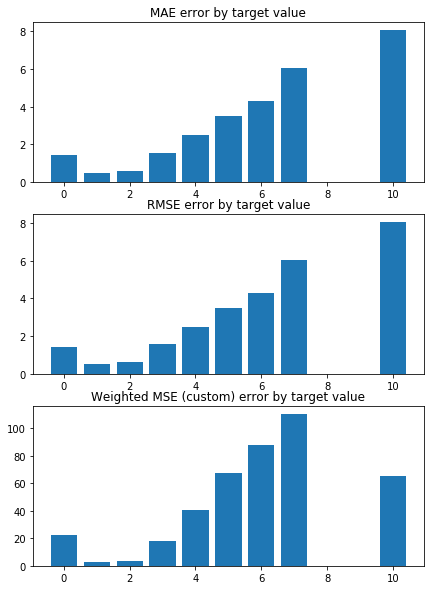

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


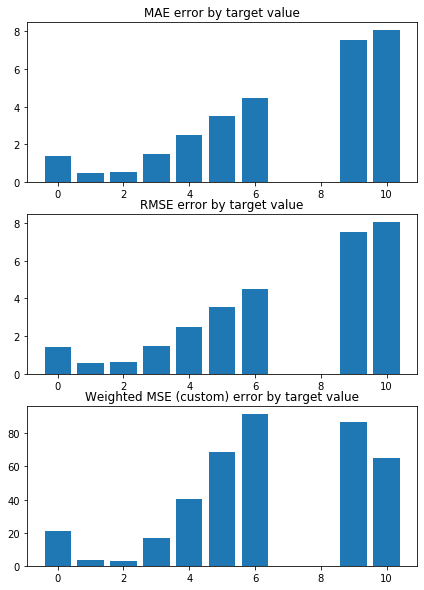

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


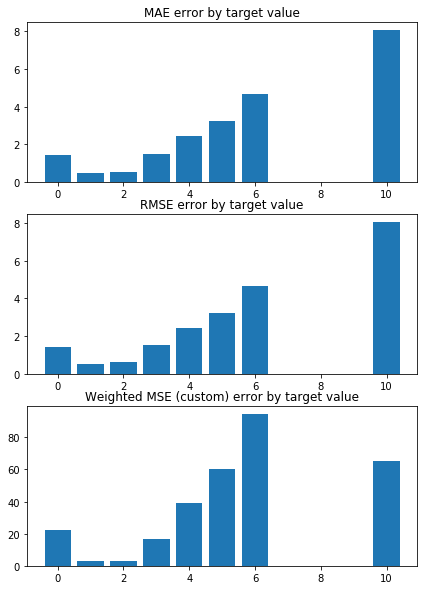

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


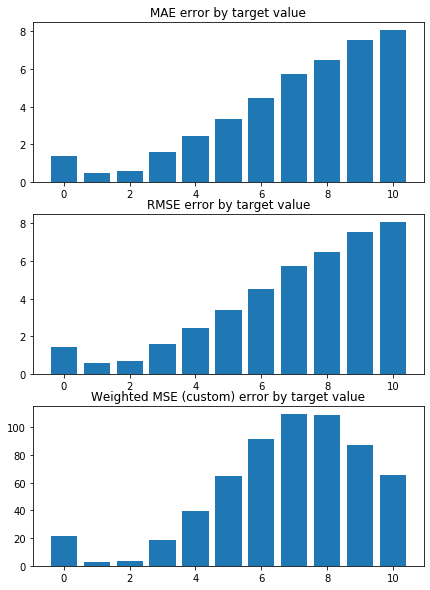

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


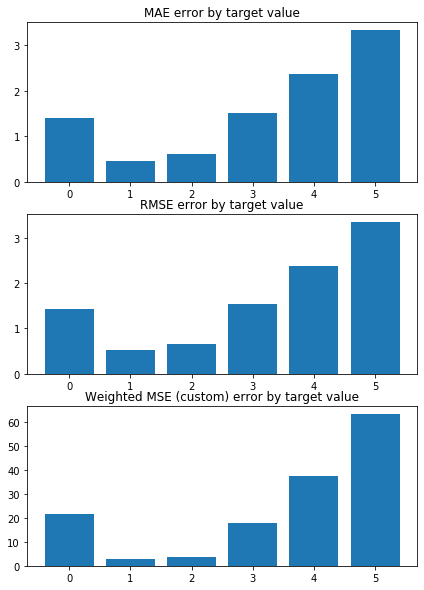

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


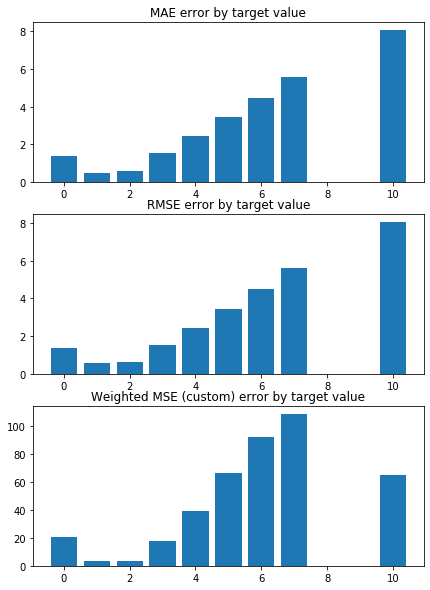

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


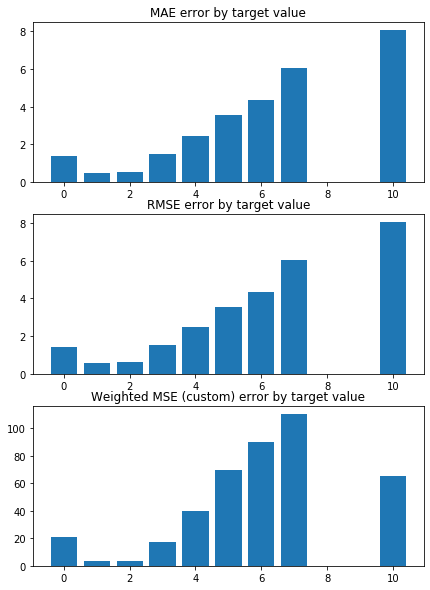

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


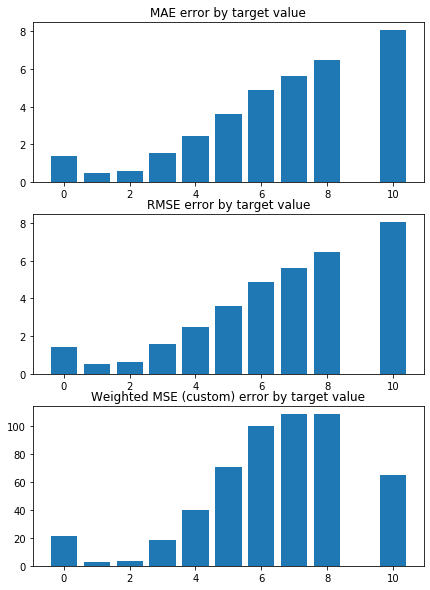

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


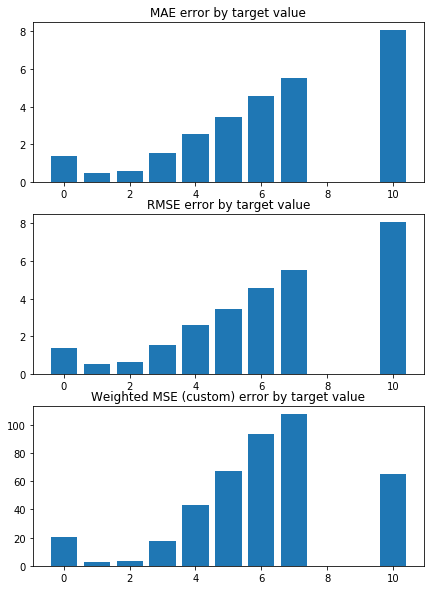

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


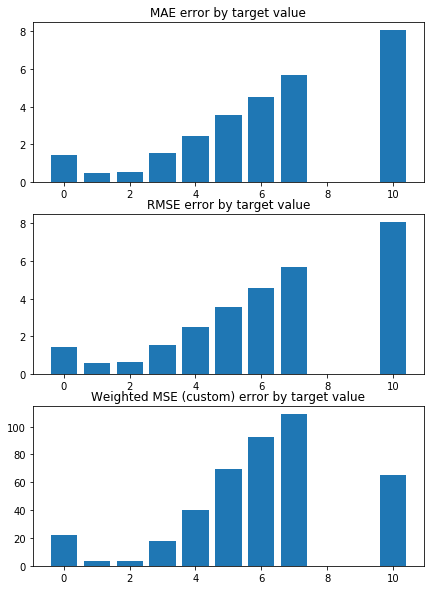

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


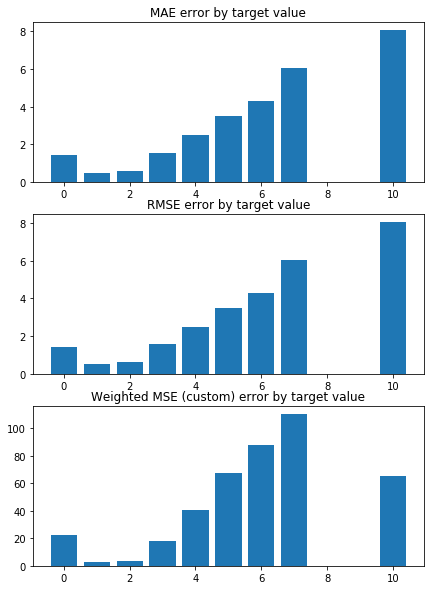

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


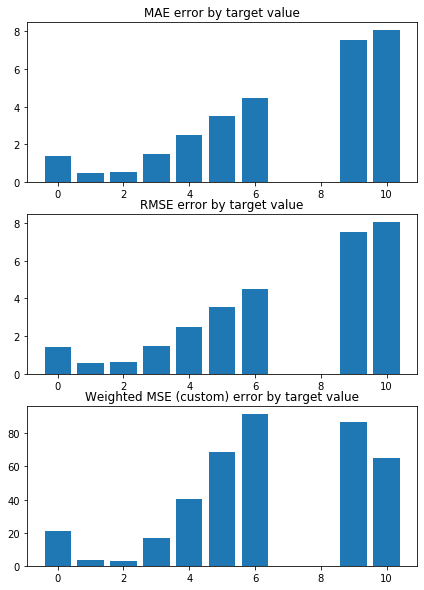

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


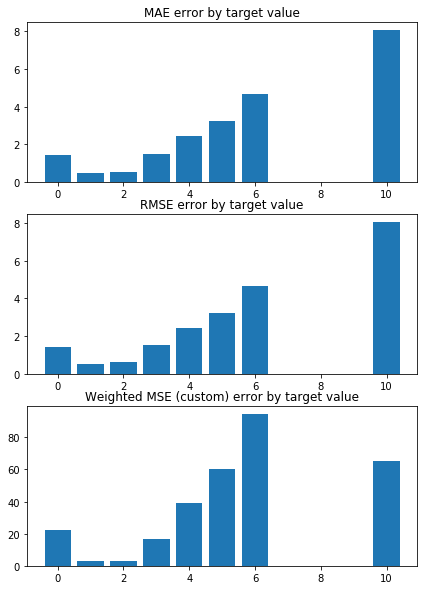

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


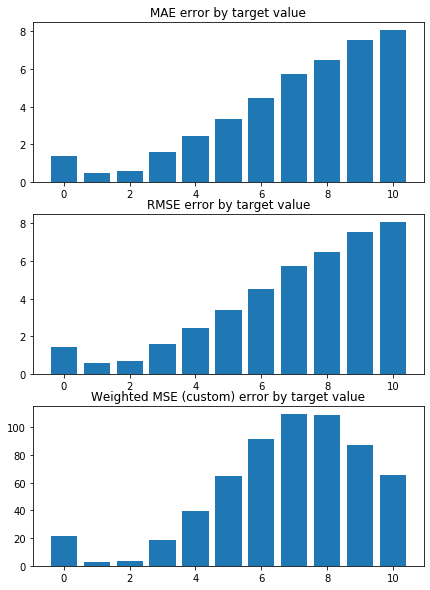

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


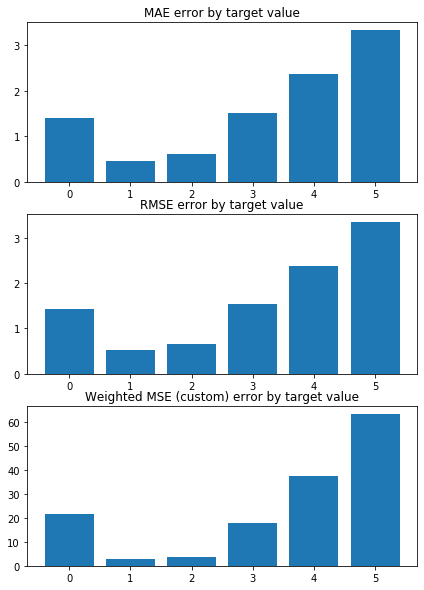

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


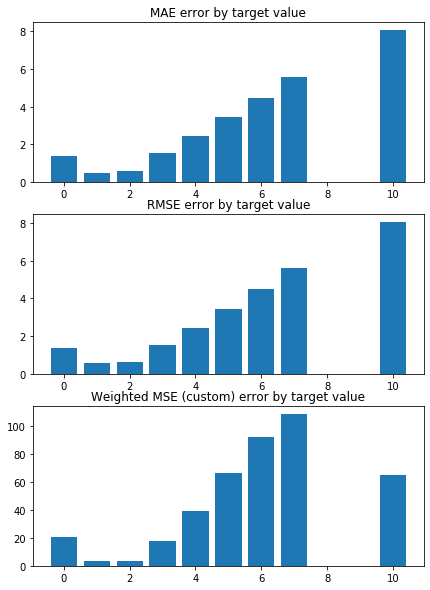

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


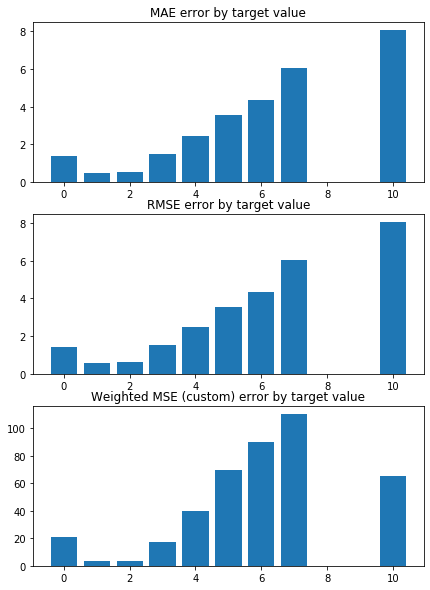

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


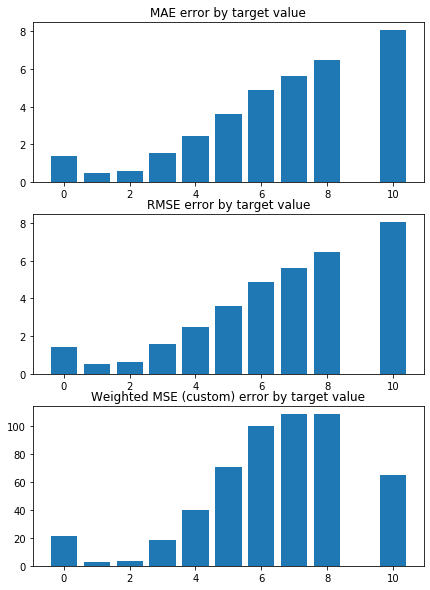

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


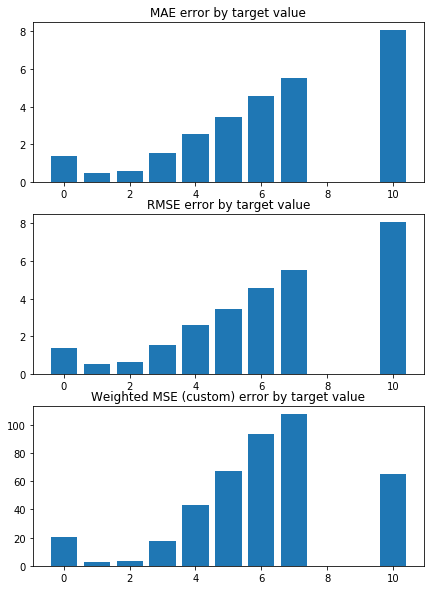

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


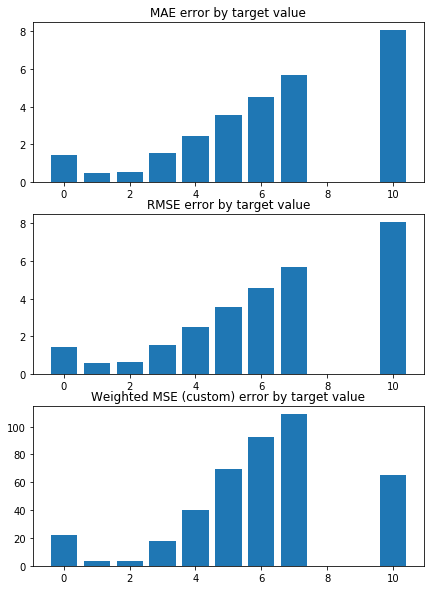

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


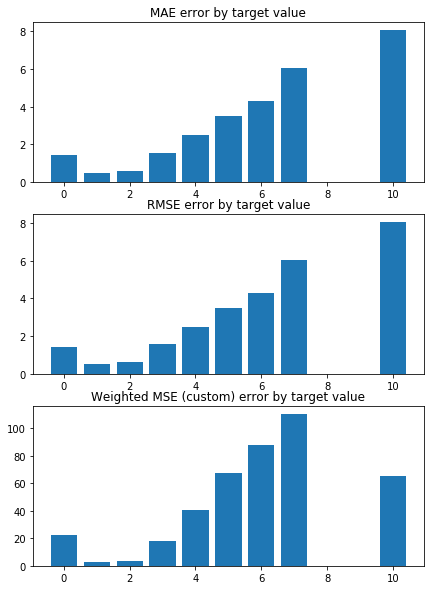

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


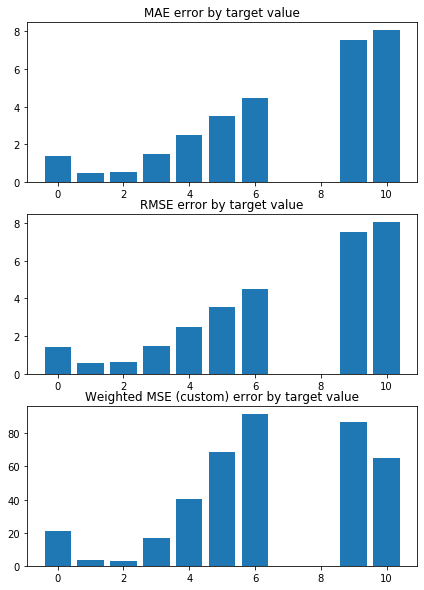

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


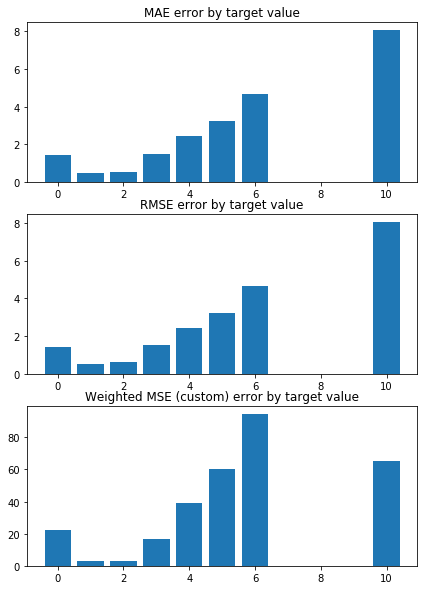

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


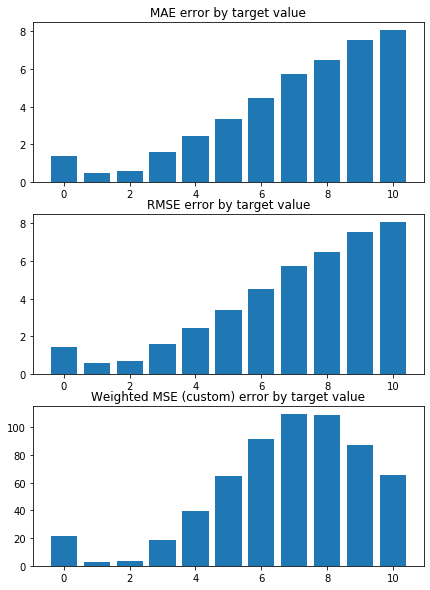

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


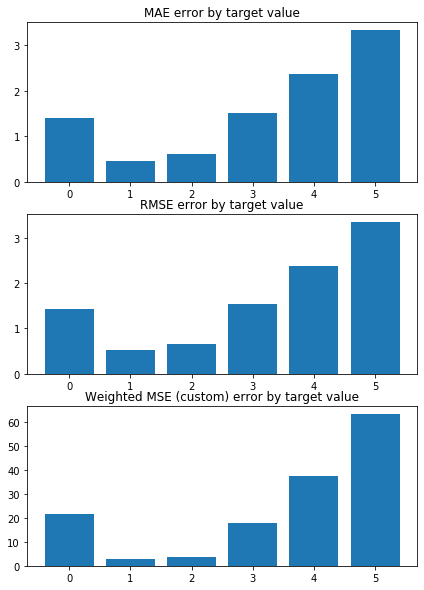

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


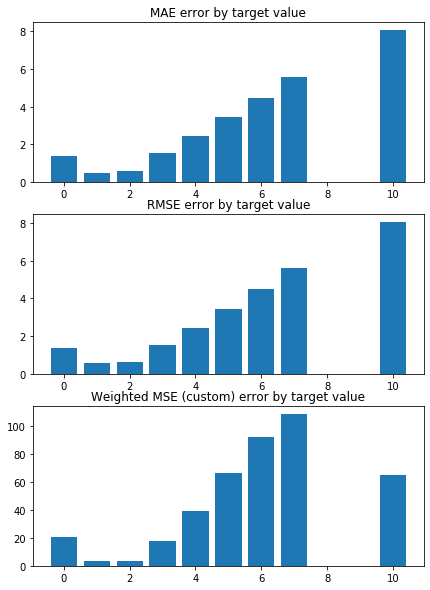

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


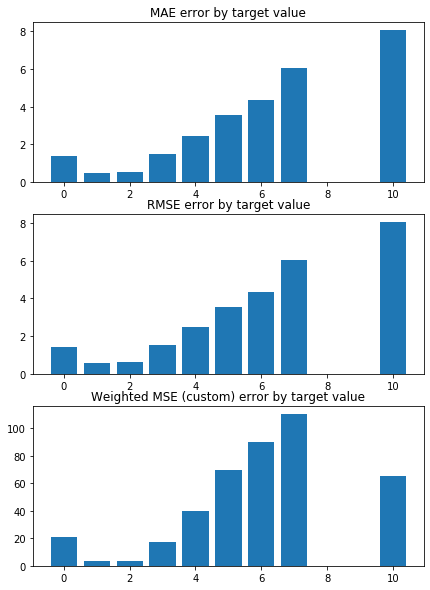

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


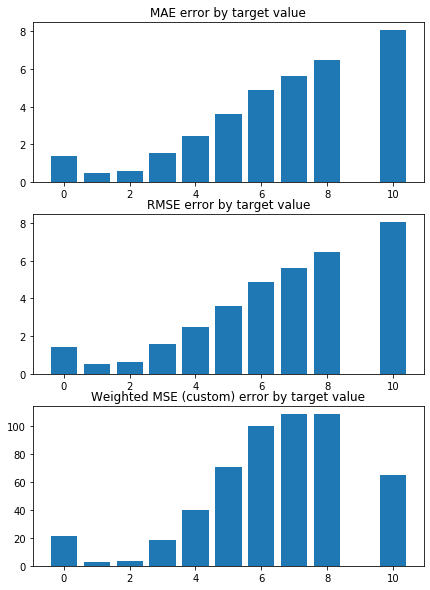

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


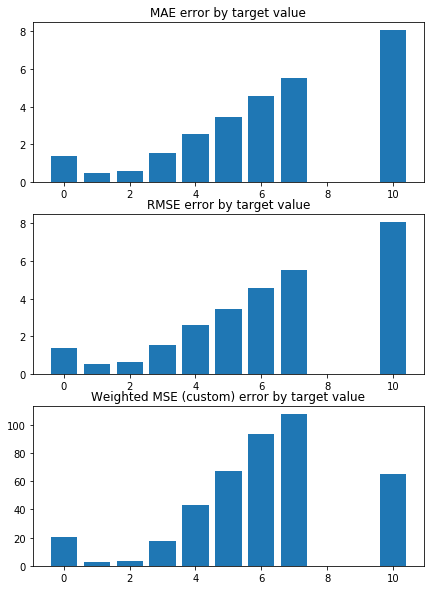

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


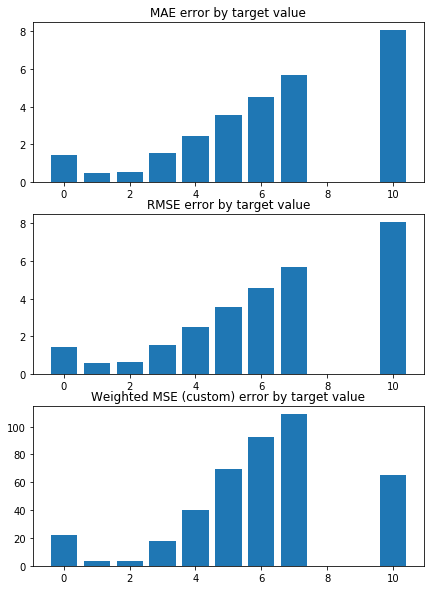

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


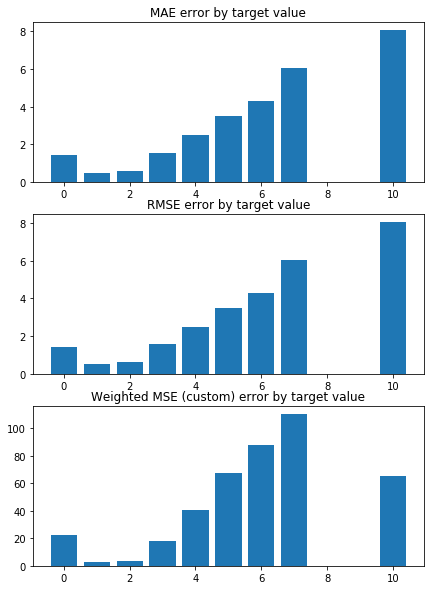

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


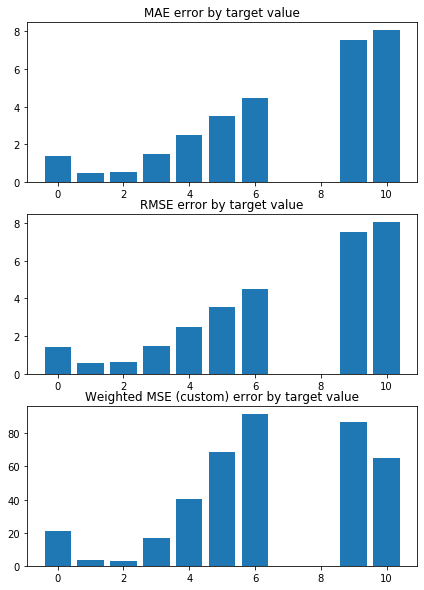

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


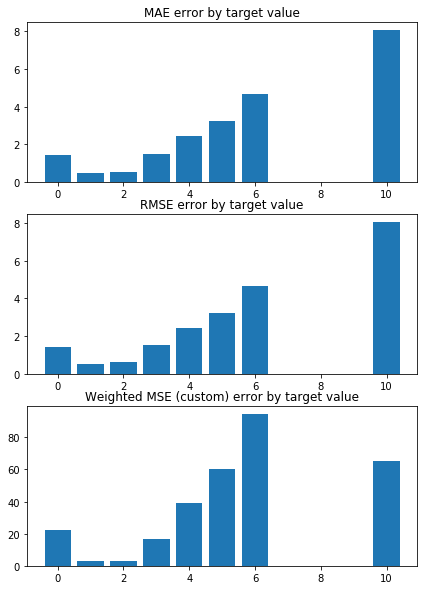

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


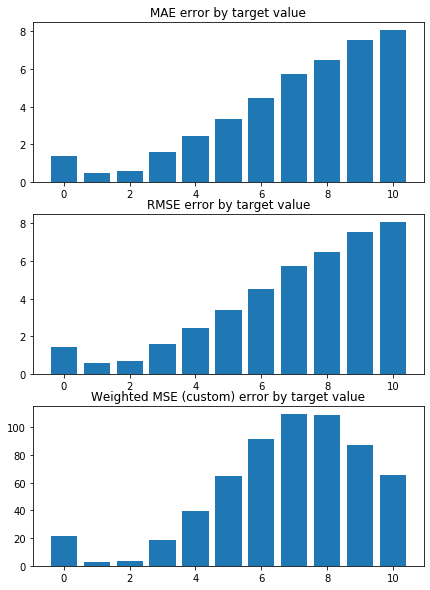

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


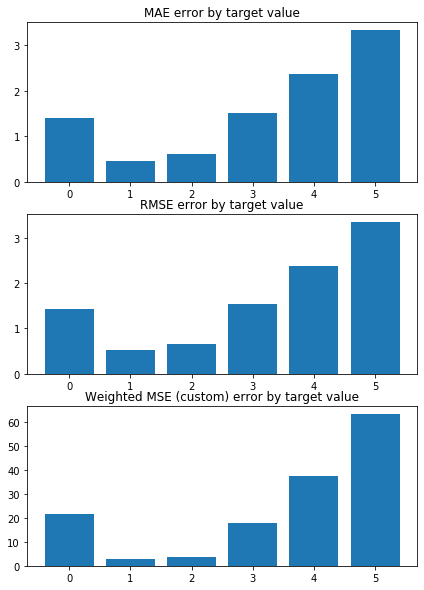

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


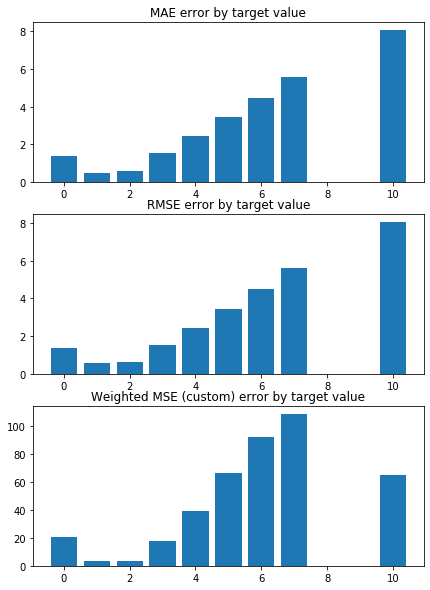

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


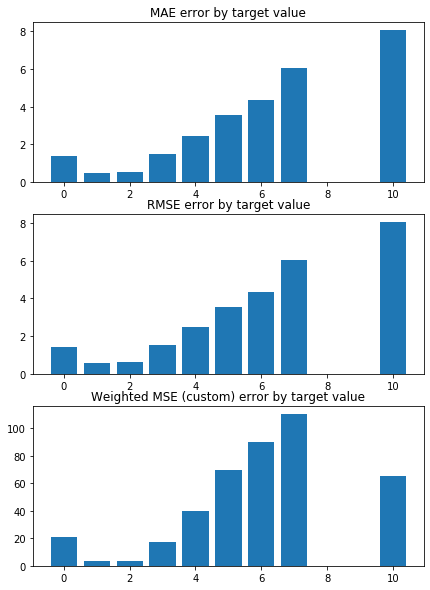

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


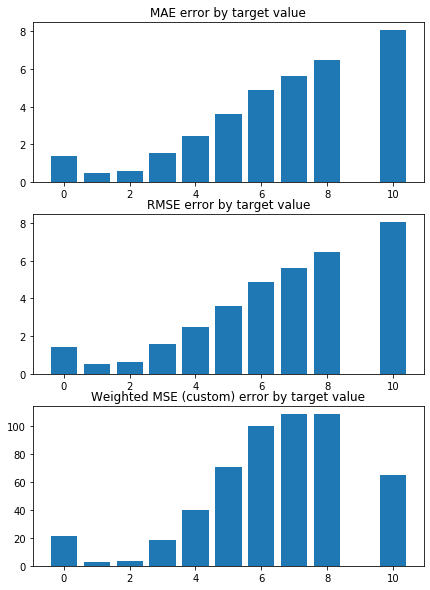

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


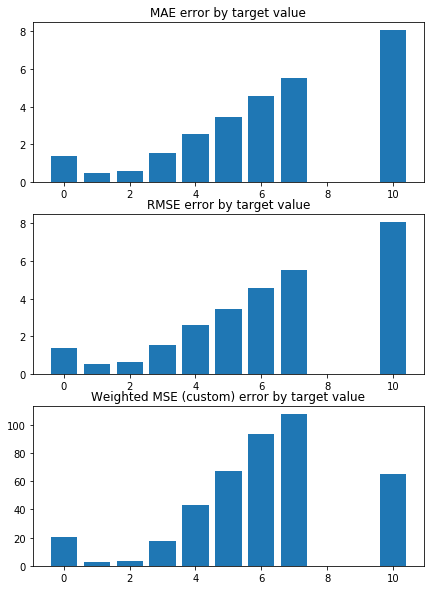

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


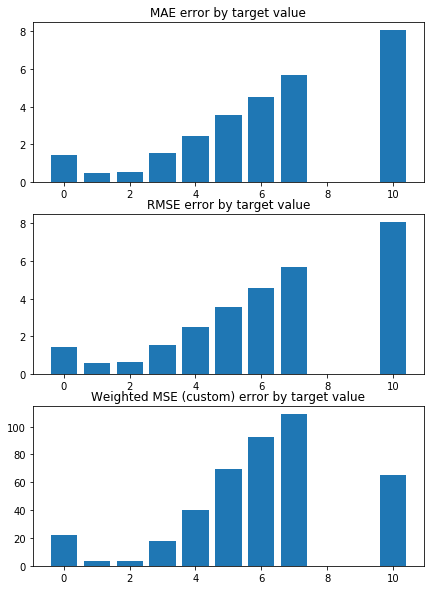

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


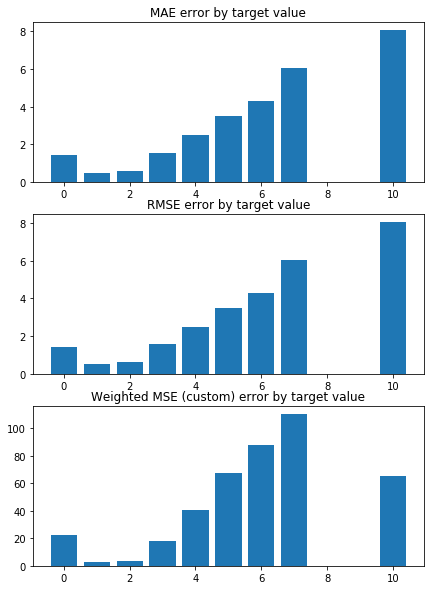

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


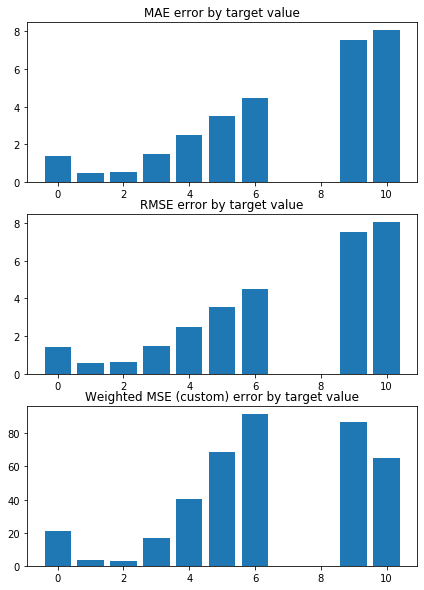

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


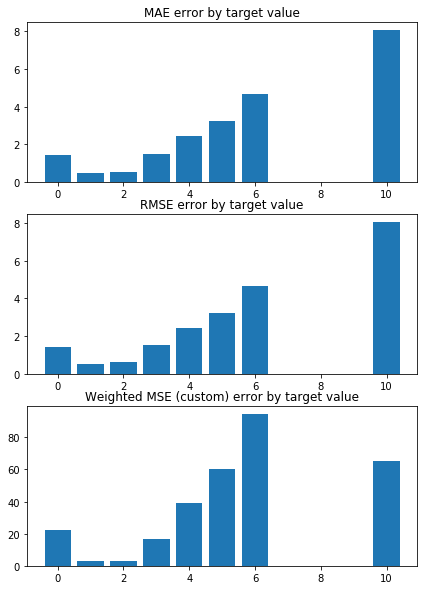

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


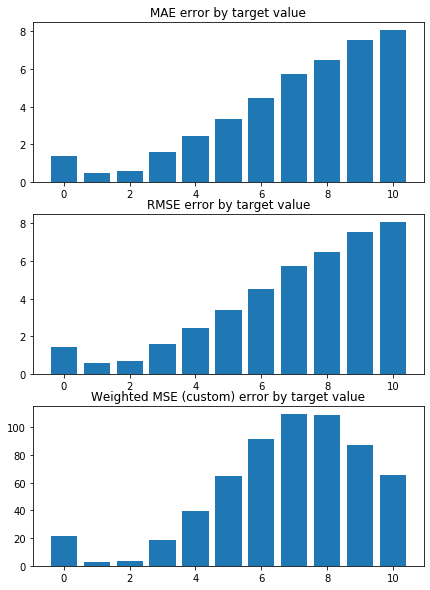

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


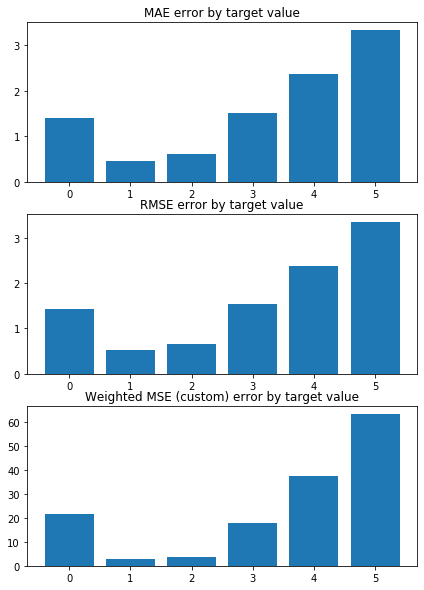

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

In [79]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 2, 0.2)
# Create linear regression object

model_name = 'LR+L1_grid'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    _ = train_test_KFold(X, y, 
                                                  model, model_name, results_pd,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)
#     results_pd
    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


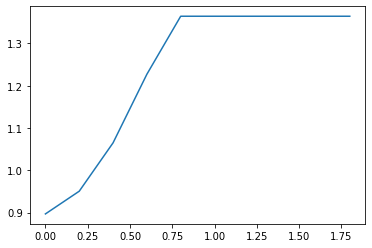

In [80]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8468856384588812 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8961159400363374 


 CONSTANT pred Error:


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4004.029051723466, tolerance: 1.157624653381885
  positive)


weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


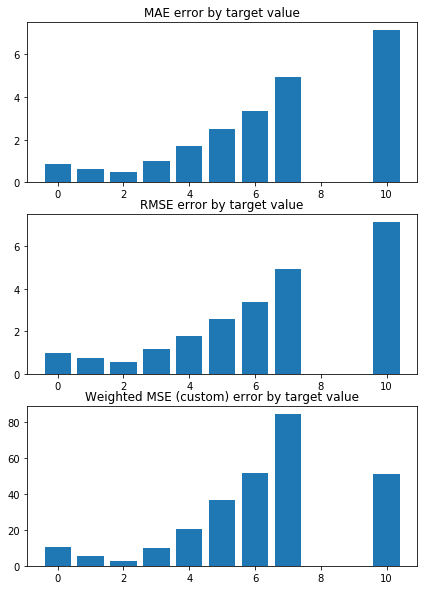

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7975789755735557 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9015923143907226 


 CONSTANT pred Error:


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3969.5561320234133, tolerance: 1.1556851426591965
  positive)


weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


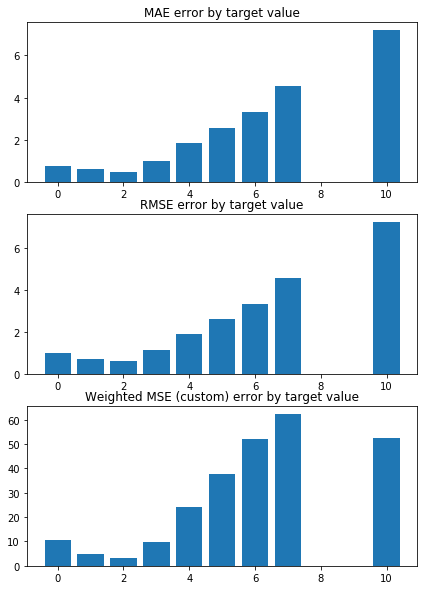

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.004914925752132 


 TRAIN PREDICTION Error


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3845.048861470346, tolerance: 1.1390143168328661
  positive)


weighted_mse_train: 0.879501649667941 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


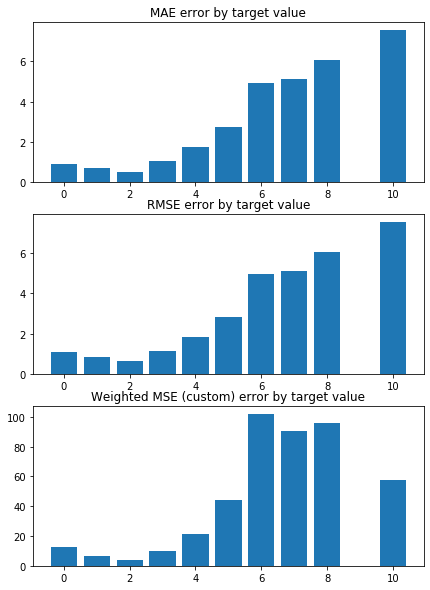

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.934034212491212 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8845870462697678 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3814.4646123975394, tolerance: 1.134086969012138
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

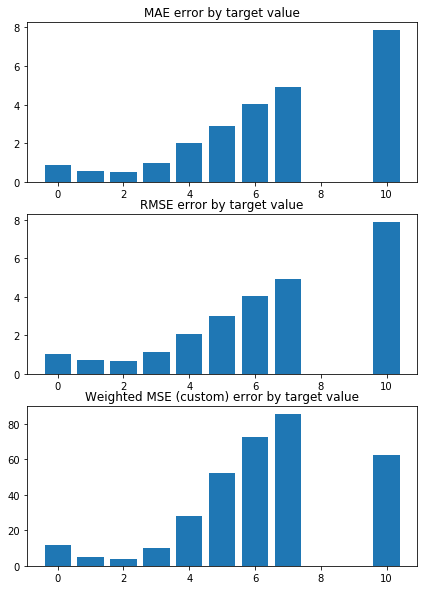

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773369578010445 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794706163382533 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3912.828425598824, tolerance: 1.1411477756974782
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

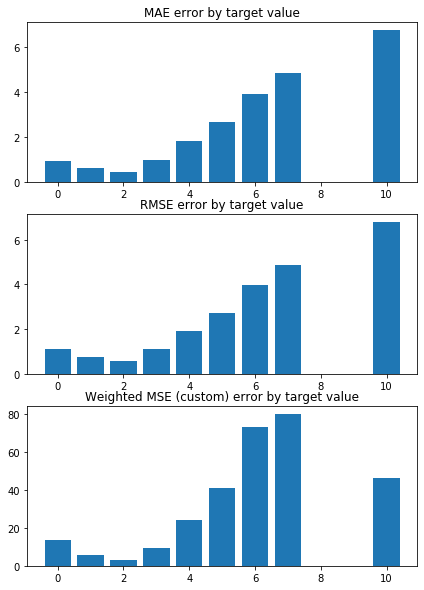

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036418856153635 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8879341090007888 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3918.1003957369103, tolerance: 1.1451602222857147
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounte

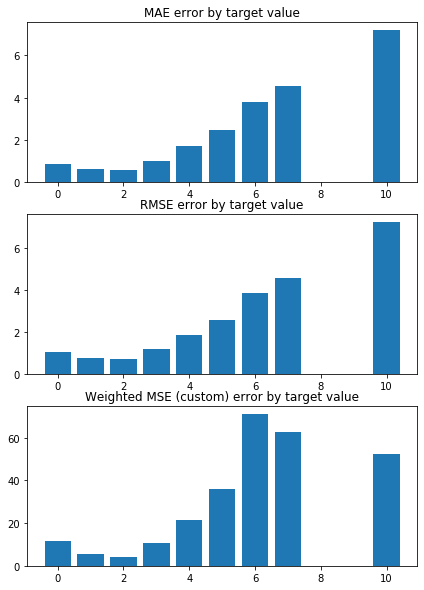

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9041413416069641 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8919974925058977 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3972.552892926463, tolerance: 1.162511723331466
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

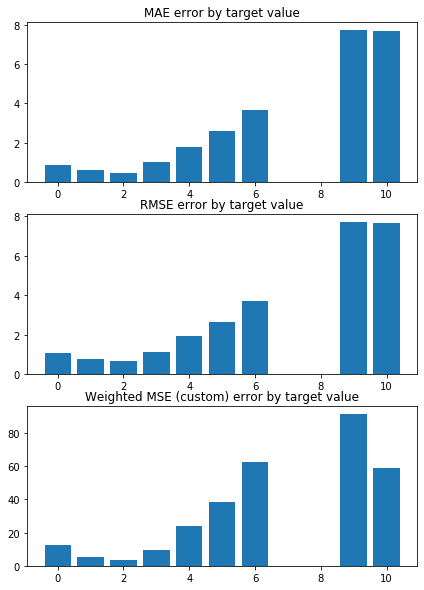

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.888886477901424 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8927441442794177 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3988.8801418427015, tolerance: 1.1623169966386562
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounte

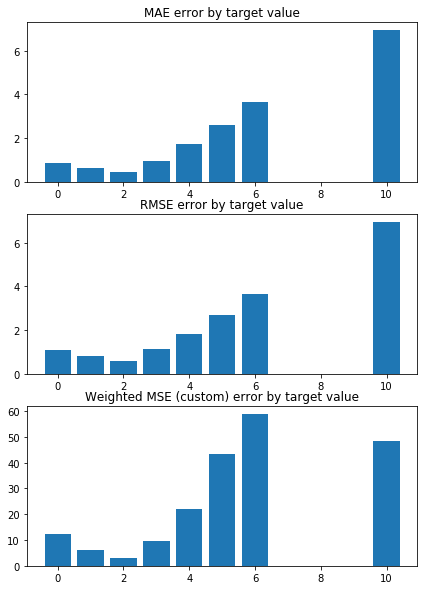

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9602303846608801 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8825039435387346 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3826.0836214058313, tolerance: 1.1313881385546216
  positive)


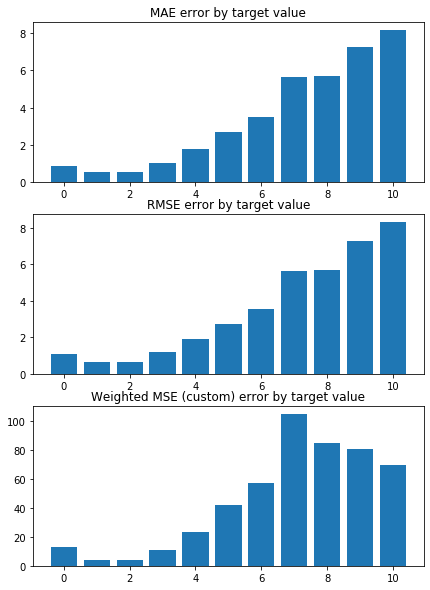

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7526194365238811 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9096443314575876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4091.194952256408, tolerance: 1.181346870110178
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

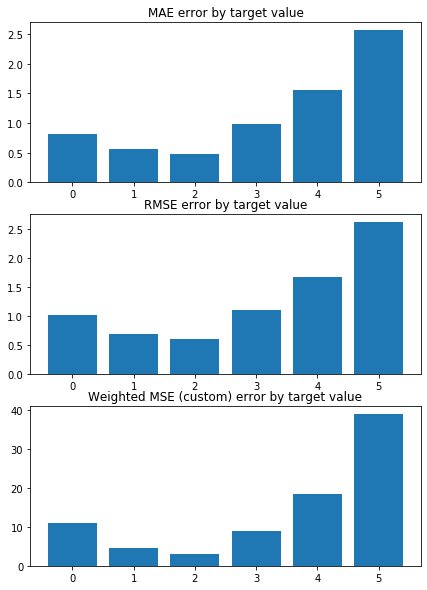

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693833459339656 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4810645696208364 

Root of MSE on Test: 0.95 
 1.2169899628266605 

Variance score on Test: 0.08 
 r2_test: 0.3158778157232478 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.425175  0.280112 -0.275135 -0.187430 -0.164903 -0.150293 -0.147859   
1 -0.414835  0.320945 -0.302229 -0.221283 -0.161158 -0.139119 -0.209257   
2 -0.376884  0.230790 -0.285298 -0.178649 -0.175687 -0.153890 -0.095870   
3 -0.389100  0.279021 -0.318000 -0.209905 -0.177116 -0.156682 -0.163545   
4 -0.365348  0.268475 -0.291039 -0.223090 -0.171286 -0.148516 -0.157718   
5 -0.403140  0.252983 -0.280585 -0.209485 -0.173189 -0.140690 -0.138454   
6 -0.388021  0.340447 -0.283263 -0.185518 -0.188349 -0.161527 -0.211988   
7 -0.426858  0.329119 -0.299364 -0.

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


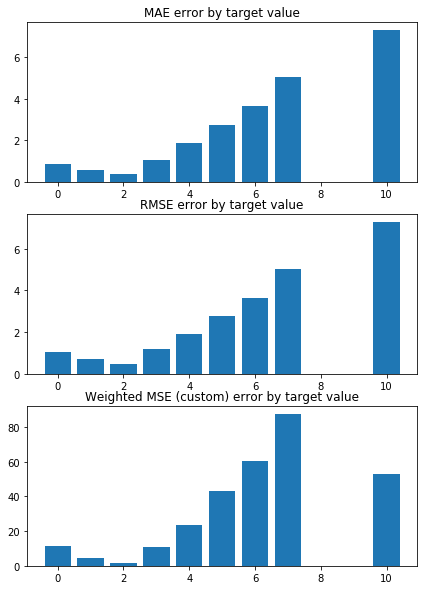

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8030743309146491 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9110999876652138 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


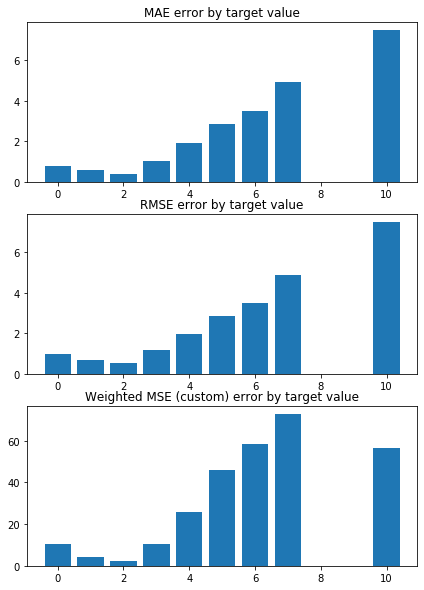

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9793827347999753 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8903667569380155 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


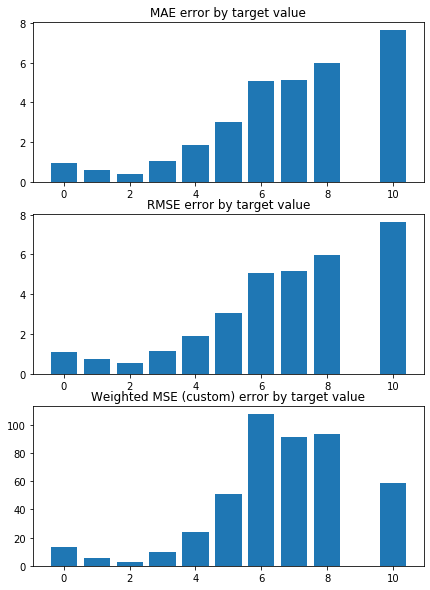

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9288927321115636 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8939275128713458 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


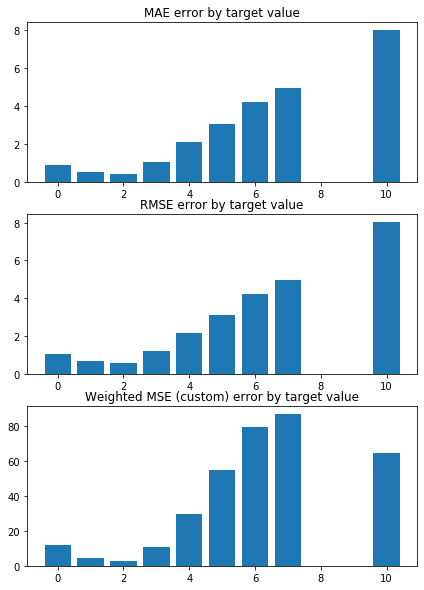

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9942058874028032 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8908321834949929 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


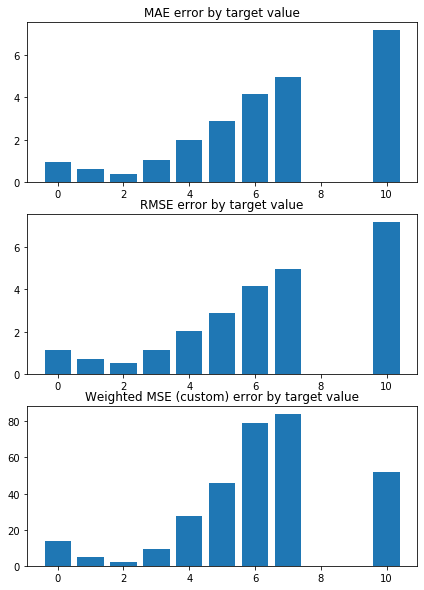

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9229602575834551 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9000967654015809 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


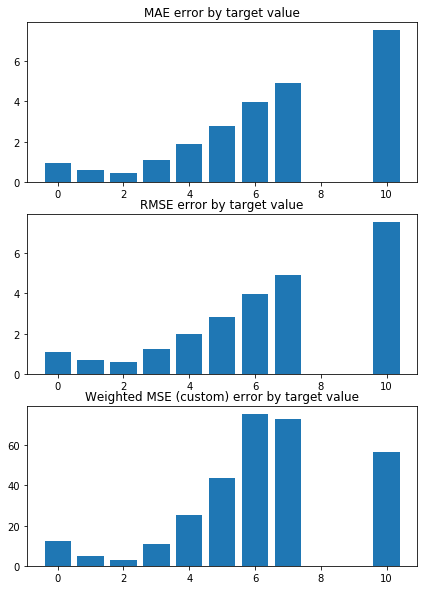

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8906897179514679 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8997282077121332 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


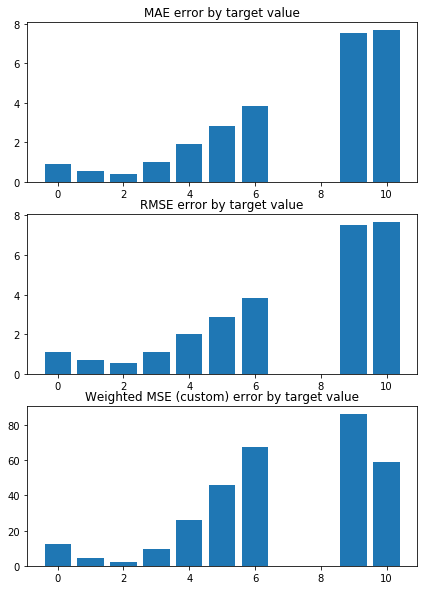

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8889161247820233 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9025504248613174 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


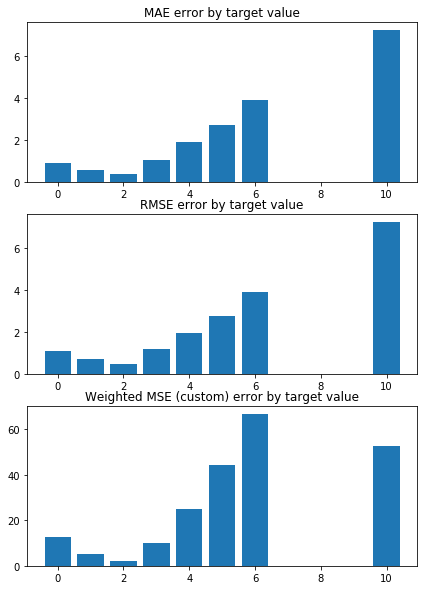

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.972712795112939 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8908076501529965 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


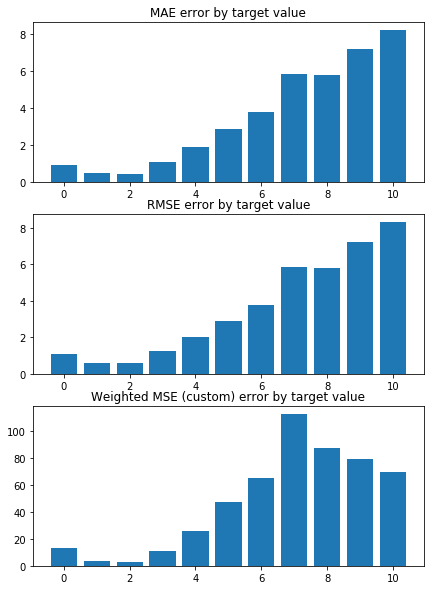

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7665635793107497 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9190493320720652 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


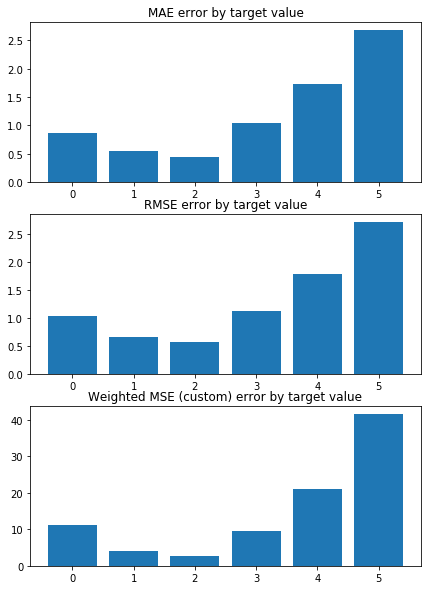

Weighted Mean squared error on Train: 0.90 
 MSE mean train: 1.5096473236087813 

Mean squared error on Test: 0.90 
 MSE mean test:  1.5141534565535353 

Root of MSE on Test: 0.95 
 1.230509429688995 

Variance score on Test: 0.07 
 r2_test: 0.30048275528262713 

wMSE_train 0.9
wMSE_test 0.9
MSE_train 1.51
MSE_test 1.51
MAE_train 0.89
MAE_test 0.79
r2_test 0.3
      Chriz  H3K36me3   H3K4me1     CP190       GAF   H3K9me3  H3K36me1  \
0 -0.361297 -0.172339 -0.169634 -0.066344 -0.065306  0.064375      -0.0   
1 -0.346724 -0.185449 -0.198541 -0.067896 -0.059055  0.051424      -0.0   
2 -0.340030 -0.196373 -0.172919 -0.078205 -0.073792  0.051913      -0.0   
3 -0.339825 -0.201367 -0.191902 -0.071576 -0.066099  0.042636      -0.0   
4 -0.340008 -0.186851 -0.194544 -0.065182 -0.063100  0.048048      -0.0   
5 -0.357479 -0.174798 -0.199684 -0.061848 -0.054670  0.049149      -0.0   
6 -0.346570 -0.180798 -0.173344 -0.083163 -0.081467  0.066218      -0.0   
7 -0.361895 -0.173539 -0.188878 -0.07

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


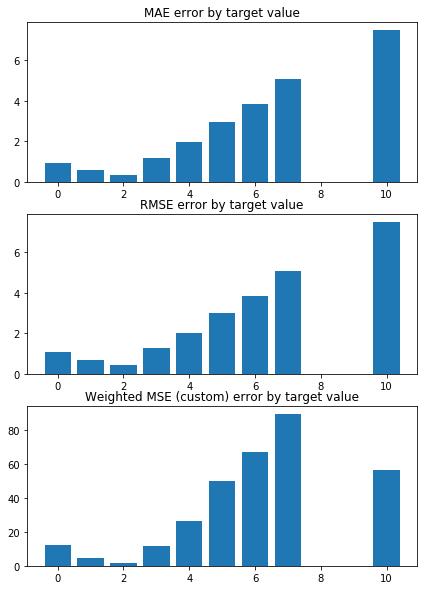

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8465829516790856 


 TRAIN PREDICTION Error
weighted_mse_train: 0.958649004913108 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


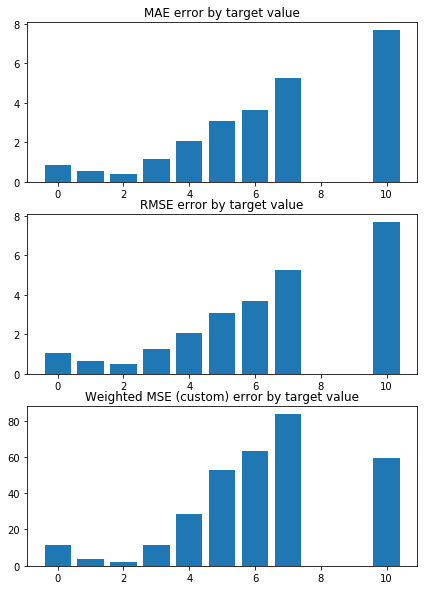

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0024574858156863 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9408994270276345 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


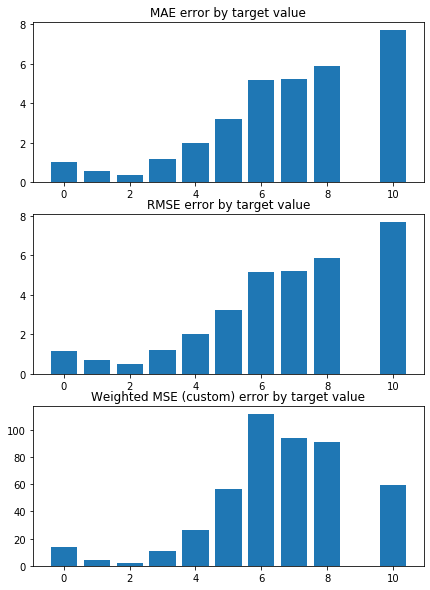

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9617035863924087 


 TRAIN PREDICTION Error
weighted_mse_train: 0.940356725796675 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


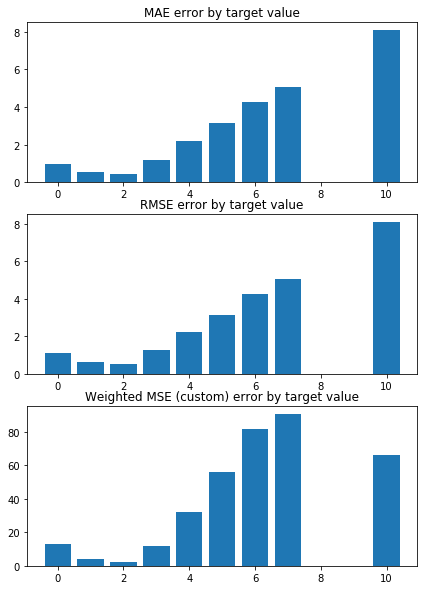

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0446605786921204 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9377282176409865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


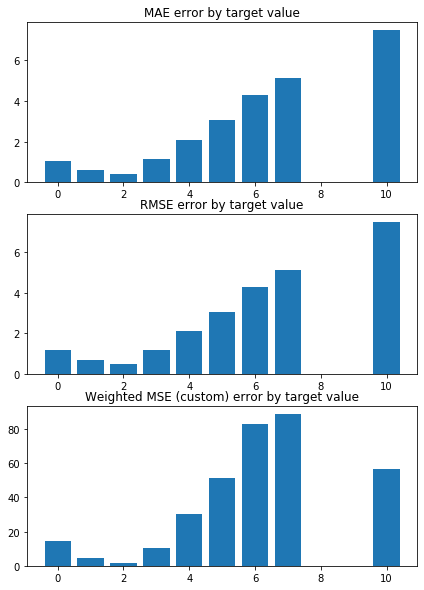

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734566210384338 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9455462464316167 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


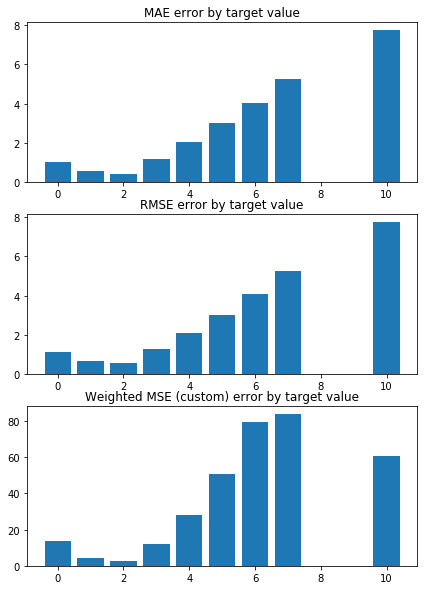

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9268417983833402 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9510225997170333 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


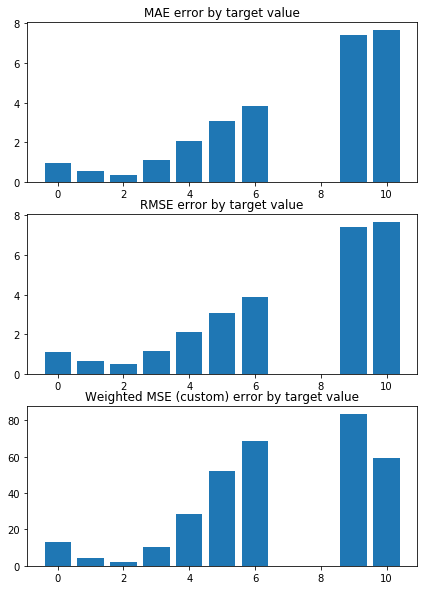

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9359040932805903 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9503636012862704 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


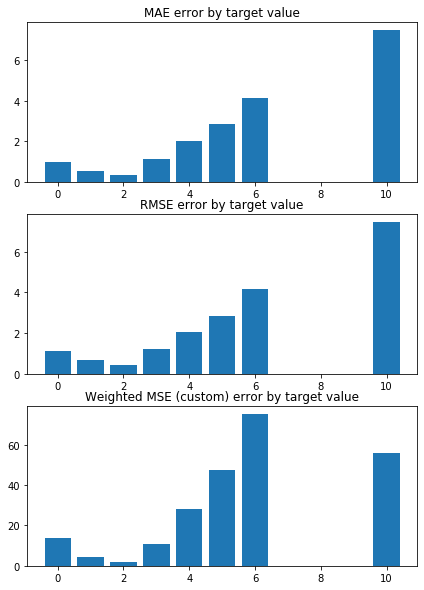

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0310802186869075 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9391899024875072 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


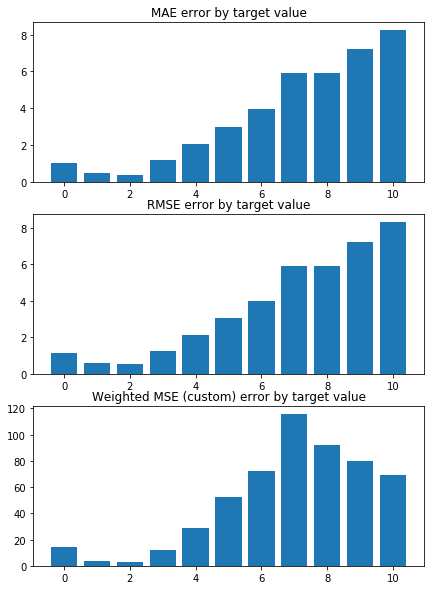

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8341735401717396 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9662091131921546 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


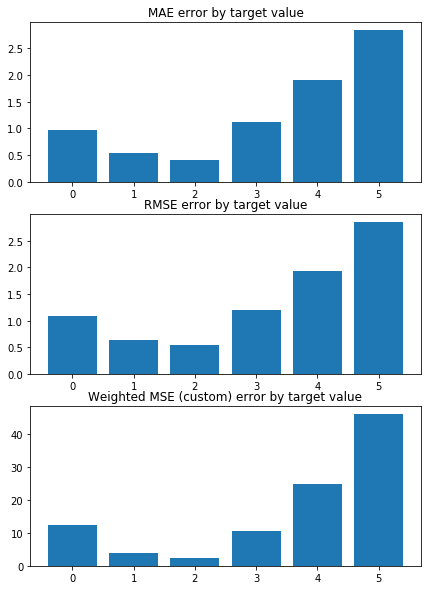

Weighted Mean squared error on Train: 0.95 
 MSE mean train: 1.590623351524329 

Mean squared error on Test: 0.95 
 MSE mean test:  1.5945320934930722 

Root of MSE on Test: 0.97 
 1.2627478344836203 

Variance score on Test: 0.07 
 r2_test: 0.262356114909088 

wMSE_train 0.95
wMSE_test 0.95
MSE_train 1.59
MSE_test 1.59
MAE_train 0.93
MAE_test 0.85
r2_test 0.26
      Chriz   H3K4me1  H3K36me3  RNA-polymerase-II   H3K4me2       GAF  CP190  \
0 -0.379450 -0.126267 -0.073104          -0.022698 -0.020806 -0.001539   -0.0   
1 -0.367329 -0.147189 -0.085605          -0.000000 -0.038365 -0.000000   -0.0   
2 -0.366746 -0.128212 -0.093666          -0.017238 -0.026914 -0.009341   -0.0   
3 -0.372233 -0.145039 -0.099378          -0.000000 -0.028502 -0.003993   -0.0   
4 -0.363644 -0.145322 -0.087459          -0.006418 -0.028797 -0.001682   -0.0   
5 -0.374387 -0.142594 -0.073367          -0.030313 -0.015542 -0.000000   -0.0   
6 -0.372969 -0.118660 -0.071579          -0.000000 -0.055461 -0.01651

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


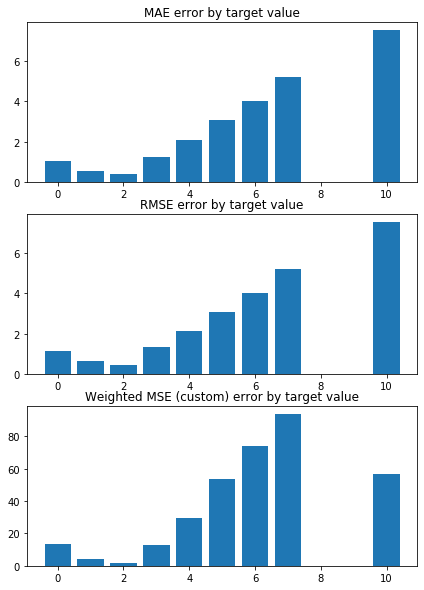

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8959898938840639 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0164974413213799 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


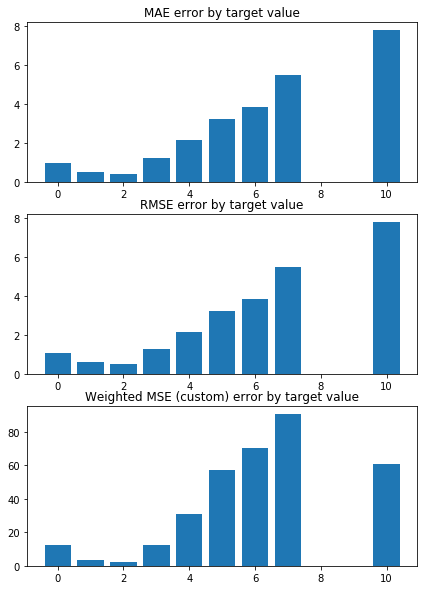

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0501018931895578 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9998027601909535 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


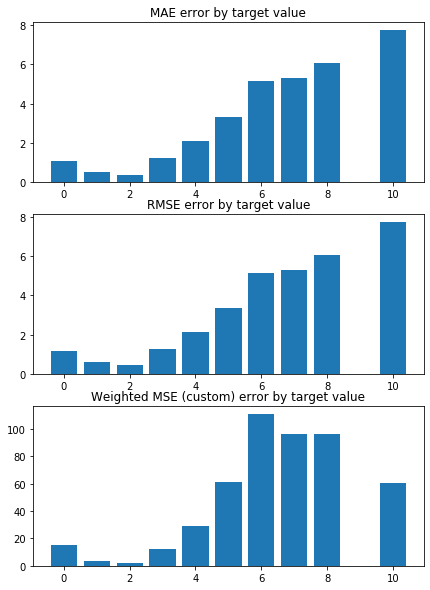

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0025756470779255 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9969669900847038 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


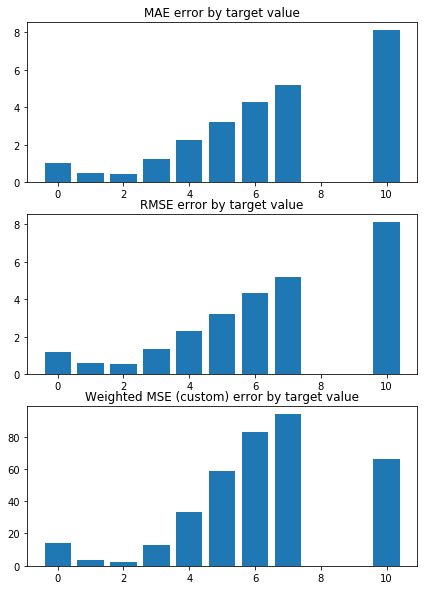

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.096091550317256 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9956846541555241 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


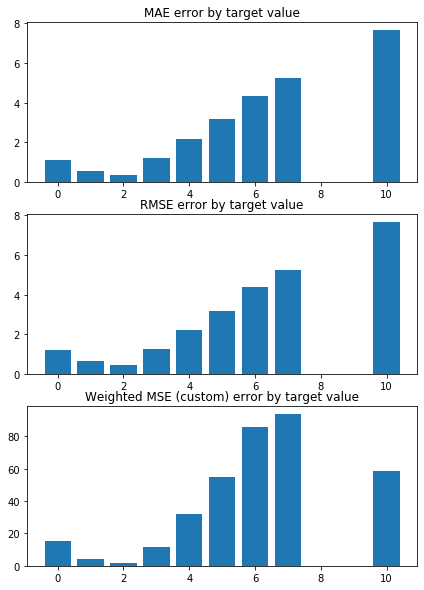

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0253594113479543 


 TRAIN PREDICTION Error
weighted_mse_train: 1.000992123276569 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


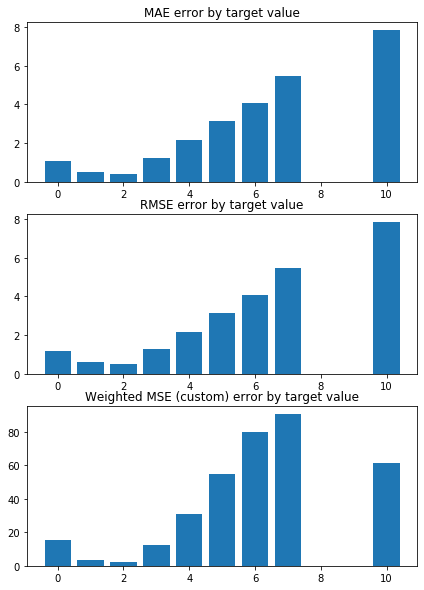

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.988444913055268 


 TRAIN PREDICTION Error
weighted_mse_train: 1.007714199863411 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


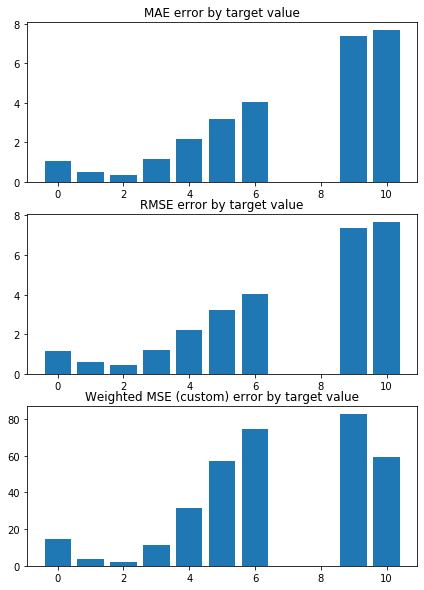

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9883614862187943 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0064319446015402 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


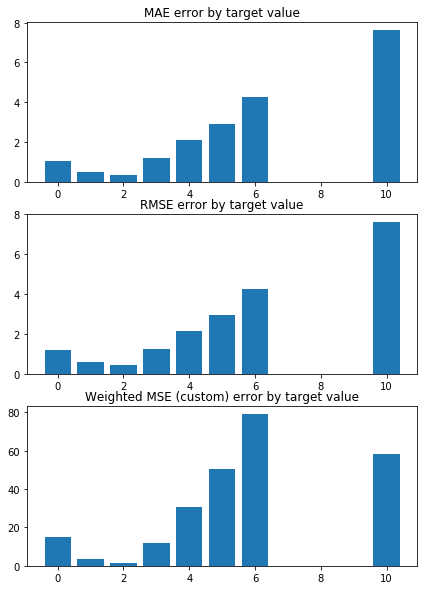

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0942593762208073 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9938375513176276 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


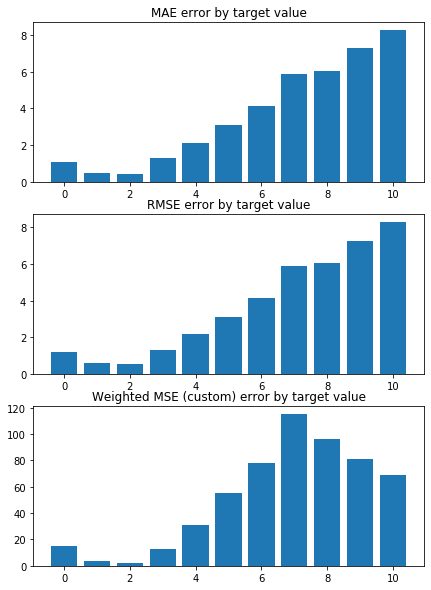

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9015719815075179 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0206143534170886 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


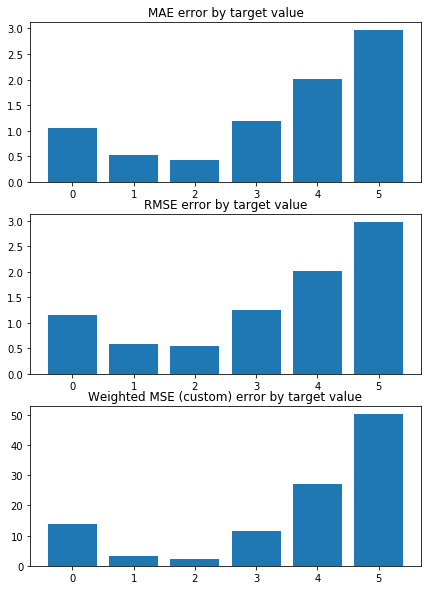

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 1.6735697583873166 

Mean squared error on Test: 1.01 
 MSE mean test:  1.6764563057507904 

Root of MSE on Test: 1.00 
 1.29478040831285 

Variance score on Test: 0.06 
 r2_test: 0.22341316720367366 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 1.67
MSE_test 1.68
MAE_train 0.96
MAE_test 0.89
r2_test 0.22
      Chriz   H3K4me2  RNA-polymerase-II   H3K4me1  BEAF-32  CP190  GAF  CTCF  \
0 -0.332747 -0.092174          -0.018322 -0.016498     -0.0   -0.0 -0.0  -0.0   
1 -0.326323 -0.110754          -0.000000 -0.032536     -0.0   -0.0 -0.0  -0.0   
2 -0.326266 -0.107044          -0.014337 -0.017258     -0.0   -0.0 -0.0  -0.0   
3 -0.333929 -0.103121          -0.000000 -0.031704     -0.0   -0.0 -0.0  -0.0   
4 -0.326415 -0.103730          -0.002442 -0.031904     -0.0   -0.0 -0.0  -0.0   
5 -0.328386 -0.086638          -0.026710 -0.030354     -0.0   -0.0 -0.0  -0.0   
6 -0.322068 -0.129412          -0.000000 -0.017718     -0.0   -0.0 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


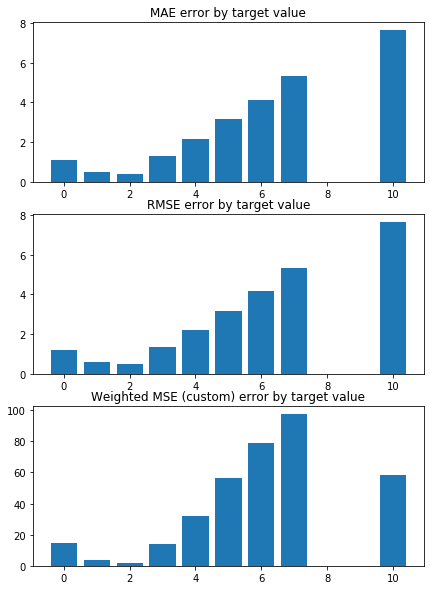

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9577973233052844 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0772867626058018 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


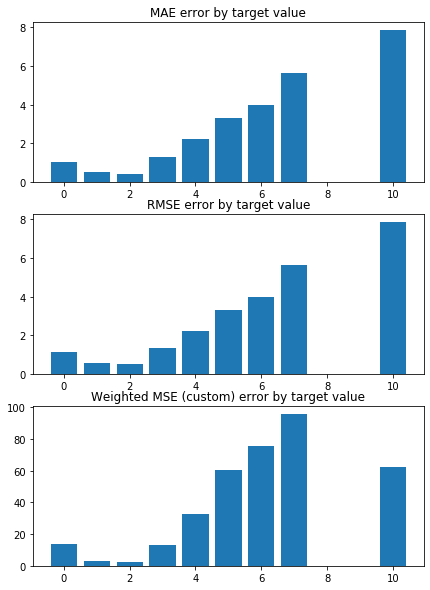

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1004970593962486 


 TRAIN PREDICTION Error
weighted_mse_train: 1.059515140509327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


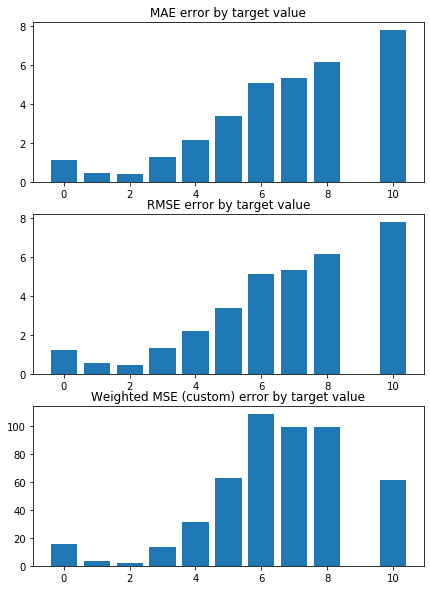

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0516391801850586 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0569183252061944 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


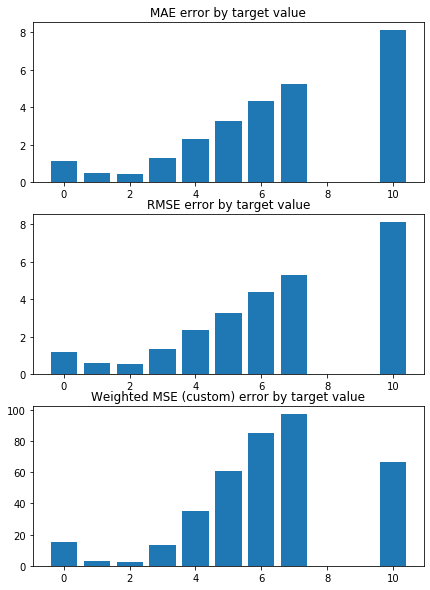

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.158410783121623 


 TRAIN PREDICTION Error
weighted_mse_train: 1.055993799515288 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


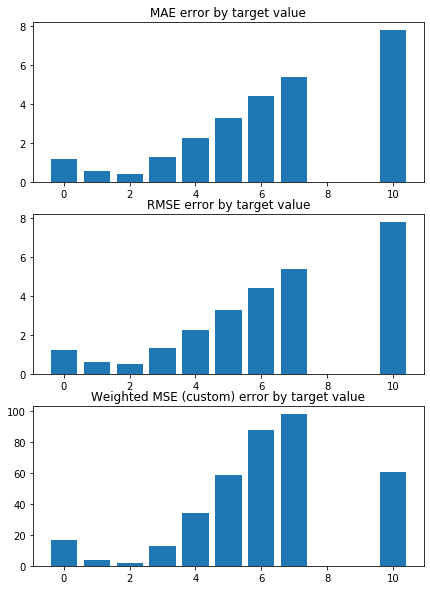

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0819394750170301 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0617309449923977 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


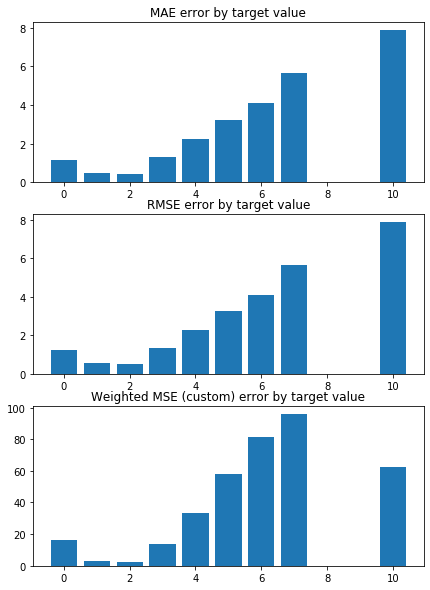

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.042935392573405 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0656244741722276 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


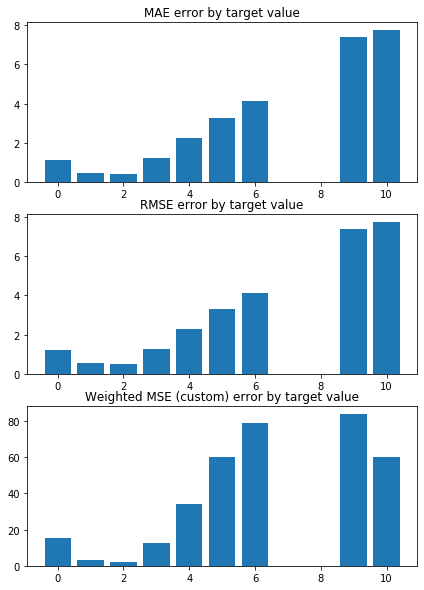

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.049444337428953 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0673001077285378 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


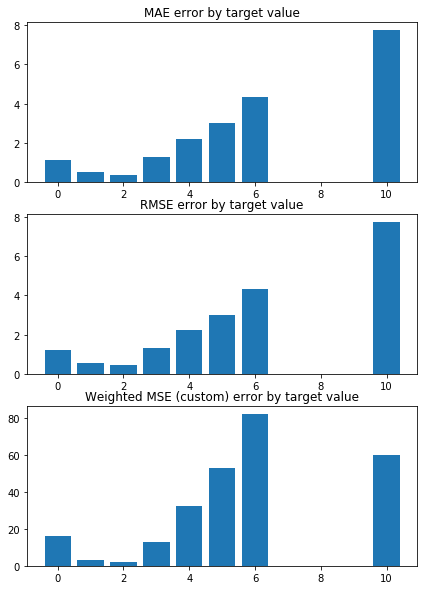

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.143324978512364 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0483229279924815 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


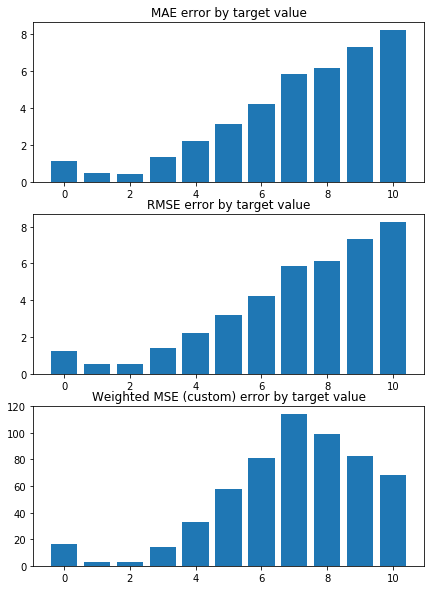

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9719617015208635 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0806378809172086 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


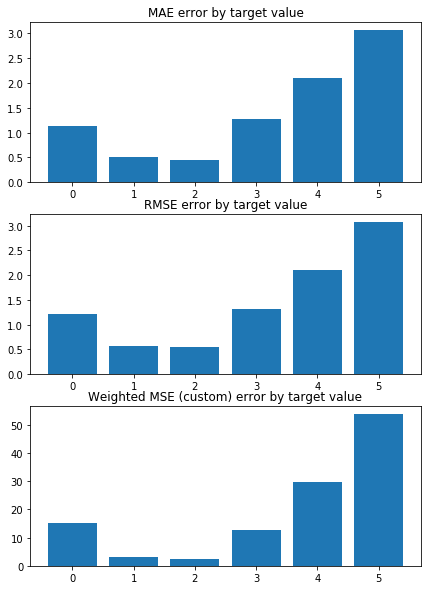

Weighted Mean squared error on Train: 1.06 
 MSE mean train: 1.7576288278352028 

Mean squared error on Test: 1.06 
 MSE mean test:  1.759002724413359 

Root of MSE on Test: 1.03 
 1.326274000504179 

Variance score on Test: 0.06 
 r2_test: 0.18408618754594872 

wMSE_train 1.06
wMSE_test 1.06
MSE_train 1.76
MSE_test 1.76
MAE_train 1.01
MAE_test 0.94
r2_test 0.18
      Chriz   H3K4me2  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  \
0 -0.275124 -0.065614      -0.0      -0.0       0.0      -0.0     -0.0   
1 -0.256863 -0.089896      -0.0      -0.0       0.0      -0.0     -0.0   
2 -0.271791 -0.079794      -0.0      -0.0       0.0      -0.0     -0.0   
3 -0.274578 -0.082630      -0.0      -0.0       0.0      -0.0     -0.0   
4 -0.260658 -0.082772      -0.0      -0.0       0.0      -0.0     -0.0   
5 -0.267706 -0.081088      -0.0      -0.0       0.0      -0.0     -0.0   
6 -0.258225 -0.093187      -0.0      -0.0       0.0      -0.0     -0.0   
7 -0.272647 -0.075007      -0.0      -0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


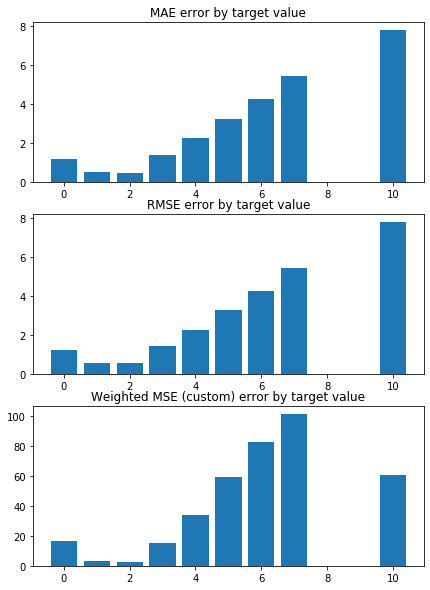

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.03805474168633 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1524764641268739 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


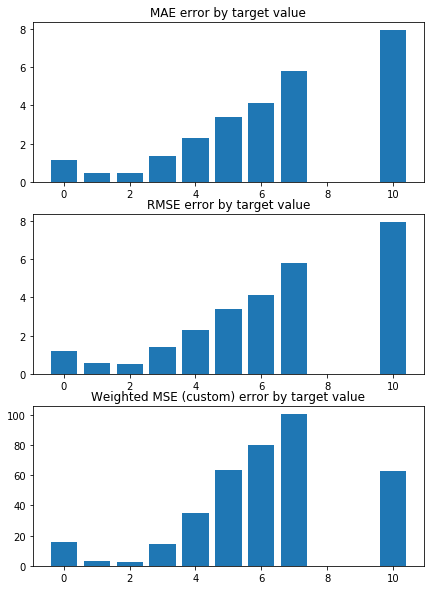

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1668056153010782 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1341187564914355 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


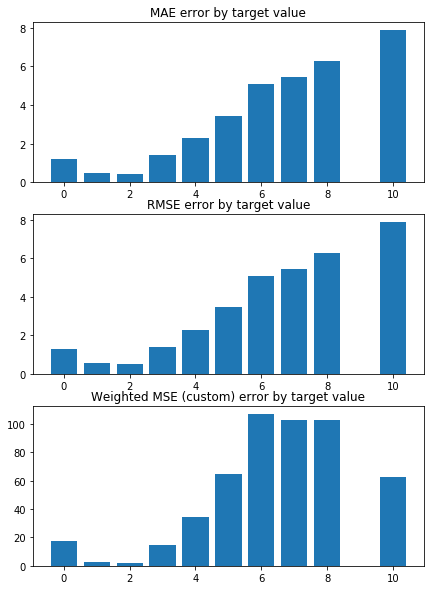

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1129961831876096 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1298155293796868 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


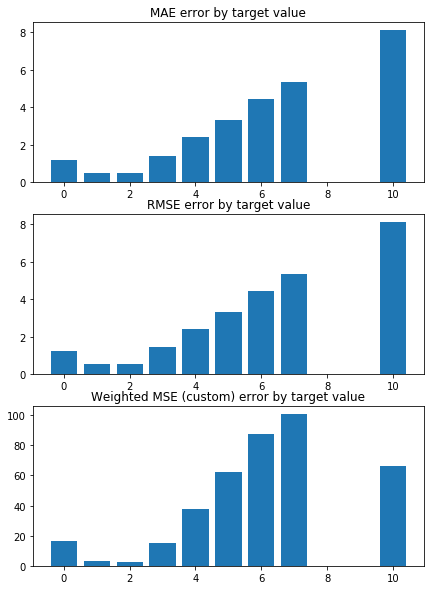

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2366890855359414 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1303483601847437 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


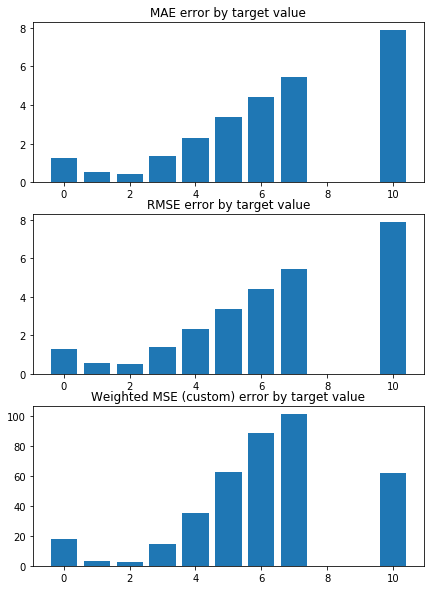

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1514829028271223 


 TRAIN PREDICTION Error
weighted_mse_train: 1.135274990616663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


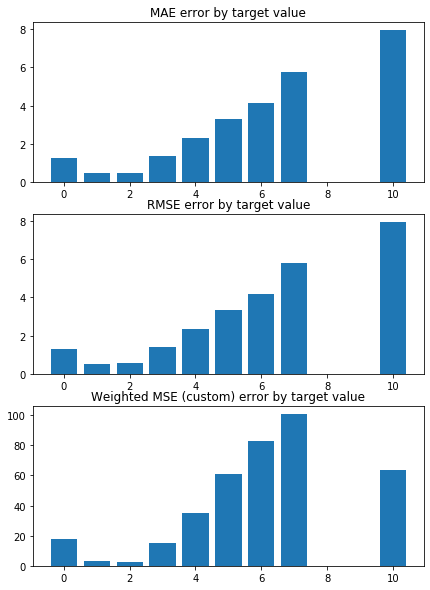

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.114102650648933 


 TRAIN PREDICTION Error
weighted_mse_train: 1.14023974709995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


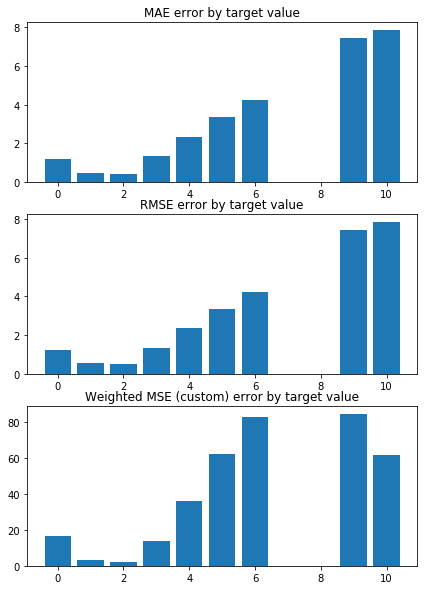

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1276443128263416 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1420236637535277 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


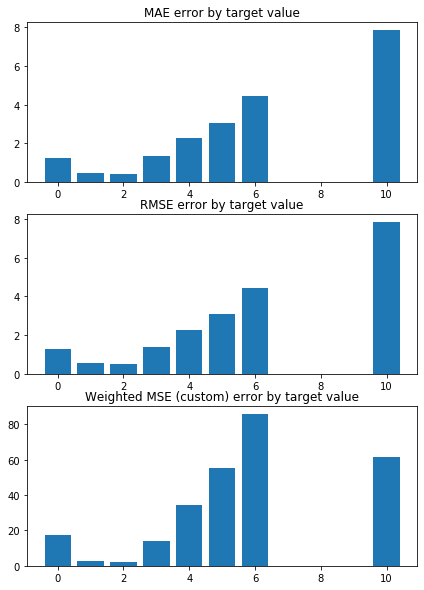

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2093662144544848 


 TRAIN PREDICTION Error
weighted_mse_train: 1.12134411960358 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


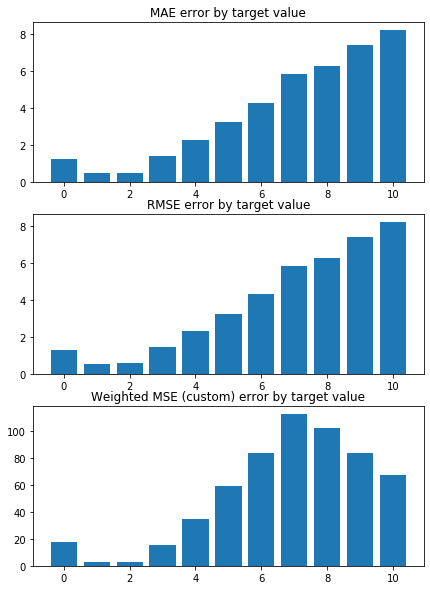

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0579059725149513 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1543832116467412 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


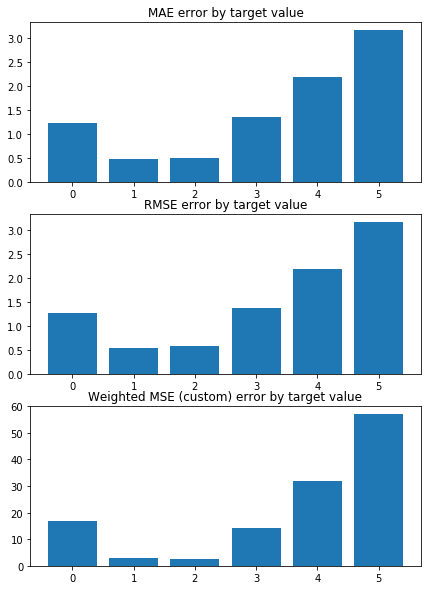

Weighted Mean squared error on Train: 1.14 
 MSE mean train: 1.8581145623164819 

Mean squared error on Test: 1.14 
 MSE mean test:  1.8596313094027501 

Root of MSE on Test: 1.07 
 1.3636829944685642 

Variance score on Test: 0.06 
 r2_test: 0.13618502737592336 

wMSE_train 1.14
wMSE_test 1.14
MSE_train 1.86
MSE_test 1.86
MAE_train 1.05
MAE_test 0.99
r2_test 0.14
      Chriz   H3K4me2  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  \
0 -0.219368 -0.009517      -0.0      -0.0       0.0      -0.0     -0.0   
1 -0.199338 -0.034532      -0.0      -0.0       0.0      -0.0     -0.0   
2 -0.215456 -0.024361      -0.0      -0.0       0.0      -0.0     -0.0   
3 -0.218965 -0.027564      -0.0      -0.0       0.0      -0.0     -0.0   
4 -0.205924 -0.025997      -0.0      -0.0       0.0      -0.0     -0.0   
5 -0.212598 -0.025573      -0.0      -0.0       0.0      -0.0     -0.0   
6 -0.201468 -0.037867      -0.0      -0.0       0.0      -0.0     -0.0   
7 -0.216443 -0.018805      -0.0      -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


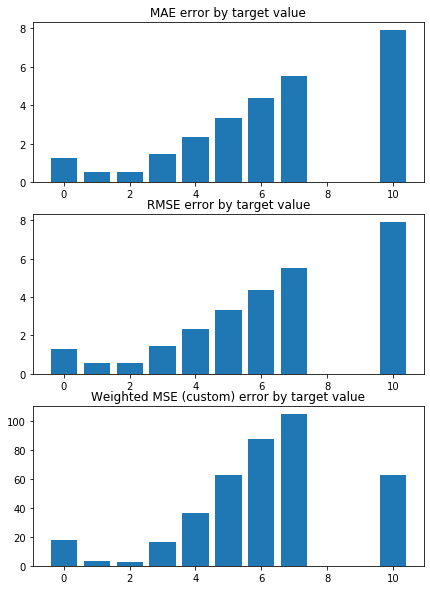

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1373408713993023 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2433917041047733 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


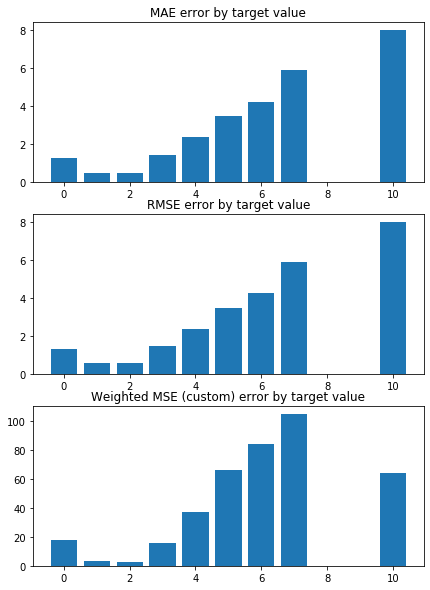

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2467544228077176 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2225156924832645 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


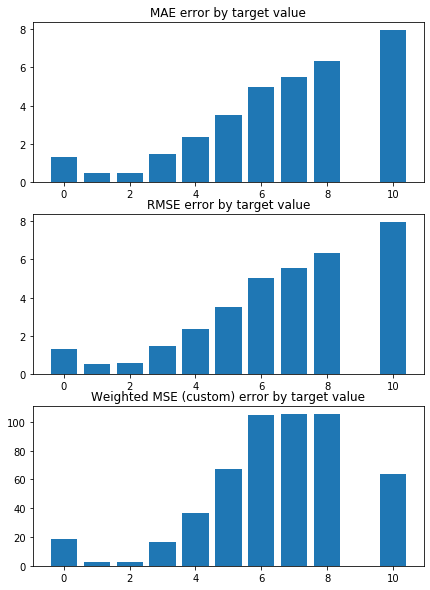

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1881354089028464 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2169104805980249 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


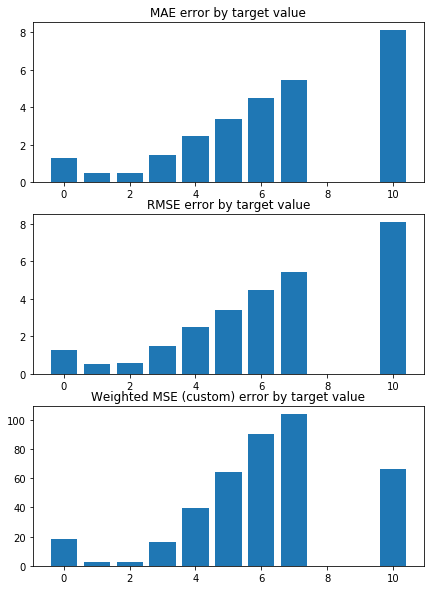

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3279843354894687 


 TRAIN PREDICTION Error
weighted_mse_train: 1.21846087128735 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


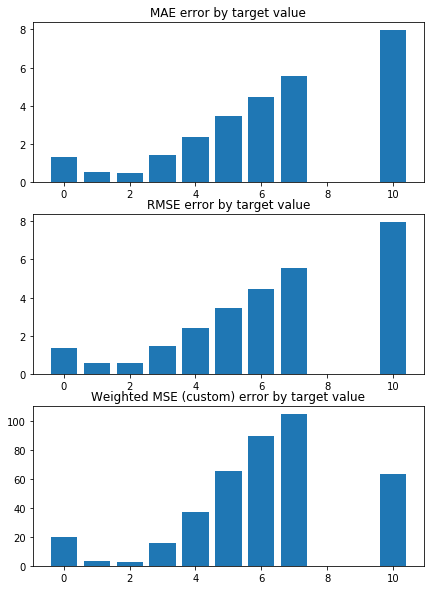

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2335386074086871 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2226111046536265 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


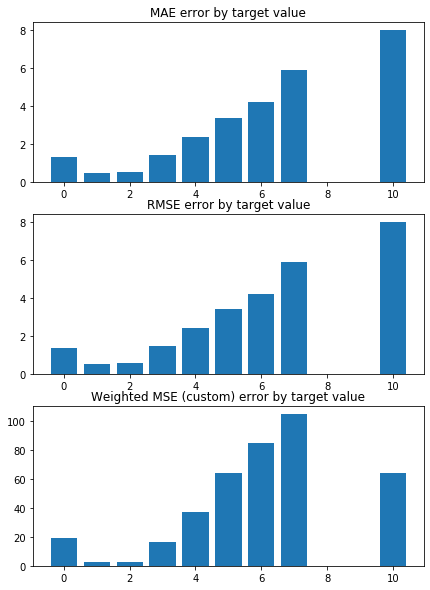

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2038314781308856 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2310533713768435 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


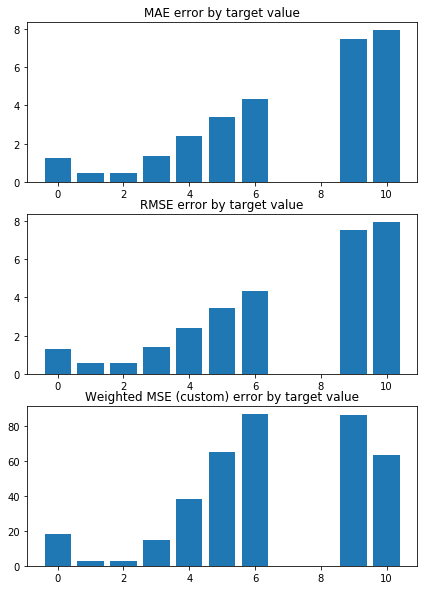

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2178189218004187 


 TRAIN PREDICTION Error
weighted_mse_train: 1.229617601132327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


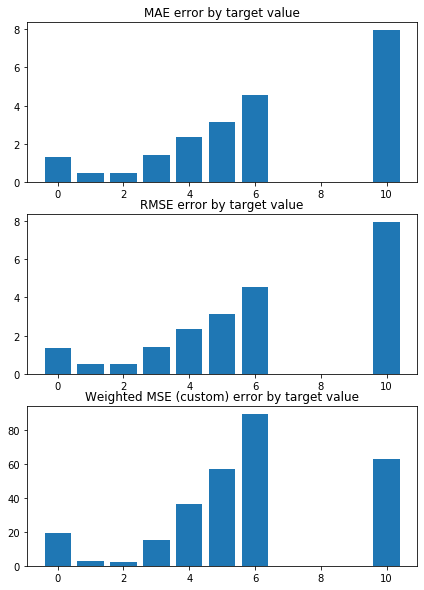

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2913617094452303 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2105278133479194 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


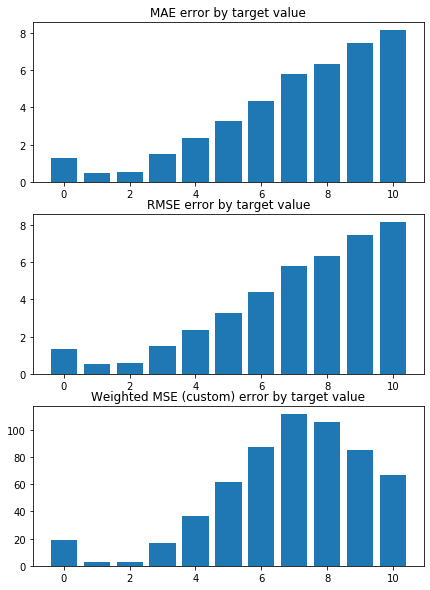

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1545364999971985 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2411282067968807 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


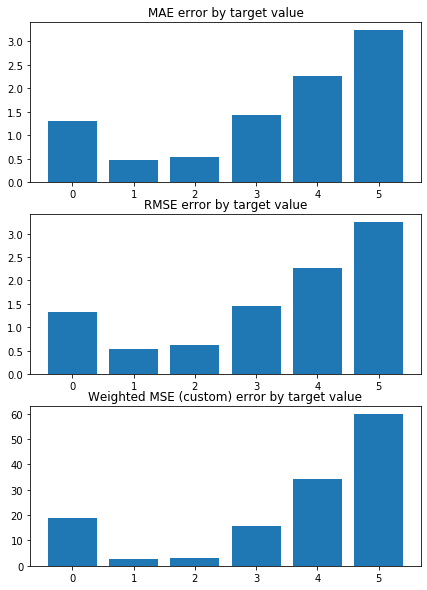

Weighted Mean squared error on Train: 1.23 
 MSE mean train: 1.973906165852458 

Mean squared error on Test: 1.23 
 MSE mean test:  1.9749945464942986 

Root of MSE on Test: 1.11 
 1.4053449919839252 

Variance score on Test: 0.06 
 r2_test: 0.08135932386423997 

wMSE_train 1.23
wMSE_test 1.23
MSE_train 1.97
MSE_test 1.97
MAE_train 1.1
MAE_test 1.04
r2_test 0.08
      Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.126866      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
1 -0.125314      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
2 -0.134546      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
3 -0.141521      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
4 -0.126929      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
5 -0.133792      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
6 -0.130829      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
7 -0.130688      -0.0      -0.0       0.0      -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


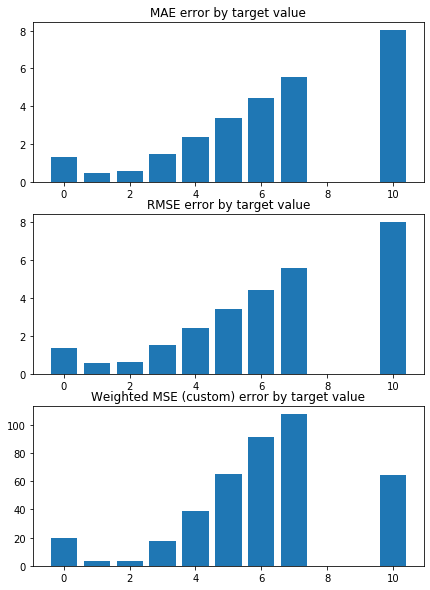

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2527863960454317 


 TRAIN PREDICTION Error
weighted_mse_train: 1.346462675658124 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


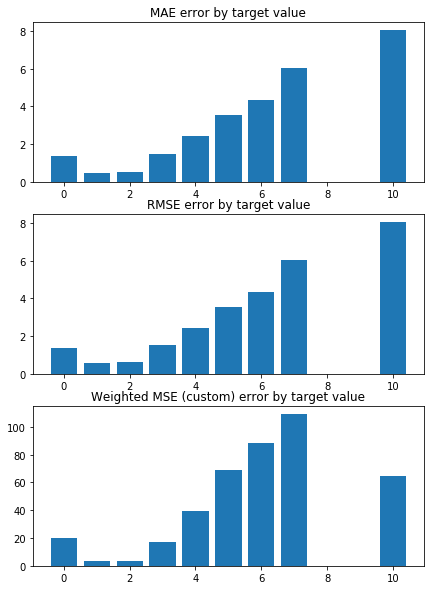

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3402632026051873 


 TRAIN PREDICTION Error
weighted_mse_train: 1.324490034676779 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


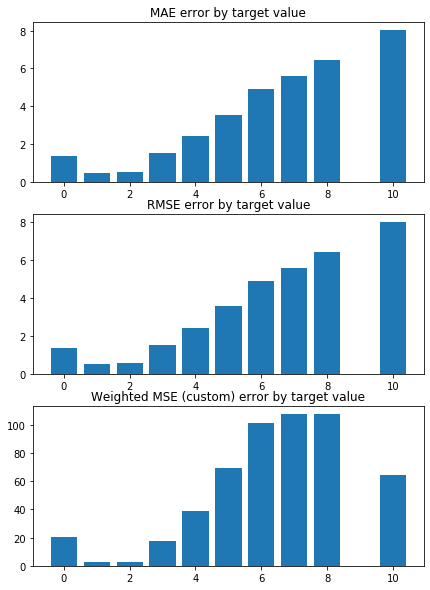

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2760570013074415 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3169050052285822 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


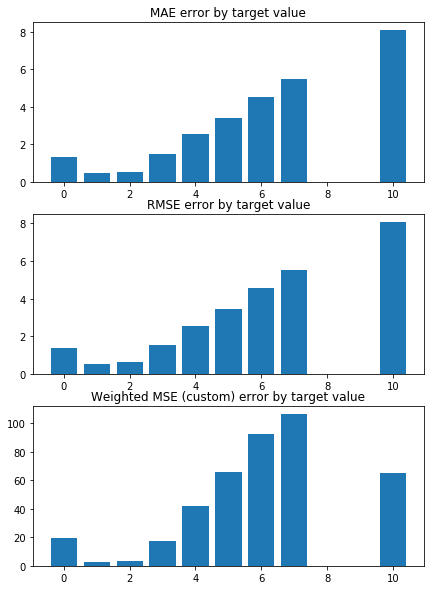

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.431317023819938 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3197473810278948 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


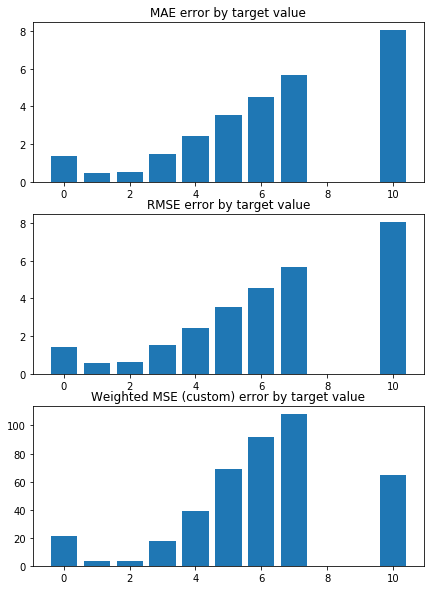

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3275798257476972 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3231352593775503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


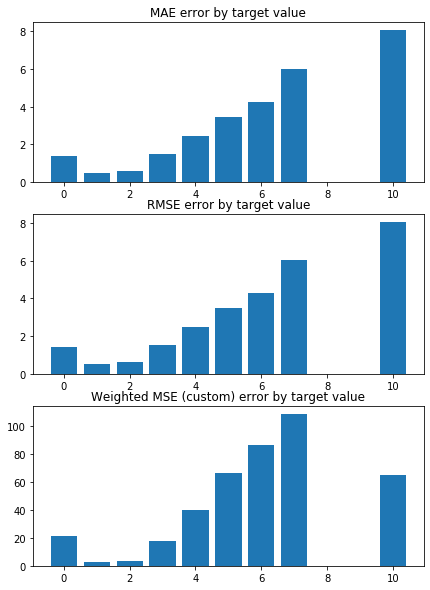

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3095295533392455 


 TRAIN PREDICTION Error
weighted_mse_train: 1.333408654094531 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


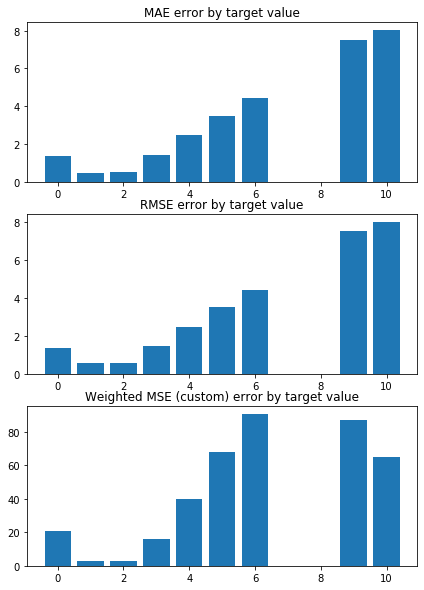

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.322525046747535 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3317662591584405 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


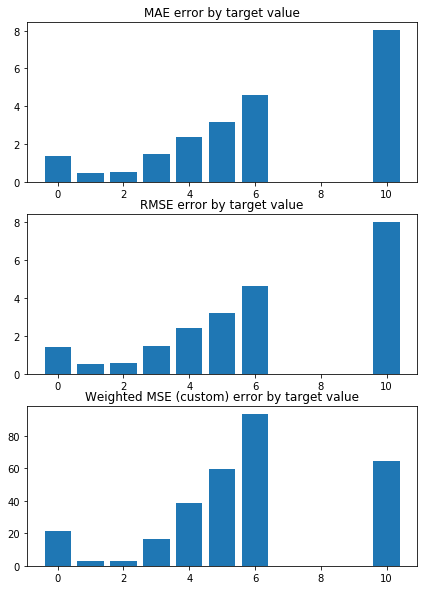

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3869683540127722 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3111365610222296 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


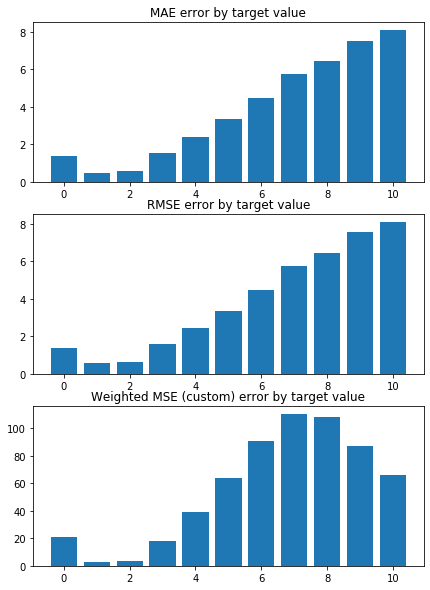

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2629866477116833 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3417563097336833 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


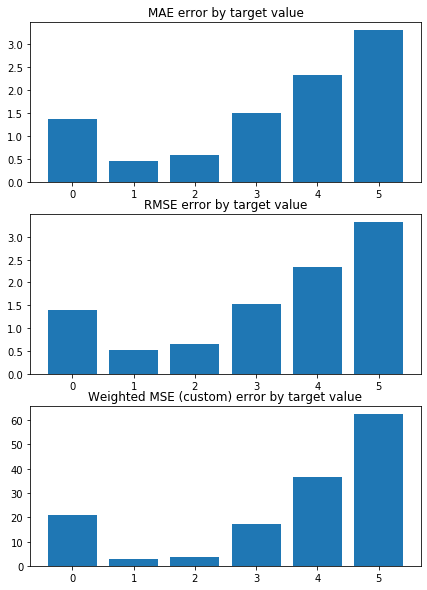

Weighted Mean squared error on Train: 1.33 
 MSE mean train: 2.1039136795628854 

Mean squared error on Test: 1.33 
 MSE mean test:  2.105102978779643 

Root of MSE on Test: 1.15 
 1.450897301251761 

Variance score on Test: 0.05 
 r2_test: 0.019534610077809423 

wMSE_train 1.33
wMSE_test 1.33
MSE_train 2.1
MSE_test 2.11
MAE_train 1.15
MAE_test 1.09
r2_test 0.02
      Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.026867      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
1 -0.023949      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
2 -0.034385      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
3 -0.042219      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
4 -0.027457      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
5 -0.034761      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
6 -0.030105      -0.0      -0.0       0.0      -0.0     -0.0      0.0   
7 -0.030092      -0.0      -0.0       0.0      -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


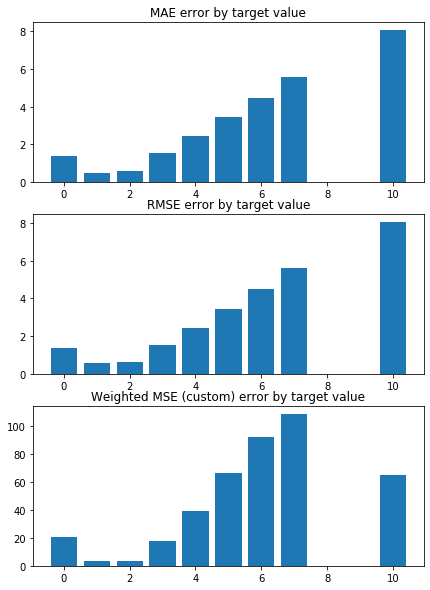

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


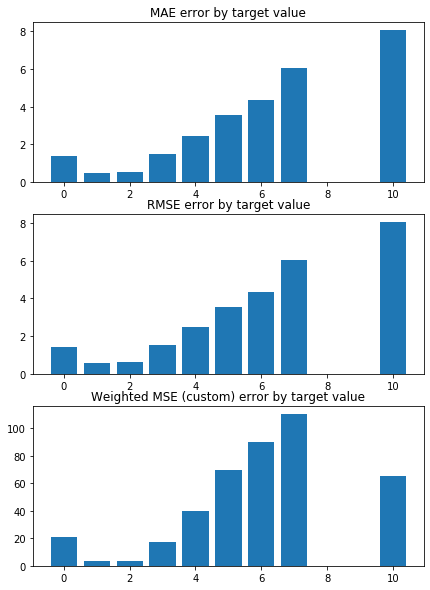

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


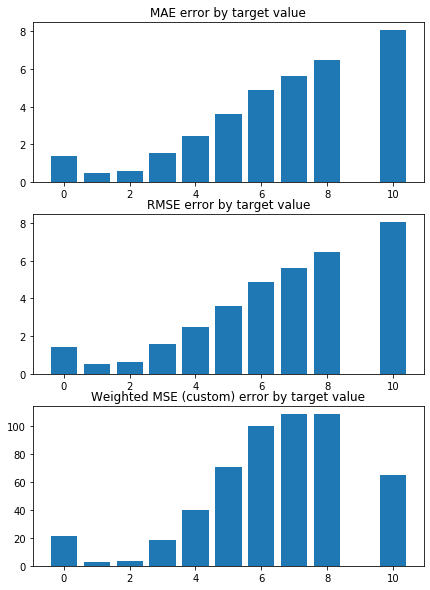

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


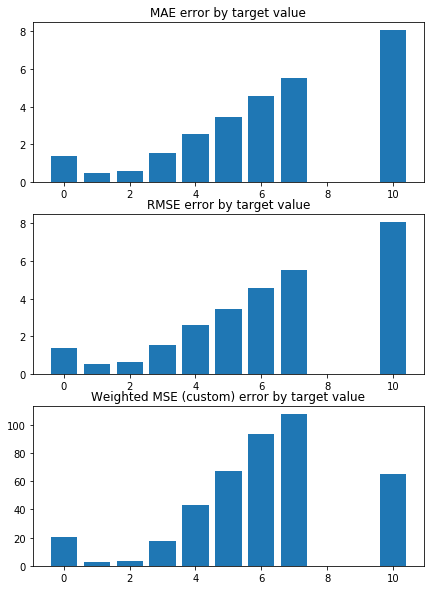

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


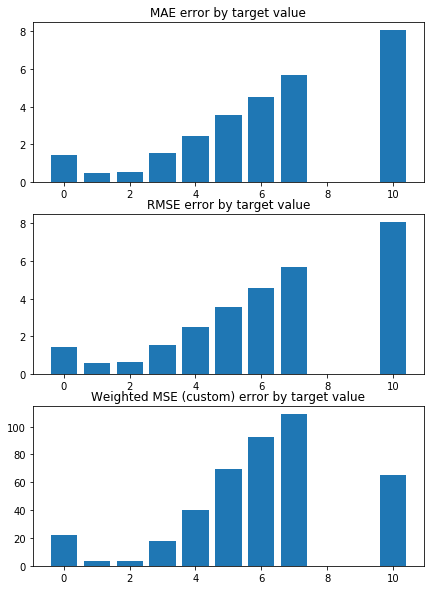

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


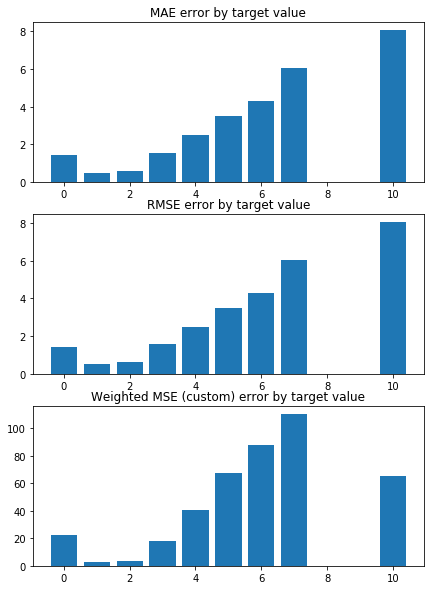

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


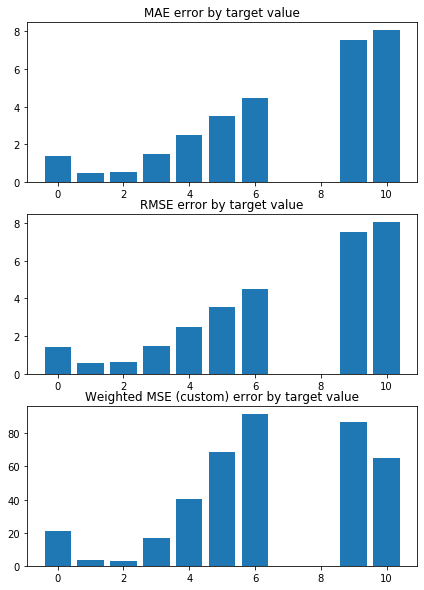

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


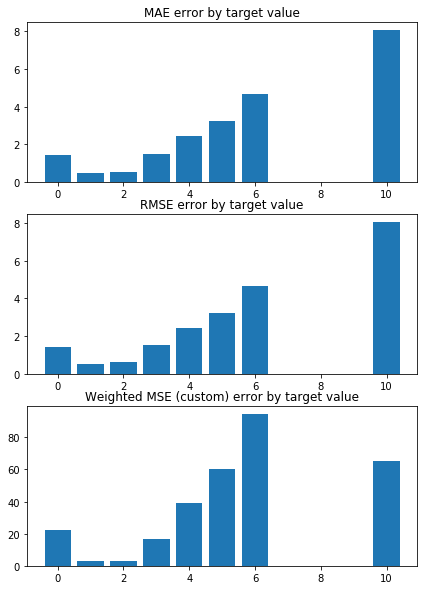

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


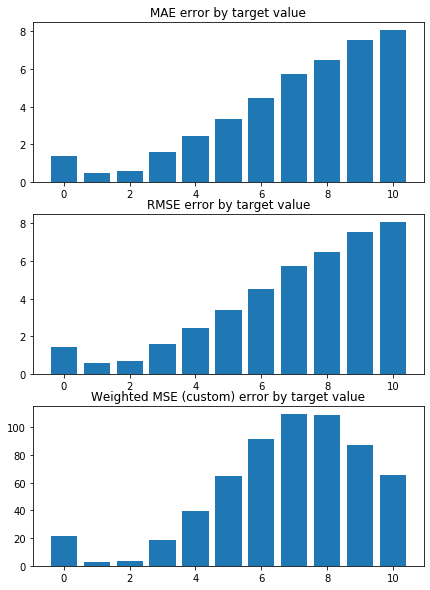

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


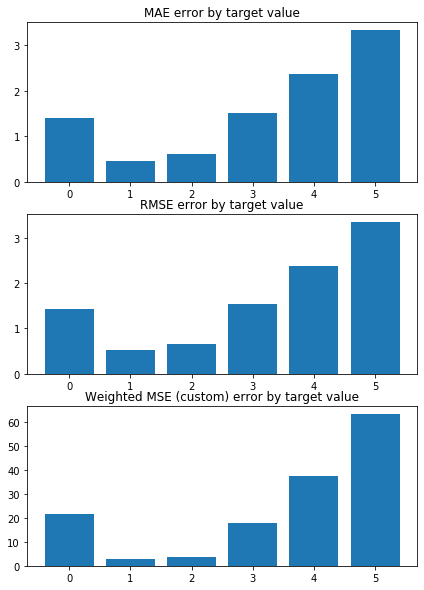

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


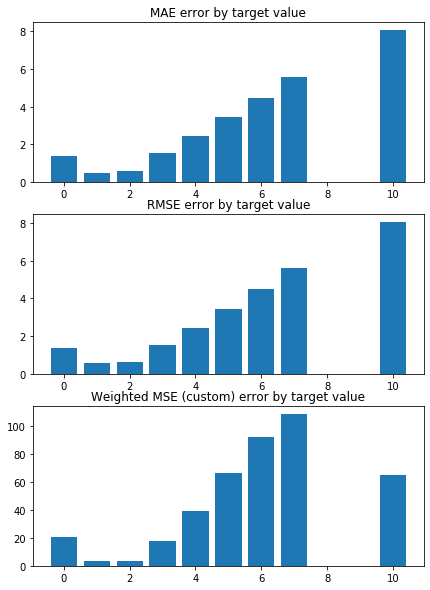

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2830239989229137 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3733850602520663 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


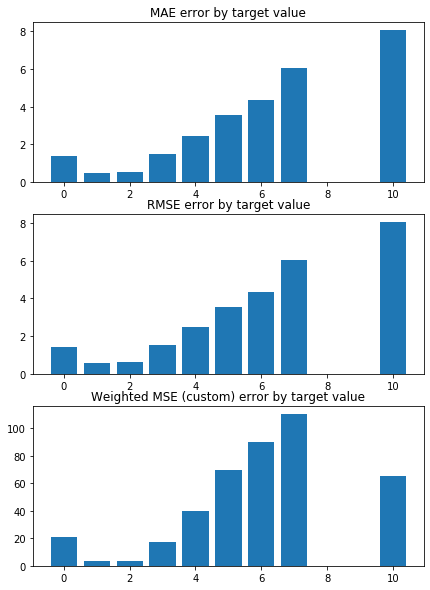

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3764699984214421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3635079217610573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


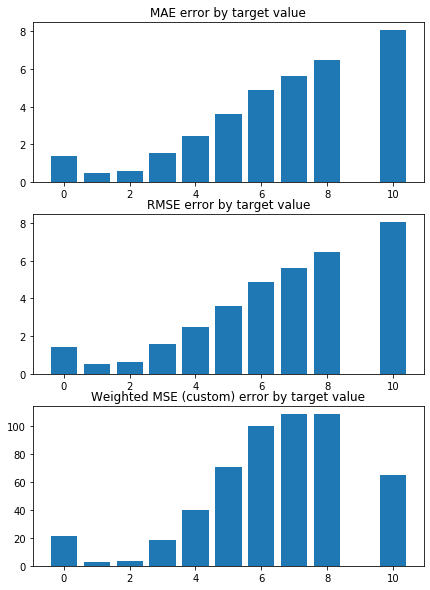

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318220853021891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3646536276658503 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


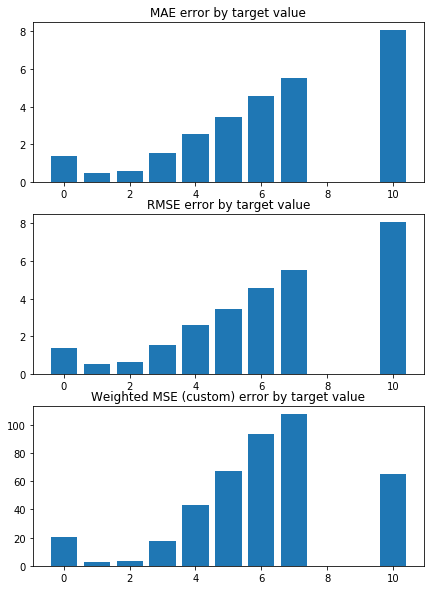

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.462727437863662 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3507475781784193 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


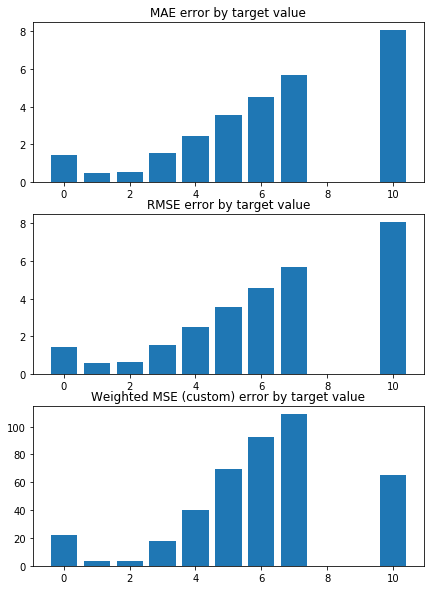

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3642462640779673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.362501969543359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


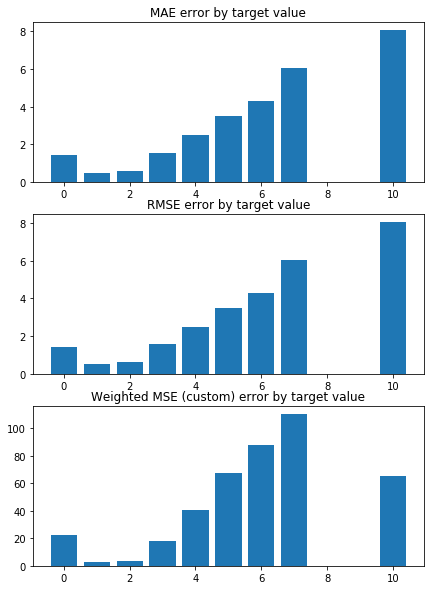

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3448044314797851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3673977648449371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


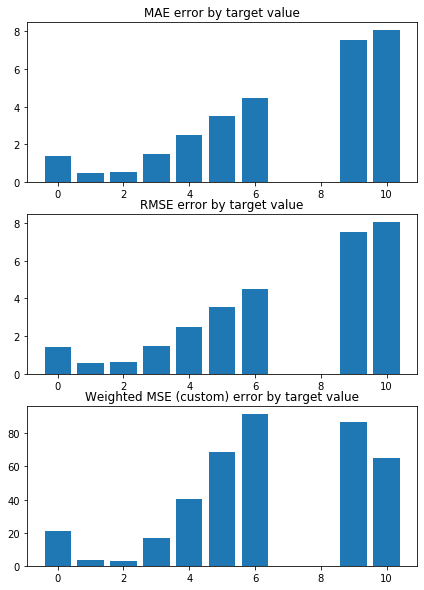

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3574643403217264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.365718969556564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


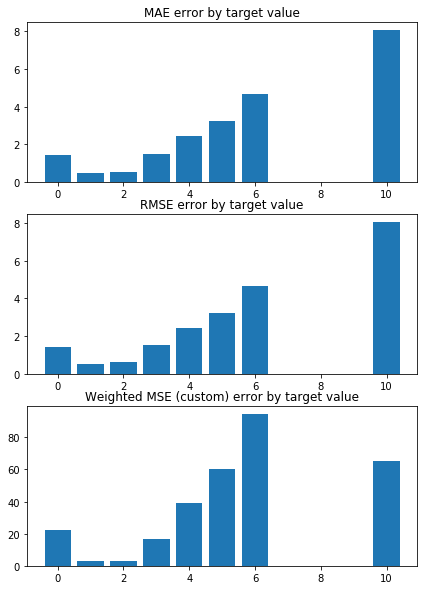

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4274046151432886 


 TRAIN PREDICTION Error
weighted_mse_train: 1.353663630255397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


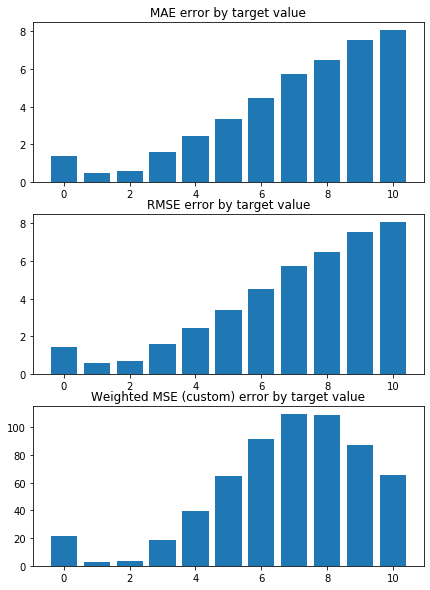

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2992669995196942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3757701140568894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


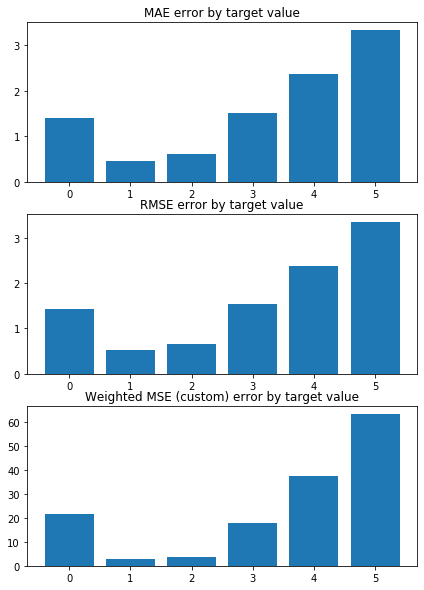

Weighted Mean squared error on Train: 1.36 
 MSE mean train: 2.1494459026151636 

Mean squared error on Test: 1.36 
 MSE mean test:  2.1501012120236327 

Root of MSE on Test: 1.17 
 1.4663223424689513 

Variance score on Test: 0.05 
 r2_test: -0.0016246288600025639 

wMSE_train 1.36
wMSE_test 1.36
MSE_train 2.15
MSE_test 2.15
MAE_train 1.16
MAE_test 1.11
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0     -0.0      0.0      0.0  

In [81]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 1, 0.1)
# Create linear regression object

model_name = 'LR+L1_grid0.1-1'
n_splits = 10
random_state = 16 
shuffle = True


wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                        weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                        rmse_test, rmse_train, rmse_test_const, \
                        mae_test,    mae_train,  mae_test_const, \
                        _ = train_test_KFold(X, y, model, model_name, results_pd,
                                             n_splits=n_splits, random_state=random_state, shuffle=shuffle)


    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


In [82]:
wmse_test

[0.8970270236385339,
 0.9027869034673547,
 0.9506759912146228,
 1.0064119359703192,
 1.0649057210118413,
 1.1391585918031786,
 1.2269548694079784,
 1.3284810152023154,
 1.364001547118124,
 1.364001547118124]

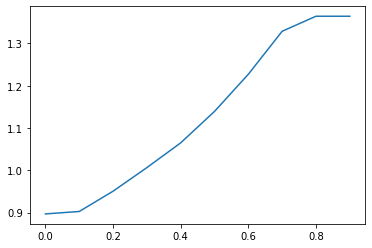

In [83]:
plt.plot(alpha_grid, wmse_test)

In [84]:
# Best alpha = 0.2

# L1 - best  score

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9498990380059155 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9529232163145351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


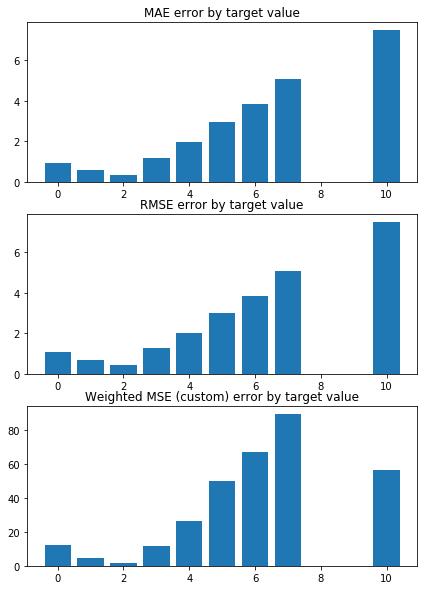

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8465829516790856 


 TRAIN PREDICTION Error
weighted_mse_train: 0.958649004913108 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


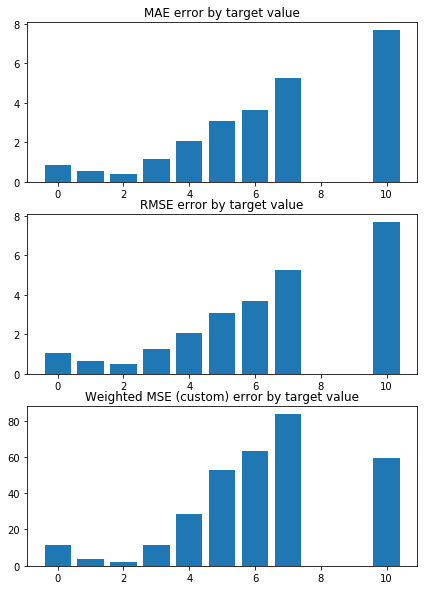

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0024574858156863 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9408994270276345 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


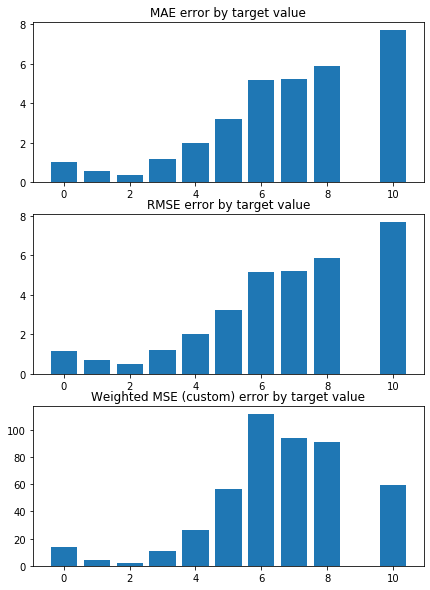

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9617035863924087 


 TRAIN PREDICTION Error
weighted_mse_train: 0.940356725796675 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


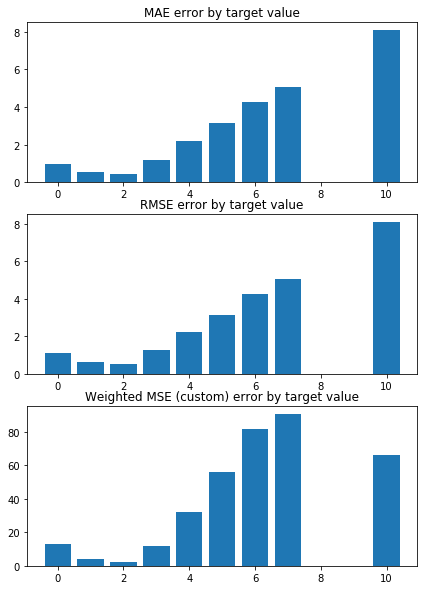

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0446605786921204 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9377282176409865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


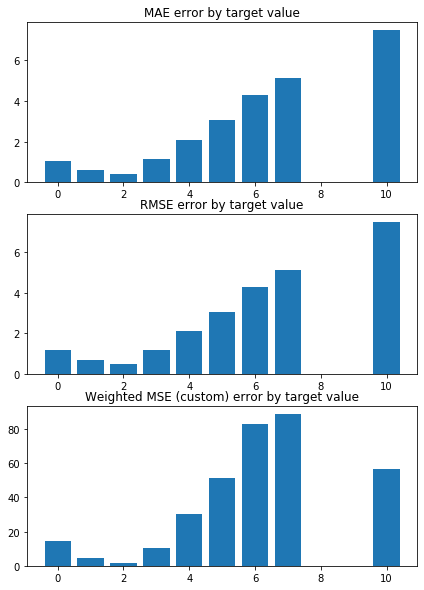

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9734566210384338 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9455462464316167 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


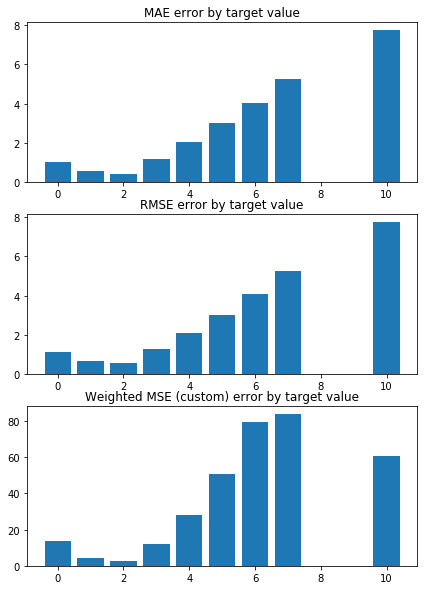

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9268417983833402 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9510225997170333 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


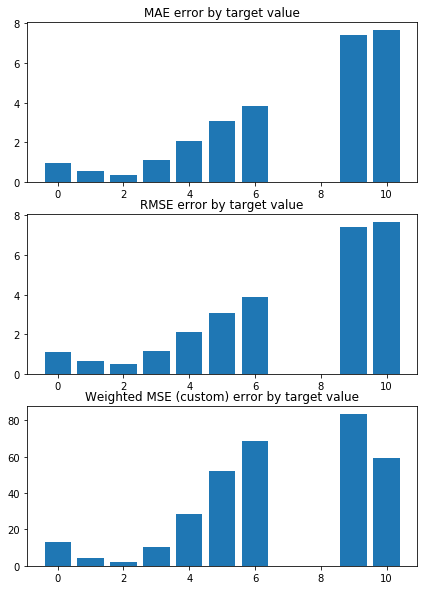

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.9359040932805903 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9503636012862704 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


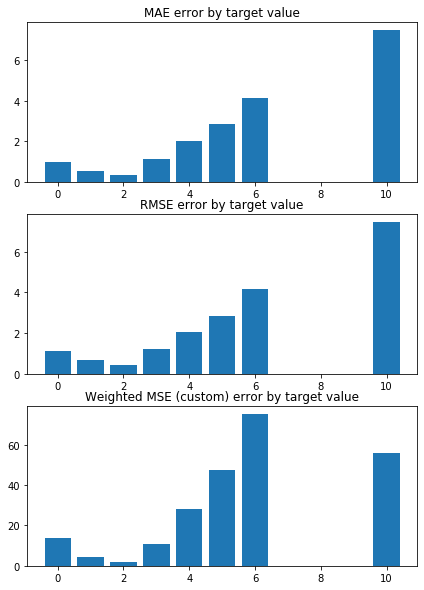

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0310802186869075 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9391899024875072 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


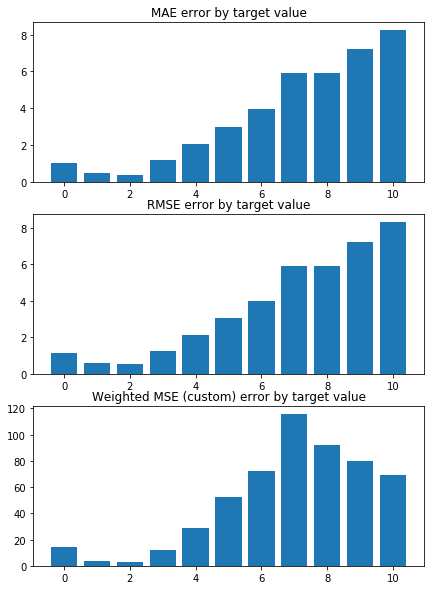

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8341735401717396 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9662091131921546 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


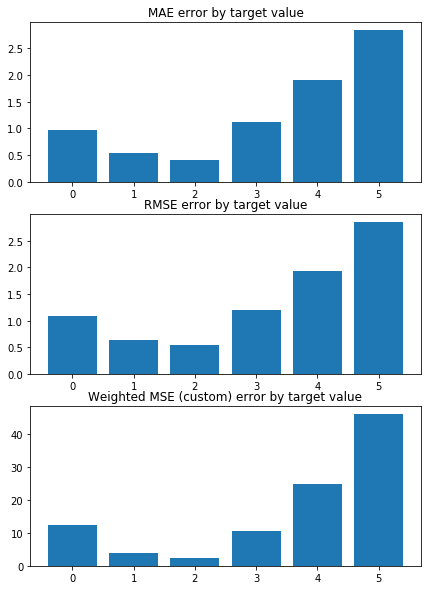

Weighted Mean squared error on Train: 0.95 
 MSE mean train: 1.590623351524329 

Mean squared error on Test: 0.95 
 MSE mean test:  1.5945320934930722 

Root of MSE on Test: 0.97 
 1.2627478344836203 

Variance score on Test: 0.07 
 r2_test: 0.262356114909088 

wMSE_train 0.95
wMSE_test 0.95
MSE_train 1.59
MSE_test 1.59
MAE_train 0.93
MAE_test 0.85
r2_test 0.26
      Chriz   H3K4me1  H3K36me3  RNA-polymerase-II   H3K4me2       GAF  CP190  \
0 -0.379450 -0.126267 -0.073104          -0.022698 -0.020806 -0.001539   -0.0   
1 -0.367329 -0.147189 -0.085605          -0.000000 -0.038365 -0.000000   -0.0   
2 -0.366746 -0.128212 -0.093666          -0.017238 -0.026914 -0.009341   -0.0   
3 -0.372233 -0.145039 -0.099378          -0.000000 -0.028502 -0.003993   -0.0   
4 -0.363644 -0.145322 -0.087459          -0.006418 -0.028797 -0.001682   -0.0   
5 -0.374387 -0.142594 -0.073367          -0.030313 -0.015542 -0.000000   -0.0   
6 -0.372969 -0.118660 -0.071579          -0.000000 -0.055461 -0.01651

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.950676,0.066193,0.948289,0.008838,-,test_params = testtest,1.594532,0.276372,1.590623,0.032036,"[0.3057351447165688, 0.28247176467209545, 0.22...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."


In [85]:
# L1 - best 
model = linear_model.Lasso(alpha=0.2)


model_name = 'LR+L1_alf=0.2_spt=10'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

# wmse_test.append(np.mean(weighted_mse_test_all))
# wmse_train.append(np.mean(weighted_mse_train_all))
results_pd

In [86]:
coefs_argsort, coefs

(array([[ 0,  6, 15, 17,  7,  5,  4,  2, 16,  9, 10, 11, 12, 13, 14,  1,
          3,  8],
        [ 0,  6, 15,  7, 14, 13, 12, 11, 10,  8, 16,  5,  4,  3,  2,  1,
          9, 17],
        [ 0,  6, 15,  7, 17,  5,  9,  3,  2, 16, 10, 11, 12, 13, 14,  1,
          4,  8],
        [ 0,  6, 15,  7,  5, 14, 13, 12, 11, 10,  8, 16,  4,  3,  2,  1,
          9, 17],
        [ 0,  6, 15,  7, 17,  5,  3,  2, 16,  9, 10, 11, 12, 13, 14,  1,
          4,  8],
        [ 0,  6, 15, 17,  7,  4,  5,  2, 16,  9, 10, 11, 12, 13, 14,  1,
          3,  8],
        [ 0,  6, 15,  7,  5, 10, 14, 13, 12, 11,  8, 16,  4,  3,  2,  1,
          9, 17],
        [ 0,  6, 15,  7, 17,  5,  3,  2, 16,  9, 10, 11, 12, 13, 14,  1,
          4,  8],
        [ 0,  6,  7, 15, 17, 10,  5,  3,  2, 16,  9, 11, 12, 13, 14,  1,
          4,  8],
        [ 0,  6, 15,  7,  5, 14, 13, 12, 11, 10,  8, 16,  4,  3,  2,  1,
          9, 17]]),
 array([[-0.37945036, -0.        ,  0.        , -0.        , -0.        ,
         -0.00

In [87]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K4me1', 'H3K36me3', 'RNA-polymerase-II', 'H3K4me2', 'GAF',
       'CP190', 'Su(Hw)', 'H4K16ac', 'H3K9me2', 'H3K9me3', 'H3K27ac',
       'H3K27me1', 'H3K27me3', 'H3K36me1', 'CTCF', 'BEAF-32', 'H3K4me3'],
      dtype='object')

In [88]:
coefs_argsort[:]

array([[ 0,  6, 15, 17,  7,  5,  4,  2, 16,  9, 10, 11, 12, 13, 14,  1,
         3,  8],
       [ 0,  6, 15,  7, 14, 13, 12, 11, 10,  8, 16,  5,  4,  3,  2,  1,
         9, 17],
       [ 0,  6, 15,  7, 17,  5,  9,  3,  2, 16, 10, 11, 12, 13, 14,  1,
         4,  8],
       [ 0,  6, 15,  7,  5, 14, 13, 12, 11, 10,  8, 16,  4,  3,  2,  1,
         9, 17],
       [ 0,  6, 15,  7, 17,  5,  3,  2, 16,  9, 10, 11, 12, 13, 14,  1,
         4,  8],
       [ 0,  6, 15, 17,  7,  4,  5,  2, 16,  9, 10, 11, 12, 13, 14,  1,
         3,  8],
       [ 0,  6, 15,  7,  5, 10, 14, 13, 12, 11,  8, 16,  4,  3,  2,  1,
         9, 17],
       [ 0,  6, 15,  7, 17,  5,  3,  2, 16,  9, 10, 11, 12, 13, 14,  1,
         4,  8],
       [ 0,  6,  7, 15, 17, 10,  5,  3,  2, 16,  9, 11, 12, 13, 14,  1,
         4,  8],
       [ 0,  6, 15,  7,  5, 14, 13, 12, 11, 10,  8, 16,  4,  3,  2,  1,
         9, 17]])

In [89]:

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 0.9482888054807523 0.9506759912146228


In [90]:
su_drsc.columns[2:][coefs_argsort[0]], coefs

(Index(['Chriz', 'H3K4me1', 'H3K36me3', 'RNA-polymerase-II', 'H3K4me2', 'GAF',
        'CP190', 'Su(Hw)', 'H4K16ac', 'H3K9me2', 'H3K9me3', 'H3K27ac',
        'H3K27me1', 'H3K27me3', 'H3K36me1', 'CTCF', 'BEAF-32', 'H3K4me3'],
       dtype='object'),
 array([[-0.37945036, -0.        ,  0.        , -0.        , -0.        ,
         -0.00153882, -0.12626712, -0.02080556, -0.        ,  0.        ,
          0.        , -0.        , -0.        ,  0.        , -0.        ,
         -0.07310431, -0.        , -0.02269787],
        [-0.36732923, -0.        ,  0.        , -0.        , -0.        ,
         -0.        , -0.14718851, -0.03836544, -0.        ,  0.        ,
          0.        , -0.        , -0.        ,  0.        , -0.        ,
         -0.08560463, -0.        , -0.        ],
        [-0.36674576, -0.        ,  0.        , -0.        , -0.        ,
         -0.00934105, -0.12821154, -0.02691364, -0.        ,  0.00261528,
          0.        , -0.        , -0.        ,  0.        , 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 1

Получили наиболее влияющие признаки

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Linear Regression with L2 regularization -  Ridge

In [91]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)


In [92]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l2 = linear_model.Ridge()

# Train the model using the training sets
lin_reg_l2.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l2.predict(X_test)

Коэффициенты

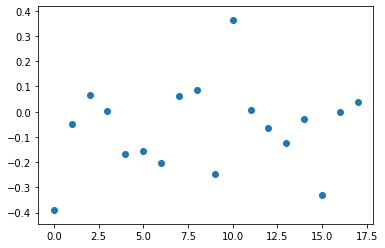

In [93]:
plt.scatter( np.arange(len(lin_reg_l2.coef_)) , lin_reg_l2.coef_)
plt.show()

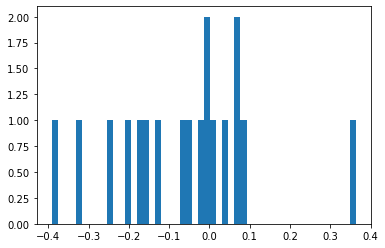

In [94]:
plt.hist(lin_reg_l2.coef_, bins=50)
plt.show()

In [95]:
# Make predictions using the testing set
y_pred_train = lin_reg_l2.predict(X_train)
# The mean squared error
print("Mean squared error on Train: %.2f"
      % mean_squared_error(y_train, y_pred_train))

# The mean squared error
print("Mean squared error on Test: %.2f"
      % mean_squared_error(y_test, y_pred))


# The mean squared error
print("Root of Mean squared error: %.2f"
      % np.sqrt(mean_squared_error(y_test, y_pred)))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(y_test, y_pred))

Mean squared error on Train: 1.51
Mean squared error on Test: 1.39
Root of Mean squared error: 1.18
Variance score: 0.32


(array([  2.,   2.,   4.,   7.,   5.,  12.,   7.,  17.,  19.,  27.,  44.,
         46.,  69.,  85., 103., 127., 121., 160., 201., 197., 203., 207.,
        220., 222., 235., 227., 220., 203., 182., 168., 141., 104.,  77.,
         94.,  55.,  55.,  32.,  28.,  24.,  21.,  11.,   6.,   4.,   2.,
          0.,   1.,   0.,   0.,   1.,   2.]),
 array([-3.3876787 , -3.24258185, -3.097485  , -2.95238815, -2.8072913 ,
        -2.66219445, -2.5170976 , -2.37200074, -2.22690389, -2.08180704,
        -1.93671019, -1.79161334, -1.64651649, -1.50141964, -1.35632278,
        -1.21122593, -1.06612908, -0.92103223, -0.77593538, -0.63083853,
        -0.48574168, -0.34064483, -0.19554797, -0.05045112,  0.09464573,
         0.23974258,  0.38483943,  0.52993628,  0.67503313,  0.82012999,
         0.96522684,  1.11032369,  1.25542054,  1.40051739,  1.54561424,
         1.69071109,  1.83580795,  1.9809048 ,  2.12600165,  2.2710985 ,
         2.41619535,  2.5612922 ,  2.70638905,  2.8514859 ,  2.99658276,
 

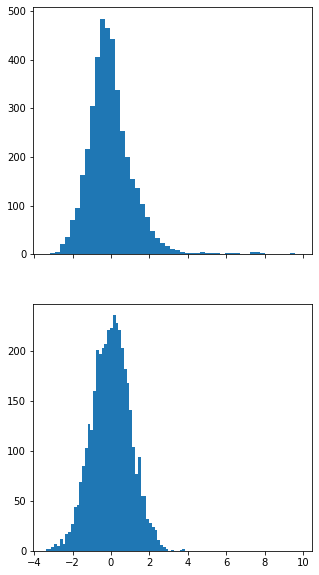

In [96]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L2


## Fined parametrs for L2

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8468856384588824 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8961159400363372 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


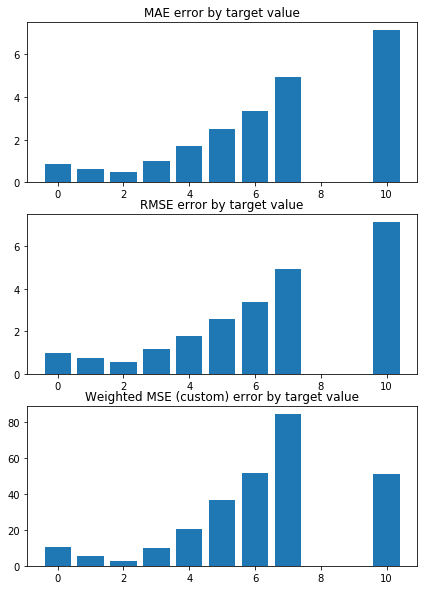

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7975789755735558 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9015923143907226 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


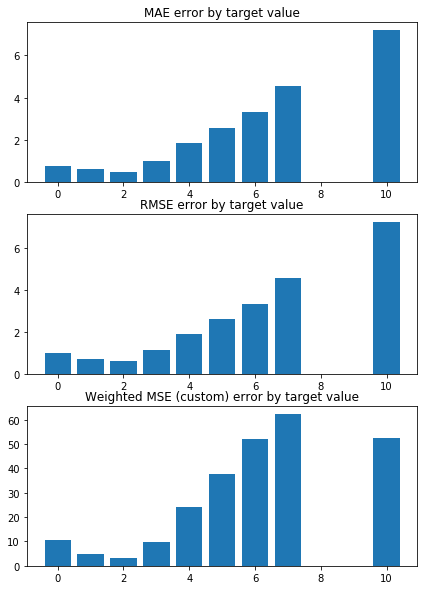

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049149257521315 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8795016496679409 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


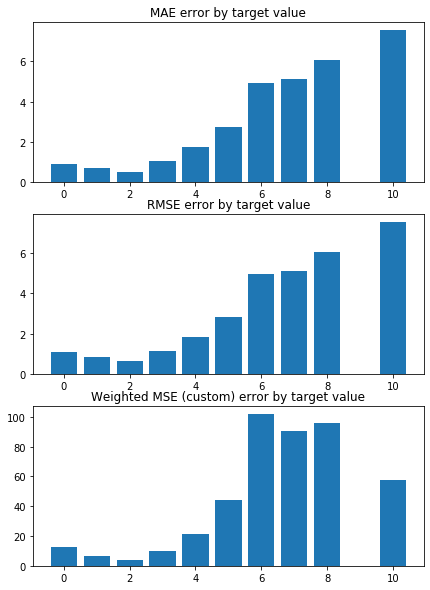

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9340342124912115 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8845870462697681 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


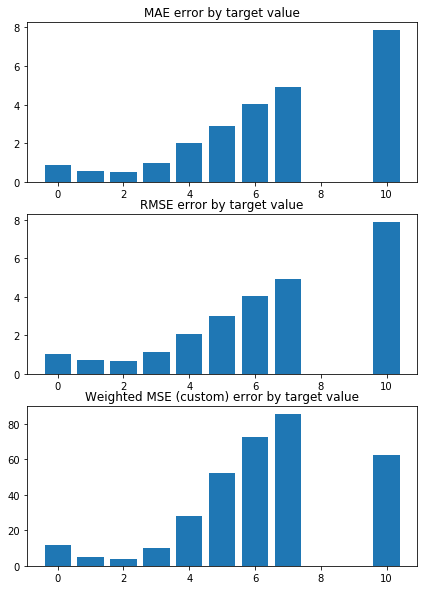

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773369578010442 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794706163382532 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


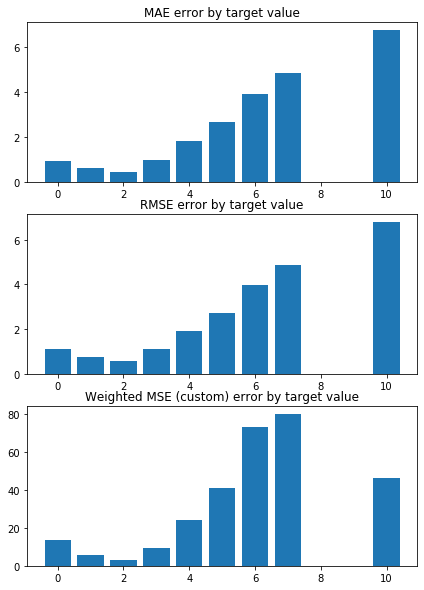

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036418856153635 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8879341090007894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


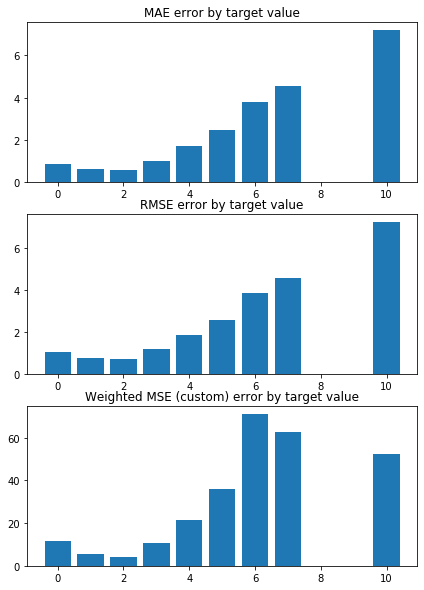

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.904141341606964 


 TRAIN PREDICTION Error
weighted_mse_train: 0.891997492505898 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


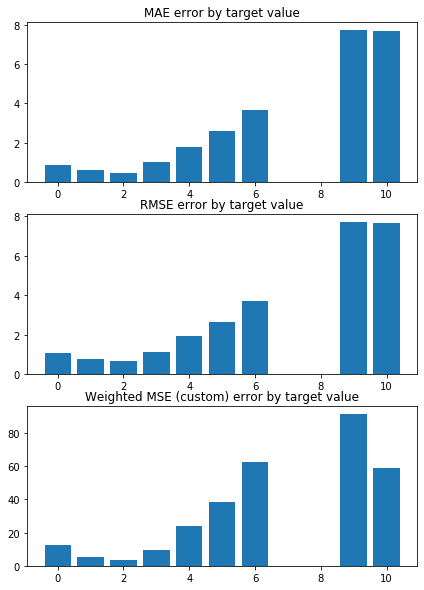

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.888886477901424 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8927441442794174 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


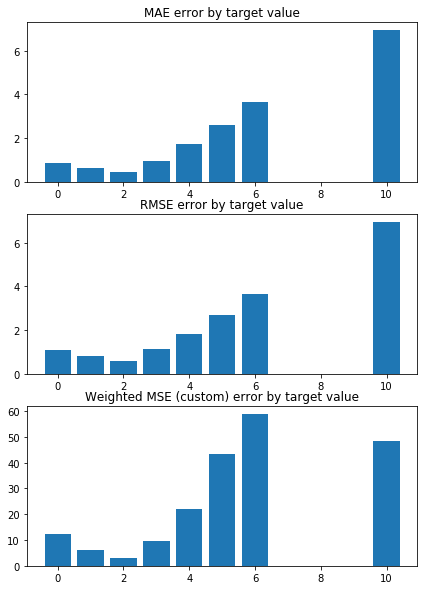

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9602303846608803 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8825039435387348 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


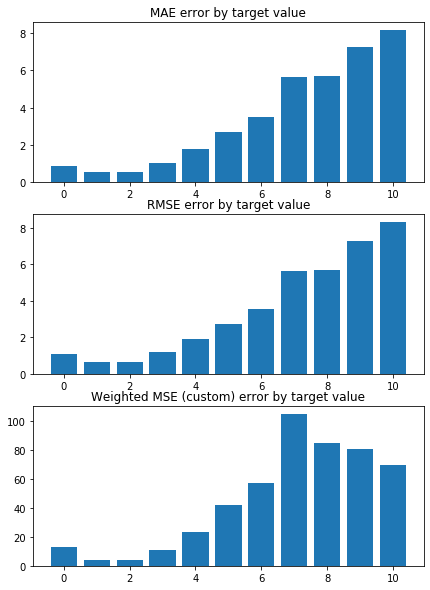

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7526194365238811 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9096443314575876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


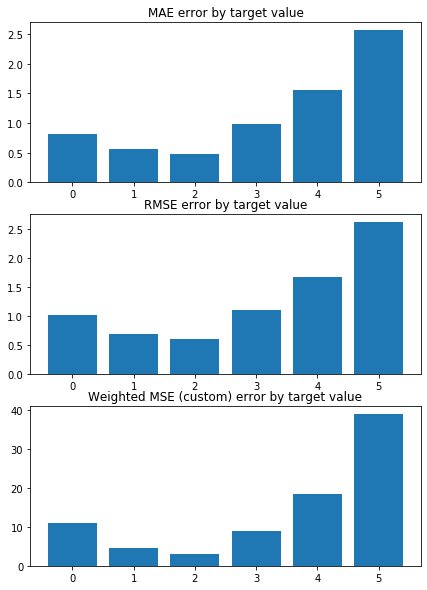

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693833459339656 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4810645696208362 

Root of MSE on Test: 0.95 
 1.2169899628266603 

Variance score on Test: 0.08 
 r2_test: 0.31587781572324786 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.425175  0.280112 -0.275135 -0.187430 -0.164903 -0.150293 -0.147859   
1 -0.414835  0.320945 -0.302229 -0.221283 -0.161158 -0.139119 -0.209257   
2 -0.376884  0.230790 -0.285298 -0.178649 -0.175687 -0.153890 -0.095870   
3 -0.389100  0.279021 -0.318000 -0.209905 -0.177116 -0.156682 -0.163545   
4 -0.365348  0.268475 -0.291039 -0.223090 -0.171286 -0.148516 -0.157718   
5 -0.403140  0.252983 -0.280585 -0.209485 -0.173189 -0.140690 -0.138454   
6 -0.388021  0.340447 -0.283263 -0.185518 -0.188349 -0.161527 -0.211988   
7 -0.426858  0.329119 -0.299364 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


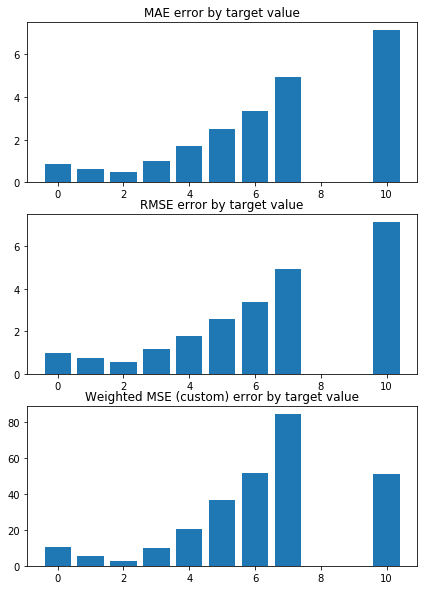

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7974822902099468 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9015526254259196 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


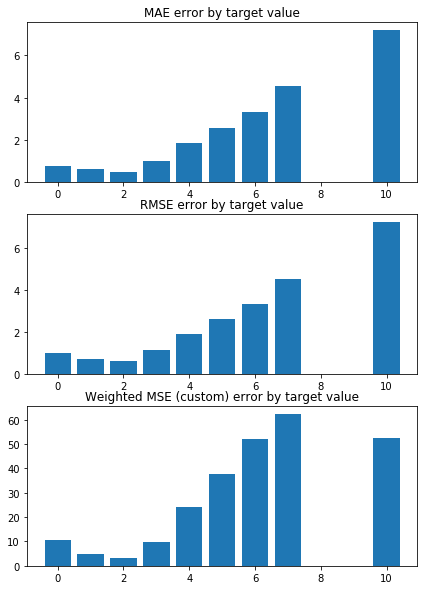

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.004924887982881 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794807749738749 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


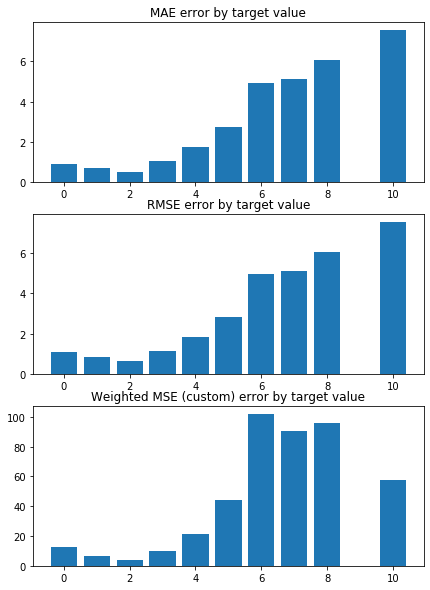

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9339904863966075 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8845523658281566 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


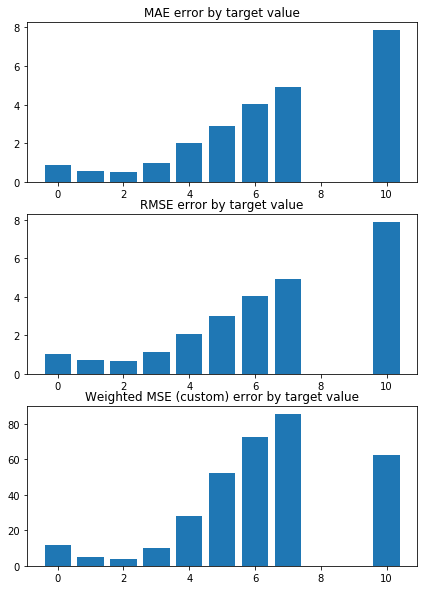

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.977321842134907 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794393050165702 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


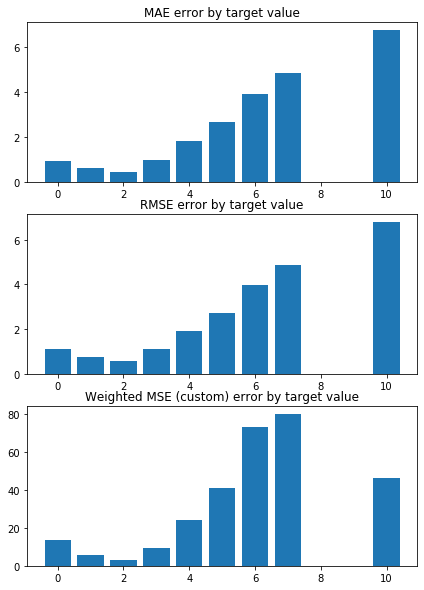

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036397002141723 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8879074420571068 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


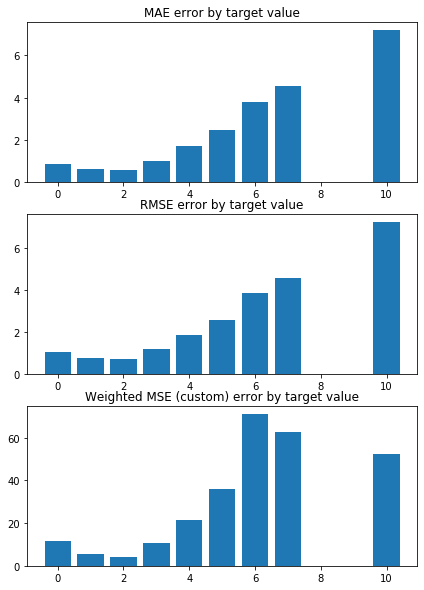

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9040467781638639 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8919549334439743 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


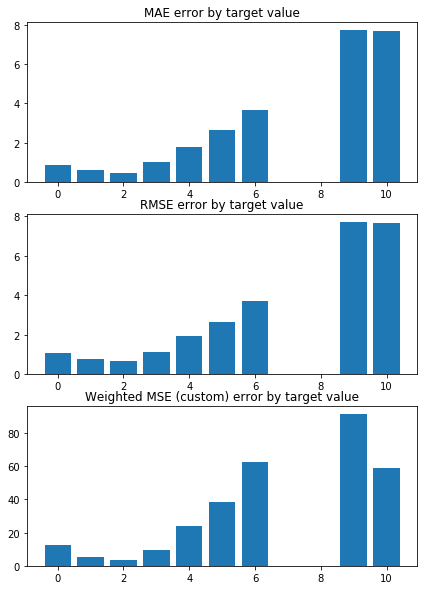

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8887582425252396 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8927022309590399 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


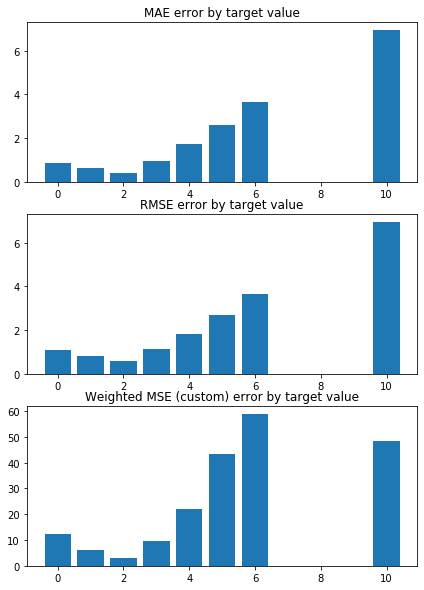

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9601483879460353 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8824616586983072 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


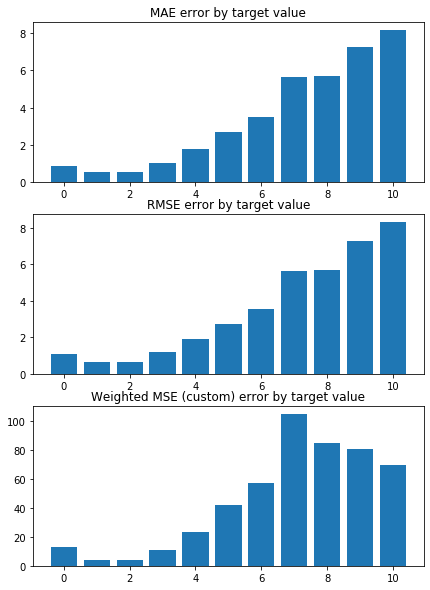

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7525646196656162 


 TRAIN PREDICTION Error
weighted_mse_train: 0.909604201289789 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


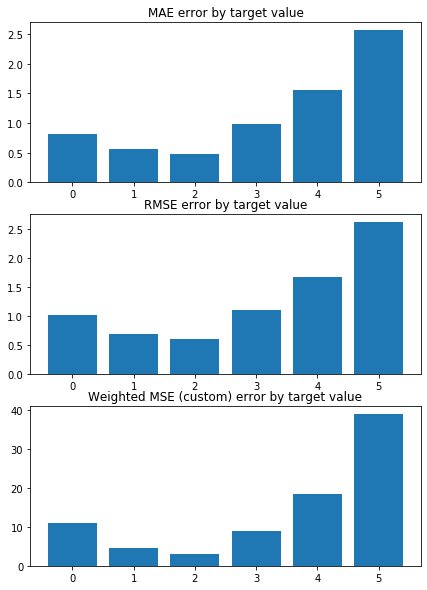

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693836035602852 

Mean squared error on Test: 0.90 
 MSE mean test:  1.481039490850518 

Root of MSE on Test: 0.95 
 1.21697965917698 

Variance score on Test: 0.08 
 r2_test: 0.3158916149214757 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.424283  0.278738 -0.274606 -0.187290 -0.164955 -0.150256 -0.146389   
1 -0.413976  0.319288 -0.301643 -0.221029 -0.161211 -0.139089 -0.207464   
2 -0.376201  0.229728 -0.284881 -0.178428 -0.175729 -0.153833 -0.094708   
3 -0.388318  0.277554 -0.317427 -0.209700 -0.177148 -0.156635 -0.161965   
4 -0.364705  0.267133 -0.290568 -0.222745 -0.171321 -0.148464 -0.156246   
5 -0.402314  0.251700 -0.280041 -0.209317 -0.173226 -0.140662 -0.137058   
6 -0.387264  0.338754 -0.282764 -0.185264 -0.188379 -0.161468 -0.210164   
7 -0.425928  0.327412 -0.298742 -0.203

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


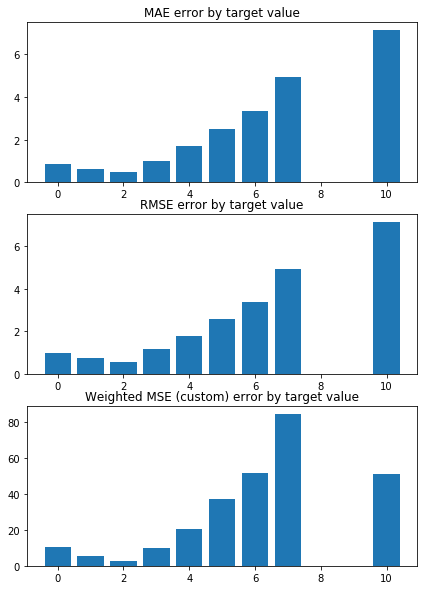

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7973870303161483 


 TRAIN PREDICTION Error
weighted_mse_train: 0.901513807898884 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


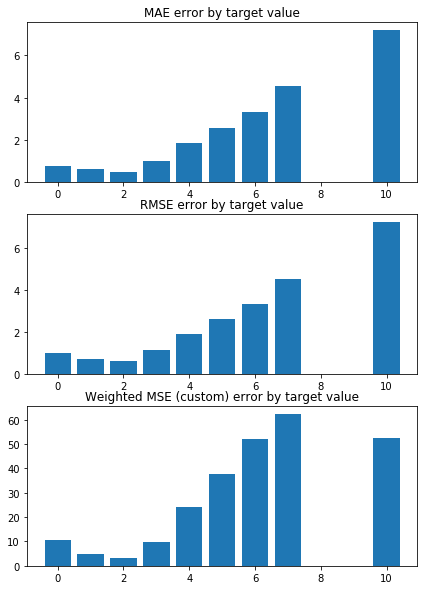

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049348332648658 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794603422045527 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


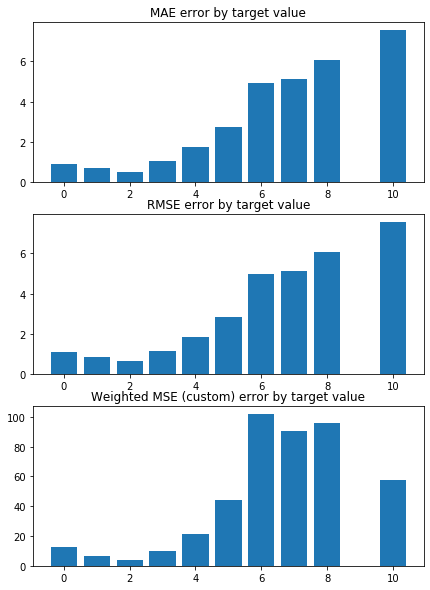

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9339474918610555 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8845184076057504 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


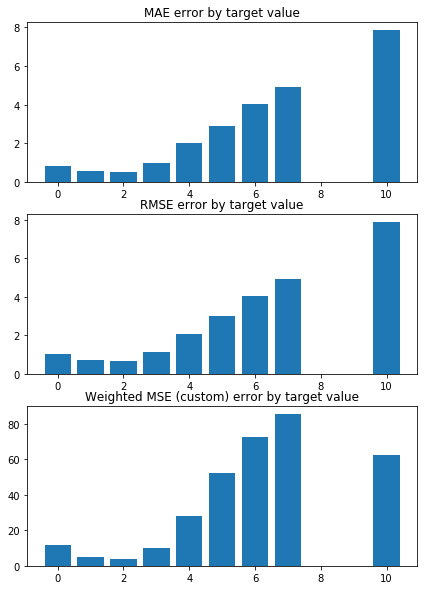

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773070938035704 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794086534533413 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


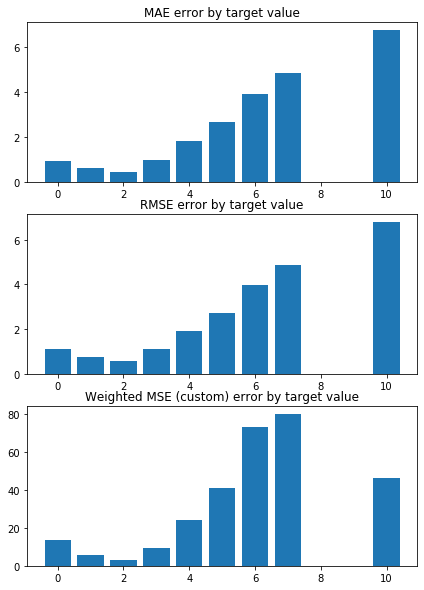

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036379074530607 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8878813674775387 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


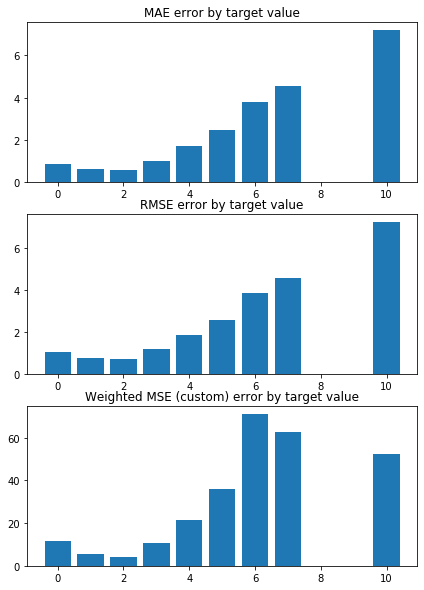

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9039537234786955 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8919132554622657 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


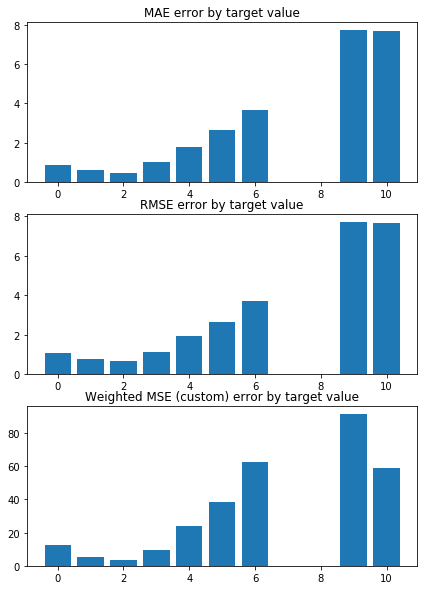

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8886319254782223 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8926612530922257 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


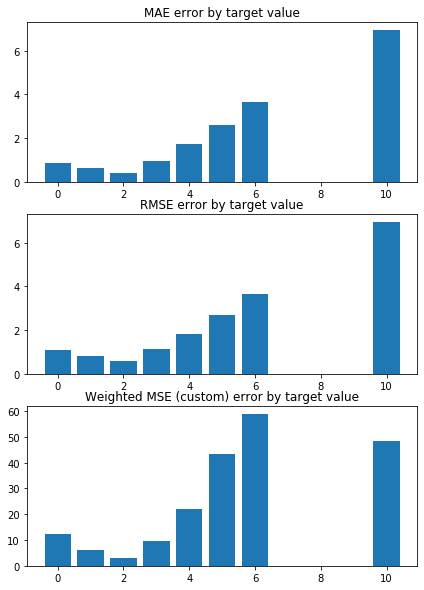

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9600682385905354 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8824203177224291 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


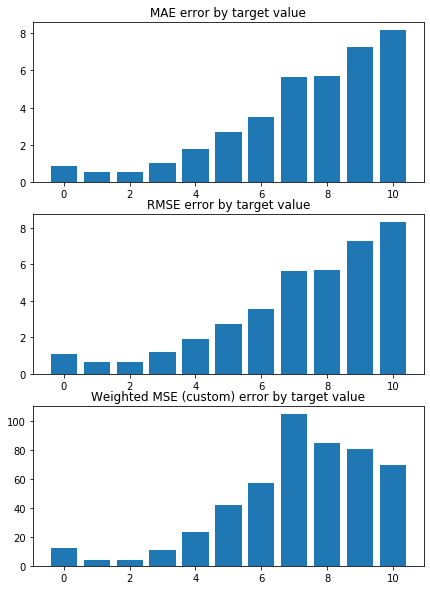

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7525107424346698 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9095649095721037 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


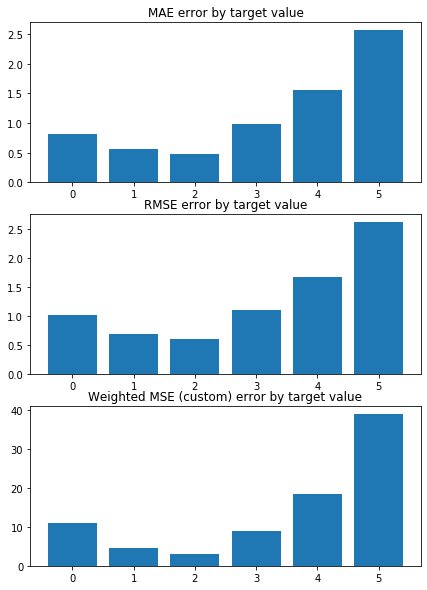

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.469384365609352 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4810152041035445 

Root of MSE on Test: 0.95 
 1.2169696808481074 

Variance score on Test: 0.08 
 r2_test: 0.3159050190265128 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.423398  0.277381 -0.274082 -0.187149 -0.165007 -0.150219 -0.144938   
1 -0.413124  0.317651 -0.301064 -0.220775 -0.161264 -0.139059 -0.205694   
2 -0.375522  0.228678 -0.284468 -0.178209 -0.175772 -0.153776 -0.093561   
3 -0.387543  0.276106 -0.316860 -0.209495 -0.177180 -0.156588 -0.160405   
4 -0.364067  0.265808 -0.290102 -0.222402 -0.171356 -0.148411 -0.154791   
5 -0.401495  0.250433 -0.279503 -0.209148 -0.173263 -0.140632 -0.135679   
6 -0.386513  0.337081 -0.282271 -0.185011 -0.188409 -0.161410 -0.208362   
7 -0.425006  0.325725 -0.298127 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


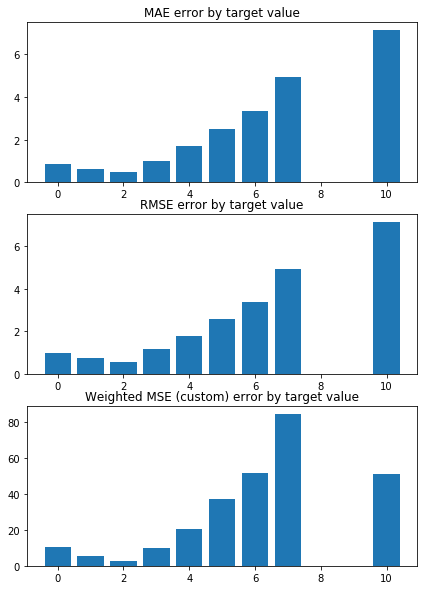

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7972931656632558 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9014758401166595 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


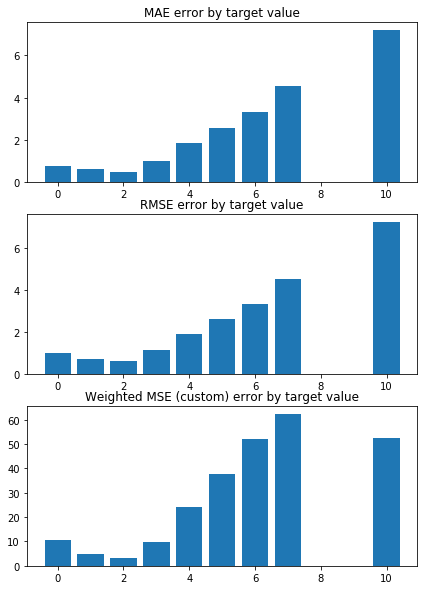

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049447608514632 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794403414231564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


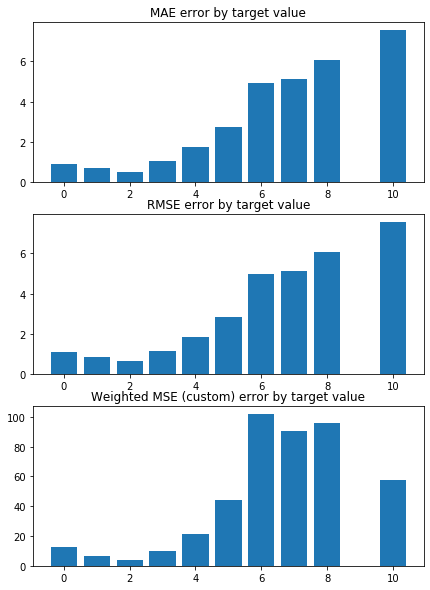

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9339052092717047 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8844851535041226 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


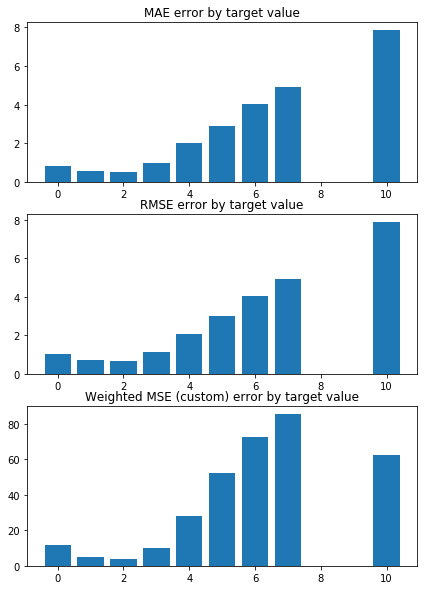

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9772927049055159 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8793786464697404 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


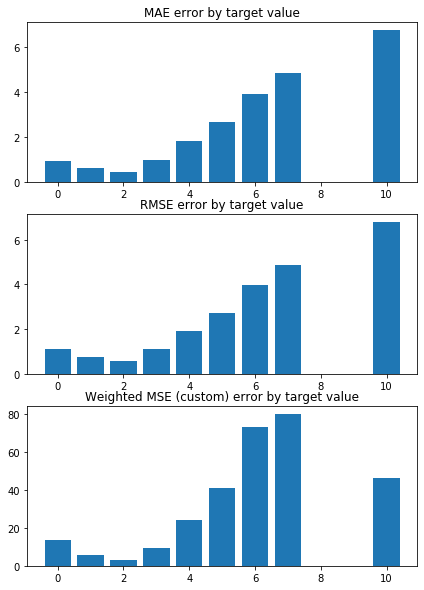

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036364937800498 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8878558703169499 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


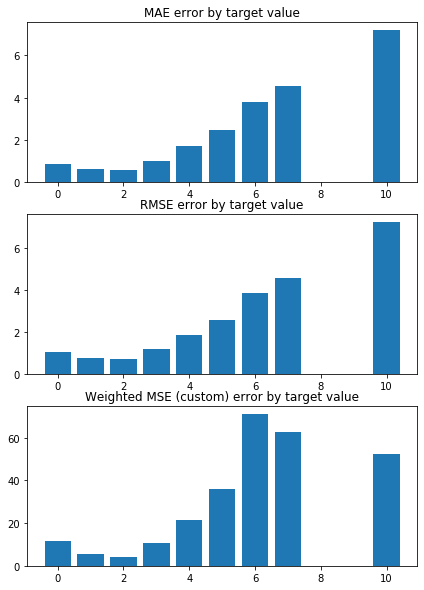

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9038621460546338 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8918724373636351 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


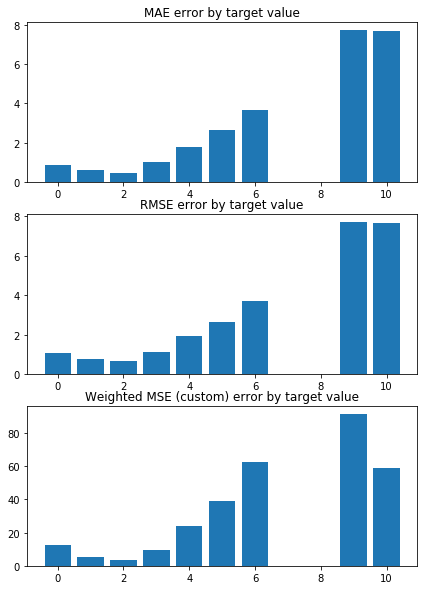

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.888507483987481 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8926211868613355 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


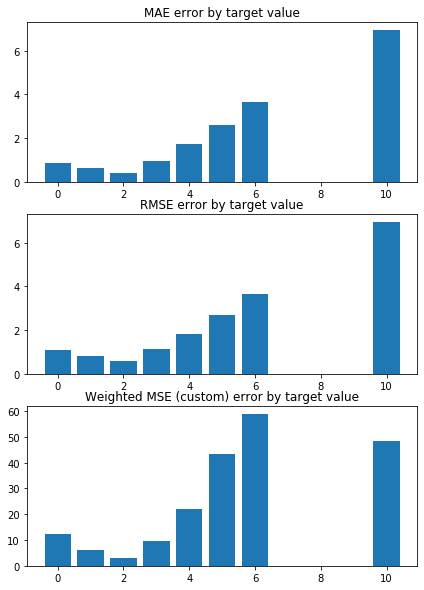

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9599898902258688 


 TRAIN PREDICTION Error
weighted_mse_train: 0.882379895515689 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


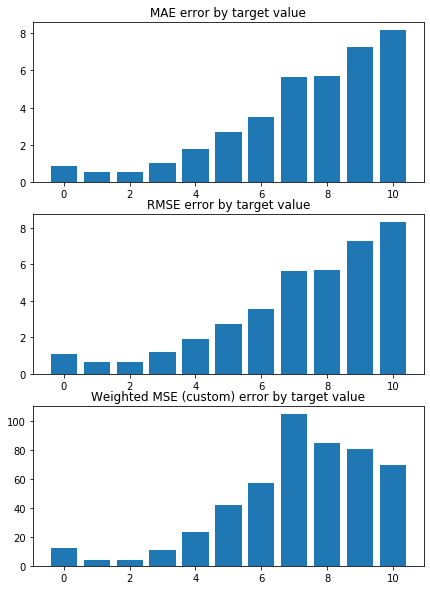

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7524577830393013 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9095264357706772 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


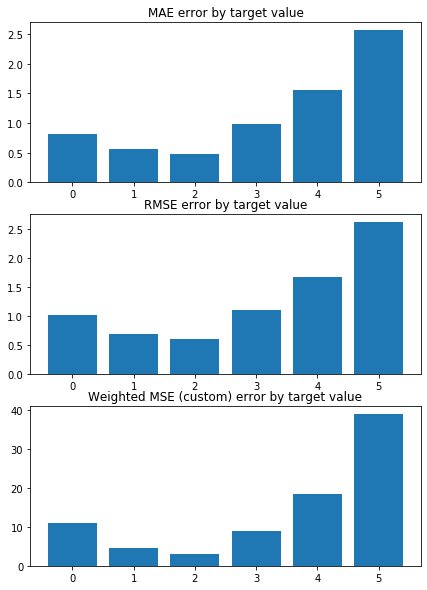

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693856162735692 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4809916875779392 

Root of MSE on Test: 0.95 
 1.216960018890489 

Variance score on Test: 0.08 
 r2_test: 0.315918038674552 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.422521  0.276041 -0.273565 -0.187006 -0.165058 -0.150181 -0.143504   
1 -0.412279  0.316034 -0.300491 -0.220522 -0.161316 -0.139029 -0.203944   
2 -0.374849  0.227641 -0.284058 -0.177991 -0.175814 -0.153719 -0.092428   
3 -0.386774  0.274676 -0.316300 -0.209289 -0.177212 -0.156540 -0.158864   
4 -0.363434  0.264498 -0.289640 -0.222061 -0.171390 -0.148358 -0.153353   
5 -0.400684  0.249182 -0.278971 -0.208978 -0.173299 -0.140603 -0.134317   
6 -0.385769  0.335427 -0.281782 -0.184760 -0.188439 -0.161352 -0.206581   
7 -0.424092  0.324059 -0.297520 -0.20

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


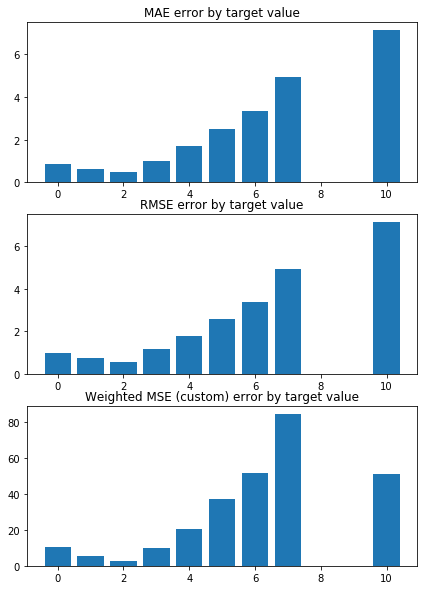

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7972006668821797 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9014387010699211 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


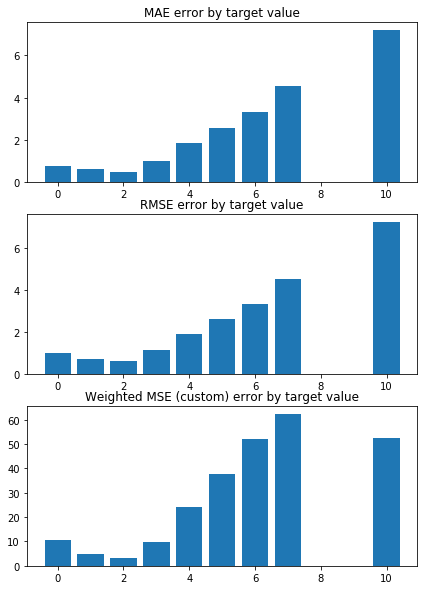

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.004954670021652 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794207629758074 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


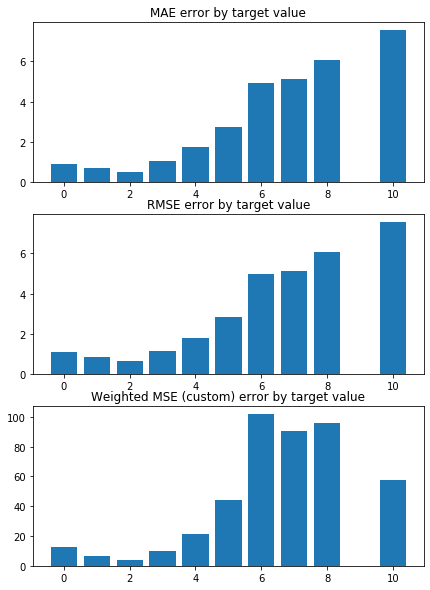

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9338636196795164 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8844525860136333 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


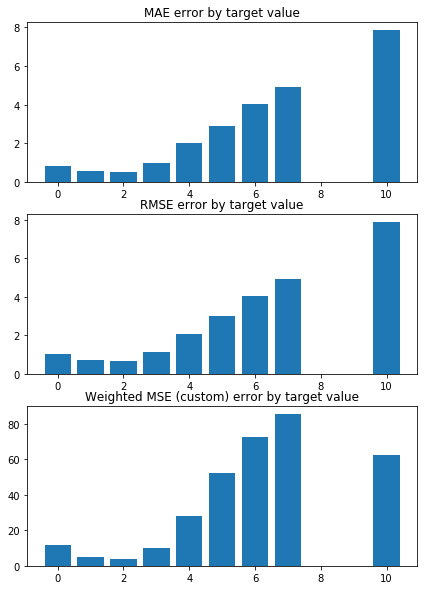

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9772786677434446 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8793492693235023 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


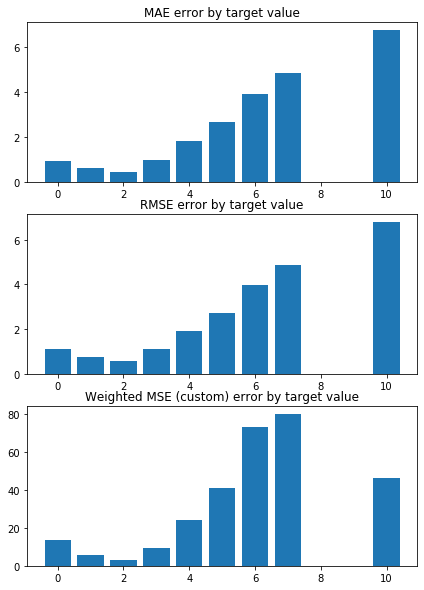

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036354461629936 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8878309361203758 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


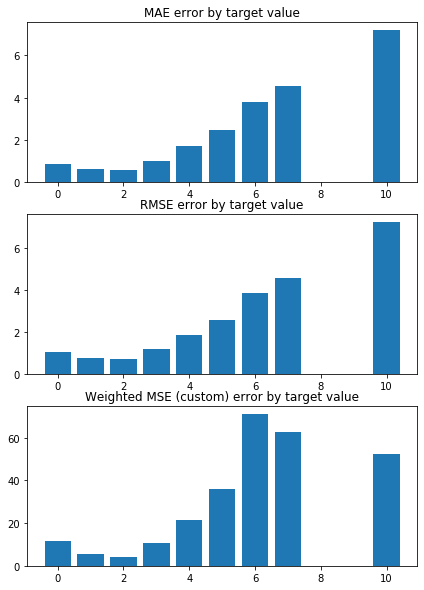

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9037720152382658 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8918324585867109 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


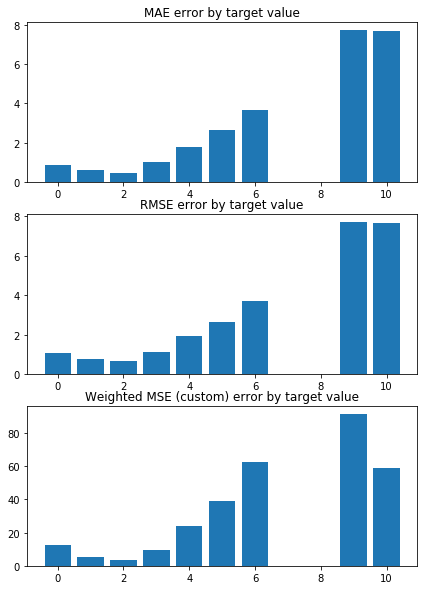

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8883848765720045 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8925820092188701 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


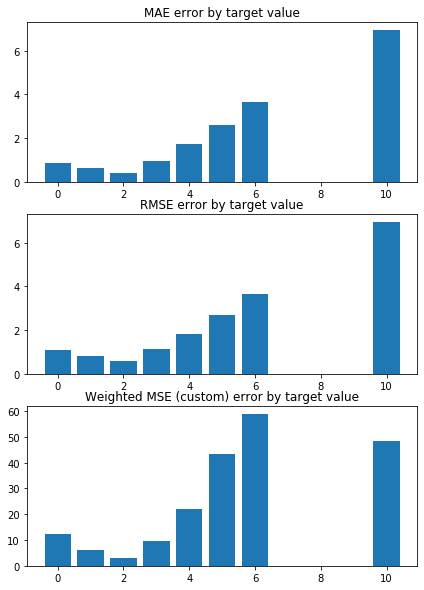

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9599132979871047 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8823403678356739 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


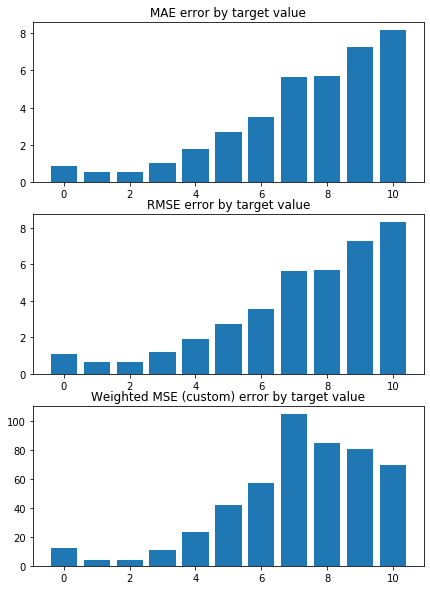

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7524057203521555 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9094887599918929 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


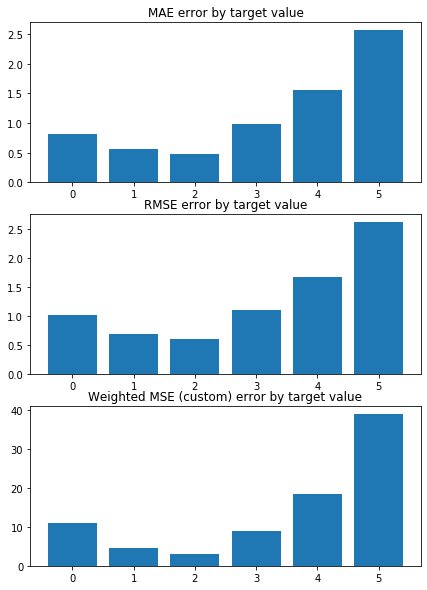

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693873403085638 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4809689202121041 

Root of MSE on Test: 0.95 
 1.2169506646582284 

Variance score on Test: 0.08 
 r2_test: 0.31593068414516984 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.421652  0.274717 -0.273054 -0.186863 -0.165109 -0.150142 -0.142088   
1 -0.411442  0.314436 -0.299924 -0.220268 -0.161368 -0.138998 -0.202215   
2 -0.374180  0.226617 -0.283653 -0.177773 -0.175855 -0.153661 -0.091308   
3 -0.386012  0.273264 -0.315745 -0.209084 -0.177243 -0.156491 -0.157342   
4 -0.362805  0.263203 -0.289181 -0.221722 -0.171424 -0.148304 -0.151932   
5 -0.399880  0.247946 -0.278445 -0.208807 -0.173336 -0.140573 -0.132972   
6 -0.385029  0.333794 -0.281298 -0.184509 -0.188468 -0.161293 -0.204822   
7 -0.423186  0.322413 -0.296919 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


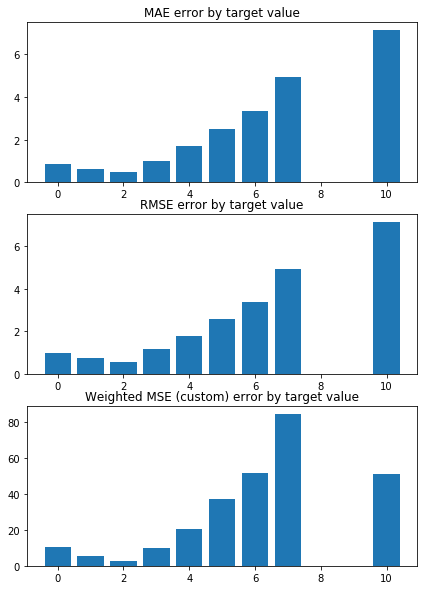

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7971095054328081 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9014023704065419 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


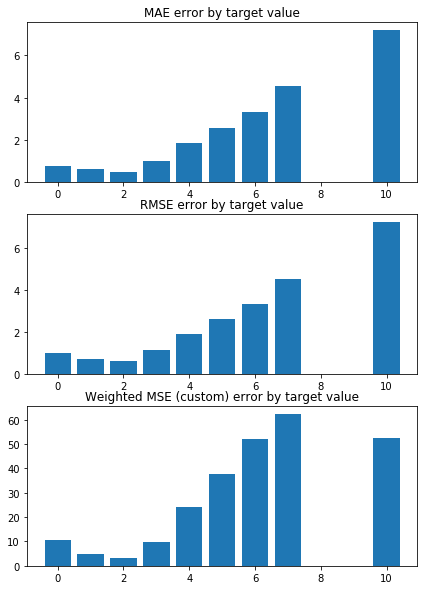

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049645600793837 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794015974817099 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


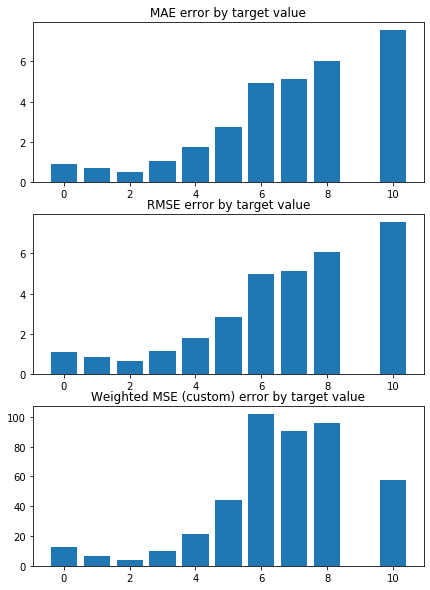

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9338227047722371 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8844206881897404 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


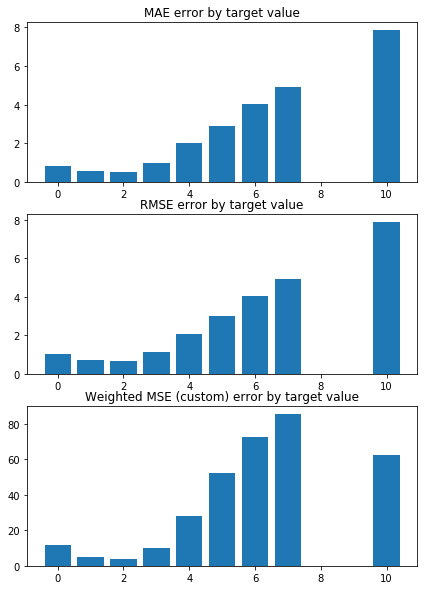

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9772649748183106 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8793205076937505 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


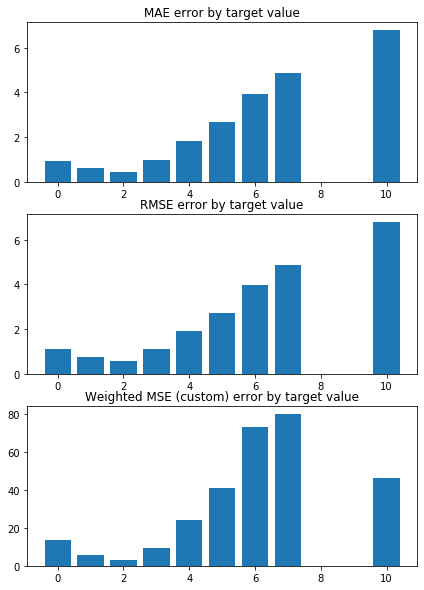

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036347520663088 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8878065509029992 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


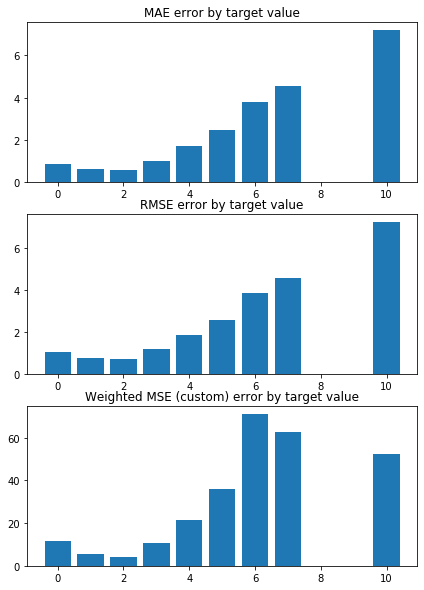

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036833011920072 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8917932991828889 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


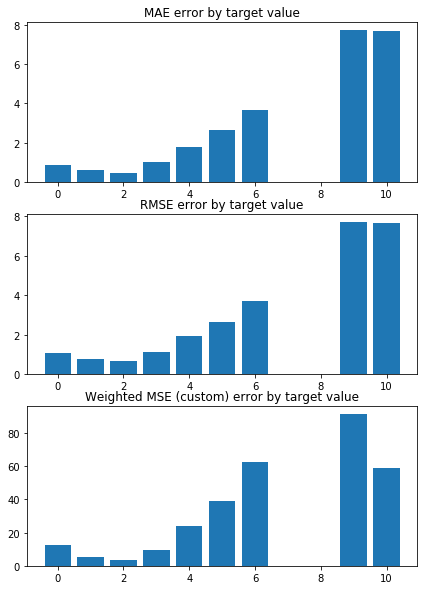

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8882640629932227 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8925436978567802 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


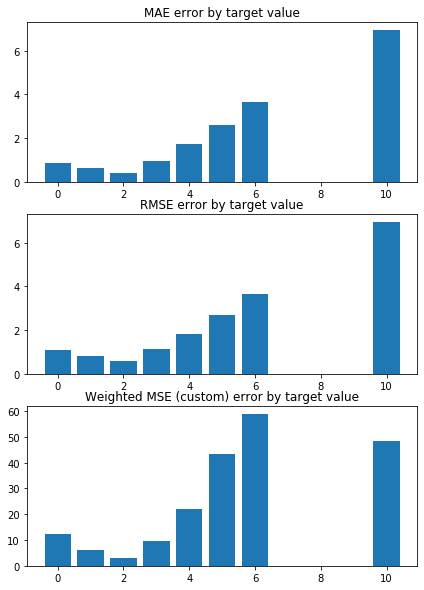

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9598384184520541 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8823017112571594 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


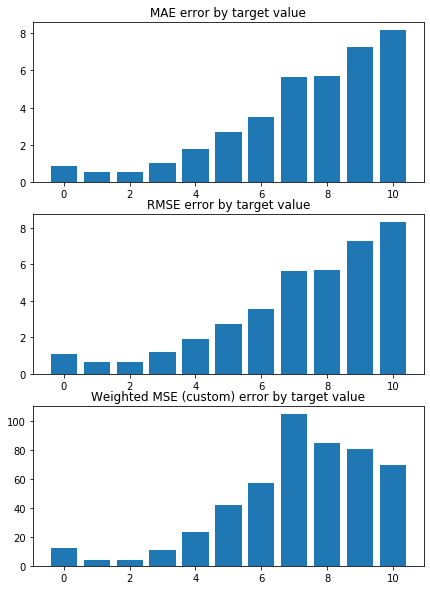

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7523545338849638 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9094518629577787 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


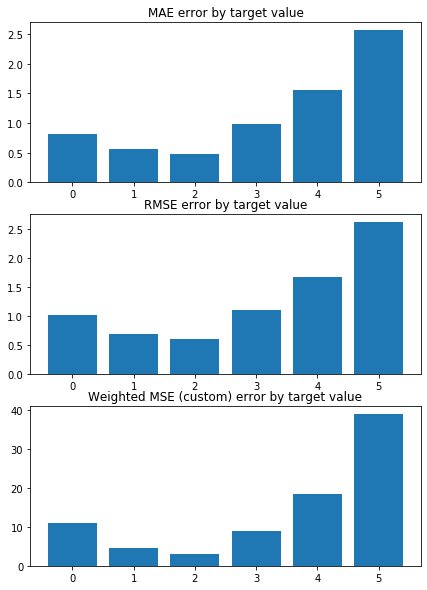

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.469389523009506 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4809468816544122 

Root of MSE on Test: 0.95 
 1.2169416097966297 

Variance score on Test: 0.08 
 r2_test: 0.3159429653758459 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.420790  0.273410 -0.272548 -0.186719 -0.165159 -0.150103 -0.140689   
1 -0.410612  0.312858 -0.299363 -0.220015 -0.161419 -0.138966 -0.200507   
2 -0.373516  0.225605 -0.283250 -0.177557 -0.175896 -0.153604 -0.090202   
3 -0.385257  0.271870 -0.315196 -0.208878 -0.177274 -0.156443 -0.155840   
4 -0.362180  0.261924 -0.288727 -0.221385 -0.171457 -0.148251 -0.150528   
5 -0.399083  0.246725 -0.277925 -0.208635 -0.173372 -0.140543 -0.131643   
6 -0.384296  0.332179 -0.280819 -0.184260 -0.188497 -0.161234 -0.203083   
7 -0.422289  0.320786 -0.296324 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


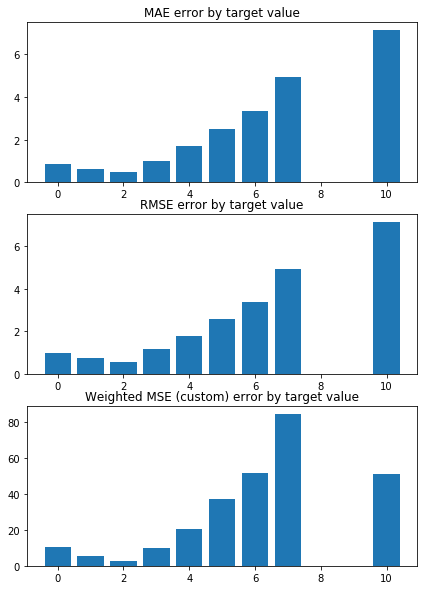

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7970196535745142 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9013668284063816 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


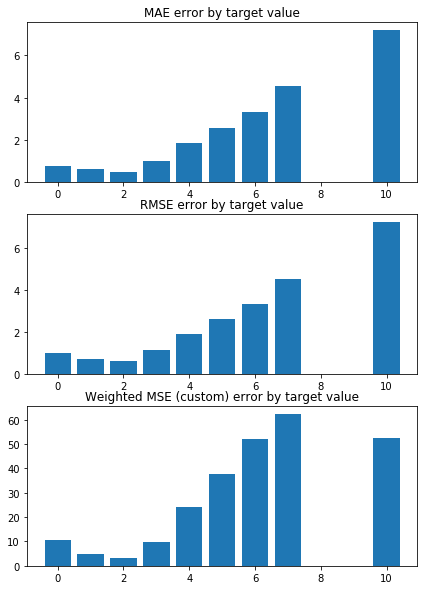

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049744303529566 


 TRAIN PREDICTION Error
weighted_mse_train: 0.879382835823701 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


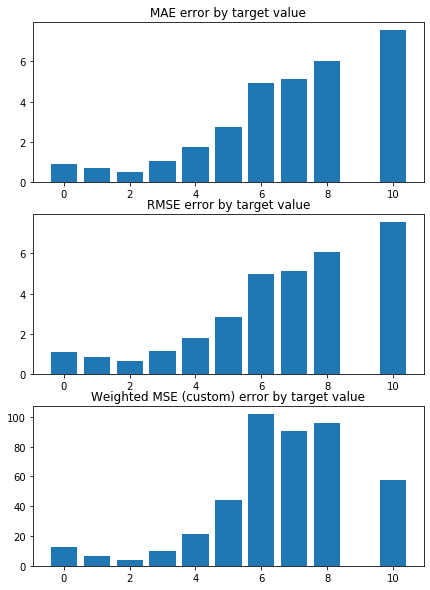

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9337824468486686 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8843894436304524 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


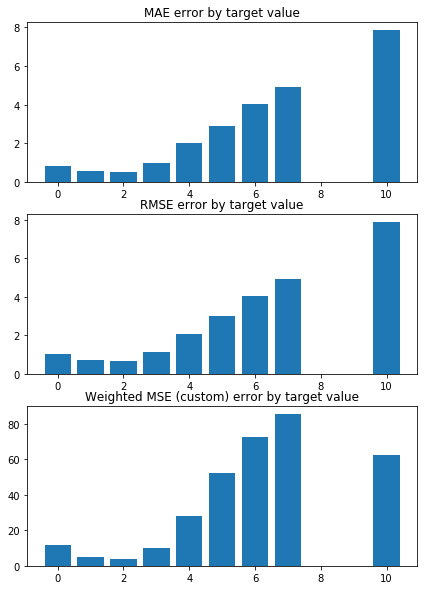

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9772516188235393 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8792923476664464 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


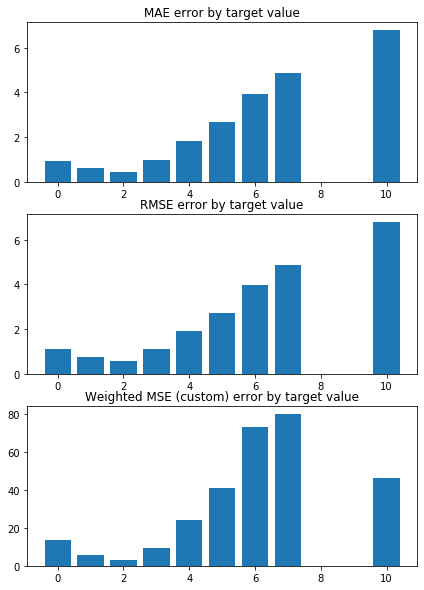

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036343994289154 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8877827011311147 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


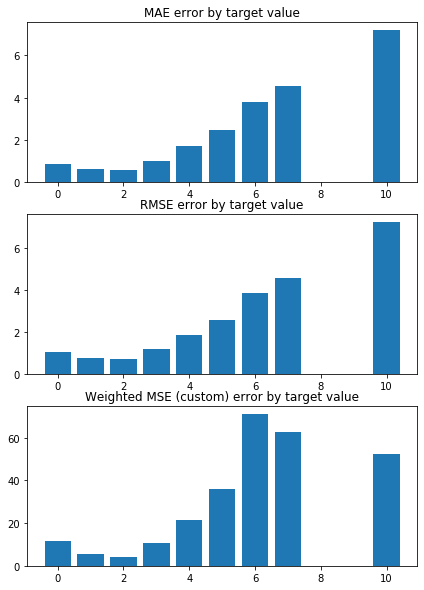

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.903595974867592 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8917549397943152 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


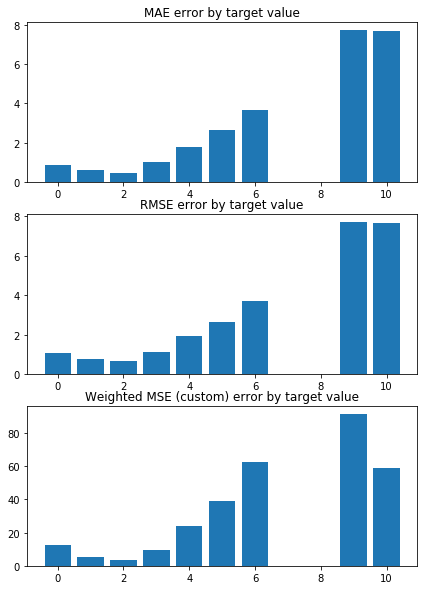

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8881450042078648 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8925062311772428 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


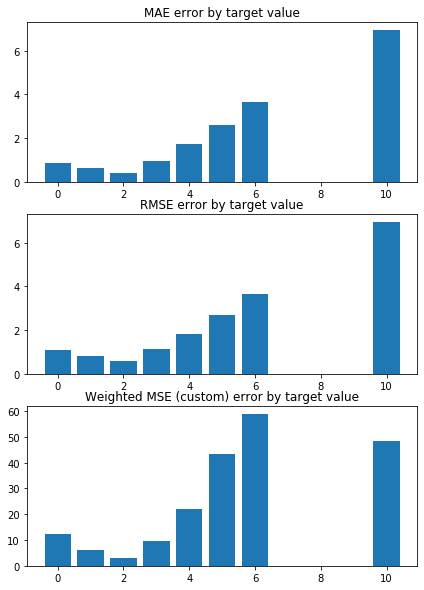

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9597652095833961 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8822639031381041 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


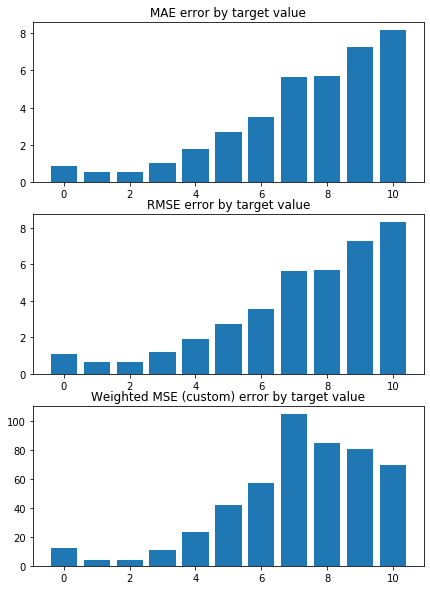

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7523042037644193 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9094157259825529 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


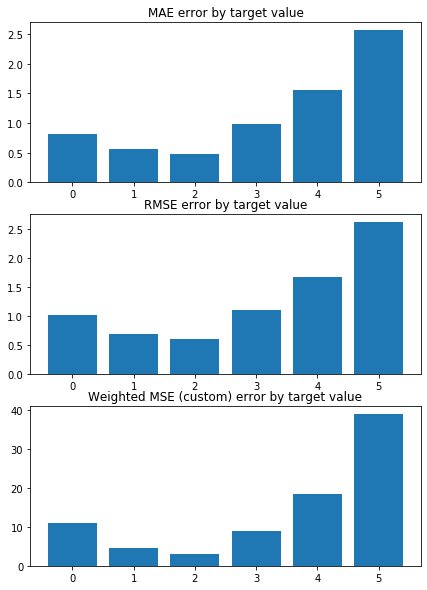

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.469392150188599 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4809255522342804 

Root of MSE on Test: 0.95 
 1.2169328462303417 

Variance score on Test: 0.08 
 r2_test: 0.31595489197578075 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.419936  0.272118 -0.272048 -0.186574 -0.165209 -0.150064 -0.139307   
1 -0.409788  0.311298 -0.298808 -0.219763 -0.161470 -0.138934 -0.198819   
2 -0.372857  0.224605 -0.282852 -0.177342 -0.175937 -0.153546 -0.089109   
3 -0.384508  0.270493 -0.314653 -0.208672 -0.177304 -0.156394 -0.154355   
4 -0.361560  0.260661 -0.288277 -0.221050 -0.171490 -0.148197 -0.149140   
5 -0.398292  0.245519 -0.277411 -0.208463 -0.173407 -0.140512 -0.130330   
6 -0.383568  0.330583 -0.280345 -0.184012 -0.188526 -0.161174 -0.201364   
7 -0.421399  0.319180 -0.295736 -0.

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


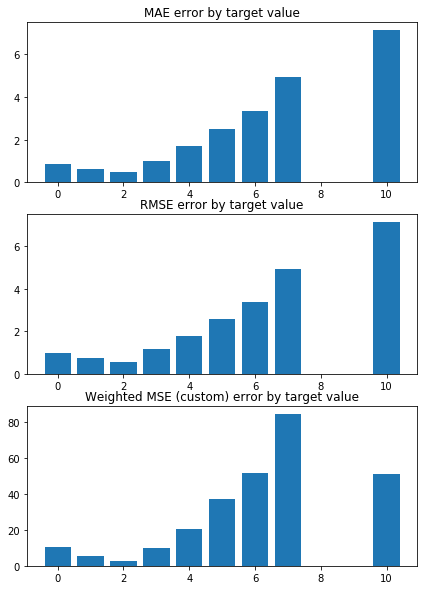

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.796931084337944 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9013320559572356 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


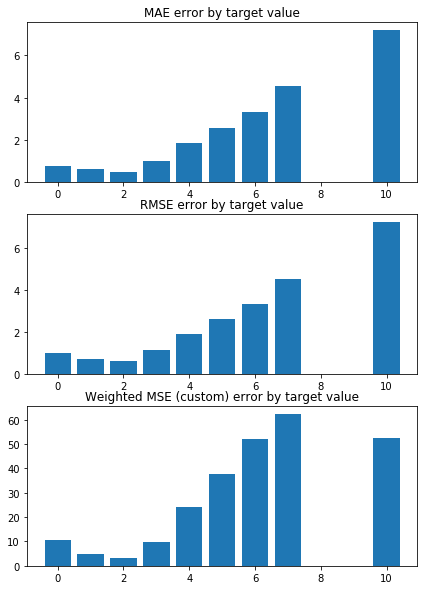

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049842801943973 


 TRAIN PREDICTION Error
weighted_mse_train: 0.879364469139195 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


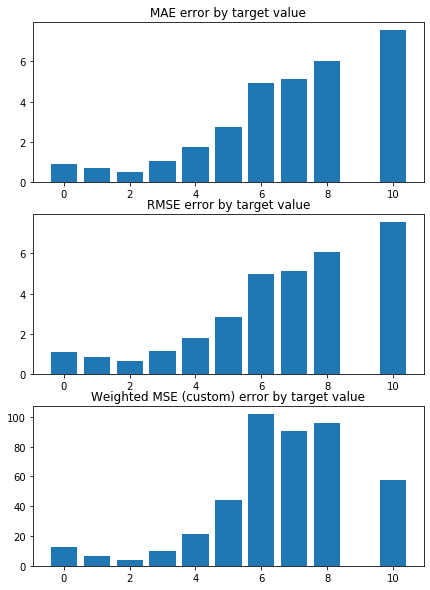

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9337428287941661 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8843588364548591 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


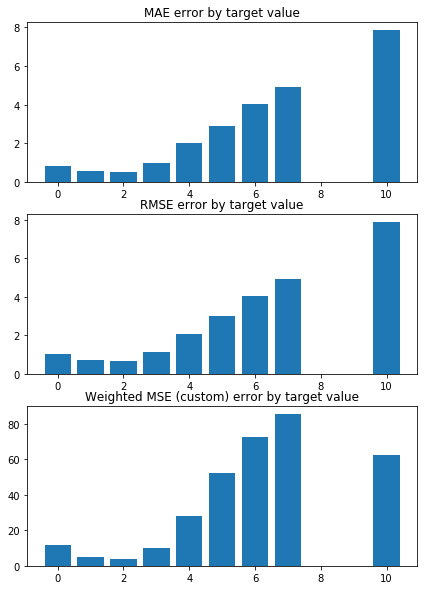

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9772385926394201 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8792647757204288 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


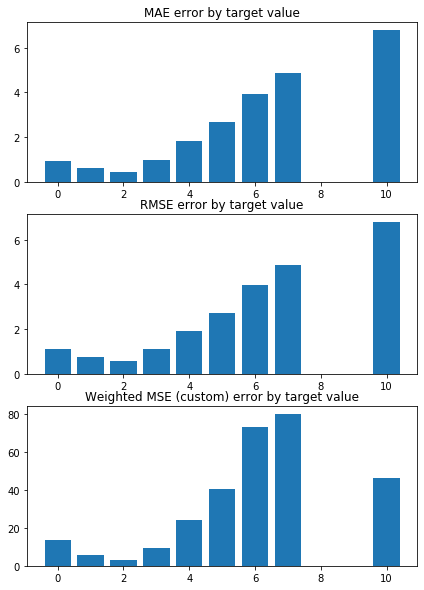

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.903634376643317 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8877593737040204 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


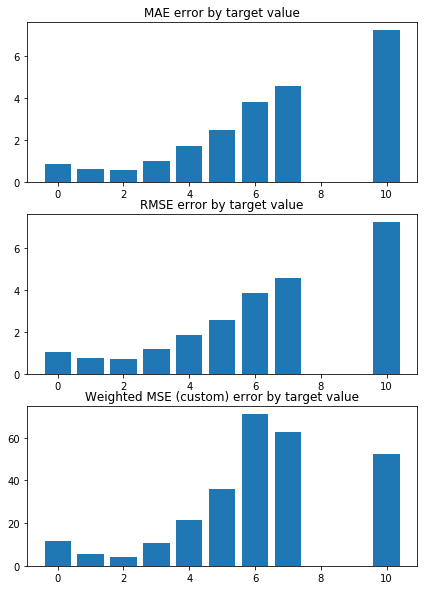

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9035100079805747 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8917173616327989 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


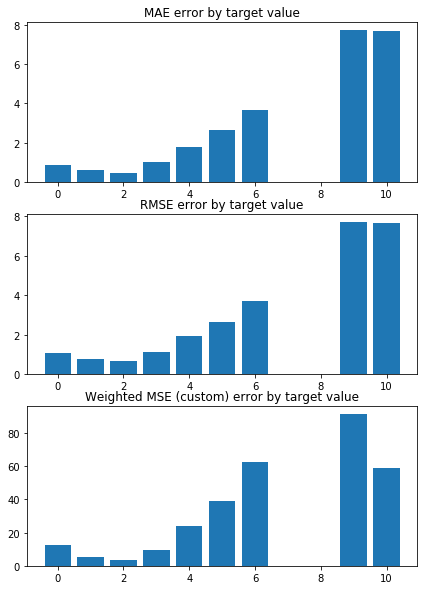

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8880276623229946 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8924695882648283 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


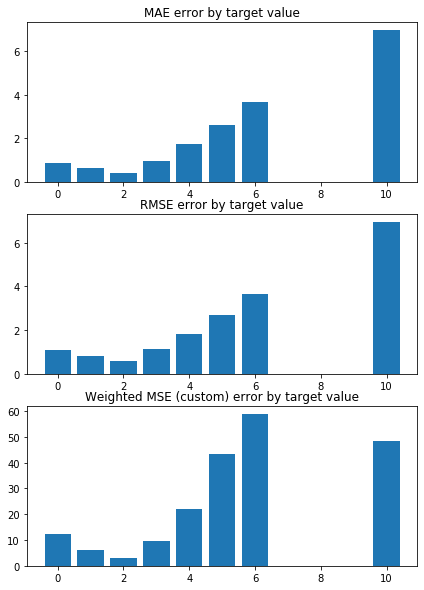

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9596936306736076 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8822269215873416 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


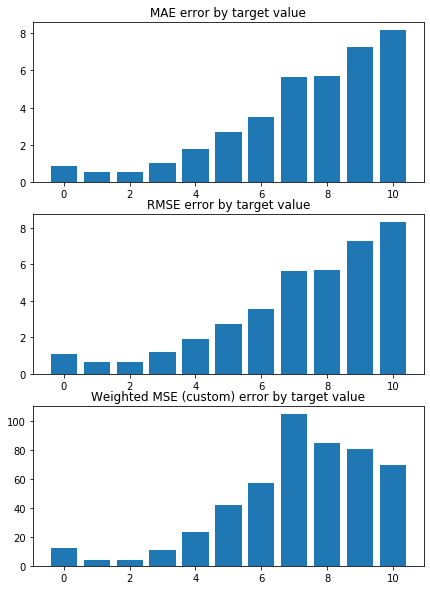

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7522547107091554 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9093803309502466 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


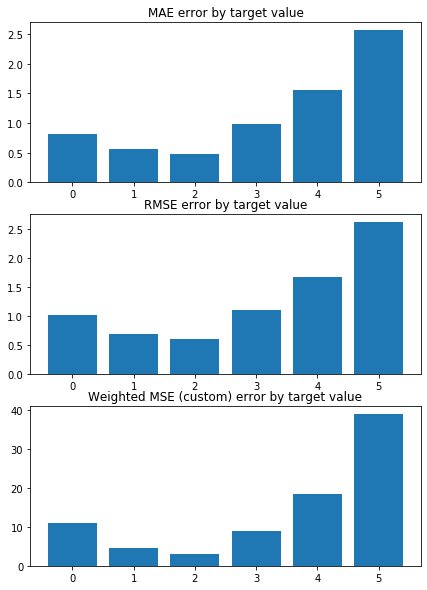

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.469395208153665 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4809049129346372 

Root of MSE on Test: 0.95 
 1.216924366152078 

Variance score on Test: 0.08 
 r2_test: 0.3159664732390516 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz  H3K36me3   H3K9me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.419089 -0.271554  0.270841 -0.186427 -0.165259 -0.150024 -0.137941   
1 -0.408972 -0.298259  0.309757 -0.219510 -0.161521 -0.138902 -0.197151   
2 -0.372202 -0.282456  0.223617 -0.177127 -0.175977 -0.153488 -0.088028   
3 -0.383765 -0.314116  0.269133 -0.208466 -0.177334 -0.156344 -0.152889   
4 -0.360944 -0.287831  0.259411 -0.220717 -0.171523 -0.148143 -0.147768   
5 -0.397509 -0.276902  0.244328 -0.208290 -0.173443 -0.140481 -0.129033   
6 -0.382846 -0.279875  0.329006 -0.183765 -0.188554 -0.161115 -0.199665   
7 -0.420518 -0.295155  0.317592 -0.20

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


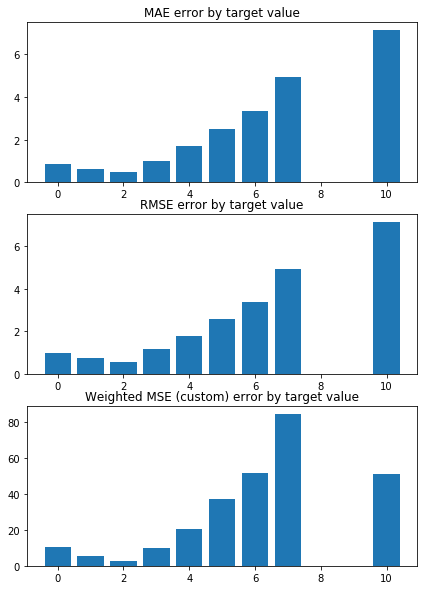

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.796843771498013 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9012980345318785 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


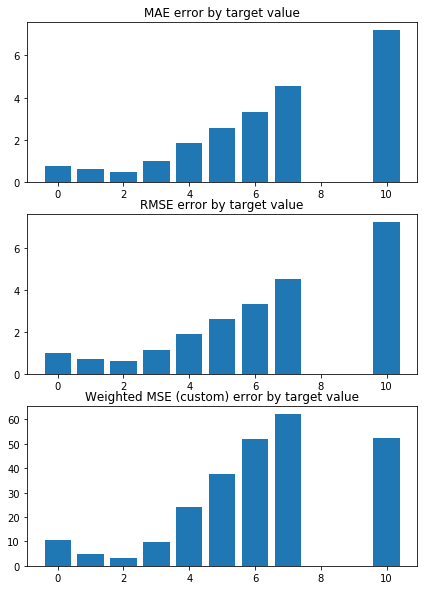

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049941089788488 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8793464888114925 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


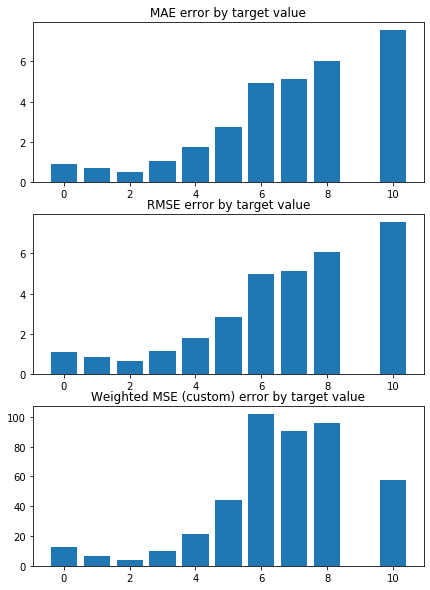

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9337038340572914 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8843288512826791 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


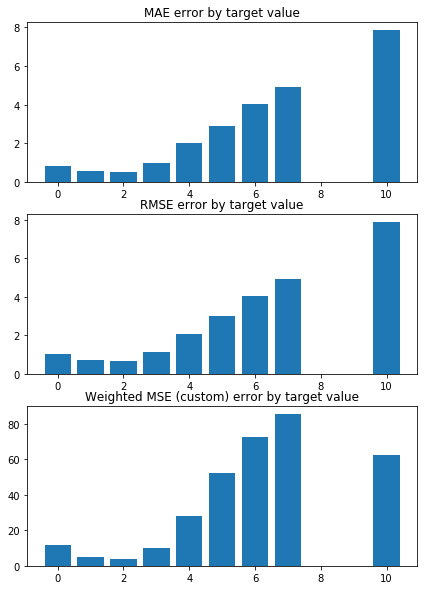

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9772258893276756 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8792377787140175 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


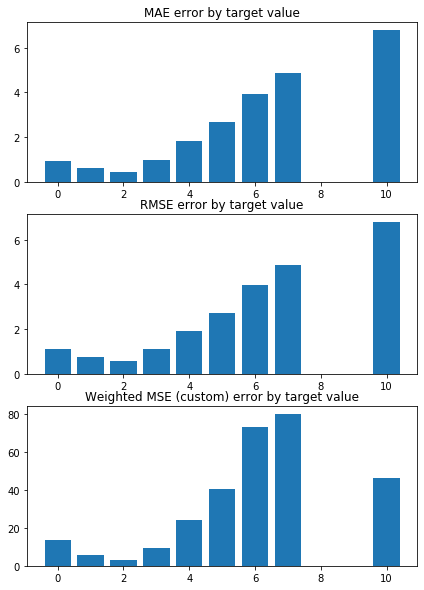

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036346725357493 


 TRAIN PREDICTION Error
weighted_mse_train: 0.887736555936788 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


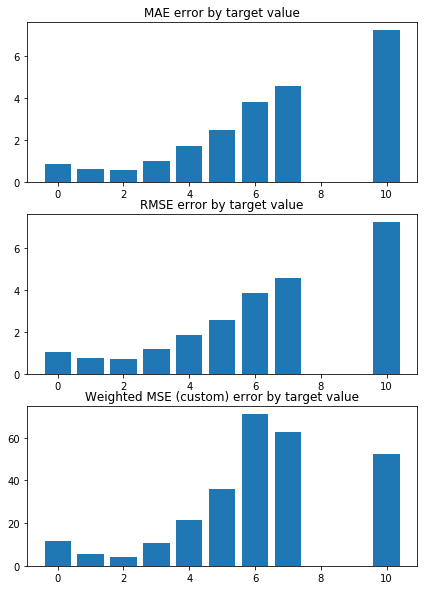

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.903425372985811 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8916805464596135 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


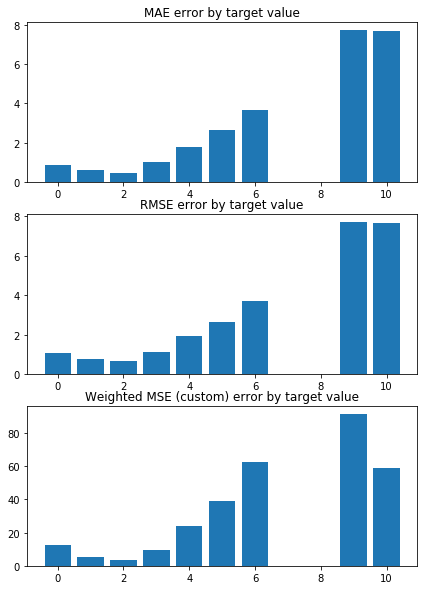

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8879120005531033 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8924337488599735 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


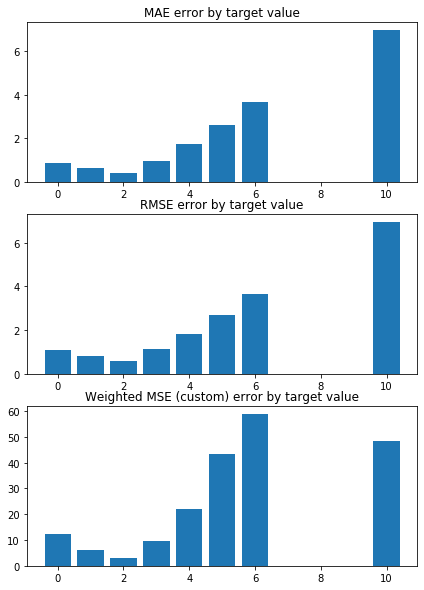

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.959623642292528 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8821907454338688 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


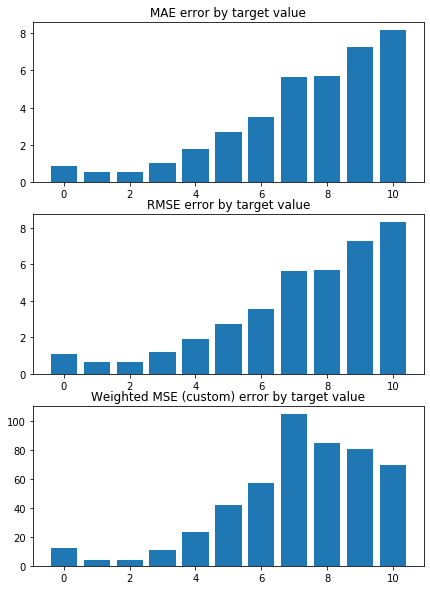

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7522060360077731 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9093456602933386 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


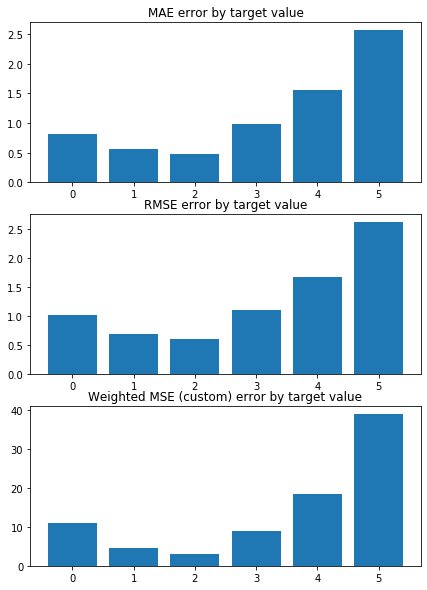

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.469398683687775 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4808849453657058 

Root of MSE on Test: 0.95 
 1.2169161620118725 

Variance score on Test: 0.08 
 r2_test: 0.3159777181571416 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz  H3K36me3   H3K9me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.418249 -0.271066  0.269580 -0.186281 -0.165308 -0.149984 -0.136591   
1 -0.408162 -0.297716  0.308233 -0.219258 -0.161571 -0.138869 -0.195503   
2 -0.371552 -0.282065  0.222640 -0.176914 -0.176017 -0.153430 -0.086960   
3 -0.383029 -0.313584  0.267789 -0.208260 -0.177364 -0.156294 -0.151441   
4 -0.360332 -0.287388  0.258177 -0.220385 -0.171556 -0.148089 -0.146413   
5 -0.396732 -0.276399  0.243151 -0.208116 -0.173478 -0.140450 -0.127752   
6 -0.382129 -0.279410  0.327447 -0.183519 -0.188582 -0.161055 -0.197986   
7 -0.419643 -0.294579  0.316024 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


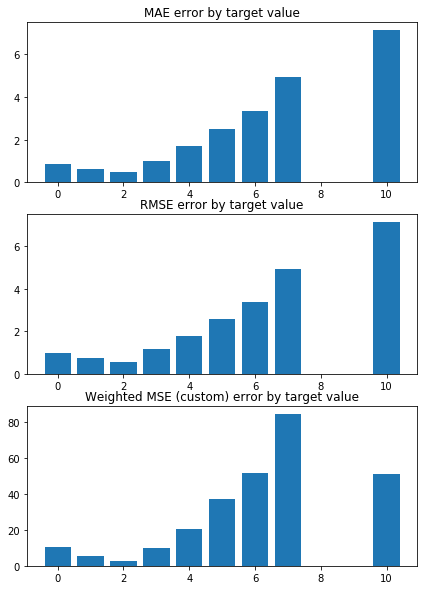

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.796757689548054 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9012647461661433 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


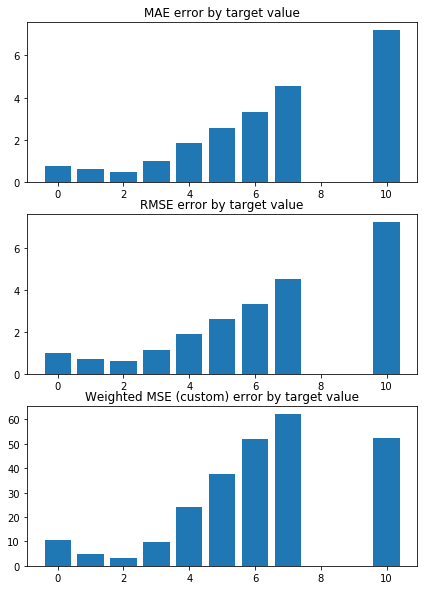

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.005003916103963 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8793288864614467 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


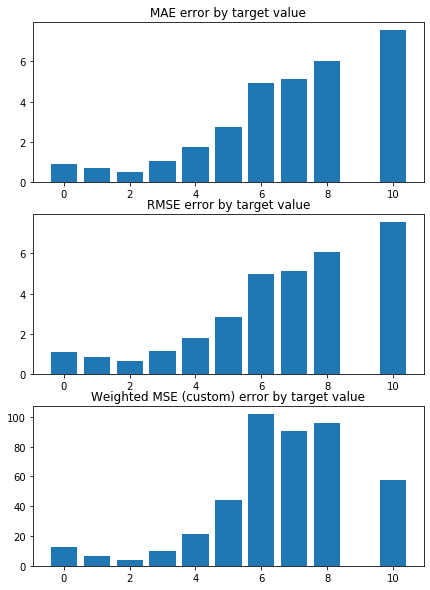

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9336654466275619 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8842994732147678 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


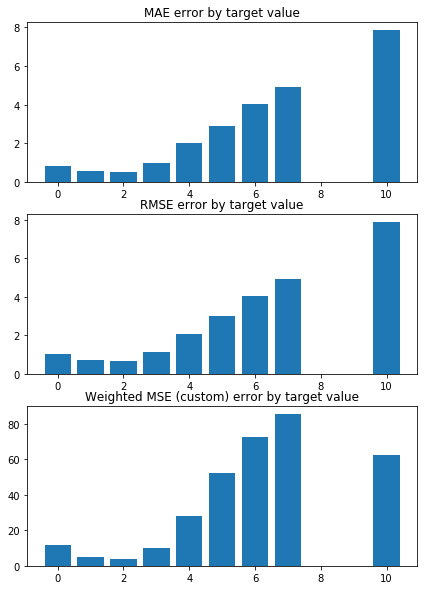

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.977213502126195 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8792113438721565 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


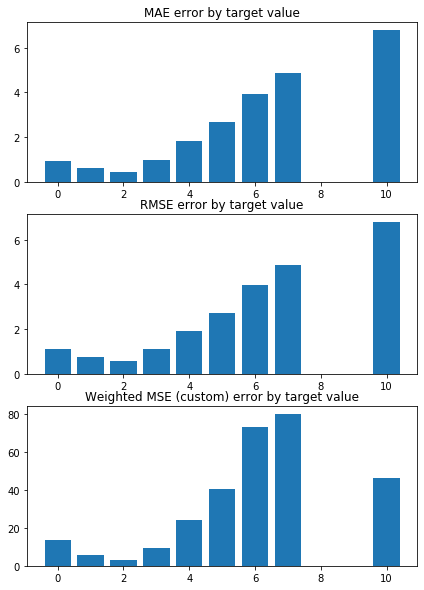

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036352763473395 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8877142355438573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


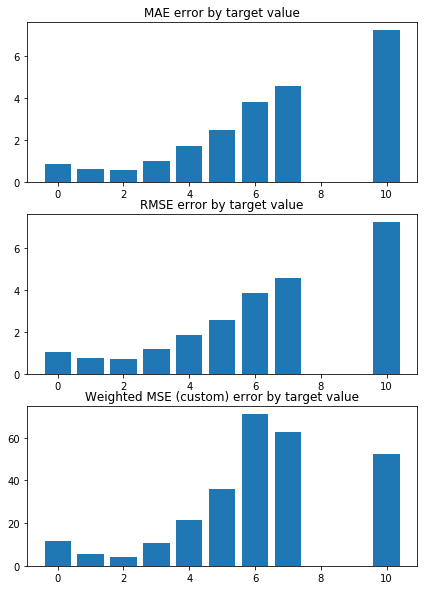

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9033420430538638 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8916444765661399 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


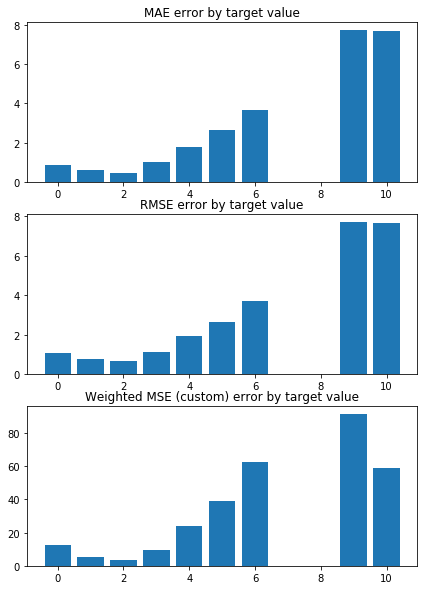

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8877979831791468 


 TRAIN PREDICTION Error
weighted_mse_train: 0.892398693333693 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


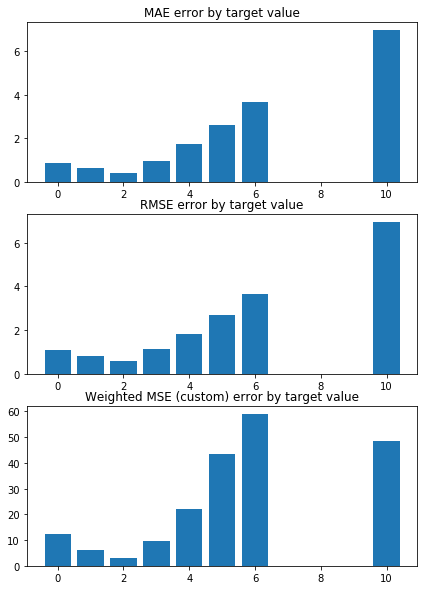

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9595552062374183 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8821553541976407 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


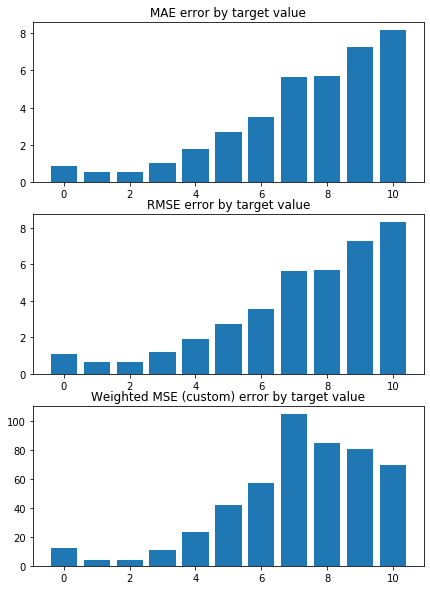

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7521581614978559 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9093116969723564 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


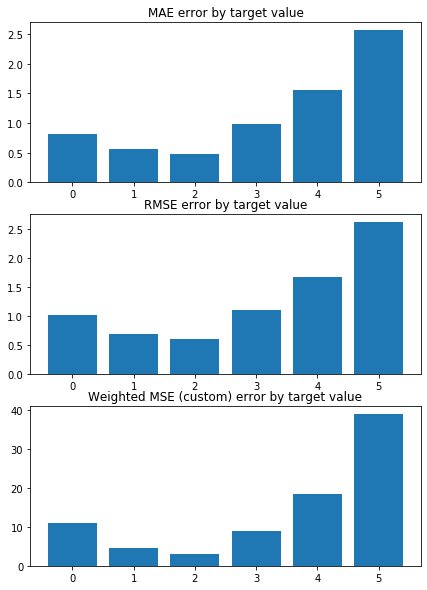

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4694025640298574 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4808656317400355 

Root of MSE on Test: 0.95 
 1.2169082265068454 

Variance score on Test: 0.08 
 r2_test: 0.3159886354308798 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz  H3K36me3   H3K9me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.417416 -0.270583  0.268334 -0.186133 -0.165357 -0.149944 -0.135257   
1 -0.407360 -0.297179  0.306728 -0.219006 -0.161620 -0.138836 -0.193873   
2 -0.370906 -0.281676  0.221675 -0.176702 -0.176056 -0.153372 -0.085905   
3 -0.382298 -0.313057  0.266462 -0.208054 -0.177394 -0.156244 -0.150010   
4 -0.359725 -0.286949  0.256956 -0.220056 -0.171588 -0.148035 -0.145072   
5 -0.395961 -0.275901  0.241988 -0.207941 -0.173512 -0.140418 -0.126485   
6 -0.381418 -0.278950  0.325906 -0.183275 -0.188609 -0.160995 -0.196326   
7 -0.418777 -0.294010  0.314474 -0.

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,1.481065,0.282409,1.469383,0.031231,-,"Ridge(alpha=0, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3887606228653474, 0.34273677454255513, 0.24...",0.897027,0.075413,0.890609,0.009361
1,1.481039,0.282437,1.469384,0.031231,-,"Ridge(alpha=1, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3887528792879803, 0.3427856055487003, 0.240...",0.896977,0.075428,0.890574,0.009358
2,1.481015,0.282465,1.469384,0.031231,-,"Ridge(alpha=2, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3887450051090875, 0.3428336572115731, 0.240...",0.896927,0.075442,0.890539,0.009354
3,1.480992,0.282493,1.469386,0.031231,-,"Ridge(alpha=3, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.388737006731514, 0.342880946675013, 0.24029...",0.896879,0.075456,0.890505,0.009351
4,1.480969,0.282520,1.469387,0.031231,-,"Ridge(alpha=4, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3887288902703896, 0.3429274905760309, 0.240...",0.896831,0.075470,0.890471,0.009347
5,1.480947,0.282547,1.469390,0.031231,-,"Ridge(alpha=5, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3887206615672334, 0.34297330506363377, 0.24...",0.896784,0.075484,0.890439,0.009344
6,1.480926,0.282573,1.469392,0.031231,-,"Ridge(alpha=6, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3887123262032778, 0.34301840581680076, 0.24...",0.896738,0.075497,0.890407,0.009341
7,1.480905,0.282599,1.469395,0.031232,-,"Ridge(alpha=7, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.388703889512065, 0.3430628080616601, 0.2401...",0.896693,0.075511,0.890376,0.009337
8,1.480885,0.282626,1.469399,0.031232,-,"Ridge(alpha=8, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.38869535659136123, 0.34310652658790275, 0.2...",0.896649,0.075524,0.890345,0.009334
9,1.480866,0.282651,1.469403,0.031232,-,"Ridge(alpha=9, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3886867323144255, 0.343149575764479, 0.2400...",0.896606,0.075537,0.890315,0.009331


In [97]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 10, 1)
# Create linear regression object



model_name = 'LR+L2_grid10'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

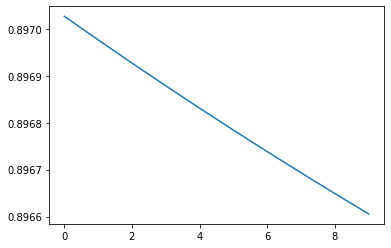

In [98]:
plt.plot(alpha_grid, wmse_test)

In [99]:
wmse_test

[0.8970270236385339,
 0.8969766637711013,
 0.8969272380470095,
 0.8968787239736018,
 0.8968310997629869,
 0.8967843443046226,
 0.8967384371391885,
 0.8966933584336685,
 0.8966490889575806,
 0.8966056100602927]

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.85303769182047 


 TRAIN PREDICTION Error
weighted_mse_train: 0.897951746080905 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


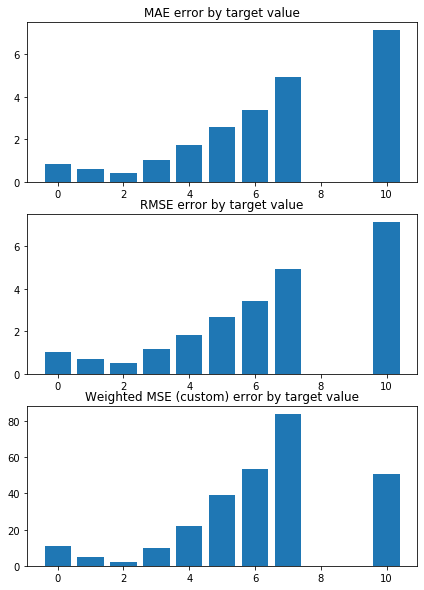

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7897682872139054 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9040645171860953 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


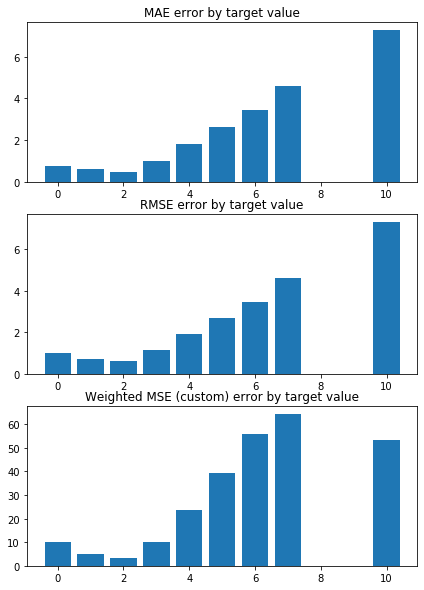

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0063612833136828 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8821896896559672 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


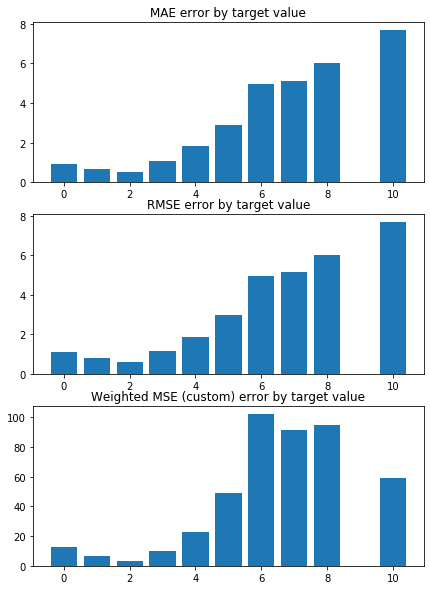

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9273691865769049 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8864903428810442 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


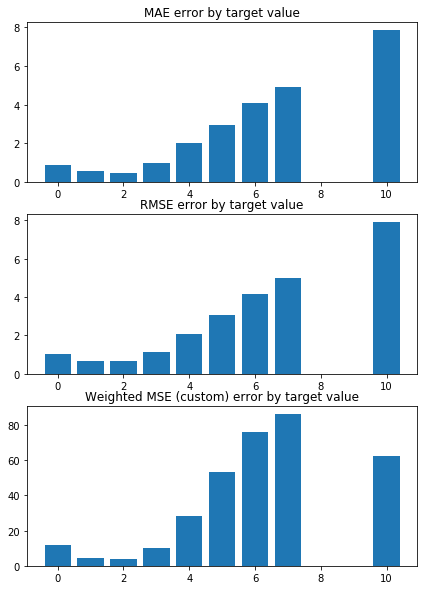

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9819220666985488 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8821486869641877 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


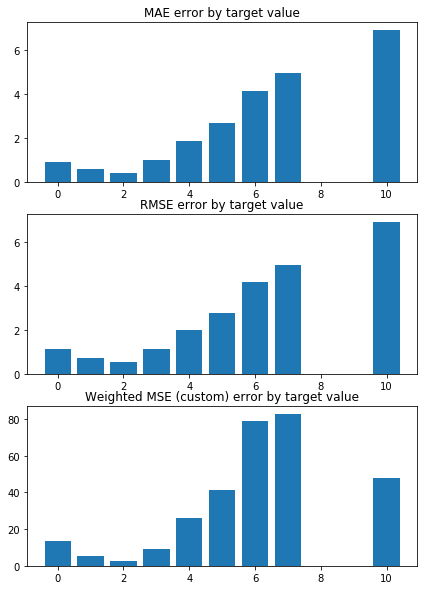

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9099931895993176 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8906893112613937 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


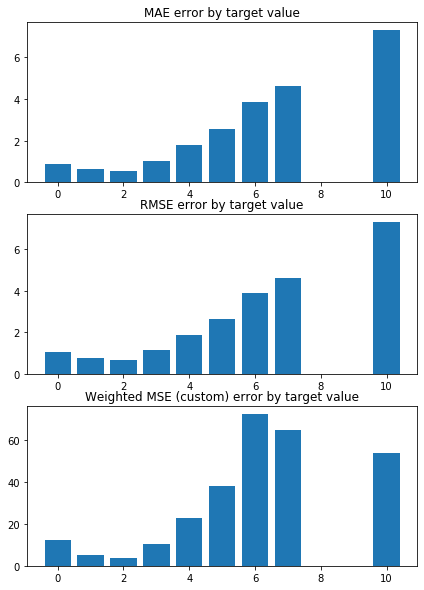

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8989929959092042 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8932834598956593 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


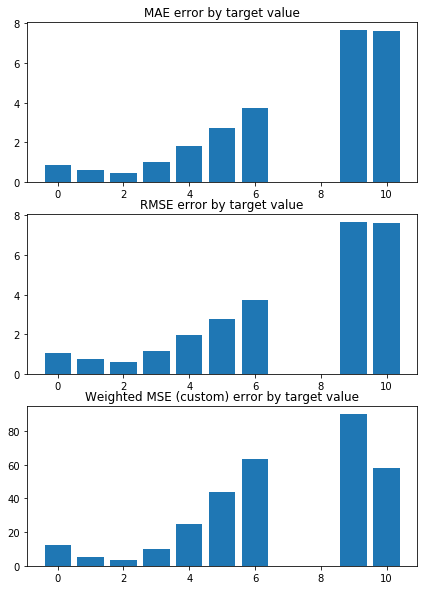

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8762024644246911 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8950970525259535 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


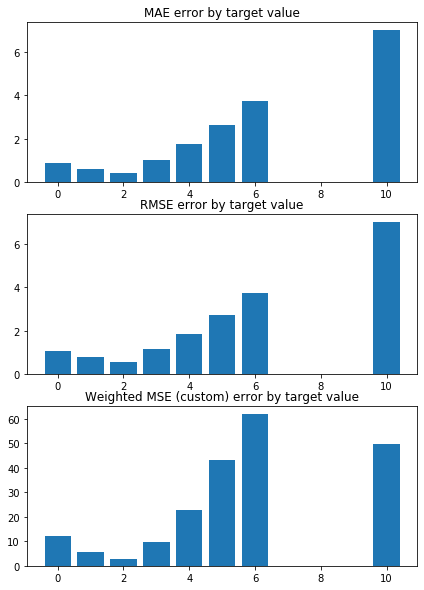

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9664873843914346 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8837228637554582 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


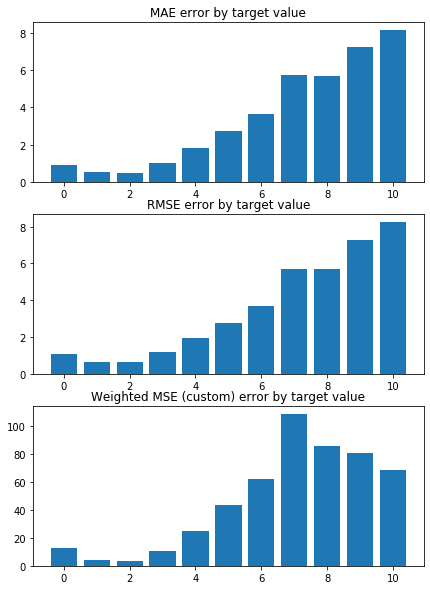

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7512013363648905 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9113068513186541 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


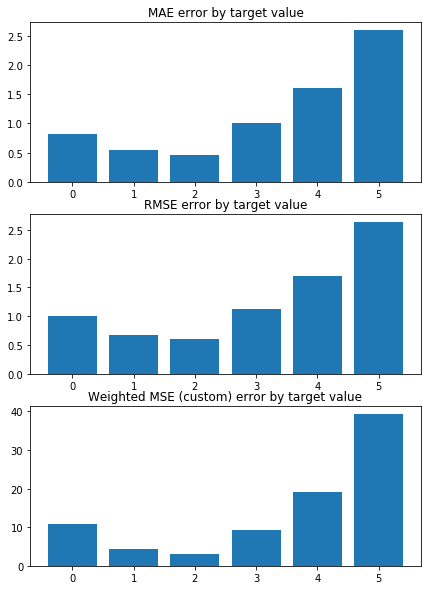

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4826585992282812 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4890553766822898 

Root of MSE on Test: 0.95 
 1.2202685674400902 

Variance score on Test: 0.08 
 r2_test: 0.31240612877185975 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.48
MSE_test 1.49
MAE_train 0.88
MAE_test 0.77
r2_test 0.31
      Chriz  H3K36me3     CP190   H3K4me1       GAF   H3K9me3  H3K27me1  \
0 -0.210445 -0.170730 -0.158266 -0.110664 -0.108460  0.087816 -0.062480   
1 -0.207619 -0.179669 -0.155335 -0.123135 -0.102504  0.088131 -0.062068   
2 -0.197328 -0.181456 -0.164833 -0.105478 -0.109649  0.081921 -0.065801   
3 -0.200773 -0.190958 -0.163437 -0.120901 -0.111782  0.080807 -0.056212   
4 -0.194636 -0.176492 -0.158329 -0.120061 -0.106660  0.079990 -0.050602   
5 -0.205192 -0.170942 -0.160936 -0.122373 -0.104497  0.077250 -0.058802   
6 -0.198478 -0.173614 -0.172167 -0.106831 -0.115651  0.097446 -0.060536   
7 -0.210156 -0.174912 -0.162601 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


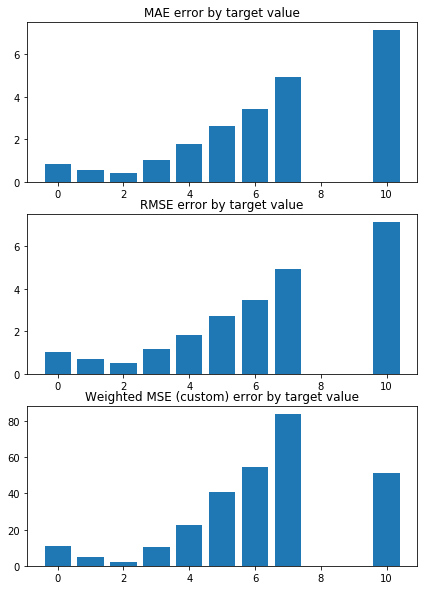

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7932815966260932 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9083631413311152 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


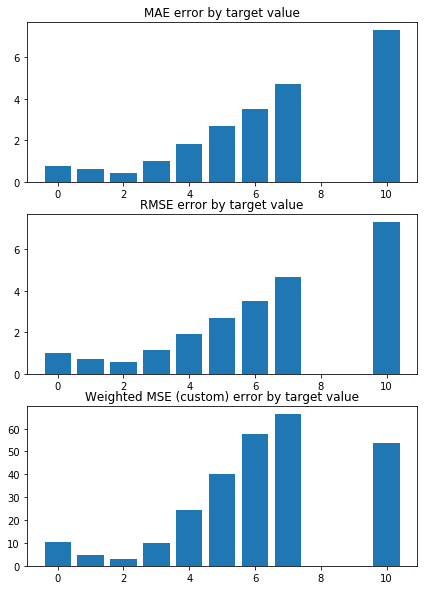

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0042310749251326 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8861700831907828 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


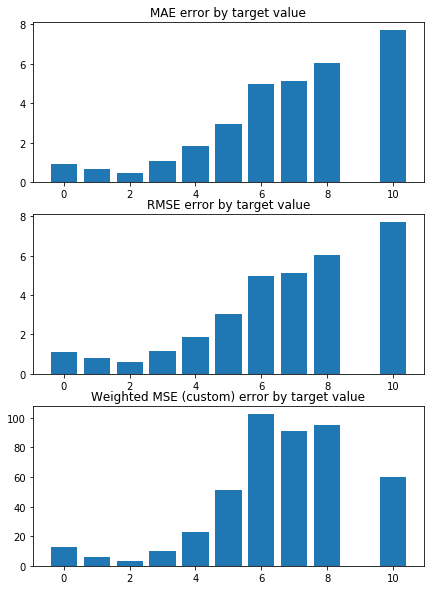

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9270328424065414 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8907294125383796 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


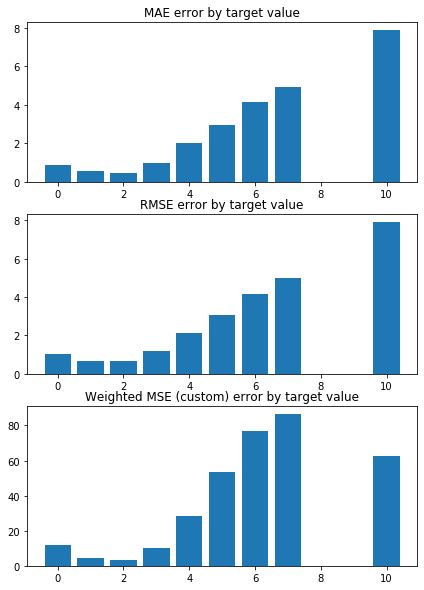

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9869751198480944 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8863729807066576 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


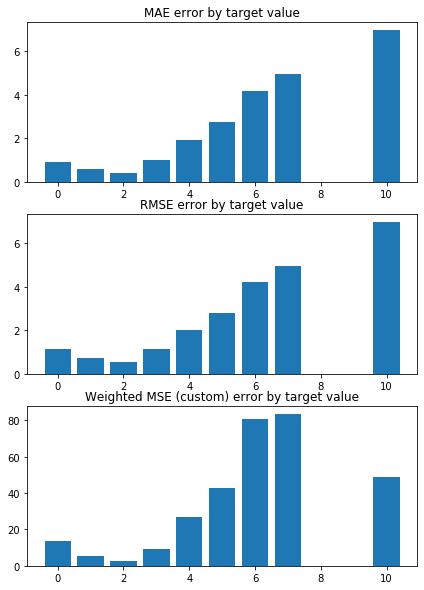

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9142260756346154 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8949930581981239 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


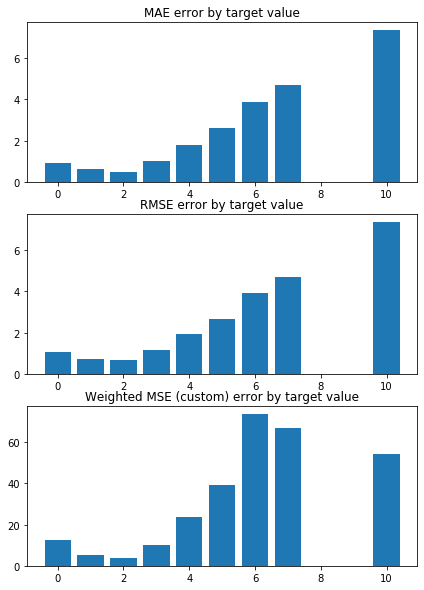

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9023231525720402 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8971136915813286 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


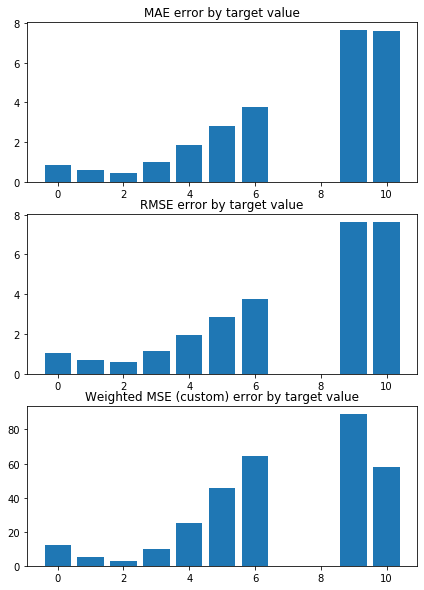

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8781471645916404 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8993327324232427 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


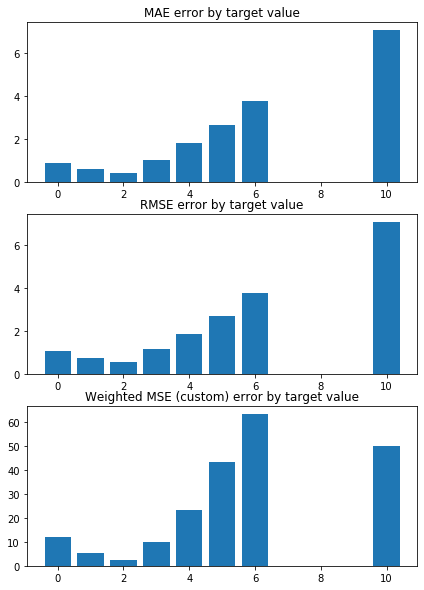

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9743904562893415 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8871213101762501 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


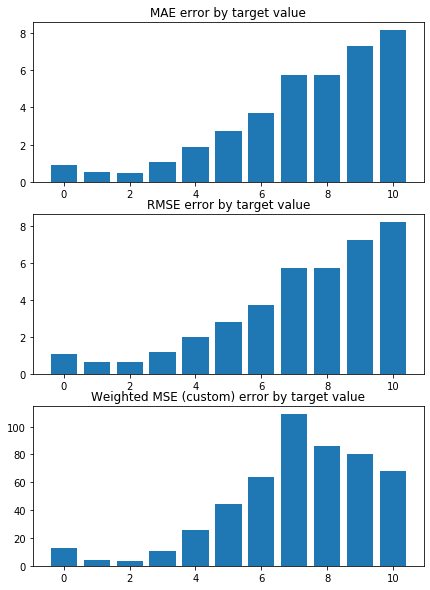

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7562817704191098 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9152946179155012 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


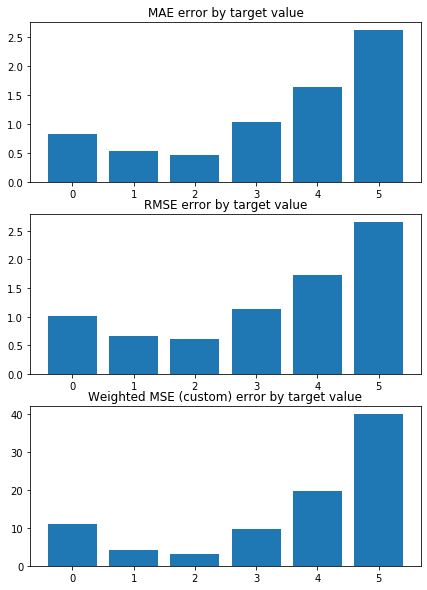

Weighted Mean squared error on Train: 0.90 
 MSE mean train: 1.4919580713776148 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4971324898384035 

Root of MSE on Test: 0.95 
 1.2235736552567662 

Variance score on Test: 0.08 
 r2_test: 0.30858843888105075 

wMSE_train 0.9
wMSE_test 0.9
MSE_train 1.49
MSE_test 1.5
MAE_train 0.88
MAE_test 0.78
r2_test 0.31
      Chriz  H3K36me3     CP190   H3K4me1       GAF   H3K9me3   H3K4me3  \
0 -0.169709 -0.145703 -0.140247 -0.089304 -0.088770  0.071854 -0.069835   
1 -0.167947 -0.150940 -0.138036 -0.098417 -0.085091  0.069909 -0.074807   
2 -0.162128 -0.153486 -0.145575 -0.086785 -0.090002  0.069348 -0.074645   
3 -0.164646 -0.159446 -0.143598 -0.096859 -0.091476  0.065860 -0.077549   
4 -0.160217 -0.148285 -0.139008 -0.096233 -0.087985  0.065252 -0.076312   
5 -0.166877 -0.145333 -0.141048 -0.098156 -0.086576  0.063890 -0.068752   
6 -0.162347 -0.146612 -0.151009 -0.087802 -0.095324  0.077038 -0.079150   
7 -0.169765 -0.147347 -0.143743 -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


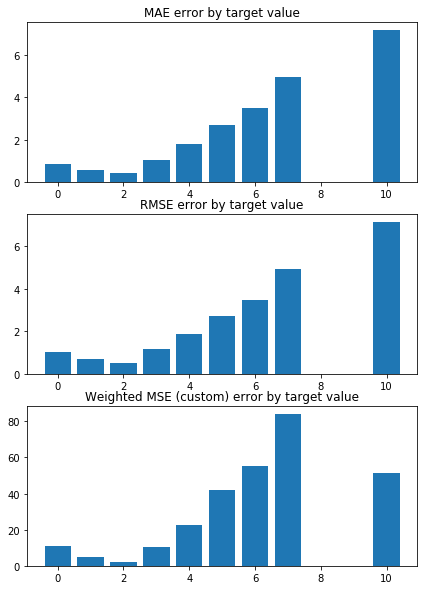

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7967902390409995 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9119571132780117 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


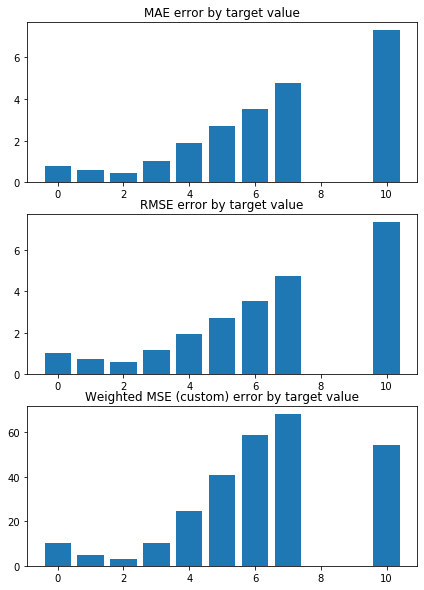

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.002278931451756 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8897380701945635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


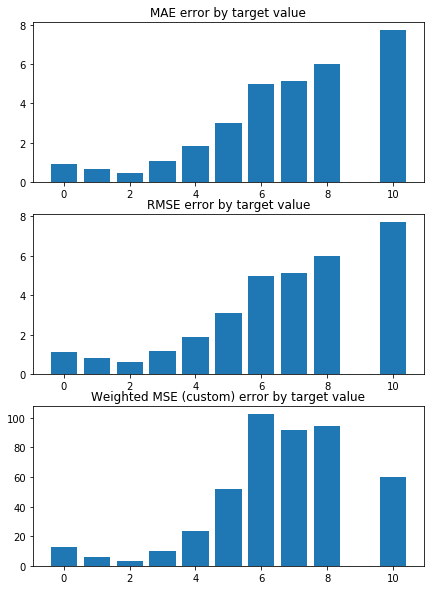

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.927679218288925 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8943740282222165 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


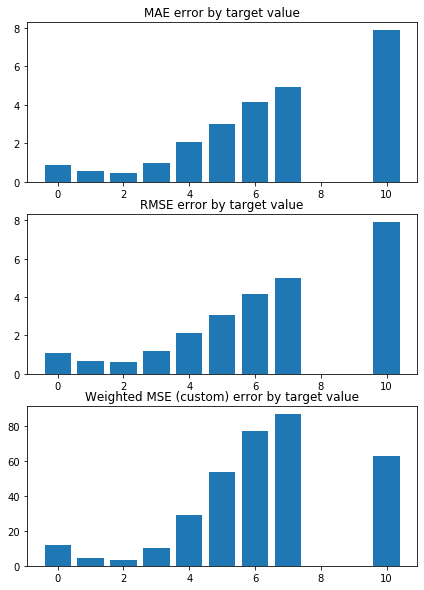

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.991244216790832 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8899557132562829 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


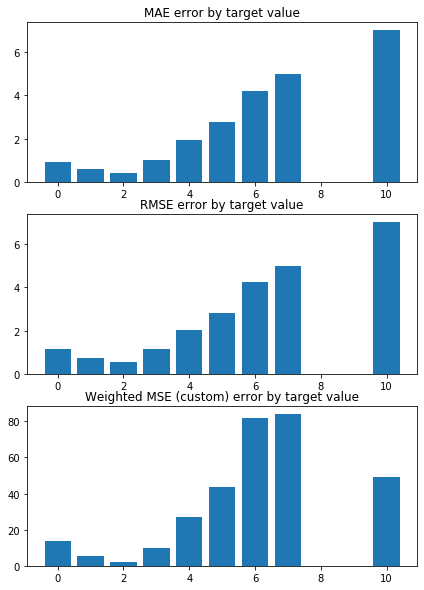

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9180298432309457 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8987000946806417 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


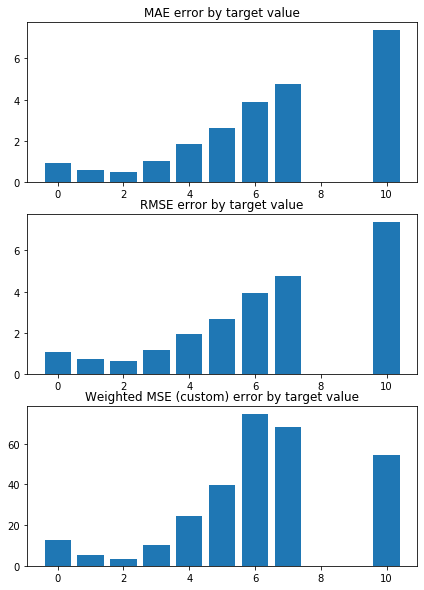

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.905190167526312 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9004667448852871 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


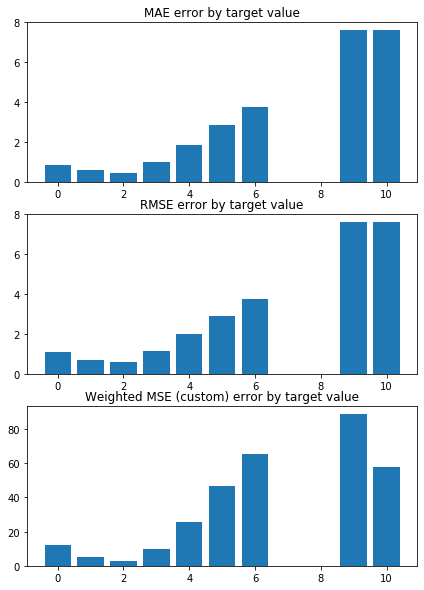

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8804417576917871 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9029037410062631 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


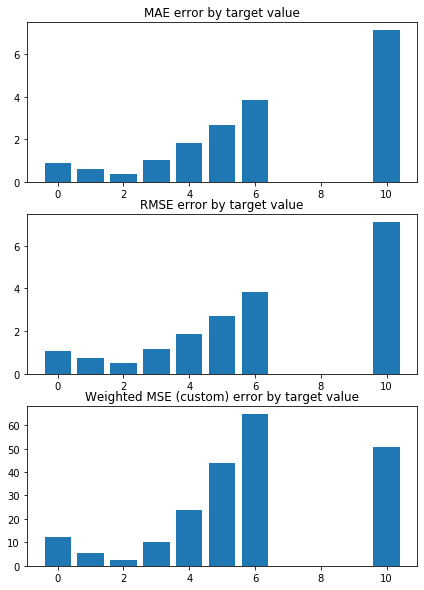

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9800622337636381 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8900939518838538 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


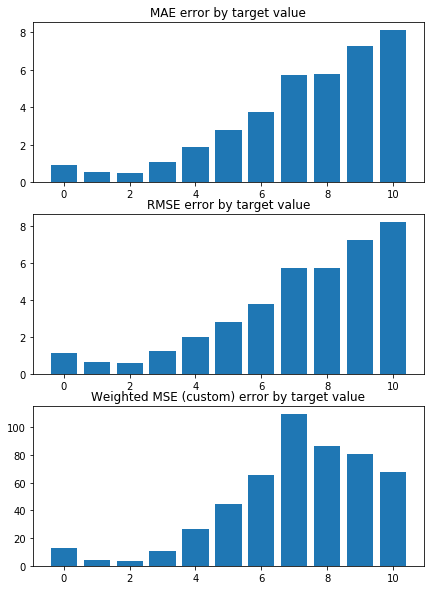

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.761310689593532 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9186856565236359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


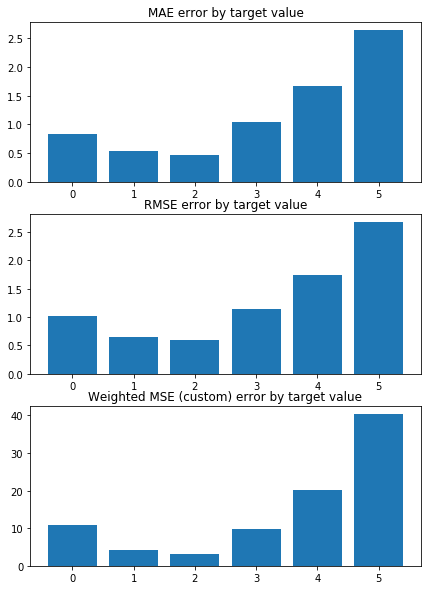

Weighted Mean squared error on Train: 0.90 
 MSE mean train: 1.499747698754816 

Mean squared error on Test: 0.90 
 MSE mean test:  1.5042377669662226 

Root of MSE on Test: 0.95 
 1.226473712301337 

Variance score on Test: 0.08 
 r2_test: 0.30520985634160336 

wMSE_train 0.9
wMSE_test 0.9
MSE_train 1.5
MSE_test 1.5
MAE_train 0.88
MAE_test 0.78
r2_test 0.31
      Chriz  H3K36me3     CP190   H3K4me1       GAF   H3K4me3   H3K9me3  \
0 -0.149765 -0.130950 -0.125853 -0.078867 -0.077896 -0.074971  0.064507   
1 -0.148417 -0.134568 -0.124064 -0.086390 -0.075464 -0.078653  0.062086   
2 -0.144628 -0.137189 -0.130492 -0.077516 -0.079174 -0.078635  0.063198   
3 -0.146678 -0.141558 -0.128309 -0.085040 -0.080300 -0.081078  0.059252   
4 -0.142953 -0.132377 -0.124170 -0.084673 -0.077686 -0.079549  0.058702   
5 -0.147846 -0.130459 -0.125725 -0.086193 -0.076533 -0.074162  0.057887   
6 -0.144497 -0.131076 -0.134893 -0.078447 -0.083977 -0.081688  0.068025   
7 -0.149948 -0.131743 -0.128817 -0.0836

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


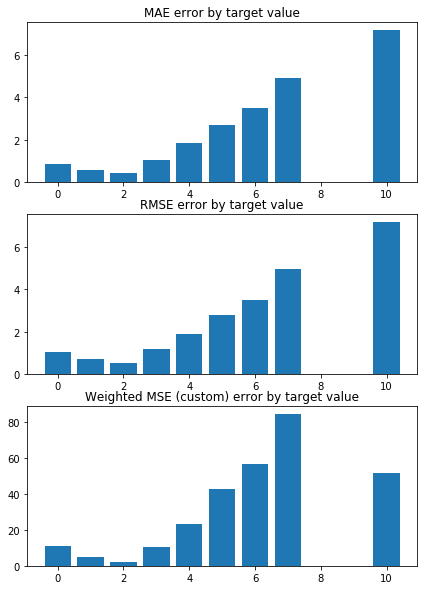

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8001905747354048 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9152819565067197 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


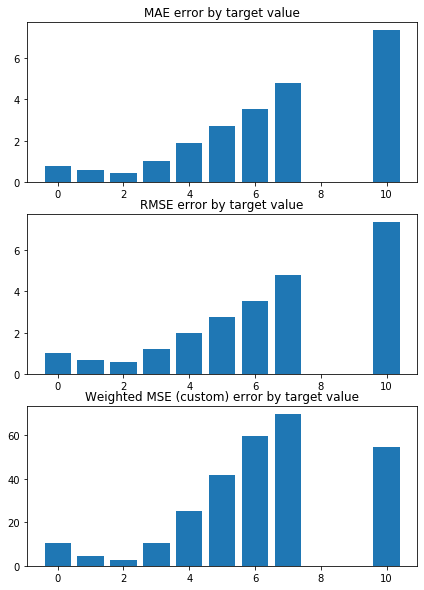

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0008609336300862 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8931523193991059 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


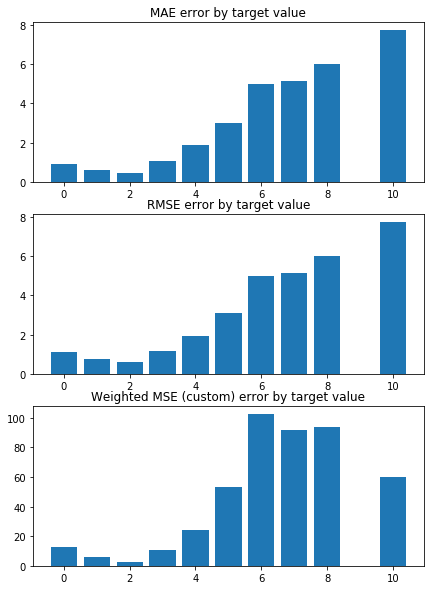

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9287875764232002 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8977631149046029 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


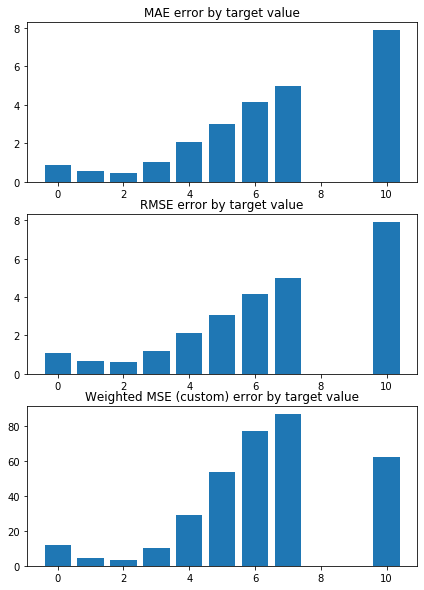

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9951421747323813 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8932862285492039 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


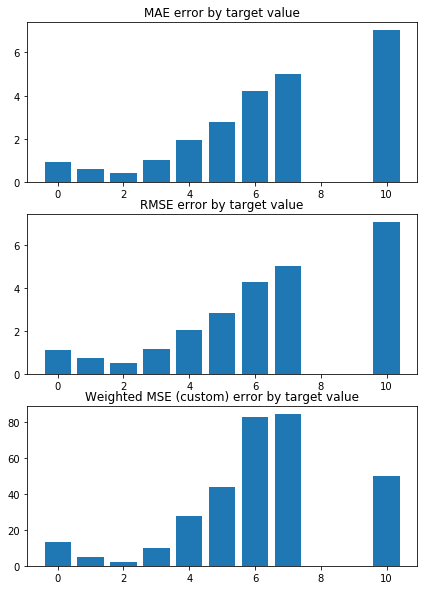

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9216984060937989 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9021345701936312 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


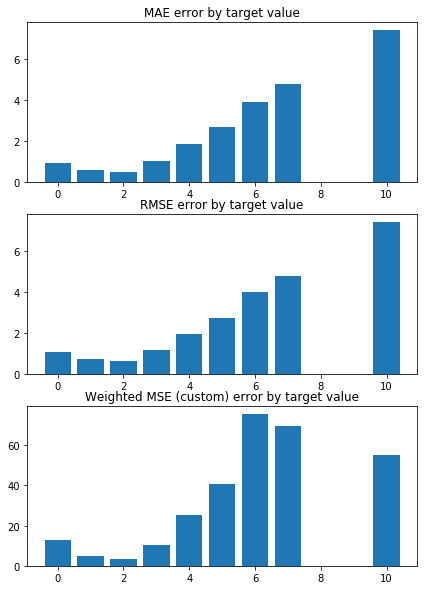

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9078670482045689 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9036542907185212 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


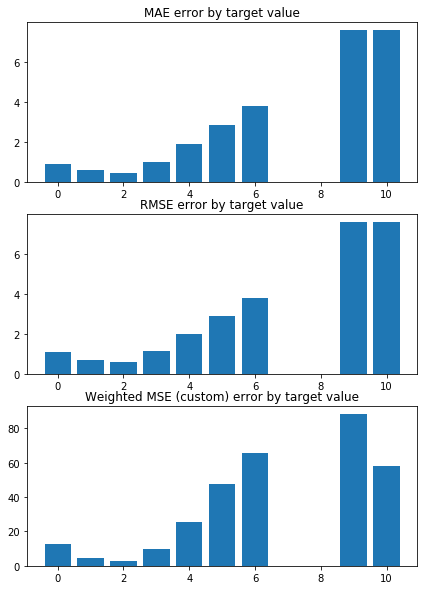

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8828620372601844 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9062311650663989 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


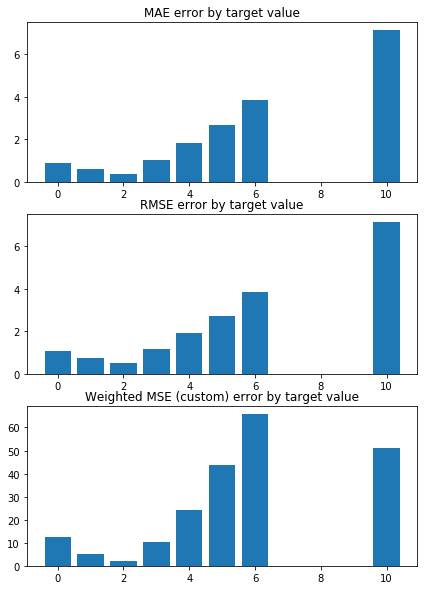

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9847548417540171 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8929631725652206 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


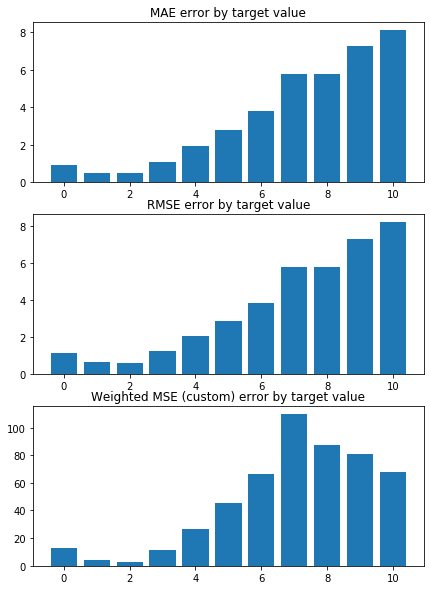

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7661752575183296 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9218489489518571 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


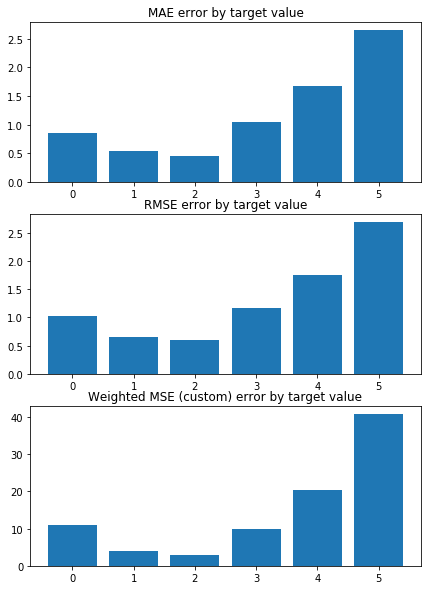

Weighted Mean squared error on Train: 0.90 
 MSE mean train: 1.506833645583447 

Mean squared error on Test: 0.91 
 MSE mean test:  1.5108609863557467 

Root of MSE on Test: 0.95 
 1.2291708531997279 

Variance score on Test: 0.08 
 r2_test: 0.3020553118959385 

wMSE_train 0.9
wMSE_test 0.91
MSE_train 1.51
MSE_test 1.51
MAE_train 0.89
MAE_test 0.79
r2_test 0.3
      Chriz  H3K36me3     CP190   H3K4me3   H3K4me1       GAF   BEAF-32  \
0 -0.137018 -0.120621 -0.114418 -0.076914 -0.072515 -0.070965 -0.065251   
1 -0.135896 -0.123338 -0.112895 -0.079871 -0.079055 -0.069306 -0.068921   
2 -0.133261 -0.125898 -0.118581 -0.080019 -0.071793 -0.072262 -0.072128   
3 -0.135020 -0.129355 -0.116335 -0.082124 -0.077812 -0.073172 -0.070115   
4 -0.131707 -0.121506 -0.112581 -0.080501 -0.077616 -0.071094 -0.068504   
5 -0.135580 -0.120115 -0.113772 -0.076315 -0.078841 -0.070072 -0.066694   
6 -0.132952 -0.120371 -0.122320 -0.082225 -0.072690 -0.076642 -0.066979   
7 -0.137260 -0.121037 -0.116999 -0.07

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


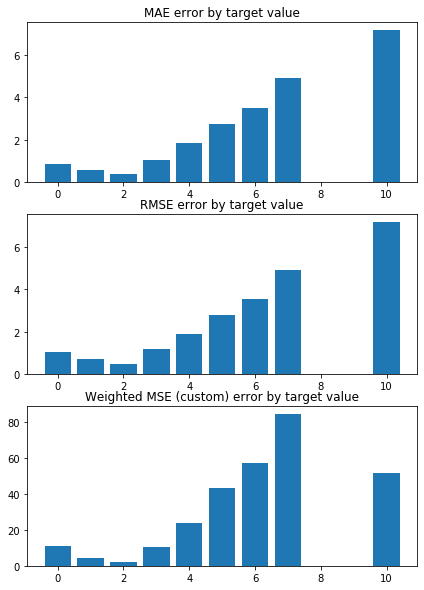

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8035514555055151 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9185218718121807 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


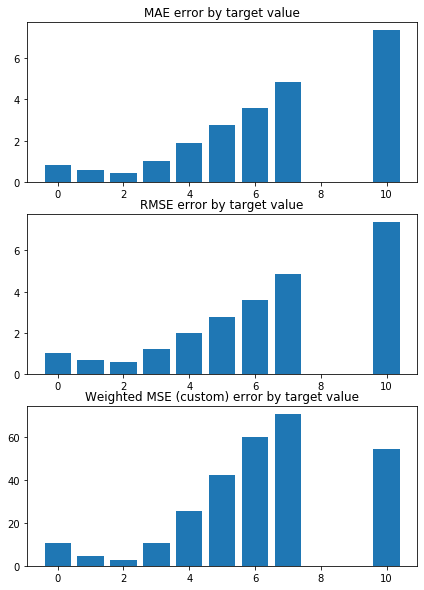

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9999870328497419 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8965325020730895 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


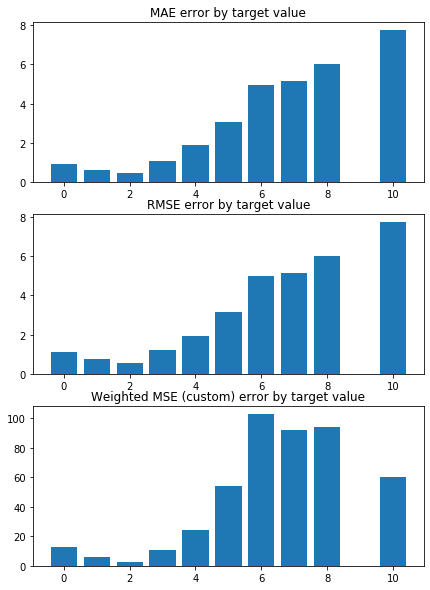

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9302088819286088 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9010639877081542 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


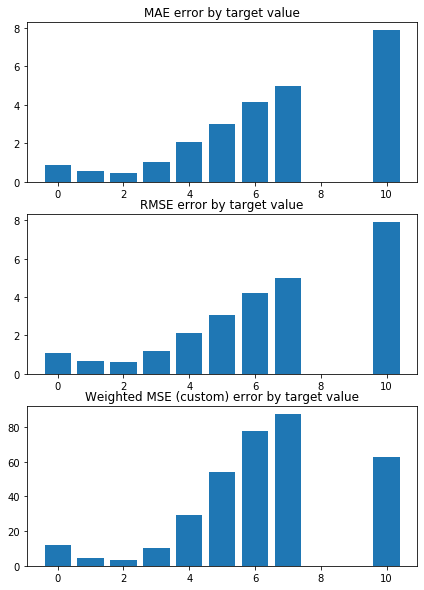

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9988702933829395 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8965347337421008 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


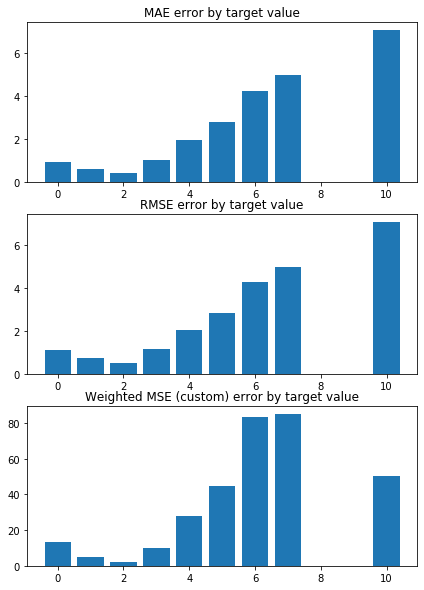

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9253208971679278 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9054600102457399 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


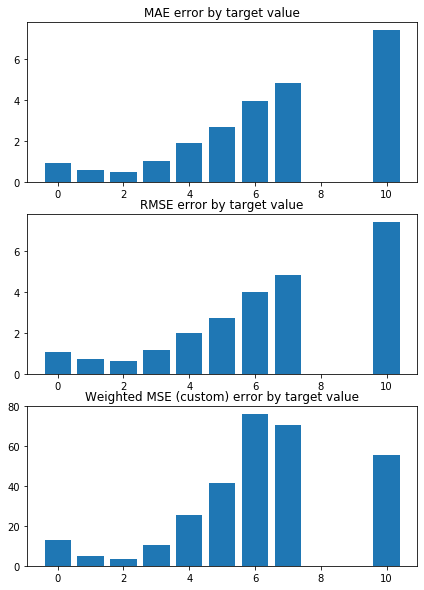

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.910506008242659 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9068127394059953 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


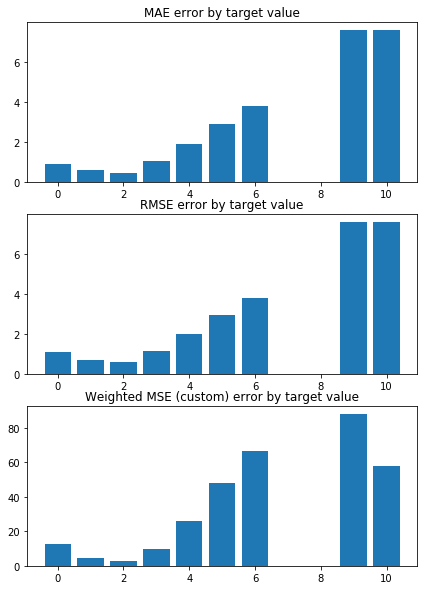

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.885418213905965 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9094887765350788 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


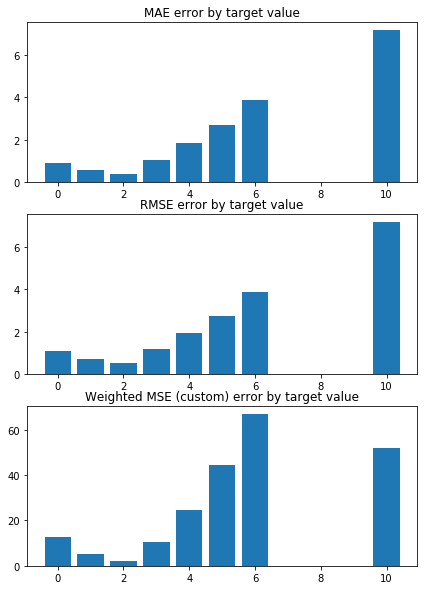

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.988963884151331 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8958528132273282 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


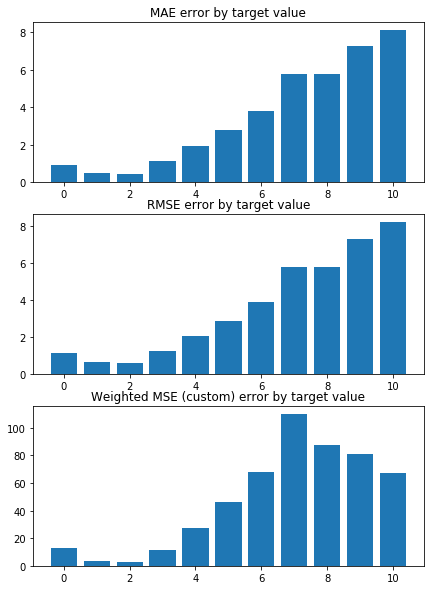

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.770924086541065 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9249501880885158 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


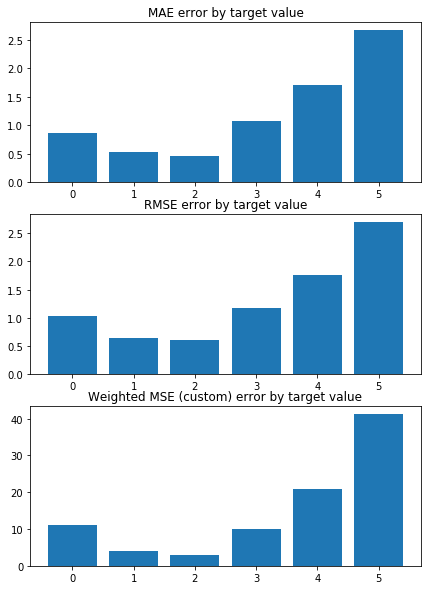

Weighted Mean squared error on Train: 0.91 
 MSE mean train: 1.5135318696663957 

Mean squared error on Test: 0.91 
 MSE mean test:  1.5172164701654385 

Root of MSE on Test: 0.95 
 1.231753412889706 

Variance score on Test: 0.07 
 r2_test: 0.29902695057630735 

wMSE_train 0.91
wMSE_test 0.91
MSE_train 1.51
MSE_test 1.52
MAE_train 0.89
MAE_test 0.79
r2_test 0.3
      Chriz  H3K36me3     CP190   H3K4me3   H3K4me1       GAF   BEAF-32  \
0 -0.127739 -0.112735 -0.105114 -0.077408 -0.068137 -0.066104 -0.065592   
1 -0.126764 -0.114882 -0.103772 -0.079898 -0.073988 -0.064962 -0.068715   
2 -0.124868 -0.117347 -0.108914 -0.080182 -0.067796 -0.067400 -0.071716   
3 -0.126424 -0.120212 -0.106673 -0.082035 -0.072820 -0.068164 -0.070039   
4 -0.123398 -0.113328 -0.103245 -0.080387 -0.072732 -0.066440 -0.068460   
5 -0.126605 -0.112248 -0.104163 -0.076972 -0.073741 -0.065504 -0.066900   
6 -0.124457 -0.112288 -0.112188 -0.081835 -0.068673 -0.071428 -0.067239   
7 -0.128015 -0.112960 -0.107400 -0.

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


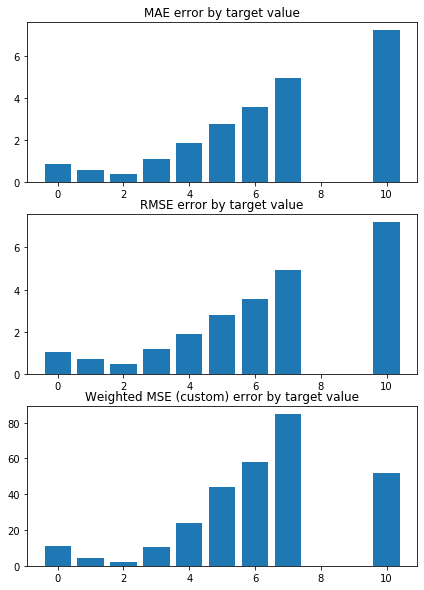

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8069177522284839 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9217550060110831 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


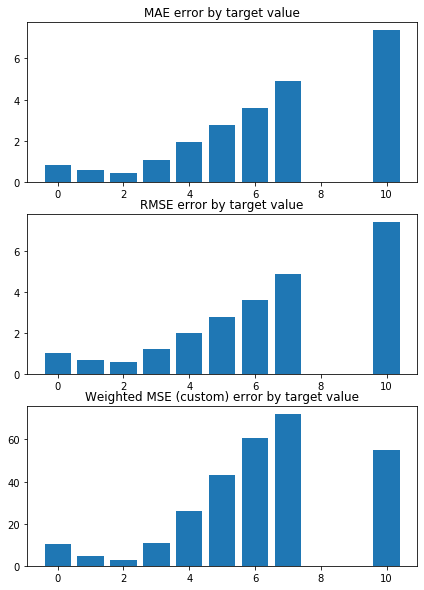

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9996003540782581 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8999288895599097 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


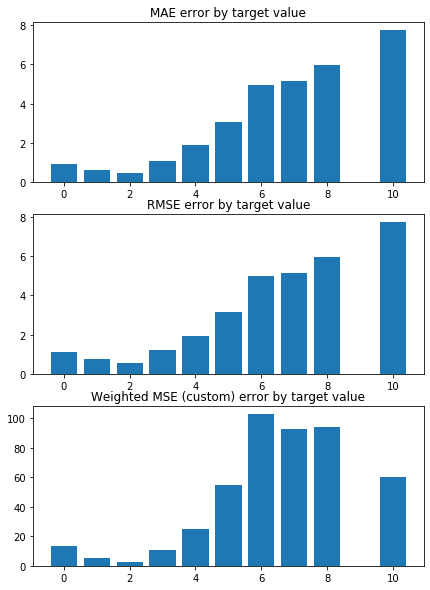

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9318720621997749 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9043519006522284 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


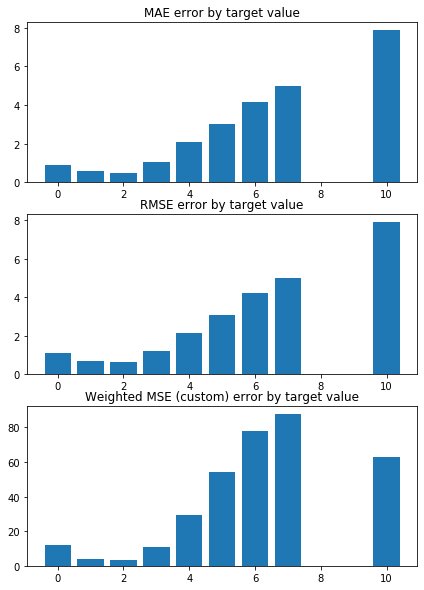

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0025244482405458 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8997747185808326 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


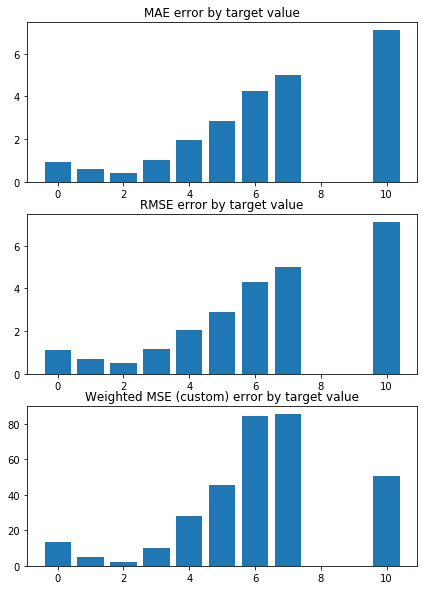

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9289300995881788 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9087538004105169 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


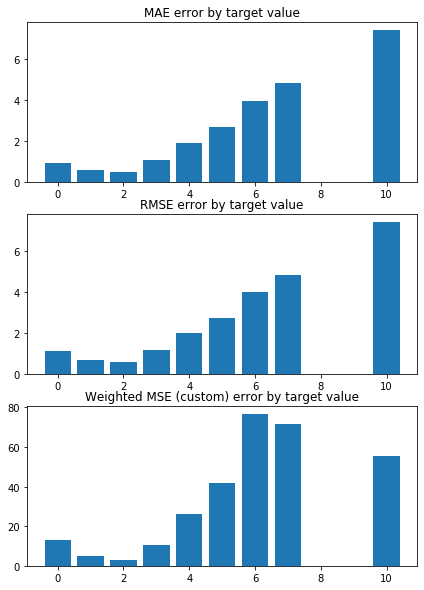

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9131734602393803 


 TRAIN PREDICTION Error
weighted_mse_train: 0.909997663226905 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


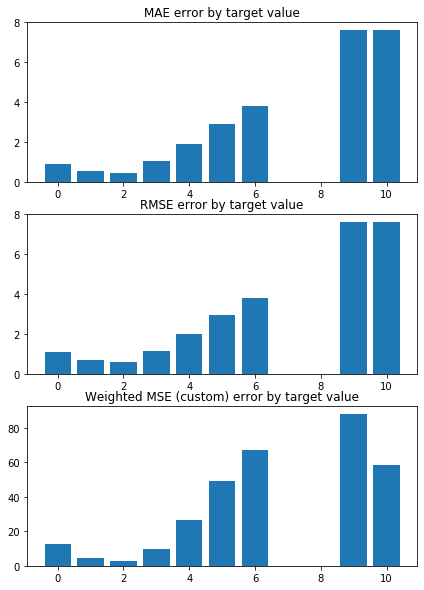

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8881157102434837 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9127483537833129 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


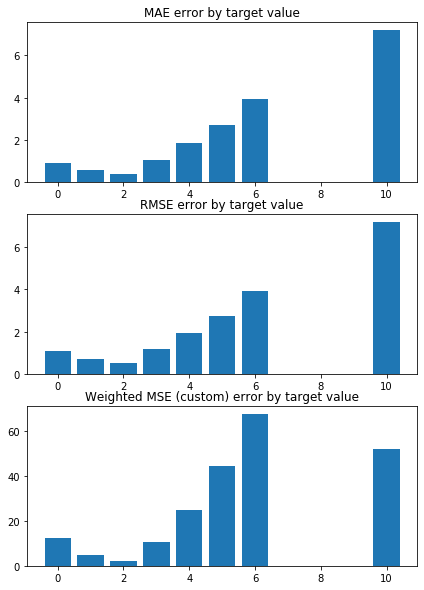

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9929133400191259 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8988068175636719 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


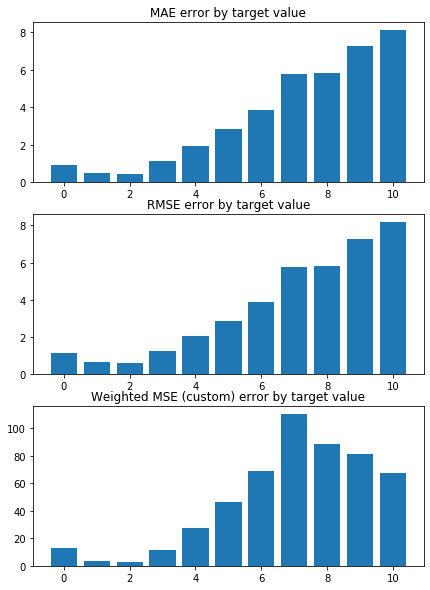

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7755981281538112 


 TRAIN PREDICTION Error
weighted_mse_train: 0.928059900676671 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


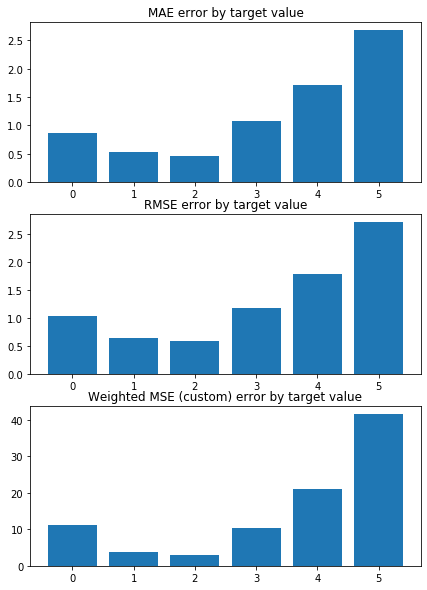

Weighted Mean squared error on Train: 0.91 
 MSE mean train: 1.5199893058400344 

Mean squared error on Test: 0.91 
 MSE mean test:  1.5234058763033373 

Root of MSE on Test: 0.95 
 1.2342632929417197 

Variance score on Test: 0.07 
 r2_test: 0.2960776586242556 

wMSE_train 0.91
wMSE_test 0.91
MSE_train 1.52
MSE_test 1.52
MAE_train 0.89
MAE_test 0.8
r2_test 0.3
      Chriz  H3K36me3     CP190   H3K4me3   BEAF-32   H3K4me1  \
0 -0.120461 -0.106383 -0.097372 -0.077151 -0.065404 -0.064863   
1 -0.119592 -0.108142 -0.096160 -0.079314 -0.068114 -0.070192   
2 -0.118203 -0.110507 -0.100879 -0.079704 -0.070960 -0.064769   
3 -0.119609 -0.112954 -0.098676 -0.081361 -0.069526 -0.069085   
4 -0.116801 -0.106806 -0.095528 -0.079720 -0.067983 -0.069067   
5 -0.119541 -0.105927 -0.096236 -0.076844 -0.066616 -0.069912   
6 -0.117730 -0.105830 -0.103805 -0.080971 -0.066974 -0.065631   
7 -0.120756 -0.106503 -0.099420 -0.078649 -0.068270 -0.068318   
8 -0.119680 -0.107437 -0.097002 -0.080890 -0.066878

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


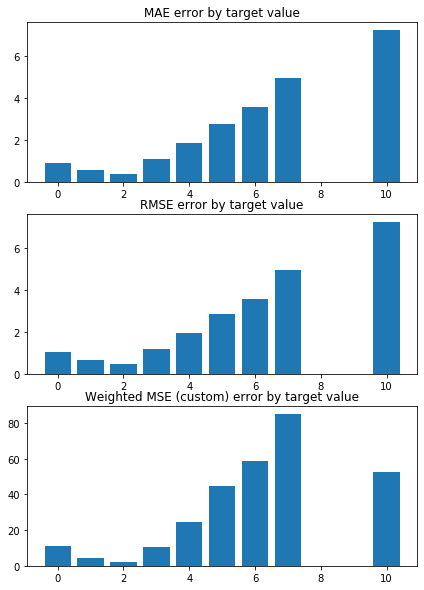

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8103113145328976 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9250137763134089 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


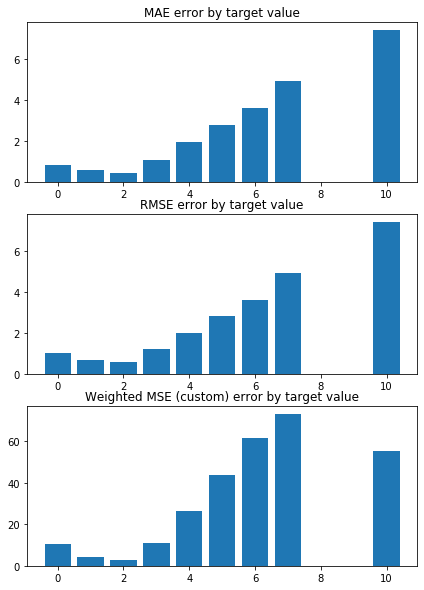

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9996347997718735 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9033603143758463 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


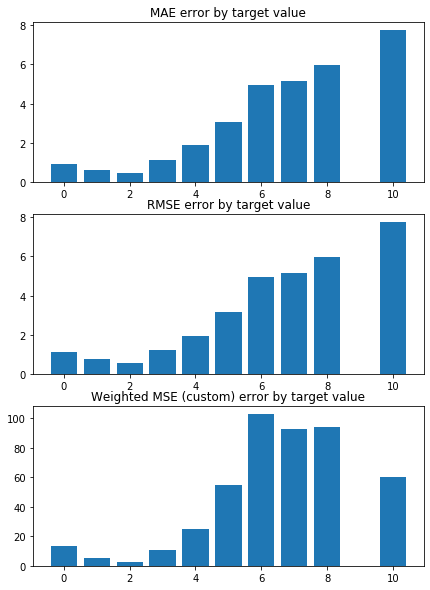

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9337311723336555 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9076594179782294 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


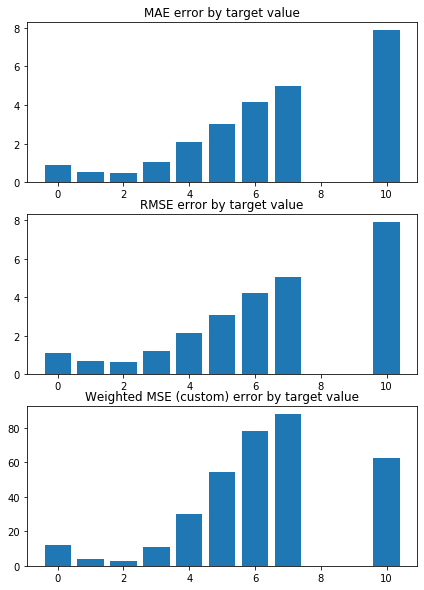

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.006150871541289 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9030371021229715 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


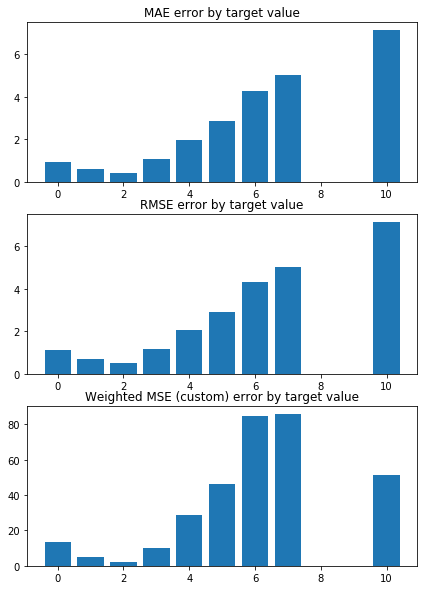

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9325379243513346 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9120519634585935 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


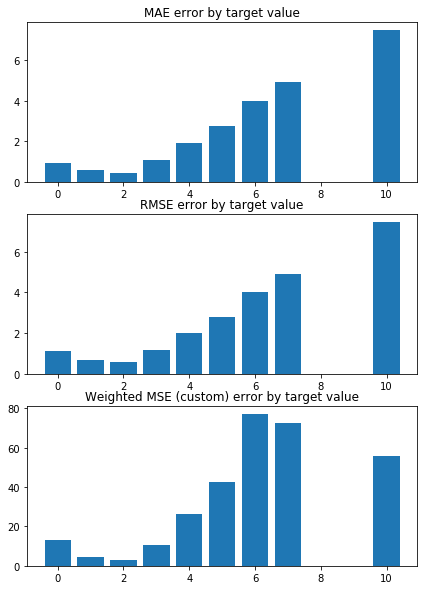

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9158957933762473 


 TRAIN PREDICTION Error
weighted_mse_train: 0.913229333020977 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


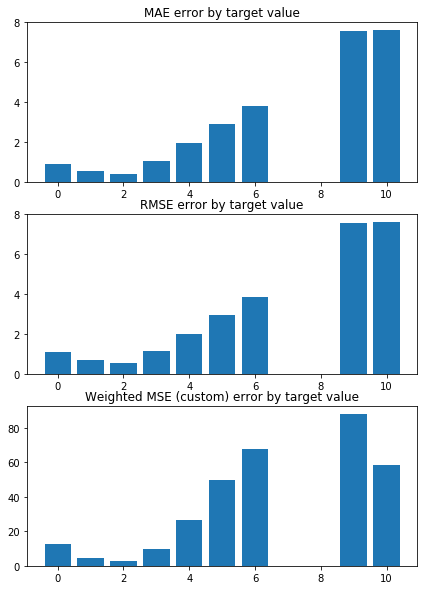

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8909477781935813 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9160383466472853 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


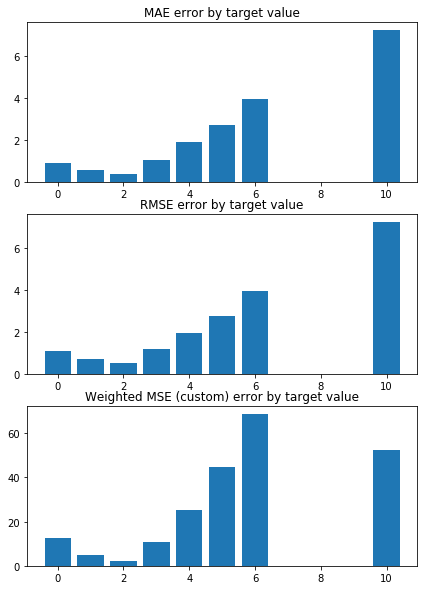

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9967144390815782 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9018368517286528 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


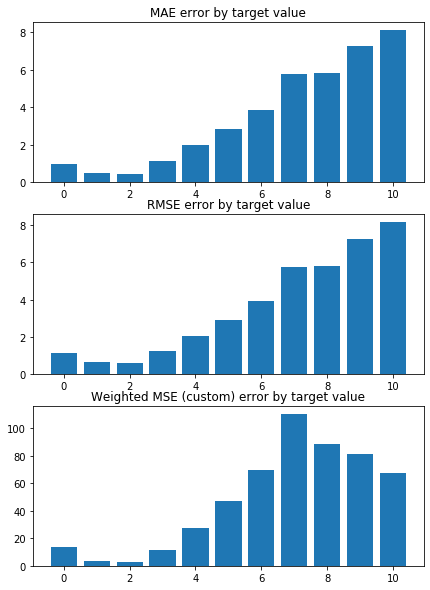

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7802223231534932 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9312064868300127 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


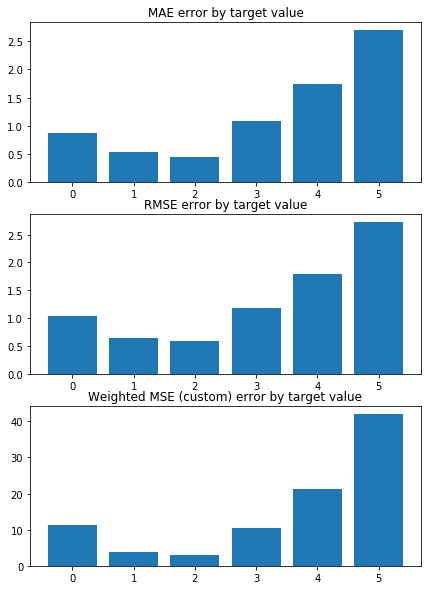

Weighted Mean squared error on Train: 0.91 
 MSE mean train: 1.5262813820660837 

Mean squared error on Test: 0.91 
 MSE mean test:  1.5294806189588397 

Root of MSE on Test: 0.96 
 1.2367217225224274 

Variance score on Test: 0.07 
 r2_test: 0.2931833859721385 

wMSE_train 0.91
wMSE_test 0.91
MSE_train 1.53
MSE_test 1.53
MAE_train 0.9
MAE_test 0.8
r2_test 0.29
      Chriz  H3K36me3     CP190   H3K4me3   BEAF-32  RNA-polymerase-II  \
0 -0.114473 -0.101080 -0.090808 -0.076476 -0.064908          -0.064753   
1 -0.113687 -0.102558 -0.089695 -0.078396 -0.067296          -0.062427   
2 -0.112664 -0.104829 -0.094071 -0.078868 -0.070018          -0.064465   
3 -0.113953 -0.106964 -0.091923 -0.080371 -0.068767          -0.061568   
4 -0.111321 -0.101397 -0.089016 -0.078748 -0.067263          -0.063949   
5 -0.113714 -0.100658 -0.089562 -0.076273 -0.066049          -0.065962   
6 -0.112153 -0.100470 -0.096726 -0.079852 -0.066409          -0.061816   
7 -0.114782 -0.101141 -0.092660 -0.077866 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


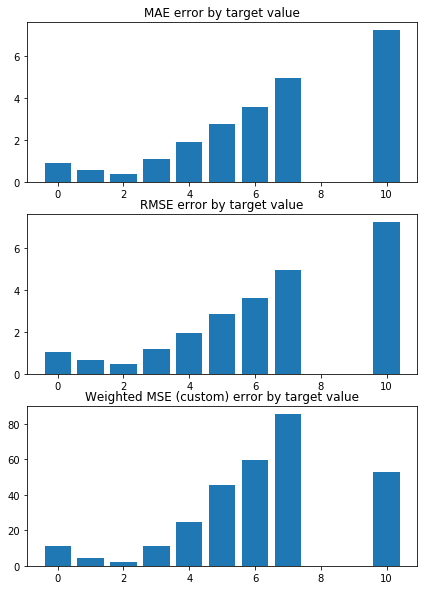

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8137406072895899 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9283097744438931 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


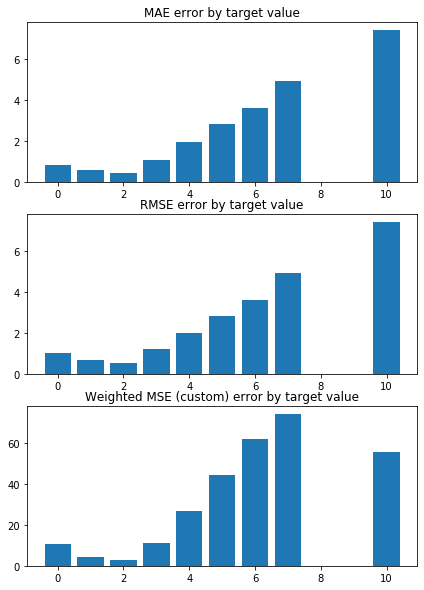

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0000294062745345 


 TRAIN PREDICTION Error
weighted_mse_train: 0.906831252437744 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


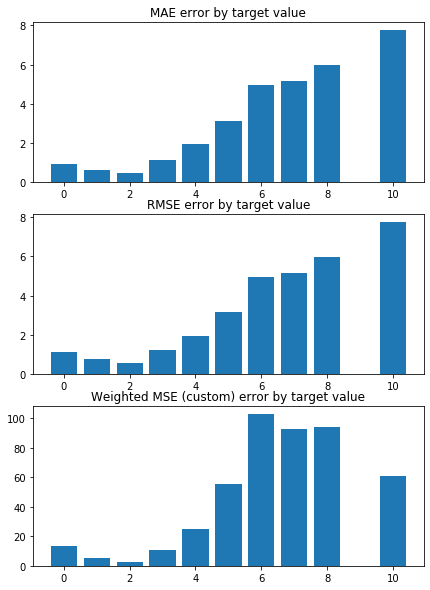

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9357519728286672 


 TRAIN PREDICTION Error
weighted_mse_train: 0.91099893300721 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


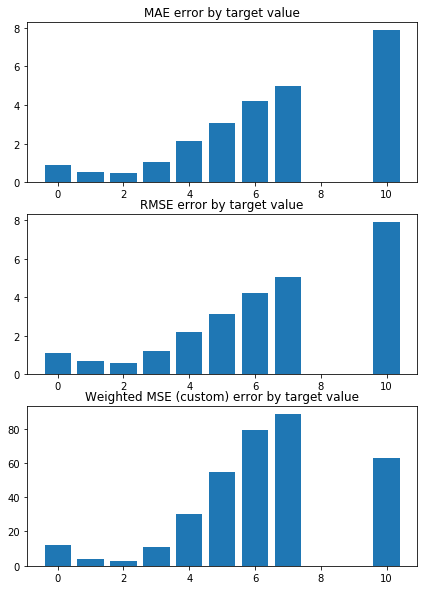

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.009771495110909 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9063331685219116 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


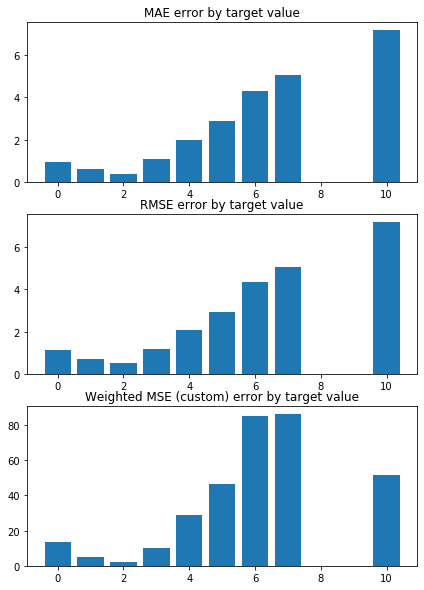

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9361475543930741 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9153701880425131 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


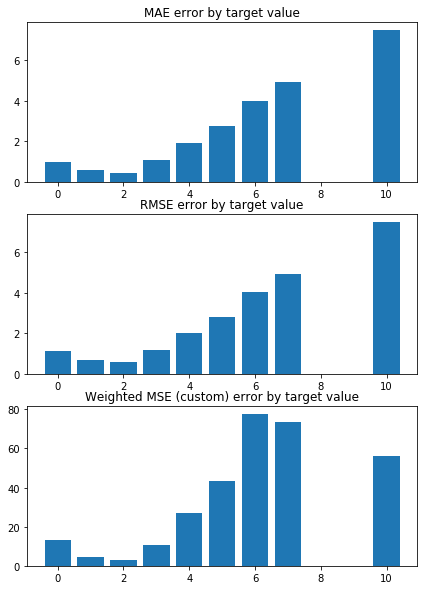

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9186808500755661 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9165122336977649 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


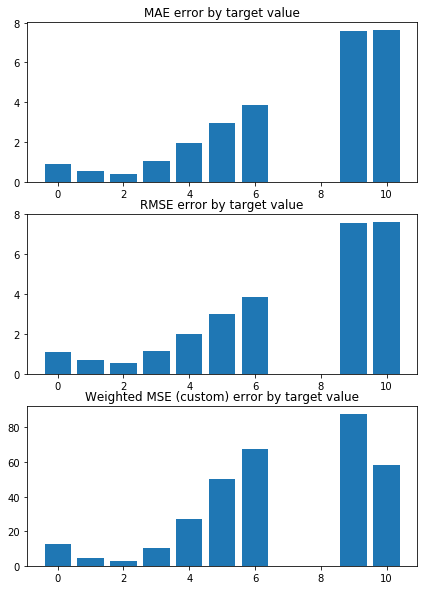

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8939014773580283 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9193678336722632 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


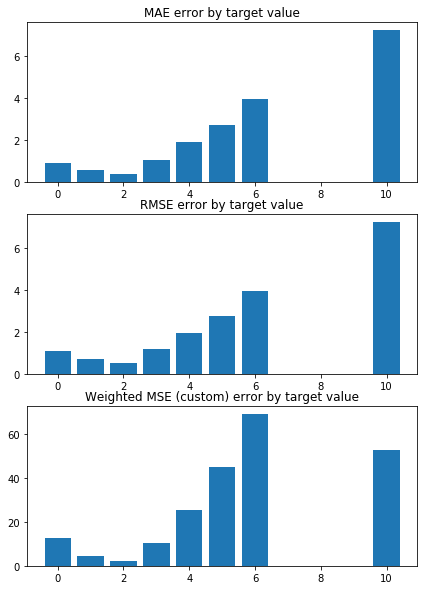

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.000425969085235 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9049412160689542 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


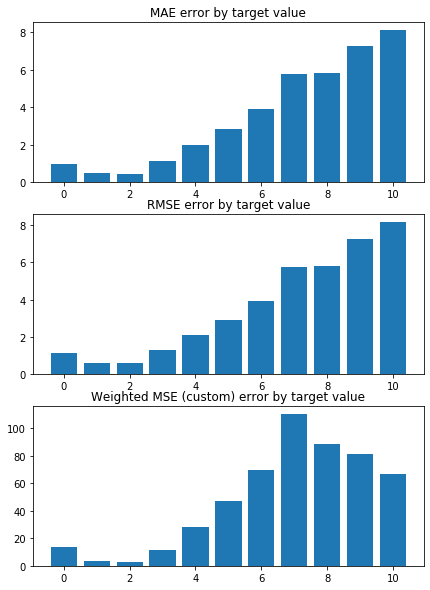

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7848106156917795 


 TRAIN PREDICTION Error
weighted_mse_train: 0.934399079408865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


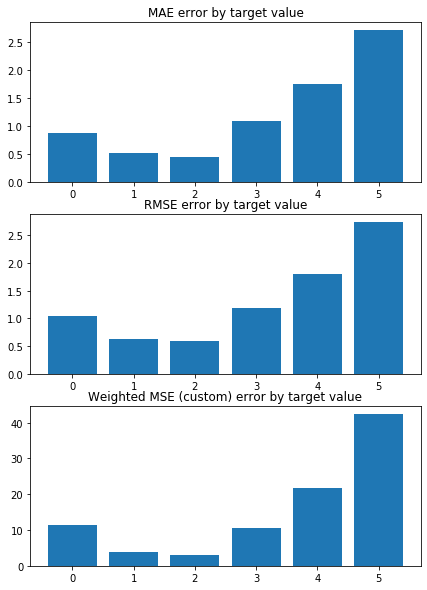

Weighted Mean squared error on Train: 0.92 
 MSE mean train: 1.53244946713617 

Mean squared error on Test: 0.92 
 MSE mean test:  1.535467838645693 

Root of MSE on Test: 0.96 
 1.2391399592643653 

Variance score on Test: 0.07 
 r2_test: 0.29033133871576994 

wMSE_train 0.92
wMSE_test 0.92
MSE_train 1.53
MSE_test 1.54
MAE_train 0.9
MAE_test 0.81
r2_test 0.29
      Chriz  H3K36me3     CP190   H3K4me3  RNA-polymerase-II   BEAF-32  \
0 -0.109387 -0.096537 -0.085157 -0.075560          -0.064416 -0.064227   
1 -0.108666 -0.097804 -0.084124 -0.077294          -0.062429 -0.066356   
2 -0.107917 -0.099986 -0.088213 -0.077829          -0.064226 -0.068974   
3 -0.109112 -0.101880 -0.086128 -0.079205          -0.061711 -0.067868   
4 -0.106628 -0.096786 -0.083430 -0.077609          -0.063685 -0.066400   
5 -0.108754 -0.096149 -0.083849 -0.075443          -0.065570 -0.065312   
6 -0.107383 -0.095900 -0.090650 -0.078598          -0.061871 -0.065665   
7 -0.109703 -0.096563 -0.086845 -0.076864    

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


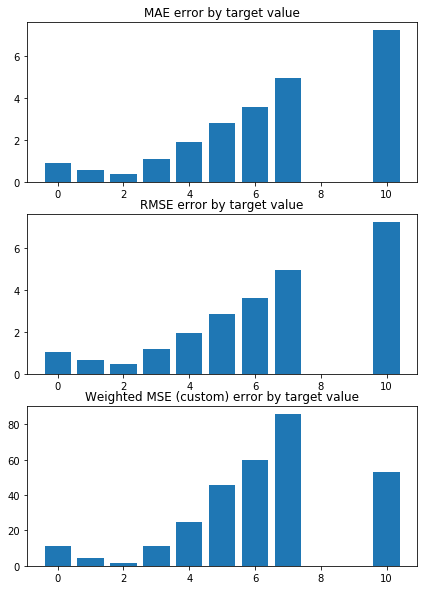

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.817206859748151 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9316447483361234 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


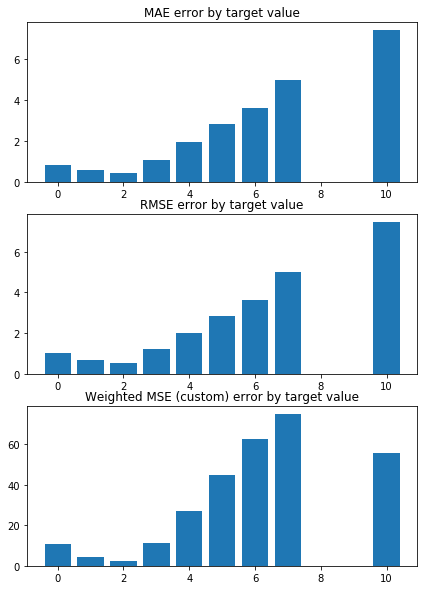

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0007313686460821 


 TRAIN PREDICTION Error
weighted_mse_train: 0.910339587974319 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


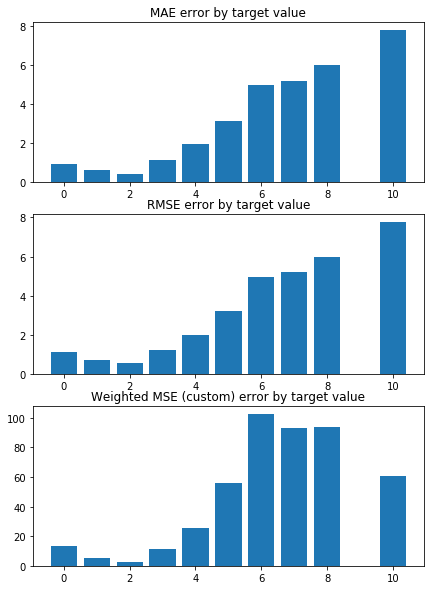

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9379072653834968 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9143730596693002 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


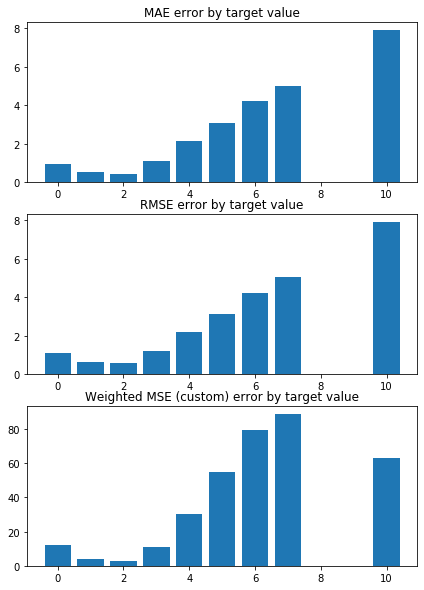

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0133958438631148 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9096648261267904 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


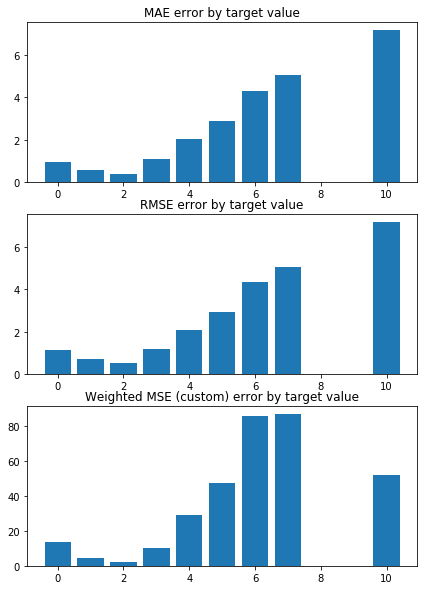

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9397583026801043 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9187138447871259 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


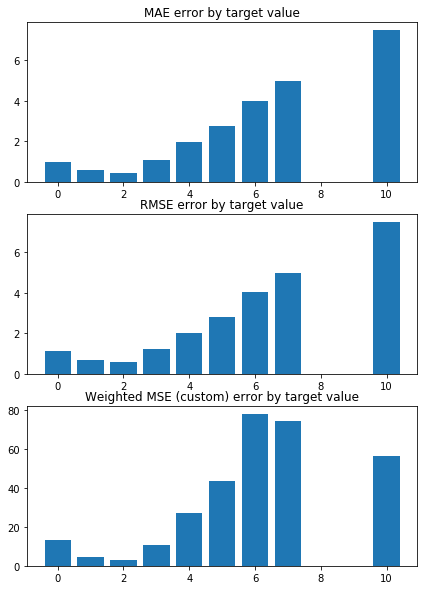

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9215277629955256 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9198437123144497 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


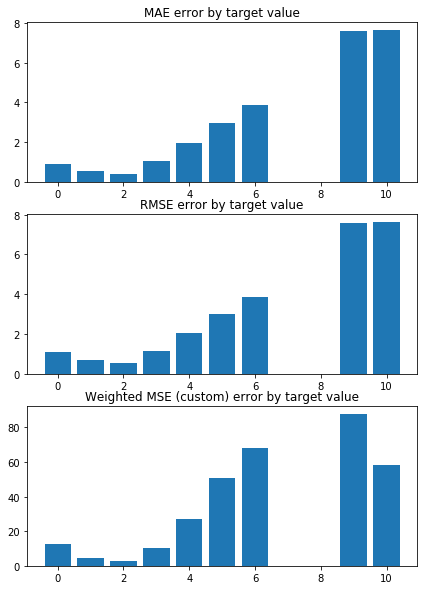

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8969616879842056 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9227369625476659 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


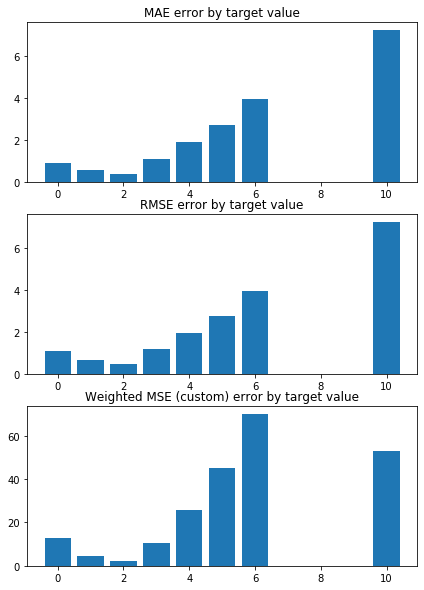

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0040801900489524 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9081127709647241 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


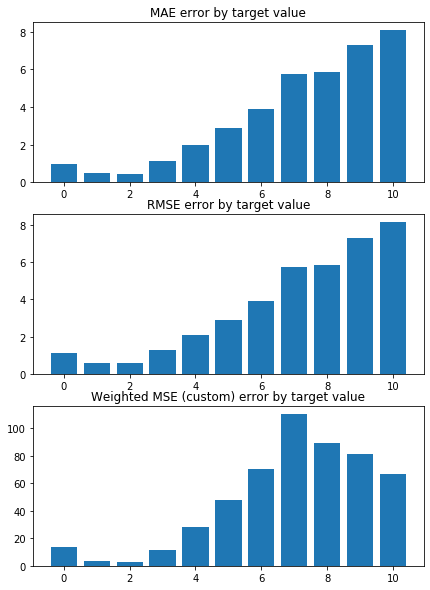

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7893702159997115 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9376377791456408 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


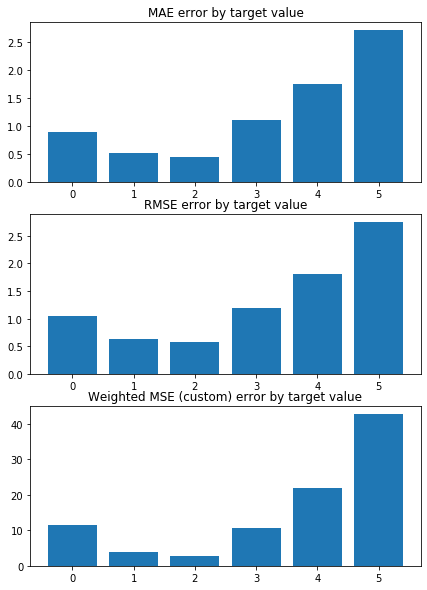

Weighted Mean squared error on Train: 0.92 
 MSE mean train: 1.5385172742082769 

Mean squared error on Test: 0.92 
 MSE mean test:  1.5413821438039332 

Root of MSE on Test: 0.96 
 1.2415241213137718 

Variance score on Test: 0.07 
 r2_test: 0.28751457513285955 

wMSE_train 0.92
wMSE_test 0.92
MSE_train 1.54
MSE_test 1.54
MAE_train 0.9
MAE_test 0.81
r2_test 0.29
      Chriz  H3K36me3     CP190   H3K4me3  RNA-polymerase-II   BEAF-32  \
0 -0.104964 -0.092568 -0.080233 -0.074507          -0.063884 -0.063432   
1 -0.104297 -0.093672 -0.079263 -0.076090          -0.062165 -0.065350   
2 -0.103760 -0.095772 -0.083107 -0.076675          -0.063775 -0.067877   
3 -0.104877 -0.097474 -0.081088 -0.077945          -0.061560 -0.066889   
4 -0.102519 -0.092772 -0.078574 -0.076379          -0.063215 -0.065456   
5 -0.104434 -0.092214 -0.078891 -0.074461          -0.064996 -0.064473   
6 -0.103212 -0.091921 -0.085365 -0.077277          -0.061650 -0.064815   
7 -0.105285 -0.092575 -0.081779 -0.075739 

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,1.489055,0.286062,1.482659,0.031743,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3818007726994268, 0.3440086901197289, 0.232...",0.896134,0.077594,0.892694,0.009241
1,1.497132,0.285170,1.491958,0.031850,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.37654224772856193, 0.3394007635436346, 0.23...",0.899531,0.076908,0.896751,0.009301
2,1.504238,0.284133,1.499748,0.031871,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.37179021979005444, 0.335088729989224, 0.230...",0.902652,0.076057,0.900240,0.009319
3,1.510861,0.283154,1.506834,0.031862,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.367311751955673, 0.3310868130869552, 0.2302...",0.905675,0.075240,0.903512,0.009319
4,1.517216,0.282254,1.513532,0.031839,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3630052957370504, 0.3273111715397524, 0.229...",0.908701,0.074488,0.906724,0.009309
5,1.523406,0.281426,1.519989,0.031811,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3588218584875401, 0.3237010672680317, 0.228...",0.911773,0.073801,0.909942,0.009296
6,1.529481,0.280662,1.526281,0.031780,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3547359408467009, 0.3202168939927357, 0.227...",0.914905,0.073172,0.913193,0.009280
7,1.535468,0.279952,1.532449,0.031748,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.35073336185809423, 0.3168326584078638, 0.22...",0.918097,0.072593,0.916484,0.009262
8,1.541382,0.279289,1.538517,0.031715,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3468057563624144, 0.31353090823904606, 0.22...",0.921345,0.072057,0.919816,0.009244


In [100]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(1000, 10000, 1000)
# Create linear regression object



model_name = 'LR+L2_grid10000'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

In [101]:
results_pd_gr

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,1.489055,0.286062,1.482659,0.031743,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3818007726994268, 0.3440086901197289, 0.232...",0.896134,0.077594,0.892694,0.009241
1,1.497132,0.285170,1.491958,0.031850,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.37654224772856193, 0.3394007635436346, 0.23...",0.899531,0.076908,0.896751,0.009301
2,1.504238,0.284133,1.499748,0.031871,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.37179021979005444, 0.335088729989224, 0.230...",0.902652,0.076057,0.900240,0.009319
3,1.510861,0.283154,1.506834,0.031862,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.367311751955673, 0.3310868130869552, 0.2302...",0.905675,0.075240,0.903512,0.009319
4,1.517216,0.282254,1.513532,0.031839,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3630052957370504, 0.3273111715397524, 0.229...",0.908701,0.074488,0.906724,0.009309
5,1.523406,0.281426,1.519989,0.031811,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3588218584875401, 0.3237010672680317, 0.228...",0.911773,0.073801,0.909942,0.009296
6,1.529481,0.280662,1.526281,0.031780,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3547359408467009, 0.3202168939927357, 0.227...",0.914905,0.073172,0.913193,0.009280
7,1.535468,0.279952,1.532449,0.031748,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.35073336185809423, 0.3168326584078638, 0.22...",0.918097,0.072593,0.916484,0.009262
8,1.541382,0.279289,1.538517,0.031715,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3468057563624144, 0.31353090823904606, 0.22...",0.921345,0.072057,0.919816,0.009244


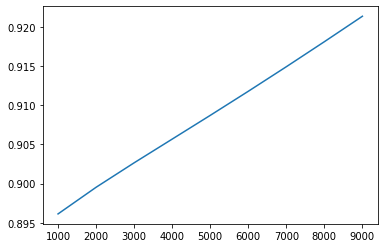

In [102]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8634930699718383 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9055236754297482 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


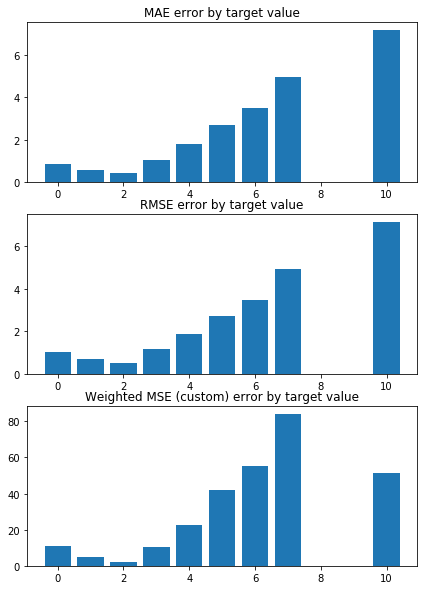

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7967902390409995 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9119571132780117 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


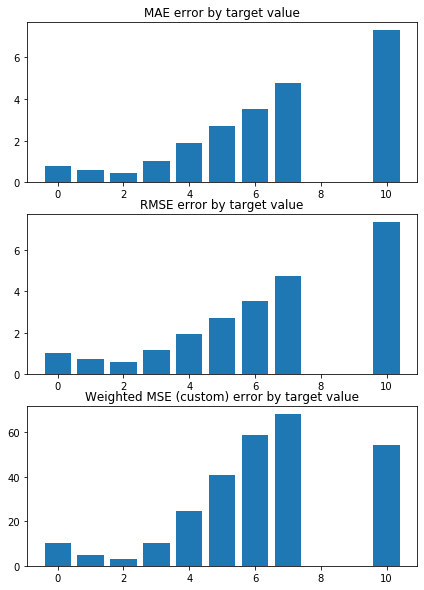

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.002278931451756 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8897380701945635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


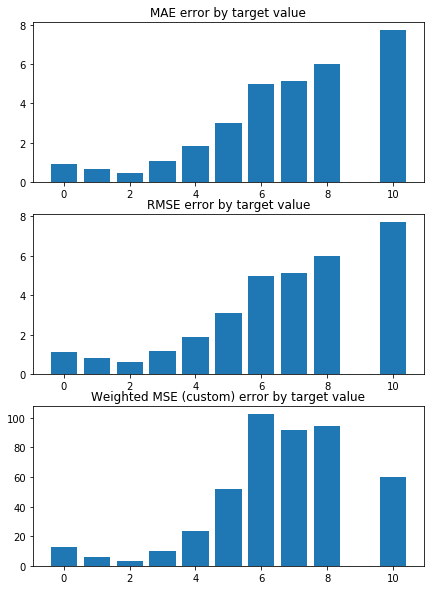

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.927679218288925 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8943740282222165 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


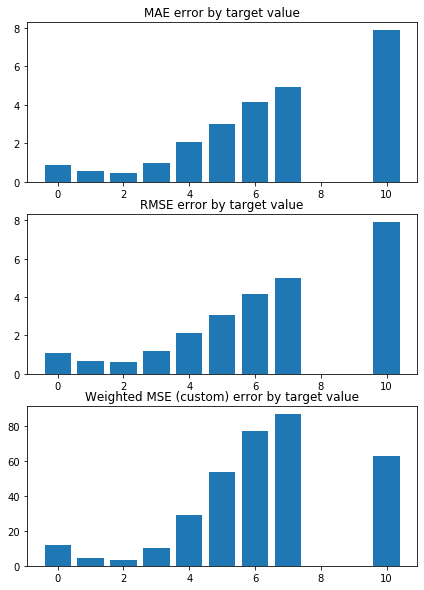

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.991244216790832 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8899557132562829 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


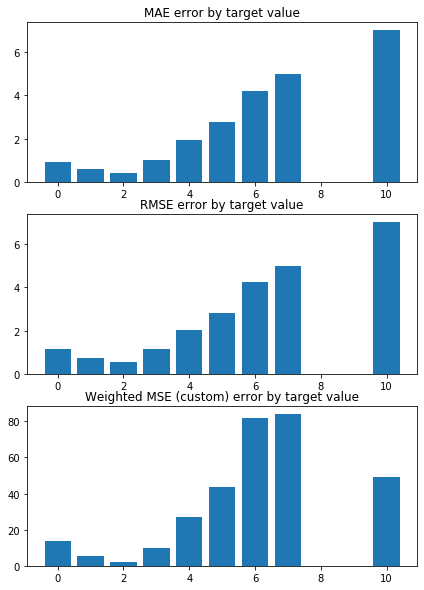

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9180298432309457 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8987000946806417 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


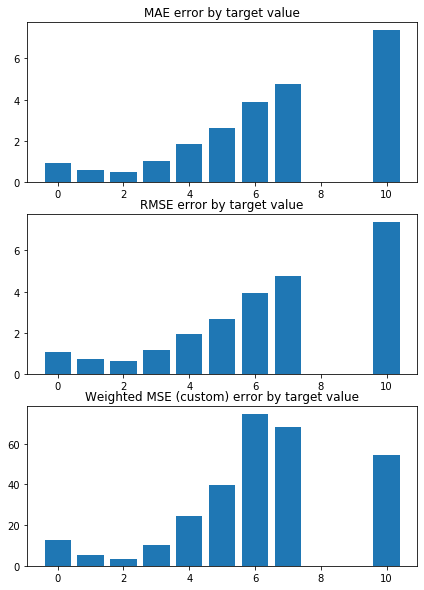

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.905190167526312 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9004667448852871 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


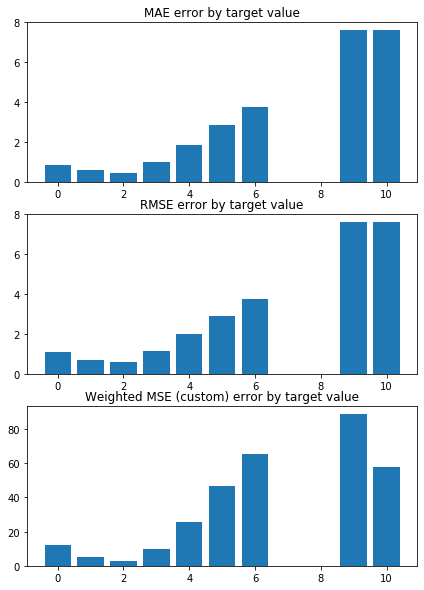

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8804417576917871 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9029037410062631 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


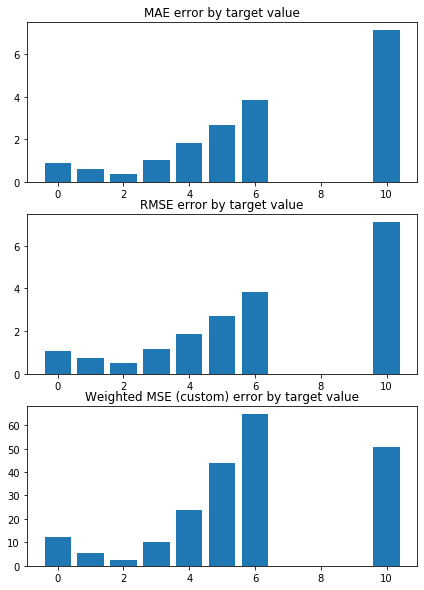

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9800622337636381 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8900939518838538 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


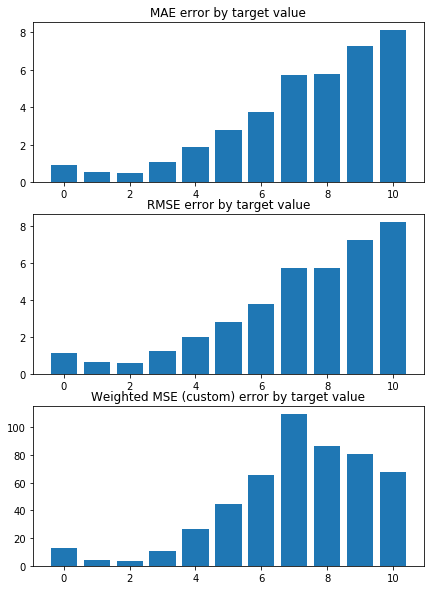

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.761310689593532 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9186856565236359 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


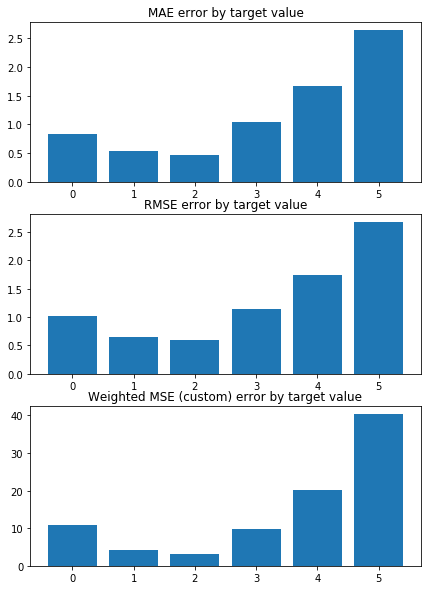

Weighted Mean squared error on Train: 0.90 
 MSE mean train: 1.499747698754816 

Mean squared error on Test: 0.90 
 MSE mean test:  1.5042377669662226 

Root of MSE on Test: 0.95 
 1.226473712301337 

Variance score on Test: 0.08 
 r2_test: 0.30520985634160336 

wMSE_train 0.9
wMSE_test 0.9
MSE_train 1.5
MSE_test 1.5
MAE_train 0.88
MAE_test 0.78
r2_test 0.31
      Chriz  H3K36me3     CP190   H3K4me1       GAF   H3K4me3   H3K9me3  \
0 -0.149765 -0.130950 -0.125853 -0.078867 -0.077896 -0.074971  0.064507   
1 -0.148417 -0.134568 -0.124064 -0.086390 -0.075464 -0.078653  0.062086   
2 -0.144628 -0.137189 -0.130492 -0.077516 -0.079174 -0.078635  0.063198   
3 -0.146678 -0.141558 -0.128309 -0.085040 -0.080300 -0.081078  0.059252   
4 -0.142953 -0.132377 -0.124170 -0.084673 -0.077686 -0.079549  0.058702   
5 -0.147846 -0.130459 -0.125725 -0.086193 -0.076533 -0.074162  0.057887   
6 -0.144497 -0.131076 -0.134893 -0.078447 -0.083977 -0.081688  0.068025   
7 -0.149948 -0.131743 -0.128817 -0.0836

In [103]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=3000)


model_name = 'LR+L2_alf=3000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)



wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [104]:
coefs_argsort, np.sort(coefs)

(array([[ 0, 15,  4,  6,  5,  8, 10,  3,  9, 17,  7,  1, 12, 16,  2, 14,
         13, 11],
        [ 0, 15,  4,  6,  8,  5,  3, 10,  9, 17,  7, 12,  1, 16,  2, 13,
         11, 14],
        [ 0, 15,  4,  5,  8,  6,  3,  9, 10, 17,  1,  7, 12, 16,  2, 13,
         14, 11],
        [ 0, 15,  4,  6,  8,  5,  3,  9, 10,  7, 17,  1, 12,  2, 16, 13,
         14, 11],
        [ 0, 15,  4,  6,  8,  5,  3,  9, 10, 17,  1,  7, 12,  2, 16, 13,
         11, 14],
        [ 0, 15,  4,  6,  5,  8,  3,  9, 17, 10,  7,  1, 12,  2, 16, 13,
         14, 11],
        [ 0,  4, 15,  5,  8,  6, 10,  3,  9,  7, 17,  1, 12, 16,  2, 13,
         11, 14],
        [ 0, 15,  4,  6,  8,  5,  3, 10,  9, 17,  7,  1, 12, 16,  2, 13,
         11, 14],
        [ 0, 15,  4,  8,  6,  5, 10,  3,  9,  7, 17,  1, 12, 16,  2, 11,
         13, 14],
        [ 0, 15,  4,  6,  5,  8,  3, 10,  9,  1, 17,  7, 12,  2, 16, 13,
         14, 11]]),
 array([[-0.14976512, -0.13094996, -0.12585324, -0.07886741, -0.07789602,
         -0.07

In [105]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K36me3', 'CP190', 'H3K4me1', 'GAF', 'H3K4me3', 'H3K9me3',
       'BEAF-32', 'H3K9me2', 'RNA-polymerase-II', 'H3K4me2', 'CTCF',
       'H3K27me1', 'H4K16ac', 'Su(Hw)', 'H3K36me1', 'H3K27me3', 'H3K27ac'],
      dtype='object')

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS  + L2

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8584239495098938 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9020199636866891 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


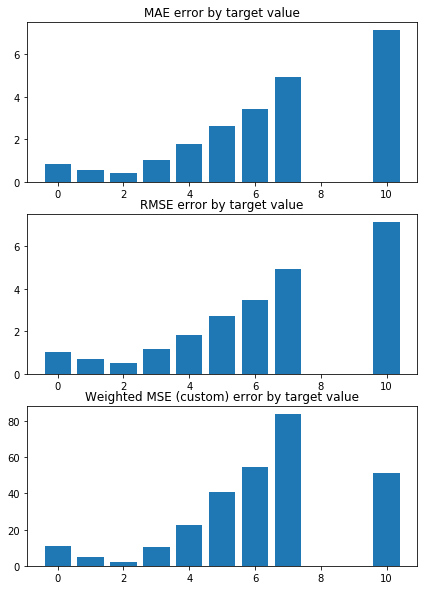

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7932815966260932 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9083631413311152 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


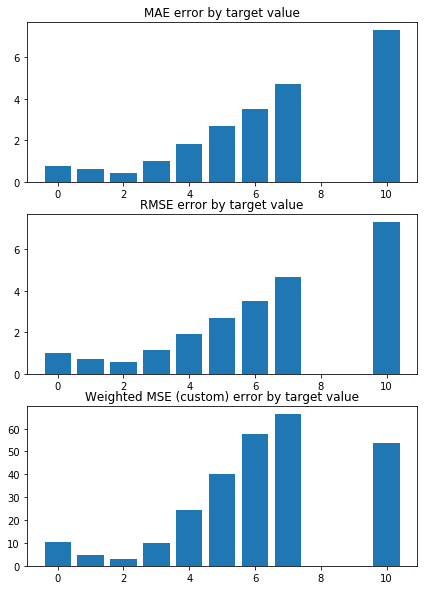

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0042310749251326 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8861700831907828 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


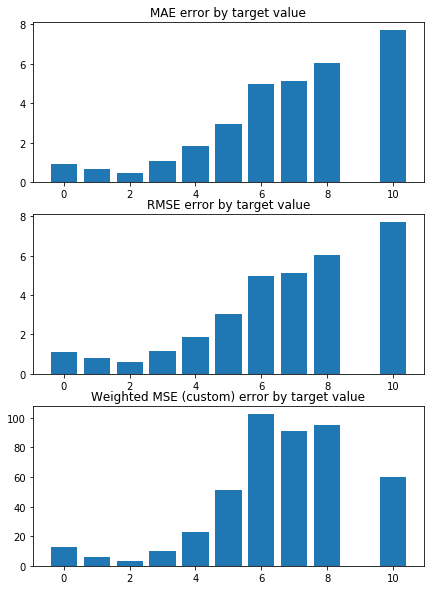

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9270328424065414 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8907294125383796 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


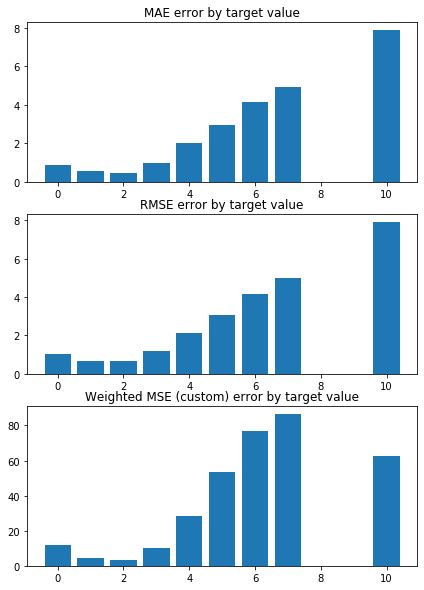

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9869751198480944 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8863729807066576 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


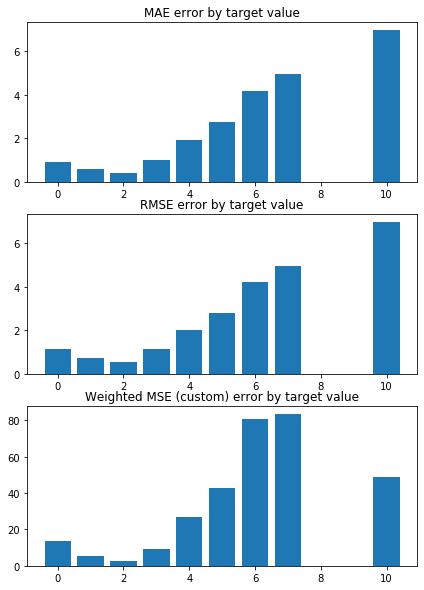

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9142260756346154 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8949930581981239 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


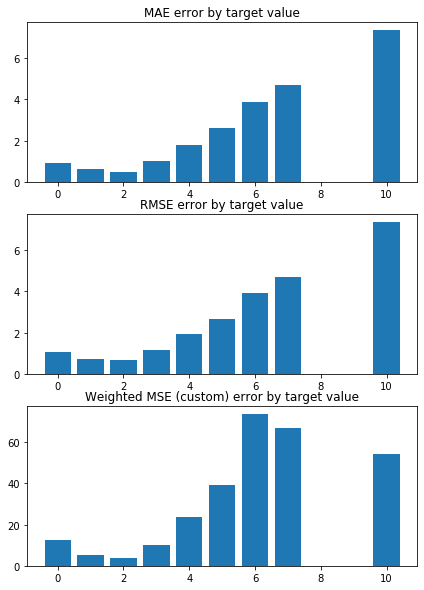

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9023231525720402 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8971136915813286 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


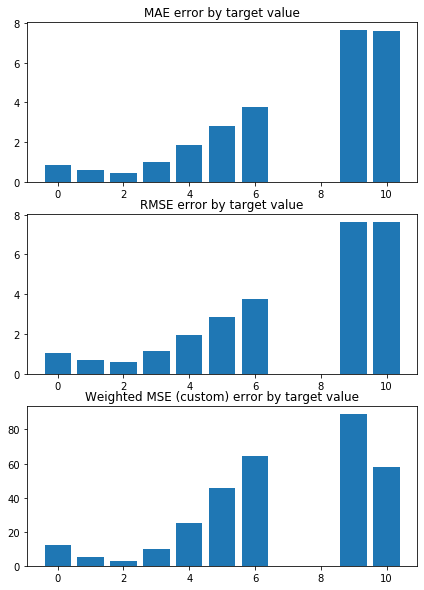

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8781471645916404 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8993327324232427 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


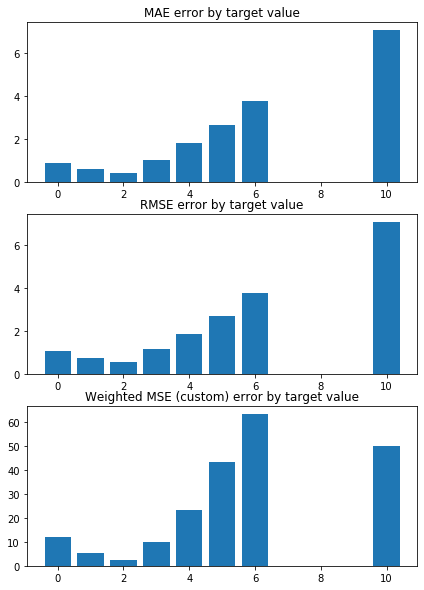

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9743904562893415 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8871213101762501 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


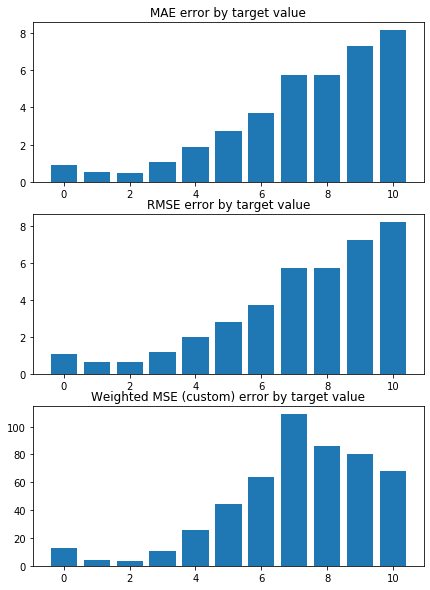

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7562817704191098 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9152946179155012 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


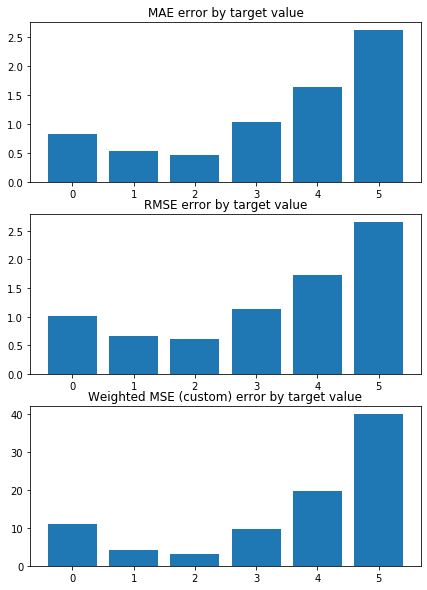

Weighted Mean squared error on Train: 0.90 
 MSE mean train: 1.4919580713776148 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4971324898384035 

Root of MSE on Test: 0.95 
 1.2235736552567662 

Variance score on Test: 0.08 
 r2_test: 0.30858843888105075 

wMSE_train 0.9
wMSE_test 0.9
MSE_train 1.49
MSE_test 1.5
MAE_train 0.88
MAE_test 0.78
r2_test 0.31
      Chriz  H3K36me3     CP190   H3K4me1       GAF   H3K9me3   H3K4me3  \
0 -0.169709 -0.145703 -0.140247 -0.089304 -0.088770  0.071854 -0.069835   
1 -0.167947 -0.150940 -0.138036 -0.098417 -0.085091  0.069909 -0.074807   
2 -0.162128 -0.153486 -0.145575 -0.086785 -0.090002  0.069348 -0.074645   
3 -0.164646 -0.159446 -0.143598 -0.096859 -0.091476  0.065860 -0.077549   
4 -0.160217 -0.148285 -0.139008 -0.096233 -0.087985  0.065252 -0.076312   
5 -0.166877 -0.145333 -0.141048 -0.098156 -0.086576  0.063890 -0.068752   
6 -0.162347 -0.146612 -0.151009 -0.087802 -0.095324  0.077038 -0.079150   
7 -0.169765 -0.147347 -0.143743 -0.0

In [106]:
%%time
n_splits=10
random_state=16

X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=2000)

model_name = 'LR+L2_alf=2000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_test.append(np.mean(weighted_mse_test_all))
wmse_train.append(np.mean(weighted_mse_train_all))


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [107]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.950676,0.066193,0.948289,0.008838,-,test_params = testtest,1.594532,0.276372,1.590623,0.032036,"[0.3057351447165688, 0.28247176467209545, 0.22...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.902652,0.076057,0.900240,0.009319,-,test_params = testtest,1.504238,0.284133,1.499748,0.031871,"[0.37179021979005444, 0.335088729989224, 0.230...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.899531,0.076908,0.896751,0.009301,-,test_params = testtest,1.497132,0.285170,1.491958,0.031850,"[0.37654224772856193, 0.3394007635436346, 0.23...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."


In [108]:
wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 0.8967510991748071 0.8995313202822504


In [109]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K36me3', 'CP190', 'H3K4me1', 'GAF', 'H3K9me3', 'H3K4me3',
       'H3K9me2', 'BEAF-32', 'RNA-polymerase-II', 'H3K27me1', 'CTCF',
       'H3K4me2', 'Su(Hw)', 'H4K16ac', 'H3K36me1', 'H3K27me3', 'H3K27ac'],
      dtype='object')

In [110]:
su_drsc.columns[2:], coefs

(Index(['Chriz', 'CTCF', 'Su(Hw)', 'BEAF-32', 'CP190', 'GAF', 'H3K4me1',
        'H3K4me2', 'H3K4me3', 'H3K9me2', 'H3K9me3', 'H3K27ac', 'H3K27me1',
        'H3K27me3', 'H3K36me1', 'H3K36me3', 'H4K16ac', 'RNA-polymerase-II'],
       dtype='object'),
 array([[-0.16970863, -0.05029692,  0.03972775, -0.06060753, -0.14024665,
         -0.0887703 , -0.08930365, -0.04308528, -0.06983456,  0.0622741 ,
          0.07185388,  0.00800102, -0.05186526, -0.01397186,  0.01536734,
         -0.14570288, -0.03589278, -0.05267981],
        [-0.16794697, -0.04591117,  0.03455158, -0.06609926, -0.1380358 ,
         -0.08509098, -0.09841661, -0.04530641, -0.07480747,  0.05443699,
          0.06990865,  0.00320059, -0.05301526, -0.02025251,  0.00578123,
         -0.15094014, -0.03645645, -0.04514184],
        [-0.16212784, -0.06118388,  0.04082536, -0.07015381, -0.1455746 ,
         -0.09000177, -0.08678471, -0.03929343, -0.07464519,  0.06915362,
          0.06934782,  0.00293457, -0.05438215, -0.01951524, 

In [111]:
coefs_argsort

array([[ 0, 15,  4,  6,  5, 10,  8,  9,  3, 17, 12,  1,  7,  2, 16, 14,
        13, 11],
       [ 0, 15,  4,  6,  5,  8, 10,  3,  9, 12,  1,  7, 17, 16,  2, 13,
        14, 11],
       [ 0, 15,  4,  5,  6,  8,  3, 10,  9,  1, 12, 17,  2,  7, 16, 13,
        14, 11],
       [ 0, 15,  4,  6,  5,  8,  3, 10,  9, 12,  7,  2,  1, 17, 16, 13,
        14, 11],
       [ 0, 15,  4,  6,  5,  8, 10,  3,  9,  1, 17,  2, 12,  7, 16, 13,
        14, 11],
       [ 0, 15,  4,  6,  5,  8, 10,  3,  9, 17, 12,  2,  1,  7, 16, 13,
        11, 14],
       [ 0,  4, 15,  5,  6,  8, 10,  3,  9, 12,  1,  7, 17,  2, 16, 13,
        14, 11],
       [ 0, 15,  4,  6,  5, 10,  8,  3,  9,  1, 17, 12,  7,  2, 16, 13,
        14, 11],
       [ 0, 15,  4,  6,  5, 10,  8,  3,  9,  1,  7, 17, 12,  2, 16, 13,
        14, 11],
       [ 0, 15,  4,  6,  5,  8, 10,  3,  9,  1,  2, 17, 12,  7, 16, 13,
        14, 11]])

In [112]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K36me3', 'CP190', 'H3K4me1', 'GAF', 'H3K9me3', 'H3K4me3',
       'H3K9me2', 'BEAF-32', 'RNA-polymerase-II', 'H3K27me1', 'CTCF',
       'H3K4me2', 'Su(Hw)', 'H4K16ac', 'H3K36me1', 'H3K27me3', 'H3K27ac'],
      dtype='object')

In [113]:
coefs

array([[-0.16970863, -0.05029692,  0.03972775, -0.06060753, -0.14024665,
        -0.0887703 , -0.08930365, -0.04308528, -0.06983456,  0.0622741 ,
         0.07185388,  0.00800102, -0.05186526, -0.01397186,  0.01536734,
        -0.14570288, -0.03589278, -0.05267981],
       [-0.16794697, -0.04591117,  0.03455158, -0.06609926, -0.1380358 ,
        -0.08509098, -0.09841661, -0.04530641, -0.07480747,  0.05443699,
         0.06990865,  0.00320059, -0.05301526, -0.02025251,  0.00578123,
        -0.15094014, -0.03645645, -0.04514184],
       [-0.16212784, -0.06118388,  0.04082536, -0.07015381, -0.1455746 ,
        -0.09000177, -0.08678471, -0.03929343, -0.07464519,  0.06915362,
         0.06934782,  0.00293457, -0.05438215, -0.01951524,  0.01235316,
        -0.15348557, -0.03254565, -0.05173041],
       [-0.16464634, -0.04434611,  0.04444544, -0.06677735, -0.14359803,
        -0.0914756 , -0.09685939, -0.04644554, -0.07754878,  0.06043588,
         0.06586036,  0.00709634, -0.04805372, -0.021

In [114]:
coefs_argsort, su_drsc.columns[2:][coefs_argsort[0]], np.sort(coefs)

(array([[ 0, 15,  4,  6,  5, 10,  8,  9,  3, 17, 12,  1,  7,  2, 16, 14,
         13, 11],
        [ 0, 15,  4,  6,  5,  8, 10,  3,  9, 12,  1,  7, 17, 16,  2, 13,
         14, 11],
        [ 0, 15,  4,  5,  6,  8,  3, 10,  9,  1, 12, 17,  2,  7, 16, 13,
         14, 11],
        [ 0, 15,  4,  6,  5,  8,  3, 10,  9, 12,  7,  2,  1, 17, 16, 13,
         14, 11],
        [ 0, 15,  4,  6,  5,  8, 10,  3,  9,  1, 17,  2, 12,  7, 16, 13,
         14, 11],
        [ 0, 15,  4,  6,  5,  8, 10,  3,  9, 17, 12,  2,  1,  7, 16, 13,
         11, 14],
        [ 0,  4, 15,  5,  6,  8, 10,  3,  9, 12,  1,  7, 17,  2, 16, 13,
         14, 11],
        [ 0, 15,  4,  6,  5, 10,  8,  3,  9,  1, 17, 12,  7,  2, 16, 13,
         14, 11],
        [ 0, 15,  4,  6,  5, 10,  8,  3,  9,  1,  7, 17, 12,  2, 16, 13,
         14, 11],
        [ 0, 15,  4,  6,  5,  8, 10,  3,  9,  1,  2, 17, 12,  7, 16, 13,
         14, 11]]),
 Index(['Chriz', 'H3K36me3', 'CP190', 'H3K4me1', 'GAF', 'H3K9me3', 'H3K4me3',
        'H

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L1  + L2/1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.204187136070047 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1746923084511591 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


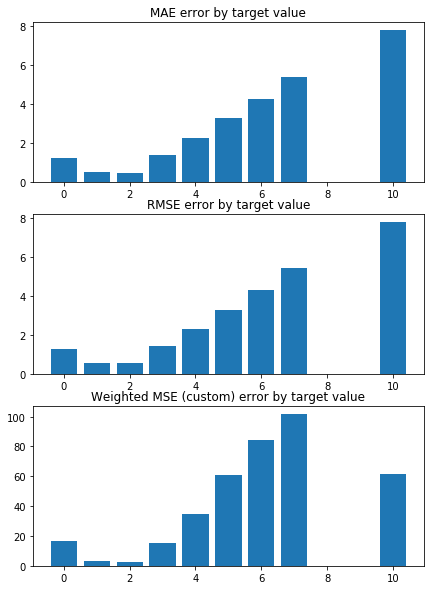

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0770505380397315 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1856469068505198 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


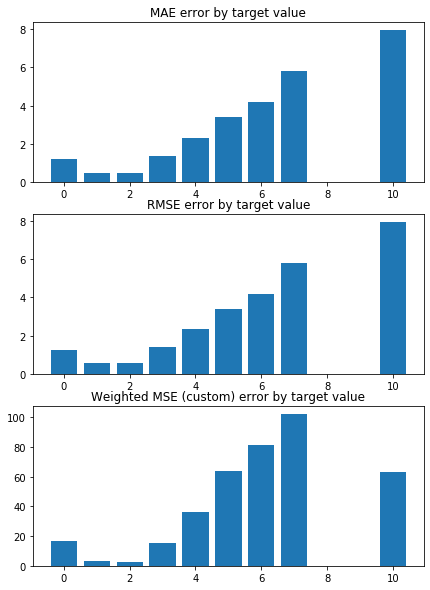

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.197267908664334 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1668707612834317 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


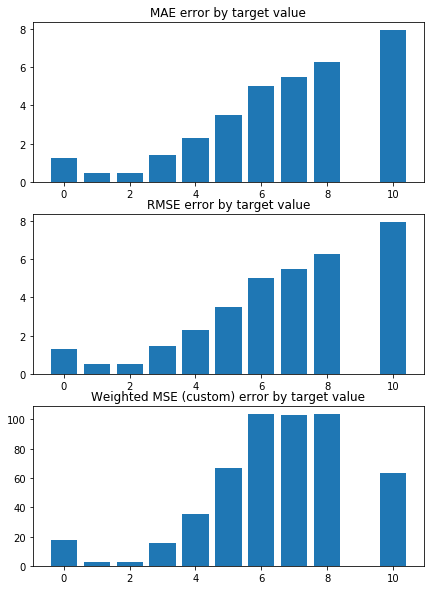

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.145979266826362 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1637468390243446 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


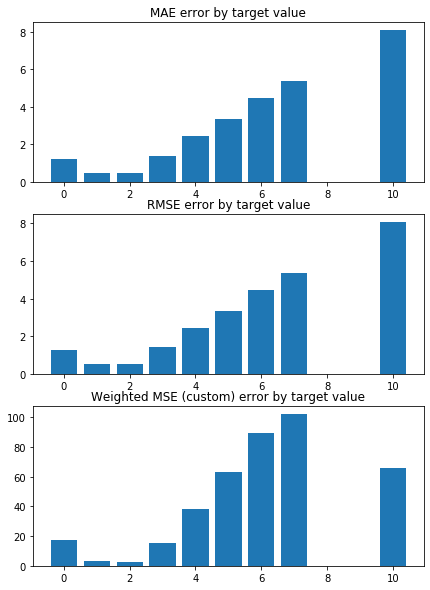

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2703506986598985 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1623107859920525 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


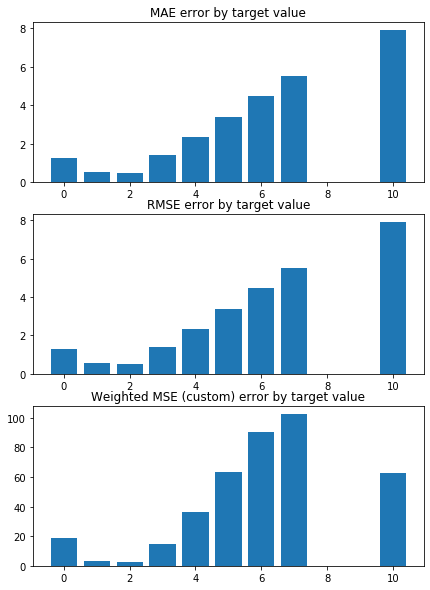

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.182171176477822 


 TRAIN PREDICTION Error
weighted_mse_train: 1.167492955554801 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


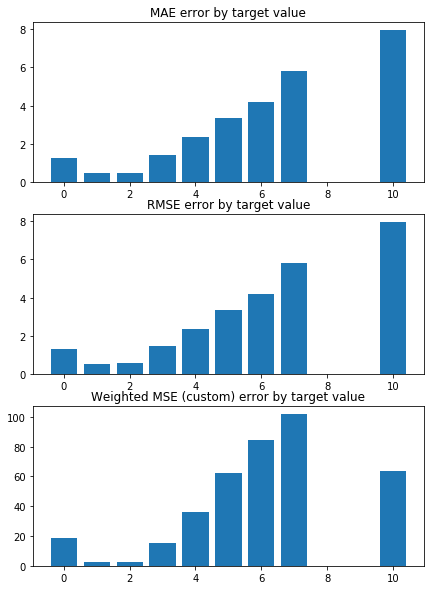

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1509632559516076 


 TRAIN PREDICTION Error
weighted_mse_train: 1.174208124788442 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


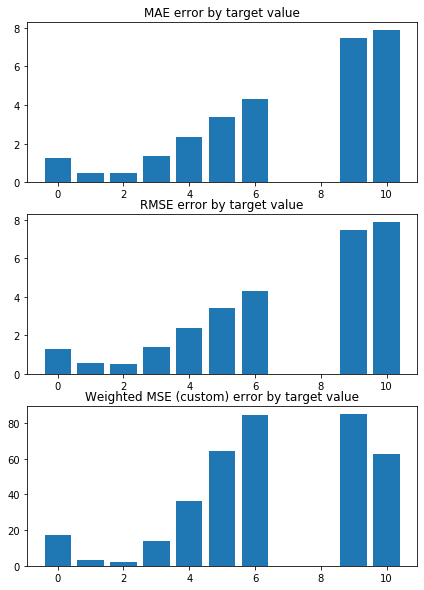

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1581312737378475 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1752682620922936 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


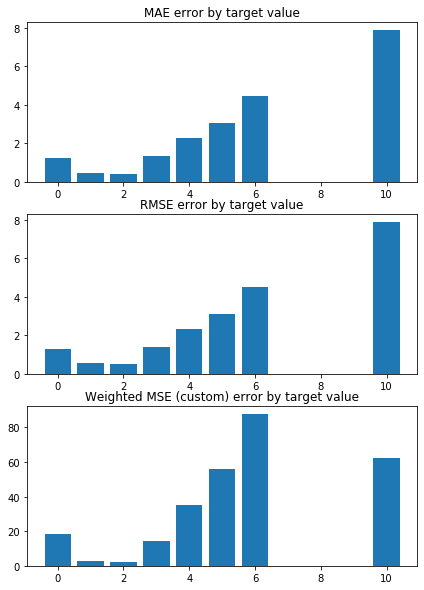

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2445575916123721 


 TRAIN PREDICTION Error
weighted_mse_train: 1.154496465122878 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


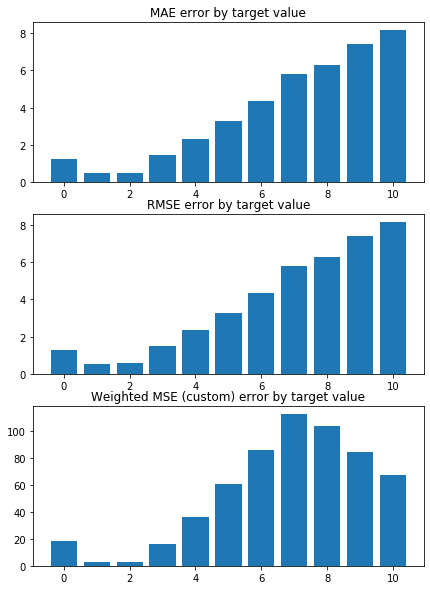

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0911912499481584 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1878653416188443 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


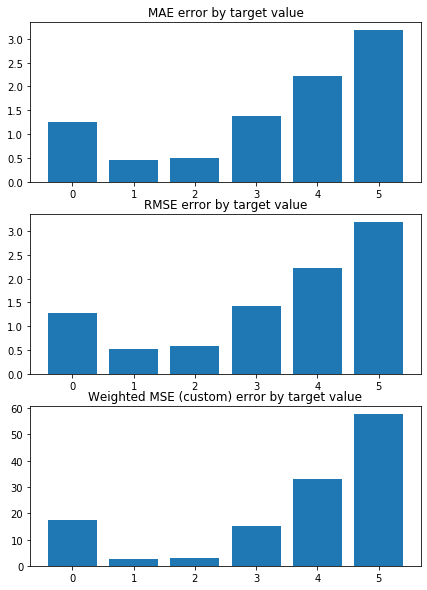

Weighted Mean squared error on Train: 1.17 
 MSE mean train: 1.901194995302798 

Mean squared error on Test: 1.17 
 MSE mean test:  1.9027394669085003 

Root of MSE on Test: 1.08 
 1.379398226368477 

Variance score on Test: 0.06 
 r2_test: 0.11578981268989597 

wMSE_train 1.17
wMSE_test 1.17
MSE_train 1.9
MSE_test 1.9
MAE_train 1.07
MAE_test 1.01
r2_test 0.12
      Chriz   H3K4me3   H3K4me2  RNA-polymerase-II  Su(Hw)  BEAF-32  CP190  \
0 -0.099654 -0.041531 -0.036424          -0.014111     0.0     -0.0   -0.0   
1 -0.093848 -0.045408 -0.044862          -0.010786     0.0     -0.0   -0.0   
2 -0.096876 -0.052292 -0.039559          -0.013262     0.0     -0.0   -0.0   
3 -0.100567 -0.053639 -0.044211          -0.007941     0.0     -0.0   -0.0   
4 -0.094612 -0.049213 -0.040901          -0.010149     0.0     -0.0   -0.0   
5 -0.098130 -0.042054 -0.040927          -0.019957     0.0     -0.0   -0.0   
6 -0.095223 -0.048927 -0.047620          -0.007565     0.0     -0.0   -0.0   
7 -0.098783 -

In [115]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.ElasticNet()

model_name = 'LR+L1+L2'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [116]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.950676,0.066193,0.948289,0.008838,-,test_params = testtest,1.594532,0.276372,1.590623,0.032036,"[0.3057351447165688, 0.28247176467209545, 0.22...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.902652,0.076057,0.900240,0.009319,-,test_params = testtest,1.504238,0.284133,1.499748,0.031871,"[0.37179021979005444, 0.335088729989224, 0.230...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.899531,0.076908,0.896751,0.009301,-,test_params = testtest,1.497132,0.285170,1.491958,0.031850,"[0.37654224772856193, 0.3394007635436346, 0.23...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.172185,0.057942,1.171260,0.009850,-,test_params = testtest,1.902739,0.258107,1.901195,0.032709,"[0.12997091814669282, 0.12700767824118142, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."


In [117]:
weighted_mse_train_all, weighted_mse_test_all

(array([1.17469231, 1.18564691, 1.16687076, 1.16374684, 1.16231079,
        1.16749296, 1.17420812, 1.17526826, 1.15449647, 1.18786534]),
 array([1.20418714, 1.07705054, 1.19726791, 1.14597927, 1.2703507 ,
        1.18217118, 1.15096326, 1.15813127, 1.24455759, 1.09119125]))

In [118]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


wmse_mean_train, wmse_mean_test = 1.1712598750778764 1.172185009598818


KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8843288140147265 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9101086968468735 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


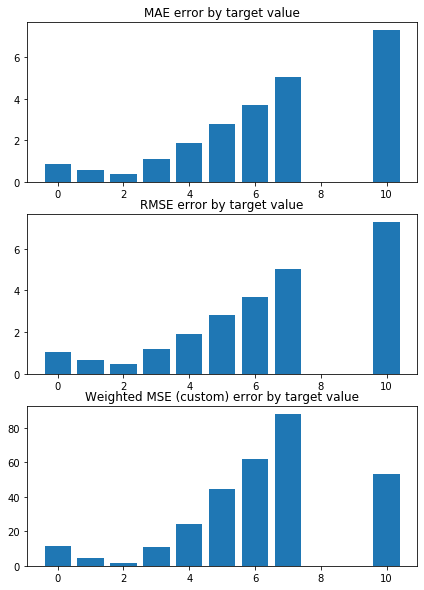

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.80648950113595 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9163119400389018 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


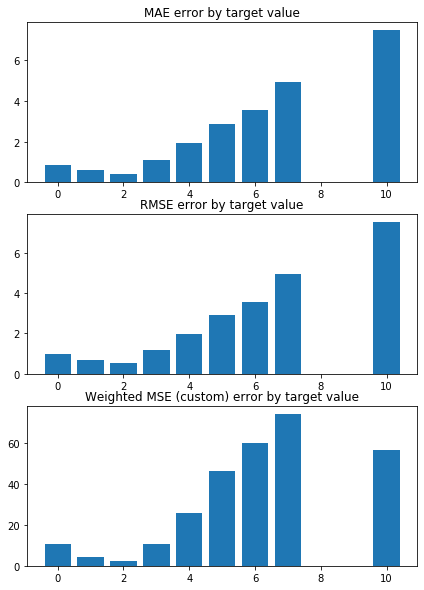

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9854686462217312 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8954259566502366 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


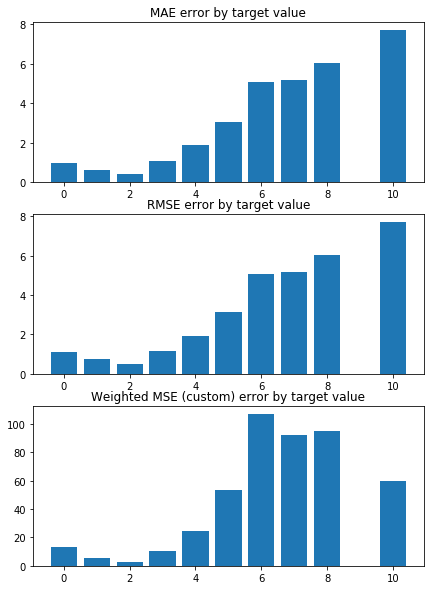

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9341418811008119 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8986831561855803 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


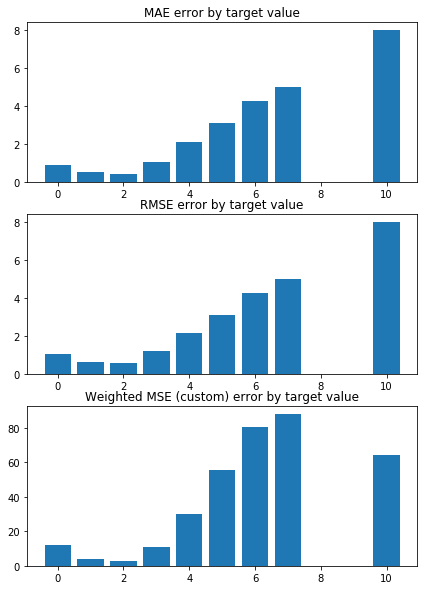

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.000455955392557 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8958179631760559 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


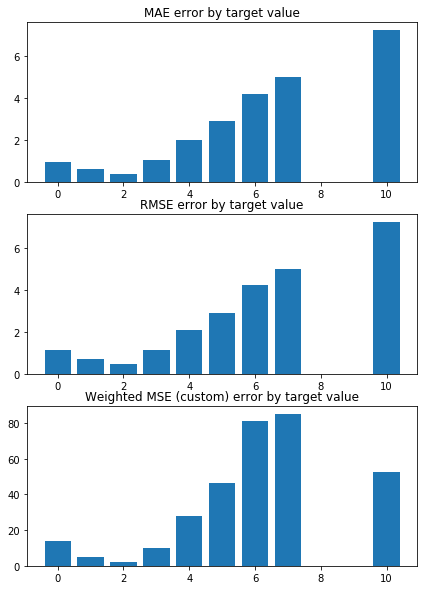

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9276273091528954 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9045407488282929 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


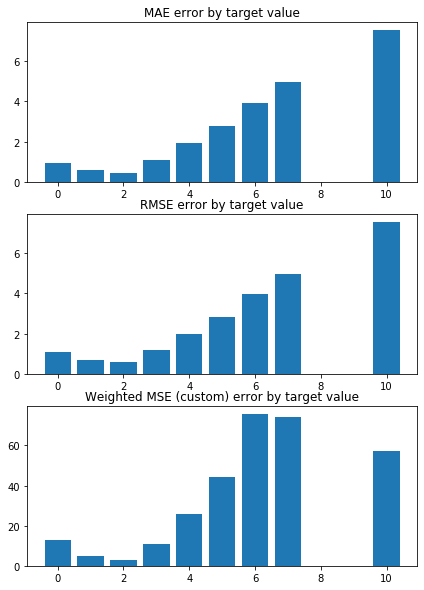

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.90144390659613 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9050841464107573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


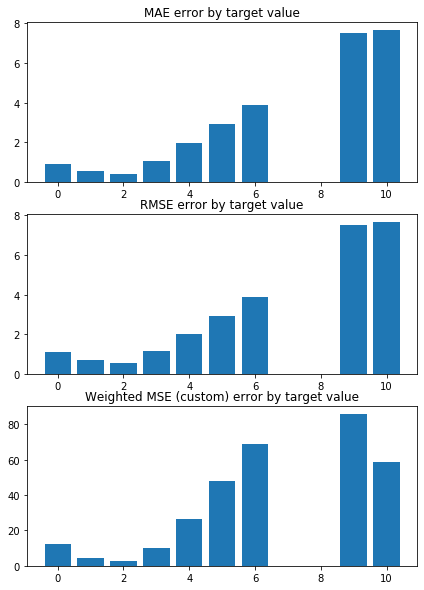

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8897695049338655 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9074219867548993 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


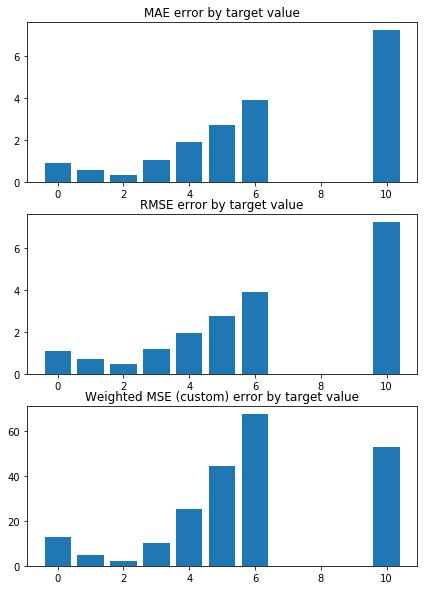

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9834074684862935 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8958744826437092 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


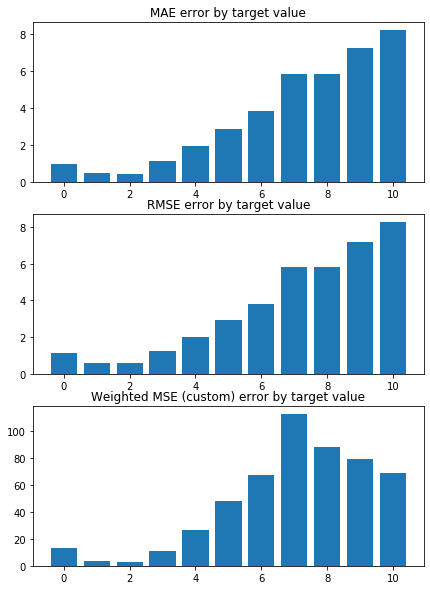

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7703423844573916 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9234981821962464 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


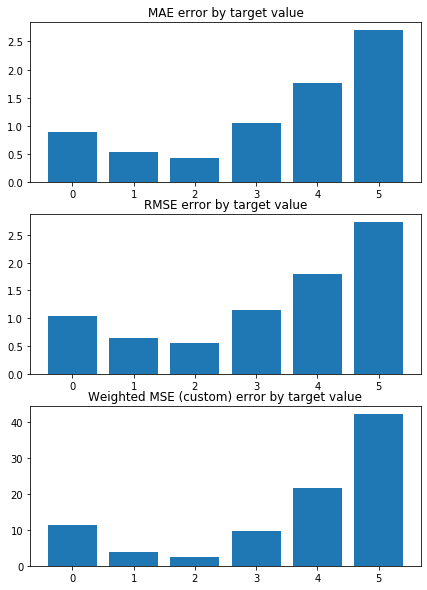

Weighted Mean squared error on Train: 0.91 
 MSE mean train: 1.5187457662929815 

Mean squared error on Test: 0.91 
 MSE mean test:  1.5244596871323213 

Root of MSE on Test: 0.95 
 1.2346901178564285 

Variance score on Test: 0.07 
 r2_test: 0.2957303487336537 

wMSE_train 0.91
wMSE_test 0.91
MSE_train 1.52
MSE_test 1.52
MAE_train 0.89
MAE_test 0.8
r2_test 0.3
      Chriz  H3K36me3   H3K4me1     CP190       GAF   H3K9me3  \
0 -0.266546 -0.162929 -0.127116 -0.074541 -0.063242  0.038980   
1 -0.254295 -0.168636 -0.152776 -0.074709 -0.058049  0.040790   
2 -0.241270 -0.172625 -0.126677 -0.083560 -0.067054  0.027725   
3 -0.250934 -0.180330 -0.145493 -0.077267 -0.065166  0.022647   
4 -0.243317 -0.165198 -0.146579 -0.072222 -0.061786  0.022655   
5 -0.260532 -0.162114 -0.146950 -0.070193 -0.055533  0.023750   
6 -0.245039 -0.160264 -0.131574 -0.089938 -0.074051  0.051987   
7 -0.263063 -0.161324 -0.144531 -0.078759 -0.057602  0.040394   
8 -0.257006 -0.159158 -0.125936 -0.073723 -0.054207

In [119]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object

alpha =  0.2 # 3000 + 0.2
l1_ratio = 0.5 # 0.000066 # 0.2 / (3000 + 0.2)

model = linear_model.ElasticNet(alpha=alpha, l1_ratio=l1_ratio, fit_intercept=True, normalize=False, precompute=False, max_iter=1000, 
                                copy_X=True, tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')


model_name = 'LR+L2_alf=.2_rat=.5'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [120]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.950676,0.066193,0.948289,0.008838,-,test_params = testtest,1.594532,0.276372,1.590623,0.032036,"[0.3057351447165688, 0.28247176467209545, 0.22...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.902652,0.076057,0.900240,0.009319,-,test_params = testtest,1.504238,0.284133,1.499748,0.031871,"[0.37179021979005444, 0.335088729989224, 0.230...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.899531,0.076908,0.896751,0.009301,-,test_params = testtest,1.497132,0.285170,1.491958,0.031850,"[0.37654224772856193, 0.3394007635436346, 0.23...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.172185,0.057942,1.171260,0.009850,-,test_params = testtest,1.902739,0.258107,1.901195,0.032709,"[0.12997091814669282, 0.12700767824118142, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,0.908348,0.071759,0.905277,0.008948,-,test_params = testtest,1.524460,0.282622,1.518746,0.031705,"[0.35287878095203695, 0.3189491608710735, 0.23...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."


In [121]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 0.9052767259731553 0.9083475371492351


In [122]:
coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:][coefs_argsort][0])
coefs_pd.round(2)

,Chriz,H3K36me3,H3K4me1,CP190,GAF,H3K9me3,RNA-polymerase-II,H3K4me2,H3K9me2,BEAF-32,H3K4me3,H4K16ac,Su(Hw),H3K27ac,H3K27me1,H3K27me3,H3K36me1,CTCF
0,-0.27,-0.00,0.0,-0.02,-0.07,-0.06,-0.13,-0.03,-0.02,0.03,0.04,-0.0,-0.0,0.0,-0.0,-0.16,-0.0,-0.04
1,-0.25,-0.00,0.0,-0.03,-0.07,-0.06,-0.15,-0.04,-0.03,0.01,0.04,-0.0,-0.0,0.0,-0.0,-0.17,-0.0,-0.02
2,-0.24,-0.01,0.0,-0.04,-0.08,-0.07,-0.13,-0.03,-0.04,0.04,0.03,-0.0,-0.0,0.0,-0.0,-0.17,-0.0,-0.04
3,-0.25,-0.00,0.0,-0.03,-0.08,-0.07,-0.15,-0.03,-0.04,0.03,0.02,-0.0,-0.0,0.0,-0.0,-0.18,-0.0,-0.01
4,-0.24,-0.00,0.0,-0.03,-0.07,-0.06,-0.15,-0.02,-0.04,0.03,0.02,-0.0,-0.0,0.0,-0.0,-0.17,-0.0,-0.03
5,-0.26,-0.00,0.0,-0.03,-0.07,-0.06,-0.15,-0.03,-0.02,0.03,0.02,-0.0,-0.0,0.0,-0.0,-0.16,-0.0,-0.05
6,-0.25,-0.00,0.0,-0.03,-0.09,-0.07,-0.13,-0.04,-0.05,0.01,0.05,-0.0,-0.0,0.0,-0.0,-0.16,-0.0,-0.02
7,-0.26,-0.00,0.0,-0.03,-0.08,-0.06,-0.14,-0.03,-0.03,0.02,0.04,-0.0,-0.0,0.0,-0.0,-0.16,-0.0,-0.03
8,-0.26,-0.00,0.0,-0.02,-0.07,-0.05,-0.13,-0.06,-0.04,0.02,0.05,-0.0,-0.0,0.0,-0.0,-0.16,-0.0,-0.02
9,-0.26,-0.01,0.0,-0.03,-0.07,-0.06,-0.14,-0.03,-0.03,0.02,0.04,-0.0,-0.0,-0.0,-0.0,-0.16,-0.0,-0.02


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.8468856384588815 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8961159400363372 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4063865324088682
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


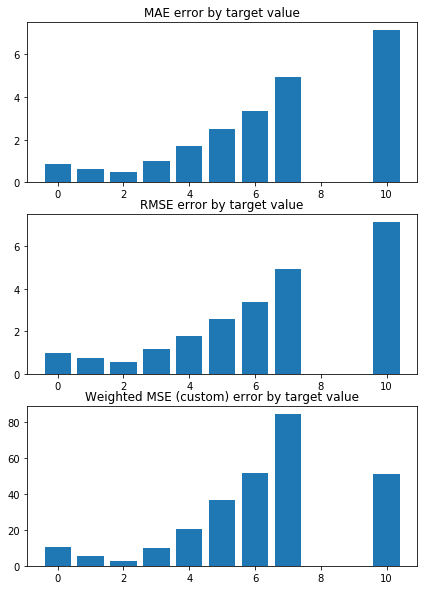

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7975789755735555 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9015923143907226 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2830239989229137
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


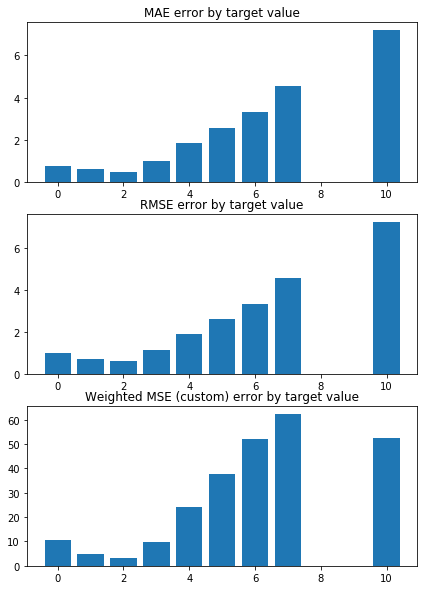

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0049149257521313 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8795016496679406 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3764699984214421
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


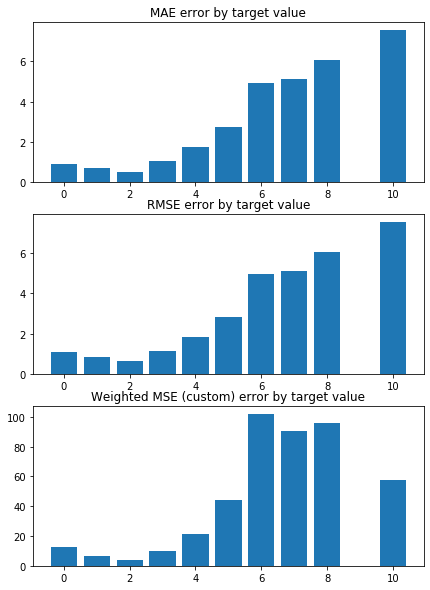

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9340342124912115 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8845870462697676 


 CONSTANT pred Error:
weighted_mse_test_const:  1.318220853021891
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


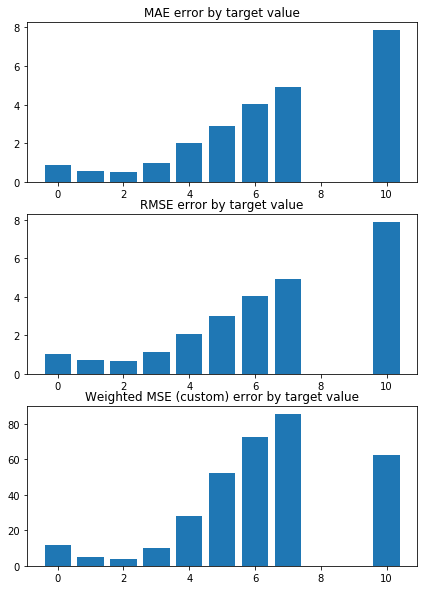

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9773369578010445 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8794706163382532 


 CONSTANT pred Error:
weighted_mse_test_const:  1.462727437863662
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


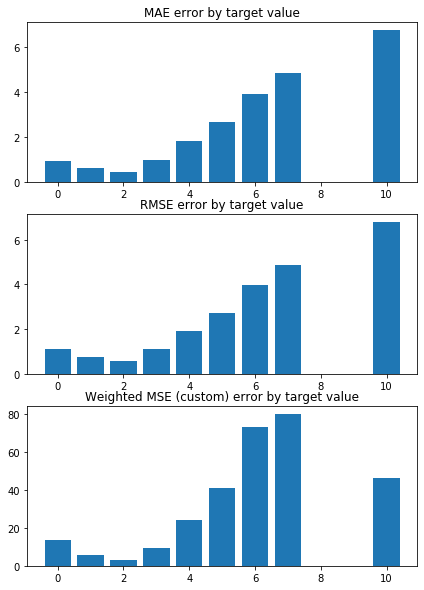

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9036418856153632 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8879341090007888 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3642462640779673
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


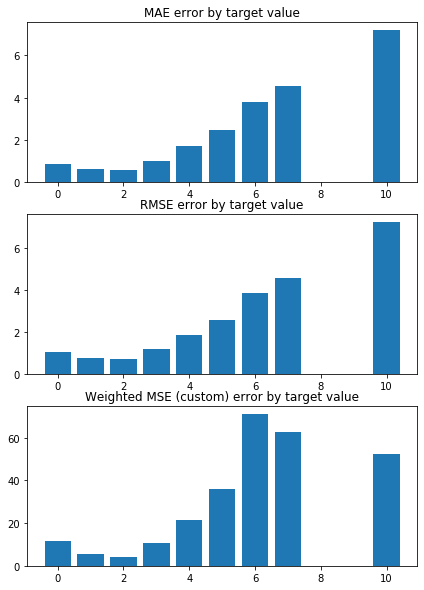

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.904141341606964 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8919974925058974 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3448044314797851
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


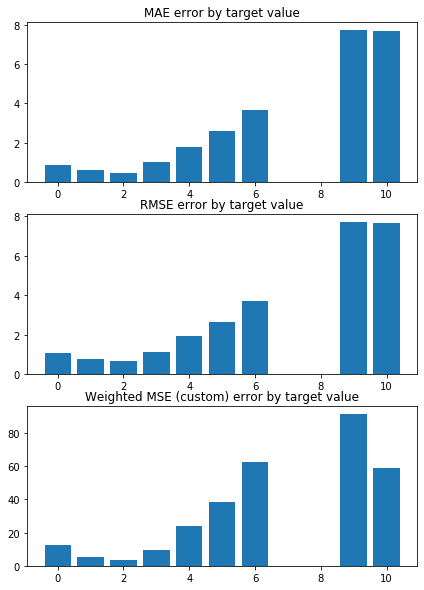

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 0.8888864779014237 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8927441442794174 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3574643403217264
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


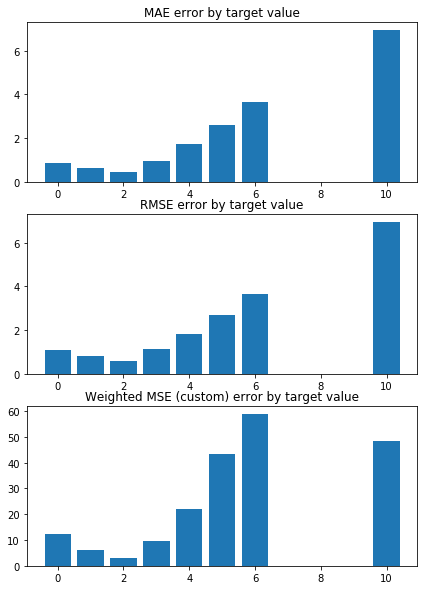

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9602303846608798 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8825039435387346 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4274046151432886
test sizes =  595 595 595


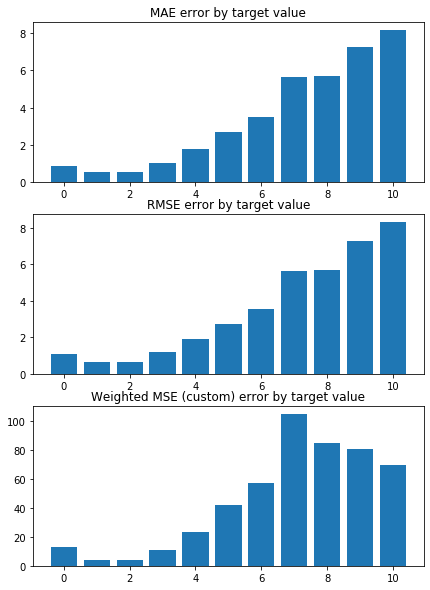

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.7526194365238811 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9096443314575876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.2992669995196942
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


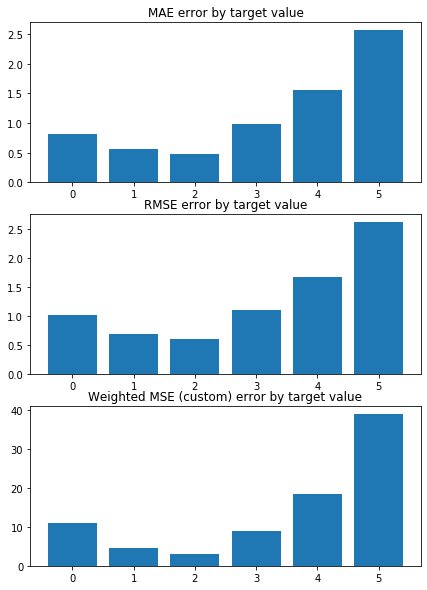

Weighted Mean squared error on Train: 0.89 
 MSE mean train: 1.4693833459339656 

Mean squared error on Test: 0.90 
 MSE mean test:  1.4810645696208364 

Root of MSE on Test: 0.95 
 1.2169899628266605 

Variance score on Test: 0.08 
 r2_test: 0.3158778157232478 

wMSE_train 0.89
wMSE_test 0.9
MSE_train 1.47
MSE_test 1.48
MAE_train 0.87
MAE_test 0.77
r2_test 0.32
      Chriz   H3K9me3  H3K36me3   H3K4me1     CP190       GAF   H3K9me2  \
0 -0.425175  0.280112 -0.275135 -0.187430 -0.164903 -0.150293 -0.147859   
1 -0.414835  0.320945 -0.302229 -0.221283 -0.161158 -0.139119 -0.209257   
2 -0.376884  0.230790 -0.285298 -0.178649 -0.175687 -0.153890 -0.095870   
3 -0.389100  0.279021 -0.318000 -0.209905 -0.177116 -0.156682 -0.163545   
4 -0.365348  0.268475 -0.291039 -0.223090 -0.171286 -0.148516 -0.157718   
5 -0.403140  0.252983 -0.280585 -0.209485 -0.173189 -0.140690 -0.138454   
6 -0.388021  0.340447 -0.283263 -0.185518 -0.188349 -0.161527 -0.211988   
7 -0.426858  0.329119 -0.299364 -0.

In [123]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression()

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)



In [124]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.950676,0.066193,0.948289,0.008838,-,test_params = testtest,1.594532,0.276372,1.590623,0.032036,"[0.3057351447165688, 0.28247176467209545, 0.22...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.902652,0.076057,0.900240,0.009319,-,test_params = testtest,1.504238,0.284133,1.499748,0.031871,"[0.37179021979005444, 0.335088729989224, 0.230...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.899531,0.076908,0.896751,0.009301,-,test_params = testtest,1.497132,0.285170,1.491958,0.031850,"[0.37654224772856193, 0.3394007635436346, 0.23...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.172185,0.057942,1.171260,0.009850,-,test_params = testtest,1.902739,0.258107,1.901195,0.032709,"[0.12997091814669282, 0.12700767824118142, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,0.908348,0.071759,0.905277,0.008948,-,test_params = testtest,1.524460,0.282622,1.518746,0.031705,"[0.35287878095203695, 0.3189491608710735, 0.23...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [125]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,-0.266546,-0.063242,-0.000000,0.0,-0.023457,-0.074541,-0.020813,0.038980,-0.162929,-0.0,-0.0,-0.034425,-0.035634,-0.127116,0.0,-0.0,-0.0,0.025423
1,-0.254295,-0.058049,-0.000000,0.0,-0.028349,-0.074709,-0.031844,0.040790,-0.168636,-0.0,-0.0,-0.038764,-0.021684,-0.152776,0.0,-0.0,-0.0,0.011767
2,-0.241270,-0.067054,-0.007047,0.0,-0.040076,-0.083560,-0.036543,0.027725,-0.172625,-0.0,-0.0,-0.027388,-0.035385,-0.126677,0.0,-0.0,-0.0,0.041839
3,-0.250934,-0.065166,-0.000000,0.0,-0.029885,-0.077267,-0.039106,0.022647,-0.180330,-0.0,-0.0,-0.033735,-0.014988,-0.145493,0.0,-0.0,-0.0,0.032972
4,-0.243317,-0.061786,-0.000000,0.0,-0.030869,-0.072222,-0.044998,0.022655,-0.165198,-0.0,-0.0,-0.023727,-0.030780,-0.146579,0.0,-0.0,-0.0,0.029919
5,-0.260532,-0.055533,-0.000000,0.0,-0.027217,-0.070193,-0.019344,0.023750,-0.162114,-0.0,-0.0,-0.032762,-0.046131,-0.146950,0.0,-0.0,-0.0,0.026904
6,-0.245039,-0.074051,-0.000000,0.0,-0.025214,-0.089938,-0.048298,0.051987,-0.160264,-0.0,-0.0,-0.043715,-0.017563,-0.131574,0.0,-0.0,-0.0,0.014523
7,-0.263063,-0.057602,-0.000000,0.0,-0.030713,-0.078759,-0.028880,0.040394,-0.161324,-0.0,-0.0,-0.031625,-0.030606,-0.144531,0.0,-0.0,-0.0,0.018603
8,-0.257006,-0.054207,-0.000000,0.0,-0.023208,-0.073723,-0.039433,0.046509,-0.159158,-0.0,-0.0,-0.057518,-0.024850,-0.125936,0.0,-0.0,-0.0,0.020989
9,-0.261256,-0.064869,-0.006416,0.0,-0.025432,-0.074723,-0.034042,0.035902,-0.158627,-0.0,-0.0,-0.034828,-0.020089,-0.144707,-0.0,-0.0,-0.0,0.024821


In [126]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0]

Chriz               -0.266546
H3K9me3             -0.063242
H3K36me3            -0.000000
H3K4me1              0.000000
CP190               -0.023457
GAF                 -0.074541
H3K9me2             -0.020813
H3K4me3              0.038980
H3K27me3            -0.162929
H3K27me1            -0.000000
Su(Hw)              -0.000000
H3K4me2             -0.034425
CTCF                -0.035634
RNA-polymerase-II   -0.127116
H3K27ac              0.000000
H3K36me1            -0.000000
H4K16ac             -0.000000
BEAF-32              0.025423
Name: 0, dtype: float64

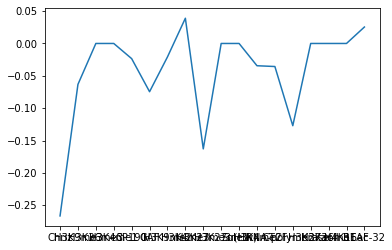

In [127]:
plt.plot(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0])

# !! одинаковая приоритизация 

In [128]:
np.sort(coefs[0])

array([-0.42517487, -0.27513513, -0.18743026, -0.16490304, -0.15029319,
       -0.14785909, -0.08739779, -0.05990675, -0.0439767 , -0.00959621,
       -0.00585994, -0.00523409,  0.02241402,  0.03429698,  0.04498993,
        0.0595683 ,  0.08914662,  0.28011153])

In [129]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,0,10,15,6,4,5,9,8,13,12,2,7,1,17,11,14,16,3
1,0,10,15,6,9,4,5,13,7,8,17,2,12,1,14,3,11,16
2,0,15,10,6,4,5,7,9,13,12,1,2,17,3,14,8,16,11
3,0,15,10,6,4,9,5,13,17,2,7,8,12,14,1,11,3,16
4,0,15,10,6,4,9,5,7,13,2,1,12,14,17,3,11,16,8
5,0,15,10,6,4,5,9,8,13,2,12,7,1,17,14,11,3,16
6,0,10,15,9,4,6,5,13,7,2,17,12,1,14,8,16,11,3
7,0,10,15,9,6,4,5,13,8,2,7,1,14,17,12,11,3,16
8,0,10,15,9,4,6,5,13,8,2,17,1,14,12,11,7,3,16
9,0,10,15,6,9,4,5,13,2,7,8,1,17,12,14,11,16,3


In [130]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['Chriz', 'H3K9me3', 'H3K36me3', 'H3K4me1', 'CP190', 'GAF', 'H3K9me2',
       'H3K4me3', 'H3K27me3', 'H3K27me1', 'Su(Hw)', 'H3K4me2', 'CTCF',
       'RNA-polymerase-II', 'H3K27ac', 'H3K36me1', 'H4K16ac', 'BEAF-32'],
      dtype='object')

In [131]:
coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,-0.425175,0.280112,-0.275135,-0.187430,-0.164903,-0.150293,-0.147859,0.089147,-0.087398,-0.059907,0.059568,0.044990,-0.043977,0.034297,0.022414,-0.009596,-0.005860,-0.005234
1,-0.414835,0.320945,-0.302229,-0.221283,-0.161158,-0.139119,-0.209257,0.056014,-0.108846,-0.047522,0.048863,0.067687,-0.038492,0.054860,0.007828,-0.032776,0.000740,-0.011853
2,-0.376884,0.230790,-0.285298,-0.178649,-0.175687,-0.153890,-0.095870,0.014280,-0.087258,-0.069942,0.057299,0.118170,-0.061886,0.027564,-0.000542,-0.020401,-0.002960,-0.023039
3,-0.389100,0.279021,-0.318000,-0.209905,-0.177116,-0.156682,-0.163545,0.045022,-0.091926,-0.039930,0.064463,0.048241,-0.035959,0.067322,0.024287,-0.036839,0.006709,-0.011360
4,-0.365348,0.268475,-0.291039,-0.223090,-0.171286,-0.148516,-0.157718,-0.002033,-0.089980,-0.036611,0.063742,0.123498,-0.047494,0.030325,0.006484,-0.030919,-0.003513,-0.012426
5,-0.403140,0.252983,-0.280585,-0.209485,-0.173189,-0.140690,-0.138454,0.086497,-0.076720,-0.046580,0.073039,0.044003,-0.038575,0.024746,0.021781,-0.023073,-0.007799,-0.009886
6,-0.388021,0.340447,-0.283263,-0.185518,-0.188349,-0.161527,-0.211988,0.004259,-0.113473,-0.054010,0.065097,0.080253,-0.039393,0.060749,0.002324,-0.033906,-0.003621,-0.001101
7,-0.426858,0.329119,-0.299364,-0.204115,-0.171019,-0.144934,-0.212180,0.082719,-0.107011,-0.031753,0.064754,0.061534,-0.049105,0.036004,0.012310,-0.040557,-0.000358,-0.011877
8,-0.416004,0.335159,-0.302564,-0.165968,-0.170046,-0.135722,-0.202256,0.093106,-0.104345,-0.026104,0.070546,0.001071,-0.046381,0.051471,-0.007207,-0.039645,-0.000237,0.000679
9,-0.408158,0.320636,-0.279085,-0.206670,-0.173548,-0.154835,-0.200497,0.056540,-0.104597,-0.040532,0.074986,0.058886,-0.051352,0.046474,0.023810,-0.028617,-0.008713,-0.008439


In [132]:
coefs_df.round(2)

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,-0.43,0.28,-0.28,-0.19,-0.16,-0.15,-0.15,0.09,-0.09,-0.06,0.06,0.04,-0.04,0.03,0.02,-0.01,-0.01,-0.01
1,-0.41,0.32,-0.30,-0.22,-0.16,-0.14,-0.21,0.06,-0.11,-0.05,0.05,0.07,-0.04,0.05,0.01,-0.03,0.00,-0.01
2,-0.38,0.23,-0.29,-0.18,-0.18,-0.15,-0.10,0.01,-0.09,-0.07,0.06,0.12,-0.06,0.03,-0.00,-0.02,-0.00,-0.02
3,-0.39,0.28,-0.32,-0.21,-0.18,-0.16,-0.16,0.05,-0.09,-0.04,0.06,0.05,-0.04,0.07,0.02,-0.04,0.01,-0.01
4,-0.37,0.27,-0.29,-0.22,-0.17,-0.15,-0.16,-0.00,-0.09,-0.04,0.06,0.12,-0.05,0.03,0.01,-0.03,-0.00,-0.01
5,-0.40,0.25,-0.28,-0.21,-0.17,-0.14,-0.14,0.09,-0.08,-0.05,0.07,0.04,-0.04,0.02,0.02,-0.02,-0.01,-0.01
6,-0.39,0.34,-0.28,-0.19,-0.19,-0.16,-0.21,0.00,-0.11,-0.05,0.07,0.08,-0.04,0.06,0.00,-0.03,-0.00,-0.00
7,-0.43,0.33,-0.30,-0.20,-0.17,-0.14,-0.21,0.08,-0.11,-0.03,0.06,0.06,-0.05,0.04,0.01,-0.04,-0.00,-0.01
8,-0.42,0.34,-0.30,-0.17,-0.17,-0.14,-0.20,0.09,-0.10,-0.03,0.07,0.00,-0.05,0.05,-0.01,-0.04,-0.00,0.00
9,-0.41,0.32,-0.28,-0.21,-0.17,-0.15,-0.20,0.06,-0.10,-0.04,0.07,0.06,-0.05,0.05,0.02,-0.03,-0.01,-0.01


In [133]:
# !! одинаковая приоритизация 

np.sort(coefs[0])

coefs

coefs_argsort[0]

pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

su_drsc.columns[2:], su_drsc.columns[2:][coefs_argsort[0]]

coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

coefs_df.round(2)

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,-0.43,0.28,-0.28,-0.19,-0.16,-0.15,-0.15,0.09,-0.09,-0.06,0.06,0.04,-0.04,0.03,0.02,-0.01,-0.01,-0.01
1,-0.41,0.32,-0.30,-0.22,-0.16,-0.14,-0.21,0.06,-0.11,-0.05,0.05,0.07,-0.04,0.05,0.01,-0.03,0.00,-0.01
2,-0.38,0.23,-0.29,-0.18,-0.18,-0.15,-0.10,0.01,-0.09,-0.07,0.06,0.12,-0.06,0.03,-0.00,-0.02,-0.00,-0.02
3,-0.39,0.28,-0.32,-0.21,-0.18,-0.16,-0.16,0.05,-0.09,-0.04,0.06,0.05,-0.04,0.07,0.02,-0.04,0.01,-0.01
4,-0.37,0.27,-0.29,-0.22,-0.17,-0.15,-0.16,-0.00,-0.09,-0.04,0.06,0.12,-0.05,0.03,0.01,-0.03,-0.00,-0.01
5,-0.40,0.25,-0.28,-0.21,-0.17,-0.14,-0.14,0.09,-0.08,-0.05,0.07,0.04,-0.04,0.02,0.02,-0.02,-0.01,-0.01
6,-0.39,0.34,-0.28,-0.19,-0.19,-0.16,-0.21,0.00,-0.11,-0.05,0.07,0.08,-0.04,0.06,0.00,-0.03,-0.00,-0.00
7,-0.43,0.33,-0.30,-0.20,-0.17,-0.14,-0.21,0.08,-0.11,-0.03,0.06,0.06,-0.05,0.04,0.01,-0.04,-0.00,-0.01
8,-0.42,0.34,-0.30,-0.17,-0.17,-0.14,-0.20,0.09,-0.10,-0.03,0.07,0.00,-0.05,0.05,-0.01,-0.04,-0.00,0.00
9,-0.41,0.32,-0.28,-0.21,-0.17,-0.15,-0.20,0.06,-0.10,-0.04,0.07,0.06,-0.05,0.05,0.02,-0.03,-0.01,-0.01


In [134]:
coefs_df

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,-0.425175,0.280112,-0.275135,-0.187430,-0.164903,-0.150293,-0.147859,0.089147,-0.087398,-0.059907,0.059568,0.044990,-0.043977,0.034297,0.022414,-0.009596,-0.005860,-0.005234
1,-0.414835,0.320945,-0.302229,-0.221283,-0.161158,-0.139119,-0.209257,0.056014,-0.108846,-0.047522,0.048863,0.067687,-0.038492,0.054860,0.007828,-0.032776,0.000740,-0.011853
2,-0.376884,0.230790,-0.285298,-0.178649,-0.175687,-0.153890,-0.095870,0.014280,-0.087258,-0.069942,0.057299,0.118170,-0.061886,0.027564,-0.000542,-0.020401,-0.002960,-0.023039
3,-0.389100,0.279021,-0.318000,-0.209905,-0.177116,-0.156682,-0.163545,0.045022,-0.091926,-0.039930,0.064463,0.048241,-0.035959,0.067322,0.024287,-0.036839,0.006709,-0.011360
4,-0.365348,0.268475,-0.291039,-0.223090,-0.171286,-0.148516,-0.157718,-0.002033,-0.089980,-0.036611,0.063742,0.123498,-0.047494,0.030325,0.006484,-0.030919,-0.003513,-0.012426
5,-0.403140,0.252983,-0.280585,-0.209485,-0.173189,-0.140690,-0.138454,0.086497,-0.076720,-0.046580,0.073039,0.044003,-0.038575,0.024746,0.021781,-0.023073,-0.007799,-0.009886
6,-0.388021,0.340447,-0.283263,-0.185518,-0.188349,-0.161527,-0.211988,0.004259,-0.113473,-0.054010,0.065097,0.080253,-0.039393,0.060749,0.002324,-0.033906,-0.003621,-0.001101
7,-0.426858,0.329119,-0.299364,-0.204115,-0.171019,-0.144934,-0.212180,0.082719,-0.107011,-0.031753,0.064754,0.061534,-0.049105,0.036004,0.012310,-0.040557,-0.000358,-0.011877
8,-0.416004,0.335159,-0.302564,-0.165968,-0.170046,-0.135722,-0.202256,0.093106,-0.104345,-0.026104,0.070546,0.001071,-0.046381,0.051471,-0.007207,-0.039645,-0.000237,0.000679
9,-0.408158,0.320636,-0.279085,-0.206670,-0.173548,-0.154835,-0.200497,0.056540,-0.104597,-0.040532,0.074986,0.058886,-0.051352,0.046474,0.023810,-0.028617,-0.008713,-0.008439


In [135]:
coefs_df_2 = coefs_df.round(2)
coefs_df_2

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,-0.43,0.28,-0.28,-0.19,-0.16,-0.15,-0.15,0.09,-0.09,-0.06,0.06,0.04,-0.04,0.03,0.02,-0.01,-0.01,-0.01
1,-0.41,0.32,-0.30,-0.22,-0.16,-0.14,-0.21,0.06,-0.11,-0.05,0.05,0.07,-0.04,0.05,0.01,-0.03,0.00,-0.01
2,-0.38,0.23,-0.29,-0.18,-0.18,-0.15,-0.10,0.01,-0.09,-0.07,0.06,0.12,-0.06,0.03,-0.00,-0.02,-0.00,-0.02
3,-0.39,0.28,-0.32,-0.21,-0.18,-0.16,-0.16,0.05,-0.09,-0.04,0.06,0.05,-0.04,0.07,0.02,-0.04,0.01,-0.01
4,-0.37,0.27,-0.29,-0.22,-0.17,-0.15,-0.16,-0.00,-0.09,-0.04,0.06,0.12,-0.05,0.03,0.01,-0.03,-0.00,-0.01
5,-0.40,0.25,-0.28,-0.21,-0.17,-0.14,-0.14,0.09,-0.08,-0.05,0.07,0.04,-0.04,0.02,0.02,-0.02,-0.01,-0.01
6,-0.39,0.34,-0.28,-0.19,-0.19,-0.16,-0.21,0.00,-0.11,-0.05,0.07,0.08,-0.04,0.06,0.00,-0.03,-0.00,-0.00
7,-0.43,0.33,-0.30,-0.20,-0.17,-0.14,-0.21,0.08,-0.11,-0.03,0.06,0.06,-0.05,0.04,0.01,-0.04,-0.00,-0.01
8,-0.42,0.34,-0.30,-0.17,-0.17,-0.14,-0.20,0.09,-0.10,-0.03,0.07,0.00,-0.05,0.05,-0.01,-0.04,-0.00,0.00
9,-0.41,0.32,-0.28,-0.21,-0.17,-0.15,-0.20,0.06,-0.10,-0.04,0.07,0.06,-0.05,0.05,0.02,-0.03,-0.01,-0.01


In [136]:
coefs_means = pd.DataFrame ( coefs_df.mean() )
coefs_means.round(2)# .values, coefs_means.values

,0
Chriz,-0.40
H3K9me3,0.30
H3K36me3,-0.29
H3K4me1,-0.20
CP190,-0.17
GAF,-0.15
H3K9me2,-0.17
H3K4me3,0.05
H3K27me3,-0.10
H3K27me1,-0.05


In [137]:
coefs_std = pd.DataFrame (coefs_df.std())

coefs_std.round(4)

,0
Chriz,0.0208
H3K9me3,0.0383
H3K36me3,0.0135
H3K4me1,0.0189
CP190,0.0073
GAF,0.0084
H3K9me2,0.0395
H3K4me3,0.0364
H3K27me3,0.0120
H3K27me1,0.0133


In [138]:
order_df = np.argsort(np.abs(coefs_means))
priority_order = order_df.index.values

priority_order


array(['Chriz', 'H3K9me3', 'H3K36me3', 'H3K4me1', 'CP190', 'GAF',
       'H3K9me2', 'H3K4me3', 'H3K27me3', 'H3K27me1', 'Su(Hw)', 'H3K4me2',
       'CTCF', 'RNA-polymerase-II', 'H3K27ac', 'H3K36me1', 'H4K16ac',
       'BEAF-32'], dtype=object)

In [139]:
coefs_df_2[priority_order]

,Chriz,H3K9me3,H3K36me3,H3K4me1,CP190,GAF,H3K9me2,H3K4me3,H3K27me3,H3K27me1,Su(Hw),H3K4me2,CTCF,RNA-polymerase-II,H3K27ac,H3K36me1,H4K16ac,BEAF-32
0,-0.43,0.28,-0.28,-0.19,-0.16,-0.15,-0.15,0.09,-0.09,-0.06,0.06,0.04,-0.04,0.03,0.02,-0.01,-0.01,-0.01
1,-0.41,0.32,-0.30,-0.22,-0.16,-0.14,-0.21,0.06,-0.11,-0.05,0.05,0.07,-0.04,0.05,0.01,-0.03,0.00,-0.01
2,-0.38,0.23,-0.29,-0.18,-0.18,-0.15,-0.10,0.01,-0.09,-0.07,0.06,0.12,-0.06,0.03,-0.00,-0.02,-0.00,-0.02
3,-0.39,0.28,-0.32,-0.21,-0.18,-0.16,-0.16,0.05,-0.09,-0.04,0.06,0.05,-0.04,0.07,0.02,-0.04,0.01,-0.01
4,-0.37,0.27,-0.29,-0.22,-0.17,-0.15,-0.16,-0.00,-0.09,-0.04,0.06,0.12,-0.05,0.03,0.01,-0.03,-0.00,-0.01
5,-0.40,0.25,-0.28,-0.21,-0.17,-0.14,-0.14,0.09,-0.08,-0.05,0.07,0.04,-0.04,0.02,0.02,-0.02,-0.01,-0.01
6,-0.39,0.34,-0.28,-0.19,-0.19,-0.16,-0.21,0.00,-0.11,-0.05,0.07,0.08,-0.04,0.06,0.00,-0.03,-0.00,-0.00
7,-0.43,0.33,-0.30,-0.20,-0.17,-0.14,-0.21,0.08,-0.11,-0.03,0.06,0.06,-0.05,0.04,0.01,-0.04,-0.00,-0.01
8,-0.42,0.34,-0.30,-0.17,-0.17,-0.14,-0.20,0.09,-0.10,-0.03,0.07,0.00,-0.05,0.05,-0.01,-0.04,-0.00,0.00
9,-0.41,0.32,-0.28,-0.21,-0.17,-0.15,-0.20,0.06,-0.10,-0.04,0.07,0.06,-0.05,0.05,0.02,-0.03,-0.01,-0.01


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

In [140]:
def getConfIdxFrequencies(coefs_argsort, feature_names, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(feature_names[key], value)) # (feature_names[key], value))
        
    return featur_freq_dict

In [141]:
feature_names = su_drsc.columns[2:]
feature_names

Index(['Chriz', 'CTCF', 'Su(Hw)', 'BEAF-32', 'CP190', 'GAF', 'H3K4me1',
       'H3K4me2', 'H3K4me3', 'H3K9me2', 'H3K9me3', 'H3K27ac', 'H3K27me1',
       'H3K27me3', 'H3K36me1', 'H3K36me3', 'H4K16ac', 'RNA-polymerase-II'],
      dtype='object')

In [142]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 0)

Chriz: 20
H3K9me3: 20
H3K36me3: 20
CTCF: 10
Su(Hw): 10
BEAF-32: 10
CP190: 10
GAF: 10
H3K4me1: 10
H3K4me2: 10
H3K4me3: 10
H3K9me2: 10
H3K27ac: 10
H3K27me1: 10
H3K27me3: 10
H3K36me1: 10
H4K16ac: 10
RNA-polymerase-II: 10


In [143]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 5, max_lim = 0)

Chriz: 20
H3K9me3: 20
H3K36me3: 20
H3K4me1: 18
CP190: 17
H3K9me2: 15
CTCF: 10
Su(Hw): 10
BEAF-32: 10
GAF: 10
H3K4me2: 10
H3K4me3: 10
H3K27ac: 10
H3K27me1: 10
H3K27me3: 10
H3K36me1: 10
H4K16ac: 10
RNA-polymerase-II: 10


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONST pred

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONSTANT pred Error:

In [144]:

print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.3824593863907273
weighted_mse_test_const:  1.3272985106371562


In [145]:

def train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )


        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.3824593863907273
weighted_mse_test_const:  1.3272985106371562


In [146]:
#  weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

In [147]:
# weighted_mse_test_all, weighted_mse_train_all

In [148]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")
# # Explained variance score: 1 is perfect prediction
# print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error CONST std on Train : 0.89 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.90 
 wmst CONST std test 0.08 



In [149]:
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )

 CONSTANT pred Error:
weighted_mse_train_const:  1.3824593863907273
weighted_mse_test_const:  1.3272985106371562


In [173]:
def train_test_KFold_const(X, y, n_splits=5, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )
        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.3757701140568894
weighted_mse_test_const:  1.2992669995196942


In [174]:
weighted_mse_test_all, \
weighted_mse_train_all  =  train_test_KFold_const(X, 
                                                 y,
                                                 n_splits=5, 
                                                 random_state=16,
                                                 shuffle=True)


KFold(n_splits=5, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3702294151205097
weighted_mse_test_const:  1.3456105997630745
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3646121768215125
weighted_mse_test_const:  1.3451635911929014
train_index= [   1    4    5 ... 5944 5945 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.347752913518197
weighted_mse_test_const:  1.411882650610877
train_index= [   0    1    2 ... 5946 5947 5948]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3701172556617454
weighted_mse_test_const:  1.352836446520946
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3659423100351409
weighted_mse_test_const:  1.363791328427953
Weighted Mean squared error on Train: 1.36 
 [1.37022942 1.36461218 1.34775291 1.37011726 1.36594231] 

Weighted Mean squared error on Test: 1.36

In [175]:
 weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3598390652573922
weighted_mse_test_const:  1.4063865324088682
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3733850602520663
weighted_mse_test_const:  1.2830239989229137
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3635079217610573
weighted_mse_test_const:  1.3764699984214421
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3646536276658503
weighted_mse_test_const:  1.318220853021891
train_index= [   0    1    2 ... 5946 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.3507475781784193
weighted_mse_test_const:  1.462727437863662
train_index= [   1    4    5 ... 5945 5947 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.362501969543359
weighted_mse_test_const:  

In [176]:
# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      weighted_mse_train_all, "\n")

# The mean squared error
print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      weighted_mse_test_all, "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error on Train: 1.36 
 [1.35983907 1.37338506 1.36350792 1.36465363 1.35074758 1.36250197
 1.36739776 1.36571897 1.35366363 1.37577011] 

Weighted Mean squared error on Test: 1.36 
 [1.40638653 1.283024   1.37647    1.31822085 1.46272744 1.36424626
 1.34480443 1.35746434 1.42740462 1.299267  ] 

Variance score on Test: 0.05 
 [1.40638653 1.283024   1.37647    1.31822085 1.46272744 1.36424626
 1.34480443 1.35746434 1.42740462 1.299267  ] 



In [177]:
%%time

for train_index, test_index in kf.split(X):
    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    #         # Train the model using the training sets
    #         model.fit(X_train, y_train)

    #         # Make predictions using the train set
    #         y_pred_train = model.predict(X_train)

    #         # Make predictions using the testing set
    #         y_pred = model.predict(X_test)


    print(" CONSTANT pred Error:" )

    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )
    const_pred_train = np.array([const_pred] * len(y_train) )


    y_pred_train = const_pred_train
    y_pred = const_pred_test
    
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    print("Mean squared error on Train: %.2f"
          % mean_squared_error(y_train, y_pred_train))

    # The mean squared error
    print("Mean squared error on Test: %.2f"
          % mean_squared_error(y_test, y_pred))

    # The mean squared error
    print("Root of Mean squared error: %.2f"
          % np.sqrt(mean_squared_error(y_test, y_pred)))

    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.2f' % r2_score(y_test, y_pred))


    print("MAE on Train: %.2f"
          % mae_cout(y_train, y_pred_train))

    # The mean squared error
    print("MAE on Test: %.2f"
          %  mae_cout(y_test, y_pred))


train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.36
wMean squared error on Test: 1.41
Mean squared error on Train: 2.16
Mean squared error on Test: 2.04
Root of Mean squared error: 1.43
Variance score: -0.00
MAE on Train: 1.16
MAE on Test: 1.17
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.37
wMean squared error on Test: 1.28
Mean squared error on Train: 2.16
Mean squared error on Test: 2.07
Root of Mean squared error: 1.44
Variance score: -0.00
MAE on Train: 1.16
MAE on Test: 1.13
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.36
wMean squared error on Test: 1.38
Mean squared error on Train: 2.13
Mean squared error on Test: 2.35
Root of Mean squared error: 1.53
Variance score: -0.00
MAE on Train: 1.16
MAE on Test: 1.17
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.

In [178]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 1.36 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.36 
 wmst CONST std test 0.05 



In [179]:
res_dict = {
        'model_name': 'const_pred',
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

results_pd = results_pd.append(res_dict, ignore_index=True)
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.950676,0.066193,0.948289,0.008838,-,test_params = testtest,1.594532,0.276372,1.590623,0.032036,"[0.3057351447165688, 0.28247176467209545, 0.22...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.902652,0.076057,0.900240,0.009319,-,test_params = testtest,1.504238,0.284133,1.499748,0.031871,"[0.37179021979005444, 0.335088729989224, 0.230...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.899531,0.076908,0.896751,0.009301,-,test_params = testtest,1.497132,0.285170,1.491958,0.031850,"[0.37654224772856193, 0.3394007635436346, 0.23...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.172185,0.057942,1.171260,0.009850,-,test_params = testtest,1.902739,0.258107,1.901195,0.032709,"[0.12997091814669282, 0.12700767824118142, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,0.908348,0.071759,0.905277,0.008948,-,test_params = testtest,1.524460,0.282622,1.518746,0.031705,"[0.35287878095203695, 0.3189491608710735, 0.23...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,0.856361,0.076142,0.752072,0.008253,-,test_params = testtest,1.439148,0.268885,1.222968,0.026513,"[0.3708879021431173, 0.37488152781252493, 0.25...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# L1 Lasso regulization

In [156]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.2)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

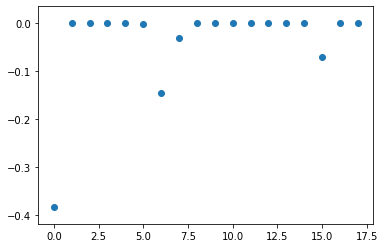

In [157]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [158]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index(['Chriz', 'GAF', 'H3K4me1', 'H3K4me2', 'H3K36me3'], dtype='object')

In [159]:
lin_reg_l1.coef_

array([-0.38400677, -0.        ,  0.        , -0.        , -0.        ,
       -0.00225311, -0.14558455, -0.03084174, -0.        ,  0.        ,
        0.        , -0.        , -0.        ,  0.        , -0.        ,
       -0.07009842, -0.        , -0.        ])

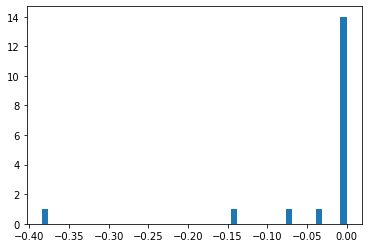

In [160]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [161]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.8)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

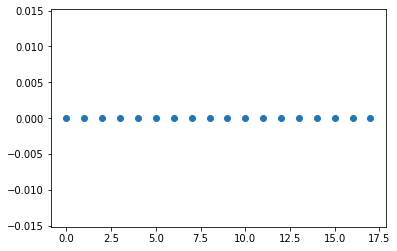

In [162]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [163]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index([], dtype='object')

In [164]:
lin_reg_l1.coef_

array([-0., -0.,  0., -0., -0., -0., -0., -0., -0.,  0.,  0., -0., -0.,
        0., -0., -0., -0., -0.])

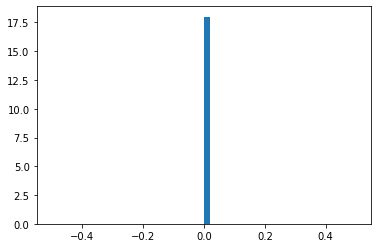

In [165]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

# Gradient Boosting Regressor

In [166]:
%%time

import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

from sklearn import ensemble

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.76
wMean squared error on Test: 0.87
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.76
wMean squared error on Test: 0.73
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.74
wMean squared error on Test: 0.96
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.87
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.91
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.84
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.88
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.85
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

In [167]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


Weighted Mean squared error CONST std on Train : 0.75 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.86 
 wmst CONST std test 0.08 



# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

In [168]:
params = {'n_estimators': 100, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    
#     y_pred_train = const_pred_train
#     y_pred = const_pred_test

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))

    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))

    
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.88
wMean squared error on Test: 0.96
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.88
wMean squared error on Test: 0.81
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.86
wMean squared error on Test: 0.98
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.92
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 1.01
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.91
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.93
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.90
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

,Chriz,H3K9me3,H3K36me3,H3K4me1,H3K9me2,CP190,GAF,H3K27me3,Su(Hw),H3K4me2,H3K4me3,CTCF,RNA-polymerase-II,H3K27me1,H3K36me1,H3K27ac,H4K16ac,BEAF-32
0,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
1,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
2,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
3,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
4,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
5,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
6,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
7,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
8,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439
9,-0.408158,0.320636,-0.279085,-0.20667,-0.200497,-0.173548,-0.154835,-0.104597,0.074986,0.058886,0.05654,-0.051352,0.046474,-0.040532,-0.028617,0.02381,-0.008713,-0.008439


In [169]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 0.87 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.92 
 wmst CONST std test 0.07 



In [171]:
%%time

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


res_dict = {
        'model_name': 'GB_250',
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

results_pd = results_pd.append(res_dict, ignore_index=True)
results_pd

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.76
wMean squared error on Test: 0.87
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.76
wMean squared error on Test: 0.73
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.74
wMean squared error on Test: 0.97
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.87
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.91
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.84
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.88
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.75
wMean squared error on Test: 0.85
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

# Results

In [172]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.860788,0.047936,0.852290,0.011680,-,test_params = testtest,1.188224,0.083595,1.176823,0.020842,"[0.3740064025547951, 0.3658556511794552, 0.328...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.364002,0.053827,1.363719,0.007369,-,test_params = testtest,2.150101,0.248807,2.149446,0.027653,"[-0.00019079527492005255, -0.00012425980119434...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,0.950676,0.066193,0.948289,0.008838,-,test_params = testtest,1.594532,0.276372,1.590623,0.032036,"[0.3057351447165688, 0.28247176467209545, 0.22...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,0.902652,0.076057,0.900240,0.009319,-,test_params = testtest,1.504238,0.284133,1.499748,0.031871,"[0.37179021979005444, 0.335088729989224, 0.230...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,0.899531,0.076908,0.896751,0.009301,-,test_params = testtest,1.497132,0.285170,1.491958,0.031850,"[0.37654224772856193, 0.3394007635436346, 0.23...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.172185,0.057942,1.171260,0.009850,-,test_params = testtest,1.902739,0.258107,1.901195,0.032709,"[0.12997091814669282, 0.12700767824118142, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,0.908348,0.071759,0.905277,0.008948,-,test_params = testtest,1.524460,0.282622,1.518746,0.031705,"[0.35287878095203695, 0.3189491608710735, 0.23...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,0.897027,0.075413,0.890609,0.009361,-,test_params = testtest,1.481065,0.282409,1.469383,0.031231,"[0.3887606228653476, 0.34273677454255524, 0.24...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,0.856361,0.076142,0.752072,0.008253,-,test_params = testtest,1.439148,0.268885,1.222968,0.026513,"[0.3708879021431173, 0.37488152781252493, 0.25...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
